In [4]:
f = open('myLesson302.ipynb',encoding='utf8')

In [5]:
f.read()

'{\n "cells": [\n  {\n   "cell_type": "code",\n   "execution_count": 1,\n   "metadata": {},\n   "outputs": [],\n   "source": [\n    "import networkx as nx\\n",\n    "import matplotlib.pylab as plt\\n",\n    "import math\\n",\n    "import re"\n   ]\n  },\n  {\n   "cell_type": "code",\n   "execution_count": 2,\n   "metadata": {},\n   "outputs": [],\n   "source": [\n    "plt.rcParams[\'font.sans-serif\'] = [\'SimHei\']\\n",\n    "plt.rcParams[\'axes.unicode_minus\'] = False"\n   ]\n  },\n  {\n   "cell_type": "code",\n   "execution_count": 3,\n   "metadata": {},\n   "outputs": [],\n   "source": [\n    "coordinations_chinese = \\"\\"\\"\\n",\n    "{name:\'兰州\', geoCoord:[103.73, 36.03]},\\n",\n    "{name:\'嘉峪关\', geoCoord:[98.17, 39.47]},\\n",\n    "{name:\'西宁\', geoCoord:[101.74, 36.56]},\\n",\n    "{name:\'成都\', geoCoord:[104.06, 30.67]},\\n",\n    "{name:\'石家庄\', geoCoord:[114.48, 38.03]},\\n",\n    "{name:\'拉萨\', geoCoord:[102.73, 25.04]},\\n",\n    "{name:\'贵阳\', geoCoord:[106.71, 26.5

In [12]:
g=f.readline()

In [10]:
g = f.readlines()

In [18]:
import pandas as pd
import matplotlib.pylab as plt
content = pd.read_csv(r'E:\2019TrainHomeWorkData\Lesson3\titanic_train.csv')

In [15]:
content.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [26]:
content = content.dropna()
fares = content['Fare'].tolist()
ages = content['Age'].tolist()

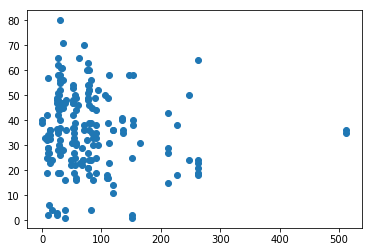

In [27]:
plt.scatter(fares,ages)


In [30]:
age_with_fare = content[(content['Age']>22) & (content['Fare']<400) & (content['Fare']>130)]

In [32]:
sub_arg = age_with_fare['Age'].tolist()
sub_fare = age_with_fare['Fare'].tolist()

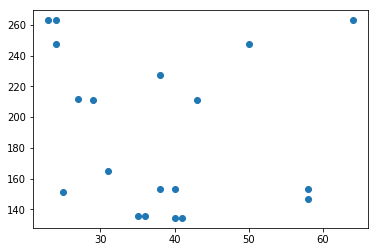

In [34]:
plt.scatter(sub_arg,sub_fare)

In [52]:
import math
import numpy as np
import random

In [60]:
sub_arg = age_with_fare['Age']
sub_fare = age_with_fare['Fare']

In [61]:
def func(age,k,b):
    return k * age + b
def loss(y,y_hat):
    return np.mean(np.abs(y-y_hat))

In [89]:
k_hat = random.randint(-10,10)
b_hat = random.randint(-10,10)
best_k = None
best_b = None

In [86]:
min_error=1e3


k -8,b -2,perf 496.80701052631576,err 496.80701052631576
loop == 0
k -1,b 1,perf 227.07016842105264,err 227.07016842105264
loop == 1
k 6,b -2,perf 83.97544210526316,err 83.97544210526316
loop == 6
k 4,b 2,perf 62.15702105263159,err 62.15702105263159
loop == 17
k 4,b 7,perf 61.36754736842107,err 61.36754736842107
loop == 22
k 4,b 10,perf 61.20965263157896,err 61.20965263157896
loop == 40


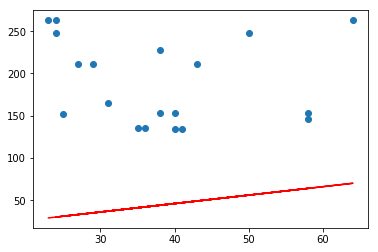

In [107]:
loops=10000
min_error=float('inf')
while loops>0:
    k_hat = random.randint(-10,10)
    b_hat = random.randint(-10,10)
    est = func(sub_arg,k_hat,b_hat)
    performace =  loss(sub_fare, est)    
    if performace < min_error:
        min_error = performace
        best_k = k_hat
        best_b = b_hat
        print('k {},b {},perf {},err {}'.format(best_k,best_b,performace,min_error))
        print('loop == {}'.format(10000 - loops))
        
    
    loops-=1
   
plt.scatter(sub_arg,sub_fare)
plt.plot(sub_arg,est,c='r')

In [105]:
loops=1000
performaces=[]
min_error=float('inf')
while loops>0:
    k_hat = random.random()*20-10
    b_hat = random.random()*20-10
    est = func(sub_arg,k_hat,b_hat)
    performace =  loss(sub_fare, est)  
    
    if performace < min_error:
        
        min_error = performace
        best_k = k_hat
        best_b = b_hat
        print('k {},b {},perf {},err {}'.format(best_k,best_b,performace,min_error))
        print('loop == {}'.format(1000 - loops))
        performaces.append(performace)    
    loops-=1


k -5.829139498030116,b -6.711231950154463,perf 418.7970317698284,err 418.7970317698284
loop == 0
k -0.16360708441661131,b 1.784974825915473,perf 194.41422144343332,err 194.41422144343332
loop == 1
k 7.2060561713066384,b -9.941173802494397,perf 109.51364401535106,err 109.51364401535106
loop == 3
k 5.448323249648286,b -4.165838421032488,perf 73.43139163882734,err 73.43139163882734
loop == 8
k 4.806696776762561,b -6.634796621621206,perf 66.16110985214878,err 66.16110985214878
loop == 12
k 3.968528636226205,b 4.67271851565946,perf 61.78801726809383,err 61.78801726809383
loop == 19
k 4.0592366764064955,b 9.816863735054149,perf 61.51859248420892,err 61.51859248420892
loop == 834


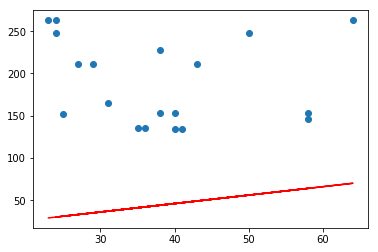

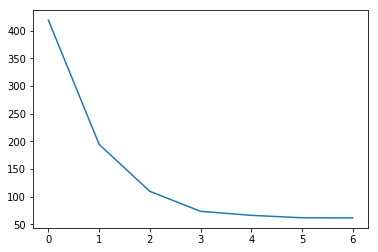

In [108]:
plt.scatter(sub_arg,sub_fare)
plt.plot(sub_arg,est,c='r')
plt.show()
plt.plot(range(len(performaces)),performaces)

In [142]:
loops=1000
performaces=[]
min_error=float('inf')
k_hat = random.random()*20-10
b_hat = random.random()*20-10
direction=[
    (1,1),
    (-1,1),
    (1,-1),
    (-1,-1)
]
    
def step():
    return random.random() 


best_direction = None
while loops>0:
    
    k_delta_direction,b_delta_direction = best_direction or random.choice(direction)
    k_delta = k_delta_direction * step()
    b_delta = b_delta_direction * step()
    new_k = k_hat + k_delta
    new_b = b_hat +b_delta
    est = func(sub_arg,new_k,new_b)
    performace =  loss(sub_fare, est)  
    
    if performace < min_error:
        best_direction = (k_delta_direction,b_delta_direction)
        min_error = performace
        best_k = new_k
        best_b = new_b
        print('k {},b {},perf {},err {}'.format(best_k,best_b,performace,min_error))
        print('loop == {}'.format(1000 - loops))
        performaces.append(performace)   
    else:
        k_delta_direction,b_delta_direction = random.choice(direction)
    
    loops-=1


k 8.210207781068762,b -1.0662296170612326,perf 142.22043913474857,err 142.22043913474857
loop == 0
k 7.535542725934561,b -1.645039372482989,perf 122.17786979979658,err 122.17786979979658
loop == 1
k 7.454543284376798,b -1.75857885242731,perf 119.86120456706571,err 119.86120456706571
loop == 12
k 7.416923023875902,b -1.6356166614949683,perf 118.88694596473852,err 118.88694596473852
loop == 14
k 7.389580695341835,b -1.3102312940453151,perf 118.31549804768372,err 118.31549804768372
loop == 34
k 7.3611418256272145,b -1.2305206569095444,perf 117.57134508974548,err 117.57134508974548
loop == 62
k 7.357841639945181,b -1.1899720234252125,perf 117.50311019123043,err 117.50311019123043
loop == 305
k 7.354890752276323,b -1.5236946170669288,perf 117.22789875864012,err 117.22789875864012
loop == 501
k 7.349641088062266,b -1.4549079815468953,perf 117.1218371947295,err 117.1218371947295
loop == 572


In [166]:
loops=100000
performaces=[]
min_error=float('inf')
k_hat = random.random()*20-10
b_hat = random.random()*20-10

    
def dk(y,y_hat,x):
    abs_value = [1 if (y_i-y_hat_i) >0 else -1 for y_i,y_hat_i in zip(y,y_hat)]
    
    return np.mean([a*-x_i for a,x_i in zip(abs_value,x)])

def db(y,y_hat):
    abs_value = [1 if (y_i-y_hat_i) >0 else -1 for y_i,y_hat_i in zip(y,y_hat)]
    return np.mean([a*-1 for a in abs_value])

learning = 0.1
best_direction = None
while loops>0: 
    k_delta =  -1 * learning * dk(sub_fare,func(sub_arg,k_hat,b_hat),sub_arg)
    b_delta =  -1*learning* db(sub_fare, func(sub_arg,k_hat,b_hat))
    
    k_hat = k_hat + k_delta
    b_hat = b_hat +b_delta  
    
    est = func(sub_arg,k_hat,b_hat)
    performace =  loss(sub_fare, est)      
   
    
    
    
    print('k {},b {},perf {}'.format(k_hat,b_hat,performace))
    print('loop == {}'.format(1000 - loops))
    performaces.append(performace)     
    loops-=1

k -3.5208873858514336,b -4.041577640118543,perf 328.17082329045735
loop == -99000
k 0.2896389299380404,b -3.941577640118543,perf 182.86971525721637
loop == -98999
k 4.100165245727514,b -3.841577640118543,perf 63.06833903484323
loop == -98998
k 4.668586298359093,b -3.815261850644859,perf 65.31489192069043
loop == -98997
k 4.163323140464357,b -3.8099986927501224,perf 62.79931871491532
loop == -98996
k 4.331744193095935,b -3.794209219065912,perf 63.61184482927767
loop == -98995
k 3.8264810352011986,b -3.7889460611711754,perf 65.80559289770986
loop == -98994
k 5.563323140464357,b -3.73105132432907,perf 75.61375282621543
loop == -98993
k 3.752796824674883,b -3.7573671138027542,perf 67.0670887425852
loop == -98992
k 5.489638929938041,b -3.699472376960649,perf 74.28799105336225
loop == -98991
k 3.6791126141485666,b -3.725788166434333,perf 68.32858458746057
loop == -98990
k 5.415954719411724,b -3.667893429592228,perf 73.02959739922785
loop == -98989
k 3.9317441930959345,b -3.683682903276438,pe

k 3.563323140464334,b -0.5573671138027555,perf 68.50531588940002
loop == -98804
k 5.3001652457274915,b -0.4994723769606502,perf 71.81131485075109
loop == -98803
k 3.815954719411702,b -0.5152618506448607,perf 64.22215994987288
loop == -98802
k 5.173849456253807,b -0.4678934295922292,perf 69.94150875656824
loop == -98801
k 3.6896389299380172,b -0.4836829032764397,perf 66.26875079244712
loop == -98800
k 5.426481035201175,b -0.4257881664343344,perf 74.00599659352802
loop == -98799
k 3.615954719411701,b -0.45210395590801866,perf 67.53024663732248
loop == -98798
k 5.35279682467486,b -0.3942092190659134,perf 72.68023482067485
loop == -98797
k 3.5422705088853856,b -0.4205250085395976,perf 68.7917424821978
loop == -98796
k 5.279112614148543,b -0.36263027169749235,perf 71.5204561249893
loop == -98795
k 3.7949020878327535,b -0.37841974538170287,perf 64.44321258145183
loop == -98794
k 5.1527968246748586,b -0.3310513243290713,perf 69.65065003080647
loop == -98793
k 3.668586298359069,b -0.3468407980

k 5.331744193095889,b 2.795264465144612,perf 73.13840656582677
loop == -98611
k 3.521217877306415,b 2.768948675670928,perf 67.3108560556054
loop == -98610
k 5.2580599825695735,b 2.8268434125130333,perf 71.81264479297361
loop == -98609
k 3.4475336667800995,b 2.800527623039349,perf 68.57235190048077
loop == -98608
k 5.184375772043257,b 2.8584223598814544,perf 70.62294919978122
loop == -98607
k 3.7001652457274674,b 2.842632886197244,perf 64.20387740139674
loop == -98606
k 5.0580599825695725,b 2.8900013072498756,perf 68.75314310559837
loop == -98605
k 3.573849456253783,b 2.8742118335656652,perf 66.33578680352787
loop == -98604
k 5.310691561516941,b 2.9321065704077705,perf 72.79325421125613
loop == -98603
k 3.500165245727467,b 2.9057907809340864,perf 67.59728264840322
loop == -98602
k 5.237007350990625,b 2.9636855177761916,perf 71.46749243840293
loop == -98601
k 3.426481035201151,b 2.9373697283025075,perf 68.85877849327854
loop == -98600
k 5.163323140464309,b 2.9952644651446128,perf 70.3320

k 5.1001652457274425,b 6.1426328861972666,perf 69.89164726072266
loop == -98415
k 3.615954719411653,b 6.126843412513056,perf 63.79168903574611
loop == -98414
k 4.973849456253758,b 6.174211833565687,perf 68.02184116653983
loop == -98413
k 3.489638929937968,b 6.1584223598814765,perf 65.89700564009338
loop == -98412
k 5.226481035201126,b 6.216317096723582,perf 72.13286639962132
loop == -98411
k 3.415954719411652,b 6.190001307249898,perf 67.15850148496872
loop == -98410
k 5.152796824674811,b 6.247896044092004,perf 70.80710462676817
loop == -98409
k 3.3422705088853366,b 6.22158025461832,perf 68.4199973298441
loop == -98408
k 5.079112614148494,b 6.279474991460425,perf 69.60078853496087
loop == -98407
k 3.5949020878327045,b 6.2636855177762145,perf 64.01274166732506
loop == -98406
k 4.9527968246748095,b 6.311053938828846,perf 67.73098244077804
loop == -98405
k 3.46858629835902,b 6.295264465144635,perf 66.18343223289119
loop == -98404
k 5.205428403622178,b 6.353159201986741,perf 71.787714045050

k 5.19490208783268,b 9.500527623039359,perf 72.42538717524414
loop == -98219
k 3.3843757720432057,b 9.474211833565674,perf 65.80559289771156
loop == -98218
k 5.121217877306364,b 9.532106570407779,perf 71.09962540239094
loop == -98217
k 3.31069156151689,b 9.505790780934094,perf 67.0670887425869
loop == -98216
k 5.047533666780048,b 9.563685517776198,perf 69.77386362953776
loop == -98215
k 3.2370073509905737,b 9.537369728302513,perf 68.32858458746226
loop == -98214
k 4.973849456253731,b 9.595264465144618,perf 68.56200737152558
loop == -98213
k 3.4896389299379416,b 9.579474991460408,perf 63.916396221811304
loop == -98212
k 5.2264810352010995,b 9.637369728302513,perf 73.0331434079311
loop == -98211
k 3.4159547194116255,b 9.611053938828828,perf 65.17789206668665
loop == -98210
k 5.152796824674784,b 9.668948675670933,perf 71.70738163507792
loop == -98209
k 3.34227050888531,b 9.642632886197248,perf 66.439387911562
loop == -98208
k 5.0791126141484675,b 9.700527623039353,perf 70.38161986222471
l

k 4.9949020878326476,b 12.826843412512957,perf 69.67968080405242
loop == -98023
k 3.1843757720431736,b 12.800527623039272,perf 67.35351533538531
loop == -98022
k 4.921217877306331,b 12.858422359881377,perf 68.35391903119918
loop == -98021
k 3.110691561516857,b 12.832106570407692,perf 68.61501118026067
loop == -98020
k 4.847533666780015,b 12.890001307249797,perf 67.20743673440599
loop == -98019
k 3.363323140464225,b 12.874211833565587,perf 64.2028228146097
loop == -98018
k 5.100165245727383,b 12.932106570407692,perf 71.61319880959253
loop == -98017
k 3.289638929937909,b 12.905790780934007,perf 65.46431865948504
loop == -98016
k 5.026481035201067,b 12.963685517776112,perf 70.28743703673935
loop == -98015
k 3.2159547194115934,b 12.937369728302427,perf 66.72581450436039
loop == -98014
k 4.952796824674751,b 12.995264465144531,perf 68.96167526388616
loop == -98013
k 3.142270508885277,b 12.968948675670847,perf 67.98731034923576
loop == -98012
k 4.8791126141484344,b 13.026843412512951,perf 67.

k 3.1843757720431407,b 15.958422359881292,perf 65.52526048774048
loop == -97836
k 4.921217877306299,b 16.016317096723398,perf 69.1849439619465
loop == -97835
k 3.110691561516825,b 15.990001307249713,perf 66.78675633261584
loop == -97834
k 4.847533666779983,b 16.047896044091818,perf 67.8591821890933
loop == -97833
k 3.0370073509905087,b 16.021580254618133,perf 68.0482521774912
loop == -97832
k 4.773849456253666,b 16.079474991460238,perf 66.61740903357445
loop == -97831
k 3.2896389299378765,b 16.063685517776026,perf 63.63606381184022
loop == -97830
k 5.0264810352010345,b 16.12158025461813,perf 71.11846196748667
loop == -97829
k 3.2159547194115605,b 16.095264465144446,perf 64.89755965671559
loop == -97828
k 4.952796824674719,b 16.15315920198655,perf 69.79270019463347
loop == -97827
k 3.142270508885245,b 16.126843412512866,perf 66.15905550159091
loop == -97826
k 4.8791126141484025,b 16.18473814935497,perf 68.46693842178028
loop == -97825
k 3.0685862983589285,b 16.158422359881286,perf 67.42

k 4.773849456253634,b 19.23736972830222,perf 67.36444534698744
loop == -97645
k 2.9633231404641602,b 19.211053938828535,perf 67.48149317472176
loop == -97644
k 4.700165245727318,b 19.26894867567064,perf 66.03868357413424
loop == -97643
k 2.8896389299378438,b 19.242632886196954,perf 68.74298901959712
loop == -97642
k 4.626481035201001,b 19.30052762303906,perf 64.93873867346312
loop == -97641
k 3.1422705088852116,b 19.284738149354848,perf 64.33080065394616
loop == -97640
k 4.87911261414837,b 19.342632886196952,perf 69.29796335252757
loop == -97639
k 3.0685862983588956,b 19.316317096723267,perf 65.59229649882151
loop == -97638
k 4.805428403622054,b 19.374211833565372,perf 67.97220157967436
loop == -97637
k 2.99490208783258,b 19.347896044091687,perf 66.85379234369684
loop == -97636
k 4.731744193095738,b 19.405790780933792,perf 66.64643980682115
loop == -97635
k 2.9212178773062636,b 19.379474991460107,perf 68.11528818857221
loop == -97634
k 4.658059982569421,b 19.43736972830221,perf 65.4290

k 2.879112614148349,b 21.242632886196876,perf 67.76791976751994
loop == -97524
k 4.615954719411507,b 21.30052762303898,perf 65.09829546016643
loop == -97523
k 3.131744193095717,b 21.28473814935477,perf 63.355731401868994
loop == -97522
k 4.868586298358875,b 21.342632886196874,perf 69.63369742454933
loop == -97521
k 3.058059982569401,b 21.31631709672319,perf 64.61722724674435
loop == -97520
k 4.7949020878325594,b 21.374211833565294,perf 68.30793565169616
loop == -97519
k 2.9843757720430855,b 21.34789604409161,perf 65.87872309161969
loop == -97518
k 4.721217877306243,b 21.405790780933714,perf 66.98217387884297
loop == -97517
k 2.910691561516769,b 21.37947499146003,perf 67.14021893649505
loop == -97516
k 4.6475336667799265,b 21.437369728302134,perf 65.65641210598977
loop == -97515
k 2.8370073509904525,b 21.41105393882845,perf 68.40171478137042
loop == -97514
k 4.57384945625361,b 21.468948675670553,perf 64.49995751002787
loop == -97513
k 3.0896389299378204,b 21.45315920198634,perf 63.98952

k 3.784375772043064,b 24.6952644651442,perf 59.34674787636788
loop == -97314
k 3.2791126141483273,b 24.700527623038937,perf 60.22429471351505
loop == -97313
k 3.8475336667799063,b 24.726843412512622,perf 59.6641993999136
loop == -97312
k 3.3422705088851696,b 24.73210657040736,perf 59.856981694124464
loop == -97311
k 3.9106915615167486,b 24.758422359881045,perf 59.98165092345931
loop == -97310
k 3.405428403622012,b 24.763685517775784,perf 59.564138659514114
loop == -97309
k 3.573849456253591,b 24.779474991459995,perf 59.277989075026596
loop == -97308
k 3.74227050888517,b 24.795264465144207,perf 59.1287423362017
loop == -97307
k 3.2370073509904334,b 24.800527623038946,perf 60.43731410409676
loop == -97306
k 3.8054284036220123,b 24.82684341251263,perf 59.4461938597474
loop == -97305
k 3.3001652457272757,b 24.83210657040737,perf 60.07000108470617
loop == -97304
k 3.8685862983588546,b 24.858422359881054,perf 59.76364538329311
loop == -97303
k 3.363323140464118,b 24.863685517775792,perf 59.7

k 3.7422705088851833,b 27.611053938828665,perf 58.98054289021837
loop == -97106
k 3.2370073509904467,b 27.616317096723403,perf 59.696316874179715
loop == -97105
k 3.8054284036220256,b 27.642632886197088,perf 59.297994413764066
loop == -97104
k 3.300165245727289,b 27.647896044091826,perf 59.32900385478914
loop == -97103
k 3.868586298358868,b 27.67421183356551,perf 59.615445937309794
loop == -97102
k 3.3633231404641313,b 27.67947499146025,perf 59.17466497530353
loop == -97101
k 3.5317441930957103,b 27.69526446514446,perf 58.888515390815975
loop == -97100
k 3.7001652457272893,b 27.711053938828673,perf 58.76253735005216
loop == -97099
k 3.1949020878325527,b 27.71631709672341,perf 59.909336264761436
loop == -97098
k 3.7633231404641316,b 27.742632886197097,perf 59.07998887359787
loop == -97097
k 3.258059982569395,b 27.747896044091835,perf 59.54202324537086
loop == -97096
k 3.826481035200974,b 27.77421183356552,perf 59.397440397143576
loop == -97095
k 3.3212178773062373,b 27.77947499146026,pe

k 3.4475336667799223,b 30.36894867567103,perf 58.608182980843644
loop == -96898
k 3.6159547194115014,b 30.384738149355243,perf 58.32203339635612
loop == -96897
k 3.7843757720430804,b 30.400527623039455,perf 59.04647086805769
loop == -96896
k 3.2791126141483433,b 30.405790780934193,perf 58.88602231602371
loop == -96895
k 3.4475336667799223,b 30.421580254618405,perf 58.59987273153617
loop == -96894
k 3.6159547194115014,b 30.437369728302617,perf 58.31372314704863
loop == -96893
k 3.7843757720430804,b 30.45315920198683,perf 59.043700784955206
loop == -96892
k 3.2791126141483433,b 30.458422359881567,perf 58.87771206671622
loop == -96891
k 3.4475336667799223,b 30.47421183356578,perf 58.591562482228696
loop == -96890
k 3.6159547194115014,b 30.49000130724999,perf 58.305412897741164
loop == -96889
k 3.7843757720430804,b 30.505790780934202,perf 59.04093070185272
loop == -96888
k 3.2791126141483433,b 30.51105393882894,perf 58.86940181740876
loop == -96887
k 3.4475336667799223,b 30.526843412513152

k 3.7422705088851864,b 32.97421183356582,perf 58.69827142207433
loop == -96701
k 3.2370073509904493,b 32.979474991460556,perf 58.550565252311785
loop == -96700
k 3.4054284036220284,b 32.995264465144764,perf 58.26441566782427
loop == -96699
k 3.5738494562536074,b 33.01105393882897,perf 57.97826608333671
loop == -96698
k 3.7422705088851864,b 33.02684341251318,perf 58.69550133897183
loop == -96697
k 3.2370073509904493,b 33.03210657040792,perf 58.54225500300431
loop == -96696
k 3.4054284036220284,b 33.04789604409213,perf 58.25610541851679
loop == -96695
k 3.5738494562536074,b 33.063685517776335,perf 57.969955834029236
loop == -96694
k 3.7422705088851864,b 33.07947499146054,perf 58.692731255869354
loop == -96693
k 3.2370073509904493,b 33.08473814935528,perf 58.53394475369682
loop == -96692
k 3.4054284036220284,b 33.10052762303949,perf 58.24779516920932
loop == -96691
k 3.5738494562536074,b 33.1163170967237,perf 57.96164558472176
loop == -96690
k 3.7422705088851864,b 33.132106570407906,perf 

k 3.3633231404641344,b 35.56894867567082,perf 57.928958604112374
loop == -96504
k 3.5317441930957134,b 35.584738149355026,perf 57.64280901962485
loop == -96503
k 3.7001652457272924,b 35.600527623039234,perf 58.34730189298847
loop == -96502
k 3.1949020878325554,b 35.60579078093397,perf 58.20679793929244
loop == -96501
k 3.3633231404641344,b 35.62158025461818,perf 57.92064835480491
loop == -96500
k 3.5317441930957134,b 35.63736972830239,perf 57.634498770317364
loop == -96499
k 3.7001652457272924,b 35.6531592019866,perf 58.344531809885986
loop == -96498
k 3.1949020878325554,b 35.658422359881335,perf 58.19848768998495
loop == -96497
k 3.3633231404641344,b 35.67421183356554,perf 57.91233810549743
loop == -96496
k 3.5317441930957134,b 35.69000130724975,perf 57.626188521009894
loop == -96495
k 3.7001652457272924,b 35.70579078093396,perf 58.34176172678349
loop == -96494
k 3.1949020878325554,b 35.7110539388287,perf 58.1901774406775
loop == -96493
k 3.3633231404641344,b 35.726843412512906,perf 5

k 3.089638929937819,b 38.09526446514424,perf 57.991008465608274
loop == -96312
k 3.258059982569398,b 38.11105393882845,perf 57.70485888112073
loop == -96311
k 3.426481035200977,b 38.126843412512656,perf 57.41870929663322
loop == -96310
k 3.594902087832556,b 38.142632886196864,perf 57.681650923459394
loop == -96309
k 3.089638929937819,b 38.1478960440916,perf 57.98269821630078
loop == -96308
k 3.258059982569398,b 38.16368551777581,perf 57.69654863181325
loop == -96307
k 3.426481035200977,b 38.17947499146002,perf 57.41039904732571
loop == -96306
k 3.594902087832556,b 38.19526446514423,perf 57.67888084035691
loop == -96305
k 3.089638929937819,b 38.200527623038965,perf 57.97438796699333
loop == -96304
k 3.258059982569398,b 38.216317096723174,perf 57.68823838250578
loop == -96303
k 3.426481035200977,b 38.23210657040738,perf 57.40208879801825
loop == -96302
k 3.594902087832556,b 38.24789604409159,perf 57.676110757254406
loop == -96301
k 3.089638929937819,b 38.25315920198633,perf 57.9660777176

k 3.258059982569398,b 40.63736972830186,perf 57.30596691436178
loop == -96119
k 3.426481035200977,b 40.65315920198607,perf 57.01981732987425
loop == -96118
k 3.594902087832556,b 40.66894867567028,perf 57.54868693453975
loop == -96117
k 3.089638929937819,b 40.67421183356502,perf 57.58380624954183
loop == -96116
k 3.258059982569398,b 40.690001307249226,perf 57.2976566650543
loop == -96115
k 3.426481035200977,b 40.705790780933434,perf 57.01150708056676
loop == -96114
k 3.594902087832556,b 40.72158025461764,perf 57.54591685143725
loop == -96113
k 3.089638929937819,b 40.72684341251238,perf 57.57549600023434
loop == -96112
k 3.258059982569398,b 40.74263288619659,perf 57.28934641574682
loop == -96111
k 3.426481035200977,b 40.7584223598808,perf 57.00319683125928
loop == -96110
k 3.594902087832556,b 40.774211833565005,perf 57.54314676833476
loop == -96109
k 3.089638929937819,b 40.77947499145974,perf 57.567185750926875
loop == -96108
k 3.258059982569398,b 40.79526446514395,perf 57.28103616643935

loop == -96009
k 3.089638929937819,b 42.09526446514381,perf 57.359429518239914
loop == -96008
k 3.258059982569398,b 42.11105393882802,perf 57.07327993375238
loop == -96007
k 3.426481035200977,b 42.12684341251223,perf 56.78713034926486
loop == -96006
k 3.594902087832556,b 42.14263288619644,perf 57.47112460766995
loop == -96005
k 3.089638929937819,b 42.147896044091176,perf 57.351119268932436
loop == -96004
k 3.258059982569398,b 42.163685517775384,perf 57.0649696844449
loop == -96003
k 3.426481035200977,b 42.17947499145959,perf 56.778820099957365
loop == -96002
k 3.594902087832556,b 42.1952644651438,perf 57.46835452456746
loop == -96001
k 3.089638929937819,b 42.20052762303854,perf 57.34280901962496
loop == -96000
k 3.258059982569398,b 42.21631709672275,perf 57.05665943513742
loop == -95999
k 3.426481035200977,b 42.232106570406955,perf 56.77050985064989
loop == -95998
k 3.594902087832556,b 42.24789604409116,perf 57.465584441464955
loop == -95997
k 3.089638929937819,b 42.2531592019859,perf 

k 3.2580599825693985,b 44.6900013072488,perf 56.66607771768594
loop == -95811
k 3.4264810352009776,b 44.70579078093301,perf 56.4852520314927
loop == -95810
k 2.9212178773062405,b 44.711053938827746,perf 57.23006663735354
loop == -95809
k 3.0896389299378195,b 44.726843412511954,perf 56.943917052866006
loop == -95808
k 3.2580599825693985,b 44.74263288619616,perf 56.657767468378466
loop == -95807
k 3.4264810352009776,b 44.75842235988037,perf 56.48248194839018
loop == -95806
k 2.9212178773062405,b 44.76368551777511,perf 57.221756388046046
loop == -95805
k 3.0896389299378195,b 44.77947499145932,perf 56.93560680355853
loop == -95804
k 3.2580599825693985,b 44.795264465143525,perf 56.649457219070975
loop == -95803
k 3.4264810352009776,b 44.81105393882773,perf 56.47971186528768
loop == -95802
k 2.9212178773062405,b 44.81631709672247,perf 57.21344613873858
loop == -95801
k 3.0896389299378195,b 44.83210657040668,perf 56.92729655425105
loop == -95800
k 3.2580599825693985,b 44.84789604409089,perf 5

k 2.9212178773062405,b 47.44789604409061,perf 56.79793367336466
loop == -95601
k 3.0896389299378195,b 47.46368551777482,perf 56.51178408887713
loop == -95600
k 3.2580599825693985,b 47.47947499145903,perf 56.22563450438959
loop == -95599
k 3.4264810352009776,b 47.49526446514324,perf 56.33843762706056
loop == -95598
k 2.9212178773062405,b 47.500527623037975,perf 56.78962342405717
loop == -95597
k 3.0896389299378195,b 47.51631709672218,perf 56.503473839569644
loop == -95596
k 3.2580599825693985,b 47.53210657040639,perf 56.217324255082126
loop == -95595
k 3.4264810352009776,b 47.5478960440906,perf 56.33566754395807
loop == -95594
k 2.9212178773062405,b 47.55315920198534,perf 56.781313174749705
loop == -95593
k 3.0896389299378195,b 47.568948675669546,perf 56.49516359026218
loop == -95592
k 3.2580599825693985,b 47.584738149353754,perf 56.209014005774634
loop == -95591
k 3.4264810352009776,b 47.60052762303796,perf 56.33289746085558
loop == -95590
k 2.9212178773062405,b 47.6057907809327,perf 5

k 3.0896389299378195,b 50.147896044090324,perf 56.08796137419572
loop == -95396
k 3.2580599825693985,b 50.16368551777453,perf 55.80181178970819
loop == -95395
k 3.4264810352009776,b 50.17947499145874,perf 56.19716338883343
loop == -95394
k 2.9212178773062405,b 50.18473814935348,perf 56.36580070937578
loop == -95393
k 3.0896389299378195,b 50.20052762303769,perf 56.07965112488826
loop == -95392
k 3.2580599825693985,b 50.216317096721895,perf 55.79350154040073
loop == -95391
k 3.4264810352009776,b 50.2321065704061,perf 56.194393305730934
loop == -95390
k 2.9212178773062405,b 50.23736972830084,perf 56.35749046006831
loop == -95389
k 3.0896389299378195,b 50.25315920198505,perf 56.07134087558078
loop == -95388
k 3.2580599825693985,b 50.26894867566926,perf 55.785191291093234
loop == -95387
k 3.4264810352009776,b 50.284738149353466,perf 56.191623222628444
loop == -95386
k 2.9212178773062405,b 50.290001307248204,perf 56.34918021076083
loop == -95385
k 3.0896389299378195,b 50.30579078093241,perf 

k 3.2580599825693985,b 52.479474991458495,perf 55.43616082017915
loop == -95219
k 3.4264810352009776,b 52.495264465142704,perf 56.07527973232375
loop == -95218
k 2.9212178773062405,b 52.50052762303744,perf 56.00014973984674
loop == -95217
k 3.0896389299378195,b 52.51631709672165,perf 55.7140001553592
loop == -95216
k 3.2580599825693985,b 52.53210657040586,perf 55.42785057087167
loop == -95215
k 3.4264810352009776,b 52.547896044090066,perf 56.07250964922125
loop == -95214
k 2.9212178773062405,b 52.553159201984805,perf 55.99183949053926
loop == -95213
k 3.0896389299378195,b 52.56894867566901,perf 55.705689906051724
loop == -95212
k 3.2580599825693985,b 52.58473814935322,perf 55.41954032156421
loop == -95211
k 3.4264810352009776,b 52.60052762303743,perf 56.06973956611876
loop == -95210
k 2.9212178773062405,b 52.60579078093217,perf 55.983529241231786
loop == -95209
k 3.0896389299378195,b 52.621580254616376,perf 55.69737965674426
loop == -95208
k 3.2580599825693985,b 52.637369728300584,perf

k 3.258059982569399,b 55.00579078093191,perf 55.092177239248976
loop == -95027
k 2.752796824674662,b 55.01105393882665,perf 55.887407357575306
loop == -95026
k 2.921217877306241,b 55.02684341251086,perf 55.601257773087774
loop == -95025
k 3.08963892993782,b 55.042632886195065,perf 55.31510818860024
loop == -95024
k 3.258059982569399,b 55.05842235987927,perf 55.089407156146464
loop == -95023
k 2.752796824674662,b 55.06368551777401,perf 55.87909710826784
loop == -95022
k 2.921217877306241,b 55.07947499145822,perf 55.592947523780296
loop == -95021
k 3.08963892993782,b 55.09526446514243,perf 55.30679793929275
loop == -95020
k 3.258059982569399,b 55.111053938826636,perf 55.08663707304401
loop == -95019
k 2.752796824674662,b 55.116317096721374,perf 55.87078685896035
loop == -95018
k 2.921217877306241,b 55.13210657040558,perf 55.58463727447283
loop == -95017
k 3.08963892993782,b 55.14789604408979,perf 55.29848768998528
loop == -95016
k 3.258059982569399,b 55.163685517774,perf 55.0838669899415

k 2.752796824674662,b 57.4847381493527,perf 55.49682564012383
loop == -94838
k 2.921217877306241,b 57.50052762303691,perf 55.2106760556363
loop == -94837
k 3.08963892993782,b 57.51631709672112,perf 54.92452647114877
loop == -94836
k 3.258059982569399,b 57.532106570405325,perf 54.959213250329306
loop == -94835
k 2.752796824674662,b 57.537369728300064,perf 55.48851539081634
loop == -94834
k 2.921217877306241,b 57.55315920198427,perf 55.20236580632882
loop == -94833
k 3.08963892993782,b 57.56894867566848,perf 54.91621622184128
loop == -94832
k 3.258059982569399,b 57.58473814935269,perf 54.956443167226816
loop == -94831
k 2.752796824674662,b 57.59000130724743,perf 55.480205141508875
loop == -94830
k 2.921217877306241,b 57.605790780931635,perf 55.19405555702134
loop == -94829
k 3.08963892993782,b 57.62158025461584,perf 54.907905972533804
loop == -94828
k 3.258059982569399,b 57.63736972830005,perf 54.953673084124325
loop == -94827
k 2.752796824674662,b 57.64263288619479,perf 55.4718948922014

k 3.08963892993782,b 59.83210657040508,perf 54.55887550161972
loop == -94660
k 3.258059982569399,b 59.84789604408929,perf 54.83732959381964
loop == -94659
k 2.752796824674662,b 59.85315920198403,perf 55.1228644212873
loop == -94658
k 2.921217877306241,b 59.868948675668236,perf 54.83671483679978
loop == -94657
k 3.08963892993782,b 59.884738149352444,perf 54.55056525231224
loop == -94656
k 3.258059982569399,b 59.90052762303665,perf 54.83455951071715
loop == -94655
k 2.752796824674662,b 59.90579078093139,perf 55.11455417197982
loop == -94654
k 2.921217877306241,b 59.9215802546156,perf 54.82840458749229
loop == -94653
k 3.08963892993782,b 59.93736972829981,perf 54.542255003004755
loop == -94652
k 3.258059982569399,b 59.953159201984015,perf 54.831789427614645
loop == -94651
k 2.752796824674662,b 59.95842235987875,perf 55.10624392267234
loop == -94650
k 2.921217877306241,b 59.97421183356296,perf 54.82009433818481
loop == -94649
k 3.08963892993782,b 59.99000130724717,perf 54.53394475369726
lo

loop == -94551
k 2.752796824674662,b 61.27421183356282,perf 54.89848768998538
loop == -94550
k 2.921217877306241,b 61.29000130724703,perf 54.61233810549786
loop == -94549
k 3.08963892993782,b 61.30579078093124,perf 54.32618852101032
loop == -94548
k 3.258059982569399,b 61.32158025461545,perf 54.75976726694984
loop == -94547
k 2.752796824674662,b 61.326843412510186,perf 54.8901774406779
loop == -94546
k 2.921217877306241,b 61.342632886194394,perf 54.604027856190385
loop == -94545
k 3.08963892993782,b 61.3584223598786,perf 54.31787827170283
loop == -94544
k 3.258059982569399,b 61.37421183356281,perf 54.756997183847346
loop == -94543
k 2.752796824674662,b 61.37947499145755,perf 54.881867191370425
loop == -94542
k 2.921217877306241,b 61.39526446514176,perf 54.59571760688291
loop == -94541
k 3.08963892993782,b 61.411053938825965,perf 54.30956802239537
loop == -94540
k 3.258059982569399,b 61.42684341251017,perf 54.754227100744856
loop == -94539
k 2.752796824674662,b 61.43210657040491,perf 54

k 3.08963892993782,b 63.674211833562566,perf 53.95222730217378
loop == -94368
k 3.258059982569399,b 63.690001307246774,perf 54.635113527337666
loop == -94367
k 2.752796824674662,b 63.69526446514151,perf 54.51621622184138
loop == -94366
k 2.921217877306241,b 63.71105393882572,perf 54.23006663735385
loop == -94365
k 3.08963892993782,b 63.72684341250993,perf 53.94391705286631
loop == -94364
k 3.258059982569399,b 63.74263288619414,perf 54.632343444235175
loop == -94363
k 2.752796824674662,b 63.747896044088876,perf 54.507905972533905
loop == -94362
k 2.921217877306241,b 63.763685517773084,perf 54.22175638804637
loop == -94361
k 3.08963892993782,b 63.77947499145729,perf 53.935606803558834
loop == -94360
k 3.258059982569399,b 63.7952644651415,perf 54.62957336113268
loop == -94359
k 2.752796824674662,b 63.80052762303624,perf 54.499595723226406
loop == -94358
k 2.921217877306241,b 63.81631709672045,perf 54.213446138738895
loop == -94357
k 3.08963892993782,b 63.832106570404655,perf 53.9272965542

k 2.6054284036220317,b 66.03736972829887,perf 54.39460957364202
loop == -94187
k 2.7738494562536107,b 66.05315920198308,perf 54.1084599891545
loop == -94186
k 2.9422705088851897,b 66.06894867566729,perf 53.82231040466696
loop == -94185
k 3.1106915615167687,b 66.0847381493515,perf 53.764476408224134
loop == -94184
k 2.6054284036220317,b 66.09000130724623,perf 54.386299324334544
loop == -94183
k 2.7738494562536107,b 66.10579078093043,perf 54.100149739847005
loop == -94182
k 2.9422705088851897,b 66.12158025461464,perf 53.81400015535948
loop == -94181
k 3.1106915615167687,b 66.13736972829885,perf 53.761706325121615
loop == -94180
k 2.6054284036220317,b 66.14263288619358,perf 54.37798907502707
loop == -94179
k 2.7738494562536107,b 66.15842235987779,perf 54.09183949053953
loop == -94178
k 2.9422705088851897,b 66.174211833562,perf 53.805689906052
loop == -94177
k 3.1106915615167687,b 66.1900013072462,perf 53.758936242019146
loop == -94176
k 2.6054284036220317,b 66.19526446514094,perf 54.36967

k 2.637007350990454,b 68.6268434125088,perf 53.93255971214627
loop == -93989
k 2.805428403622033,b 68.64263288619301,perf 53.64641012765873
loop == -93988
k 2.973849456253612,b 68.65842235987722,perf 53.36026054317121
loop == -93987
k 3.142270508885191,b 68.67421183356143,perf 53.91594485460114
loop == -93986
k 2.3106915615167702,b 68.6689486756667,perf 54.47549600023491
loop == -93985
k 2.4791126141483493,b 68.6847381493509,perf 54.18934641574737
loop == -93984
k 2.6475336667799283,b 68.70052762303511,perf 53.90319683125984
loop == -93983
k 2.8159547194115073,b 68.71631709671932,perf 53.6170472467723
loop == -93982
k 2.9843757720430864,b 68.73210657040353,perf 53.33089766228478
loop == -93981
k 3.1527968246746654,b 68.74789604408774,perf 54.00735759698341
loop == -93980
k 2.3212178773062444,b 68.74263288619301,perf 54.446133119348495
loop == -93979
k 2.4896389299378234,b 68.75842235987722,perf 54.159983534860956
loop == -93978
k 2.6580599825694025,b 68.77421183356142,perf 53.873833950

k 3.0896389299378284,b 71.10052762303465,perf 53.60597255543219
loop == -93797
k 2.2580599825694074,b 71.09526446513992,perf 54.18103616643997
loop == -93796
k 2.4264810352009865,b 71.11105393882413,perf 53.894886581952434
loop == -93795
k 2.5949020878325655,b 71.12684341250834,perf 53.608736997464895
loop == -93794
k 2.7633231404641445,b 71.14263288619254,perf 53.32258741297735
loop == -93793
k 2.9317441930957235,b 71.15842235987675,perf 53.03643782848983
loop == -93792
k 3.1001652457273026,b 71.17421183356096,perf 53.69738529781446
loop == -93791
k 2.2685862983588816,b 71.16894867566623,perf 54.15167328555355
loop == -93790
k 2.4370073509904606,b 71.18473814935044,perf 53.86552370106601
loop == -93789
k 2.6054284036220396,b 71.20052762303465,perf 53.579374116578464
loop == -93788
k 2.7738494562536187,b 71.21631709671885,perf 53.29322453209093
loop == -93787
k 2.9422705088851977,b 71.23210657040306,perf 53.00707494760339
loop == -93786
k 3.1106915615167767,b 71.24789604408727,perf 53.

k 2.552796824674684,b 73.57947499145541,perf 53.2923935071602
loop == -93596
k 2.721217877306263,b 73.59526446513962,perf 53.006243922672674
loop == -93595
k 2.889638929937842,b 73.61105393882383,perf 52.72009433818514
loop == -93594
k 3.058059982569421,b 73.62684341250804,perf 53.47633266623561
loop == -93593
k 2.226481035201,b 73.6215802546133,perf 53.835329795248846
loop == -93592
k 2.394902087832579,b 73.63736972829751,perf 53.549180210761314
loop == -93591
k 2.563323140464158,b 73.65315920198172,perf 53.26303062627378
loop == -93590
k 2.731744193095737,b 73.66894867566593,perf 52.97688104178624
loop == -93589
k 2.900165245727316,b 73.68473814935014,perf 52.69073145729871
loop == -93588
k 3.068586298358895,b 73.70052762303435,perf 53.567745408617874
loop == -93587
k 2.237007350990474,b 73.69526446513962,perf 53.80596691436242
loop == -93586
k 2.4054284036220532,b 73.71105393882382,perf 53.5198173298749
loop == -93585
k 2.5738494562536323,b 73.72684341250803,perf 53.23366774538736
l

k 2.6159547194115405,b 75.88473814934993,perf 52.8220333963569
loop == -93406
k 2.7843757720431195,b 75.90052762303414,perf 52.53588381186937
loop == -93405
k 2.9527968246746985,b 75.91631709671834,perf 52.72148502080636
loop == -93404
k 2.1212178773062775,b 75.91105393882361,perf 53.651119268933066
loop == -93403
k 2.2896389299378566,b 75.92684341250782,perf 53.36496968444553
loop == -93402
k 2.4580599825694356,b 75.94263288619203,perf 53.07882009995801
loop == -93401
k 2.6264810352010146,b 75.95842235987624,perf 52.79267051547047
loop == -93400
k 2.7949020878325936,b 75.97421183356045,perf 52.50652093098293
loop == -93399
k 2.9633231404641727,b 75.99000130724465,perf 52.812897763188644
loop == -93398
k 2.1317441930957517,b 75.98473814934992,perf 53.62175638804665
loop == -93397
k 2.3001652457273307,b 76.00052762303413,perf 53.33560680355912
loop == -93396
k 2.4685862983589097,b 76.01631709671834,perf 53.04945721907158
loop == -93395
k 2.6370073509904888,b 76.03210657040255,perf 52.76

k 2.594902087832607,b 78.19000130724443,perf 52.493501540401226
loop == -93214
k 2.763323140464186,b 78.20579078092864,perf 52.2073519559137
loop == -93213
k 2.931744193095765,b 78.22158025461285,perf 52.667745408618096
loop == -93212
k 2.100165245727344,b 78.21631709671811,perf 53.322587412977406
loop == -93211
k 2.268586298358923,b 78.23210657040232,perf 53.036437828489866
loop == -93210
k 2.437007350990502,b 78.24789604408653,perf 52.750288244002334
loop == -93209
k 2.605428403622081,b 78.26368551777074,perf 52.46413865951481
loop == -93208
k 2.77384945625366,b 78.27947499145495,perf 52.17798907502727
loop == -93207
k 2.942270508885239,b 78.29526446513916,perf 52.79095048650249
loop == -93206
k 1.8475336667799758,b 78.27947499145495,perf 54.39688135290421
loop == -93205
k 2.8370073509905023,b 78.31631709671811,perf 52.212837022789316
loop == -93204
k 2.679112614148397,b 78.32158025461284,perf 52.33089766228489
loop == -93203
k 2.847533666779976,b 78.33736972829705,perf 52.2283494881

k 2.7738494562536706,b 81.41631709671735,perf 51.94995613636278
loop == -92919
k 2.6159547194115653,b 81.42158025461208,perf 51.94779516921019
loop == -92918
k 2.7843757720431443,b 81.43736972829629,perf 51.96546860173673
loop == -92917
k 2.626481035201039,b 81.44263288619102,perf 51.92674253763124
loop == -92916
k 2.794902087832618,b 81.45842235987523,perf 51.98098106711071
loop == -92915
k 2.6370073509905128,b 81.46368551776996,perf 51.905689906052295
loop == -92914
k 2.805428403622092,b 81.47947499145417,perf 52.00335512006428
loop == -92913
k 2.3843757720431444,b 81.47421183355944,perf 52.32951262073374
loop == -92912
k 2.5527968246747235,b 81.49000130724365,perf 52.04336303624619
loop == -92911
k 2.7212178773063025,b 81.50579078092785,perf 51.86214450201375
loop == -92910
k 2.563323140464197,b 81.51105393882258,perf 52.02231040466725
loop == -92909
k 2.731744193095776,b 81.52684341250679,perf 51.87765696738771
loop == -92908
k 2.573849456253671,b 81.53210657040152,perf 52.00125777

k 2.542270508885254,b 83.41631709671671,perf 51.75693644344851
loop == -92723
k 2.710691561516833,b 83.43210657040092,perf 51.74413896184758
loop == -92722
k 2.552796824674728,b 83.43736972829565,perf 51.73588381186958
loop == -92721
k 2.721217877306307,b 83.45315920197986,perf 51.759651427221534
loop == -92720
k 2.5633231404642016,b 83.45842235987459,perf 51.714831180290616
loop == -92719
k 2.7317441930957806,b 83.4742118335588,perf 51.79809196216954
loop == -92718
k 2.3106915615168333,b 83.46894867566407,perf 52.138653894972045
loop == -92717
k 2.4791126141484123,b 83.48473814934827,perf 51.852504310484534
loop == -92716
k 2.6475336667799914,b 83.50052762303248,perf 51.6408148621246
loop == -92715
k 2.489638929937886,b 83.50579078092721,perf 51.83145167890557
loop == -92714
k 2.658059982569465,b 83.52158025461142,perf 51.65632732749856
loop == -92713
k 2.5001652457273598,b 83.52684341250615,perf 51.810399047326634
loop == -92712
k 2.668586298358939,b 83.54263288619036,perf 51.6718397

k 2.637007350990522,b 85.42684341250555,perf 51.52280932195844
loop == -92527
k 2.4791126141484168,b 85.43210657040028,perf 51.545025086107884
loop == -92526
k 2.647533666779996,b 85.44789604408449,perf 51.54739944139391
loop == -92525
k 2.2264810352010485,b 85.44263288618976,perf 51.96884780078933
loop == -92524
k 2.3949020878326275,b 85.45842235987396,perf 51.68269821630178
loop == -92523
k 2.5633231404642065,b 85.47421183355817,perf 51.403972756861464
loop == -92522
k 2.405428403622101,b 85.4794749914529,perf 51.66164558472285
loop == -92521
k 2.5738494562536802,b 85.49526446513711,perf 51.41948522223544
loop == -92520
k 2.415954719411575,b 85.50052762303184,perf 51.6405929531439
loop == -92519
k 2.584375772043154,b 85.51631709671605,perf 51.4349976876094
loop == -92518
k 2.4264810352010486,b 85.52158025461078,perf 51.61954032156497
loop == -92517
k 2.5949020878326277,b 85.53736972829499,perf 51.45051015298335
loop == -92516
k 2.4370073509905223,b 85.54263288618972,perf 51.598487689

k 2.2370073509905297,b 87.38473814934726,perf 51.64447106948744
loop == -92331
k 2.4054284036221087,b 87.40052762303146,perf 51.3583214849999
loop == -92330
k 2.5738494562536878,b 87.41631709671567,perf 51.34075124194792
loop == -92329
k 2.1527968246747404,b 87.41105393882094,perf 51.78214419968134
loop == -92328
k 2.3212178773063195,b 87.42684341250515,perf 51.49599461519381
loop == -92327
k 2.4896389299378985,b 87.44263288618936,perf 51.20984503070627
loop == -92326
k 2.6580599825694775,b 87.45842235987357,perf 51.69753794554904
loop == -92325
k 2.23700735099053,b 87.45315920197883,perf 51.633667745387704
loop == -92324
k 2.405428403622109,b 87.46894867566304,perf 51.34751816090019
loop == -92323
k 2.573849456253688,b 87.48473814934725,perf 51.34435234998118
loop == -92322
k 2.152796824674741,b 87.47947499145252,perf 51.771340875581636
loop == -92321
k 2.32121787730632,b 87.49526446513673,perf 51.48519129109409
loop == -92320
k 2.489638929937899,b 87.51105393882094,perf 51.1990417066

k 2.5843757720431726,b 89.40052762303131,perf 51.48950470455185
loop == -92128
k 2.1633231404642252,b 89.39526446513658,perf 51.45111926893343
loop == -92127
k 2.3317441930958043,b 89.41105393882079,perf 51.1649696844459
loop == -92126
k 2.5001652457273833,b 89.426843412505,perf 51.13631910898399
loop == -92125
k 2.079112614148436,b 89.42158025461026,perf 51.588792399127335
loop == -92124
k 2.247533666780015,b 89.43736972829447,perf 51.302642814639796
loop == -92123
k 2.415954719411594,b 89.45315920197868,perf 51.016493230152264
loop == -92122
k 2.584375772043173,b 89.46894867566289,perf 51.4931058125851
loop == -92121
k 2.1633231404642257,b 89.46368551776816,perf 51.4403159448337
loop == -92120
k 2.3317441930958047,b 89.47947499145236,perf 51.15416636034617
loop == -92119
k 2.5001652457273837,b 89.49526446513657,perf 51.13992021701723
loop == -92118
k 2.0791126141484364,b 89.49000130724184,perf 51.57798907502761
loop == -92117
k 2.2475336667800154,b 89.50579078092605,perf 51.291839490

k 2.2580599825695,b 91.29526446513648,perf 50.99156248222982
loop == -91934
k 2.426481035201079,b 91.31105393882069,perf 50.92523877657405
loop == -91933
k 2.0054284036221315,b 91.30579078092596,perf 51.41538519691126
loop == -91932
k 2.1738494562537105,b 91.32158025461017,perf 51.12923561242372
loop == -91931
k 2.3422705088852895,b 91.33736972829438,perf 50.843086027936195
loop == -91930
k 2.5106915615168686,b 91.35315920197858,perf 51.282025480175164
loop == -91929
k 2.089638929937921,b 91.34789604408385,perf 51.26690874261763
loop == -91928
k 2.2580599825695002,b 91.36368551776806,perf 50.980759158130105
loop == -91927
k 2.4264810352010793,b 91.37947499145227,perf 50.9288398846073
loop == -91926
k 2.005428403622132,b 91.37421183355754,perf 51.404581872811534
loop == -91925
k 2.173849456253711,b 91.39000130724175,perf 51.118432288323994
loop == -91924
k 2.34227050888529,b 91.40579078092595,perf 50.832282703836476
loop == -91923
k 2.510691561516869,b 91.42158025461016,perf 51.28562658

k 2.2054284036221428,b 93.09526446513644,perf 50.795994615193806
loop == -91750
k 2.373849456253722,b 93.11105393882065,perf 50.79836897047992
loop == -91749
k 1.9527968246747744,b 93.10579078092591,perf 51.21981732987524
loop == -91748
k 2.1212178773063535,b 93.12158025461012,perf 50.93366774538771
loop == -91747
k 2.2896389299379325,b 93.13736972829433,perf 50.64751816090016
loop == -91746
k 2.4580599825695115,b 93.15315920197854,perf 51.15515567408103
loop == -91745
k 2.037007350990564,b 93.14789604408381,perf 51.071340875581605
loop == -91744
k 2.205428403622143,b 93.16368551776802,perf 50.78519129109407
loop == -91743
k 2.3738494562537222,b 93.17947499145222,perf 50.80197007851316
loop == -91742
k 1.952796824674775,b 93.1742118335575,perf 51.20901400577552
loop == -91741
k 2.121217877306354,b 93.1900013072417,perf 50.922864421287976
loop == -91740
k 2.289638929937933,b 93.20579078092591,perf 50.636714836800444
loop == -91739
k 2.458059982569512,b 93.22158025461012,perf 51.15875678

k 1.8896389299379388,b 94.13210657039957,perf 51.16413865951513
loop == -91643
k 2.058059982569518,b 94.14789604408378,perf 50.877989075027585
loop == -91642
k 2.226481035201097,b 94.16368551776799,perf 50.59183949054005
loop == -91641
k 2.394902087832676,b 94.1794749914522,perf 50.94324431674032
loop == -91640
k 1.9738494562537285,b 94.17421183355746,perf 51.015662205221496
loop == -91639
k 2.1422705088853076,b 94.19000130724167,perf 50.729512620733956
loop == -91638
k 2.3106915615168866,b 94.20579078092588,perf 50.59005872117246
loop == -91637
k 1.8896389299379392,b 94.20052762303115,perf 51.1533353354154
loop == -91636
k 2.0580599825695183,b 94.21631709671536,perf 50.86718575092787
loop == -91635
k 2.2264810352010973,b 94.23210657039957,perf 50.58103616644033
loop == -91634
k 2.3949020878326763,b 94.24789604408377,perf 50.94684542477357
loop == -91633
k 1.973849456253729,b 94.24263288618904,perf 51.00485888112178
loop == -91632
k 2.142270508885308,b 94.25842235987325,perf 50.7187092

k 2.058059982569529,b 95.85842235987323,perf 50.607905972534496
loop == -91467
k 2.226481035201108,b 95.87421183355744,perf 50.32474838013031
loop == -91466
k 2.0685862983590027,b 95.87947499145217,perf 50.58685334095554
loop == -91465
k 2.2370073509905817,b 95.89526446513638,perf 50.36872908128332
loop == -91464
k 1.8159547194116343,b 95.89000130724165,perf 51.010676055636985
loop == -91463
k 1.9843757720432134,b 95.90579078092586,perf 50.72452647114946
loop == -91462
k 2.1527968246747924,b 95.92158025461006,perf 50.43837688666192
loop == -91461
k 2.3212178773063714,b 95.93736972829427,perf 50.72551578488442
loop == -91460
k 1.900165245727424,b 95.93210657039954,perf 50.862199601343356
loop == -91459
k 2.068586298359003,b 95.94789604408375,perf 50.57605001685583
loop == -91458
k 2.237007350990582,b 95.96368551776796,perf 50.37233018931655
loop == -91457
k 1.8159547194116348,b 95.95842235987323,perf 50.99987273153726
loop == -91456
k 1.9843757720432138,b 95.97421183355743,perf 50.71372

k 1.9843757720432253,b 97.75315920197846,perf 50.43283672045692
loop == -91273
k 2.1527968246748044,b 97.76894867566267,perf 50.150778640446525
loop == -91272
k 2.0580599825695414,b 97.7742118335574,perf 50.305412897742244
loop == -91271
k 2.2264810352011204,b 97.79000130724161,perf 50.42413074333324
loop == -91270
k 1.805428403622173,b 97.78473814934688,perf 50.729235612423665
loop == -91269
k 1.973849456253752,b 97.80052762303109,perf 50.44308602793615
loop == -91268
k 2.142270508885331,b 97.8163170967153,perf 50.15693644344861
loop == -91267
k 2.31069156151691,b 97.8321065703995,perf 50.780917446934325
loop == -91266
k 1.8896389299379628,b 97.82684341250477,perf 50.58075915813004
loop == -91265
k 2.058059982569542,b 97.84263288618898,perf 50.294609573642504
loop == -91264
k 2.226481035201121,b 97.85842235987319,perf 50.42773185136647
loop == -91263
k 1.8054284036221735,b 97.85315920197846,perf 50.71843228832395
loop == -91262
k 1.9738494562537525,b 97.86894867566266,perf 50.43228270

k 1.9843757720432376,b 99.61105393882049,perf 50.13948491990289
loop == -91082
k 2.1527968246748164,b 99.6268434125047,perf 50.21055733613106
loop == -91081
k 1.731744193095869,b 99.62158025460997,perf 50.56330763458433
loop == -91080
k 1.900165245727448,b 99.63736972829417,perf 50.277158050096794
loop == -91079
k 2.068586298359027,b 99.65315920197838,perf 49.99100846560926
loop == -91078
k 2.237007350990606,b 99.66894867566259,perf 50.56734403973216
loop == -91077
k 1.8159547194116588,b 99.66368551776786,perf 50.41483118029071
loop == -91076
k 1.9843757720432378,b 99.67947499145207,perf 50.12868159580317
loop == -91075
k 2.152796824674817,b 99.69526446513628,perf 50.2141584441643
loop == -91074
k 1.7317441930958695,b 99.69000130724154,perf 50.55250431048461
loop == -91073
k 1.9001652457274485,b 99.70579078092575,perf 50.26635472599708
loop == -91072
k 2.0685862983590275,b 99.72158025460996,perf 49.98020514150955
loop == -91071
k 2.2370073509906065,b 99.73736972829417,perf 50.570945147

k 1.910691561516932,b 101.58473814934673,perf 49.951950293864094
loop == -90879
k 2.079112614148511,b 101.60052762303094,perf 50.00418614499535
loop == -90878
k 1.6580599825695637,b 101.59526446513621,perf 50.37577300854555
loop == -90877
k 1.8264810352011427,b 101.61105393882042,perf 50.089623424058004
loop == -90876
k 1.9949020878327217,b 101.62684341250463,perf 49.80347383957047
loop == -90875
k 2.1633231404643007,b 101.64263288618884,perf 50.36097284859646
loop == -90874
k 1.7422705088853534,b 101.6373697282941,perf 50.227296554251915
loop == -90873
k 1.9106915615169324,b 101.65315920197831,perf 49.94114696976438
loop == -90872
k 2.0791126141485115,b 101.66894867566252,perf 50.0077872530286
loop == -90871
k 1.658059982569564,b 101.66368551776779,perf 50.364969684445825
loop == -90870
k 1.8264810352011431,b 101.679474991452,perf 50.078820099958286
loop == -90869
k 1.9949020878327222,b 101.6952644651362,perf 49.794545953465956
loop == -90868
k 1.900165245727459,b 101.70052762303094,p

k 1.5738494562537844,b 103.5478960440835,perf 50.209291014085714
loop == -90676
k 1.7422705088853634,b 103.56368551776771,perf 49.92314142959817
loop == -90675
k 1.9106915615169424,b 103.57947499145192,perf 49.636991845110636
loop == -90674
k 2.079112614148521,b 103.59526446513613,perf 50.10917229457988
loop == -90673
k 1.6580599825695739,b 103.5900013072414,perf 50.060814559792085
loop == -90672
k 1.826481035201153,b 103.6057907809256,perf 49.77466497530455
loop == -90671
k 1.994902087832732,b 103.62158025460981,perf 49.75598669901203
loop == -90670
k 1.5738494562537846,b 103.61631709671508,perf 50.198487689985974
loop == -90669
k 1.7422705088853636,b 103.63210657039929,perf 49.91233810549845
loop == -90668
k 1.9106915615169426,b 103.6478960440835,perf 49.62618852101091
loop == -90667
k 2.0791126141485217,b 103.6636855177677,perf 50.112773402613136
loop == -90666
k 1.6580599825695743,b 103.65842235987297,perf 50.05001123569235
loop == -90665
k 1.8264810352011533,b 103.67421183355718,p

k 1.584375772043268,b 105.49526446513606,perf 49.884083257853014
loop == -90476
k 1.752796824674847,b 105.51105393882027,perf 49.59793367336547
loop == -90475
k 1.9212178773064261,b 105.52684341250448,perf 49.546014399843074
loop == -90474
k 1.5001652457274788,b 105.52158025460974,perf 50.02175638804692
loop == -90473
k 1.6685862983590578,b 105.53736972829395,perf 49.73560680355939
loop == -90472
k 1.8370073509906368,b 105.55315920197816,perf 49.44945721907185
loop == -90471
k 2.005428403622216,b 105.56894867566237,perf 49.9028011034442
loop == -90470
k 1.5843757720432685,b 105.56368551776764,perf 49.8732799337533
loop == -90469
k 1.7527968246748475,b 105.57947499145185,perf 49.58713034926576
loop == -90468
k 1.9212178773064266,b 105.59526446513605,perf 49.549615507876325
loop == -90467
k 1.5001652457274792,b 105.59000130724132,perf 50.010953063947206
loop == -90466
k 1.6685862983590583,b 105.60579078092553,perf 49.72480347945966
loop == -90465
k 1.8370073509906373,b 105.62158025460974

k 1.4580599825695928,b 107.38473814934638,perf 49.798487689986
loop == -90279
k 1.6264810352011718,b 107.40052762303058,perf 49.51233810549848
loop == -90278
k 1.7949020878327508,b 107.41631709671479,perf 49.30396423601447
loop == -90277
k 1.7001652457274876,b 107.42158025460952,perf 49.38491428278378
loop == -90276
k 1.8685862983590666,b 107.43736972829373,perf 49.42496176826416
loop == -90275
k 1.4475336667801193,b 107.432106570399,perf 49.80873699746522
loop == -90274
k 1.6159547194116983,b 107.44789604408321,perf 49.522587412977686
loop == -90273
k 1.7843757720432774,b 107.46368551776742,perf 49.29149886205324
loop == -90272
k 1.6896389299380141,b 107.46894867566215,perf 49.395163590263
loop == -90271
k 1.8580599825695931,b 107.48473814934636,perf 49.38313351341652
loop == -90270
k 1.4370073509906458,b 107.47947499145162,perf 49.81898630494445
loop == -90269
k 1.6054284036222248,b 107.49526446513583,perf 49.53283672045691
loop == -90268
k 1.7738494562538039,b 107.51105393882004,per

loop == -90161
k 1.6896389299380181,b 108.52684341250408,perf 49.228127579182704
loop == -90160
k 1.8580599825695971,b 108.54263288618829,perf 49.43881218377663
loop == -90159
k 1.4370073509906498,b 108.53736972829356,perf 49.65195029386414
loop == -90158
k 1.6054284036222288,b 108.55315920197776,perf 49.36580070937661
loop == -90157
k 1.7738494562538079,b 108.56894867566197,perf 49.22335481773193
loop == -90156
k 1.6791126141485446,b 108.5742118335567,perf 49.238376886661925
loop == -90155
k 1.8475336667801237,b 108.59000130724091,perf 49.396983928929
loop == -90154
k 1.4264810352011763,b 108.58473814934618,perf 49.66219960134335
loop == -90153
k 1.5949020878327553,b 108.60052762303039,perf 49.37605001685582
loop == -90152
k 1.7633231404643344,b 108.6163170967146,perf 49.21088944377072
loop == -90151
k 1.6685862983590711,b 108.62158025460933,perf 49.248626194141146
loop == -90150
k 1.8370073509906502,b 108.63736972829354,perf 49.355155674081345
loop == -90149
k 1.4159547194117028,b 10

k 1.5422705088853932,b 110.5426328861879,perf 49.15804447668967
loop == -89947
k 1.7106915615169722,b 110.55842235987211,perf 49.058811881443866
loop == -89946
k 1.615954719411709,b 110.56368551776684,perf 49.030620653974985
loop == -89945
k 1.784375772043288,b 110.57947499145105,perf 49.23576509236391
loop == -89944
k 1.3633231404643407,b 110.57421183355632,perf 49.45444336865644
loop == -89943
k 1.5317441930959197,b 110.59000130724053,perf 49.1682937841689
loop == -89942
k 1.7001652457274987,b 110.60579078092474,perf 49.046346507482646
loop == -89941
k 1.6054284036222355,b 110.61105393881947,perf 49.04086996145421
loop == -89940
k 1.7738494562538145,b 110.62684341250367,perf 49.193936837516254
loop == -89939
k 1.3527968246748672,b 110.62158025460894,perf 49.464692676135655
loop == -89938
k 1.5212178773064462,b 110.63736972829315,perf 49.17854309164813
loop == -89937
k 1.6896389299380252,b 110.65315920197736,perf 49.033881133521426
loop == -89936
k 1.594902087832762,b 110.658422359872

k 1.2896389299380302,b 112.55315920197692,perf 49.266077717686976
loop == -89733
k 1.4580599825696092,b 112.56894867566113,perf 48.97992813319944
loop == -89732
k 1.6264810352011883,b 112.58473814934534,perf 48.87238528864611
loop == -89731
k 1.531744193095925,b 112.59000130724007,perf 48.85250431048475
loop == -89730
k 1.700165245727504,b 112.60579078092428,perf 48.98784265469077
loop == -89729
k 1.2791126141485567,b 112.60052762302955,perf 49.27632702516619
loop == -89728
k 1.4475336667801357,b 112.61631709671376,perf 48.990177440678664
loop == -89727
k 1.6159547194117148,b 112.63210657039797,perf 48.85991991468489
loop == -89726
k 1.5212178773064515,b 112.6373697282927,perf 48.86275361796398
loop == -89725
k 1.6896389299380306,b 112.6531592019769,perf 48.94601439984313
loop == -89724
k 1.2685862983590832,b 112.64789604408217,perf 49.28657633264542
loop == -89723
k 1.4370073509906622,b 112.66368551776638,perf 49.000426748157885
loop == -89722
k 1.6054284036222413,b 112.67947499145059

k 1.4475336667801402,b 114.47947499145015,perf 48.69599461519395
loop == -89529
k 1.6159547194117192,b 114.49526446513435,perf 48.761858972856665
loop == -89528
k 1.521217877306456,b 114.50052762302909,perf 48.671831272025635
loop == -89527
k 1.4264810352011927,b 114.50579078092382,perf 48.72729655425213
loop == -89526
k 1.5949020878327718,b 114.52158025460803,perf 48.74052933296746
loop == -89525
k 1.5001652457275085,b 114.52684341250276,perf 48.65050163213643
loop == -89524
k 1.4054284036222453,b 114.53210657039749,perf 48.75859849331031
loop == -89523
k 1.5738494562538243,b 114.5478960440817,perf 48.71919969307827
loop == -89522
k 1.479112614148561,b 114.55315920197643,perf 48.63117467059561
loop == -89521
k 1.6475336667801401,b 114.56894867566064,perf 48.86956010621431
loop == -89520
k 1.2264810352011928,b 114.5636855177659,perf 49.054997385277055
loop == -89519
k 1.3949020878327718,b 114.57947499145011,perf 48.768847800789544
loop == -89518
k 1.5633231404643508,b 114.5952644651343

k 1.3949020878327731,b 116.11105393881803,perf 48.527019545941954
loop == -89353
k 1.5633231404643522,b 116.12684341250224,perf 48.62612490083454
loop == -89352
k 1.468586298359089,b 116.13210657039697,perf 48.53609720000352
loop == -89351
k 1.3738494562538257,b 116.1373697282917,perf 48.558321485000135
loop == -89350
k 1.5422705088854047,b 116.15315920197591,perf 48.60479526094532
loop == -89349
k 1.4475336667801415,b 116.15842235987064,perf 48.51476756011431
loop == -89348
k 1.3527968246748783,b 116.16368551776537,perf 48.58962342405831
loop == -89347
k 1.5212178773064573,b 116.17947499144958,perf 48.58346562105614
loop == -89346
k 1.426481035201194,b 116.18473814934431,perf 48.493437920225105
loop == -89345
k 1.3317441930959308,b 116.19000130723904,perf 48.62092536311648
loop == -89344
k 1.5001652457275099,b 116.20579078092325,perf 48.56213598116695
loop == -89343
k 1.4054284036222466,b 116.21105393881798,perf 48.4935015404018
loop == -89342
k 1.5738494562538257,b 116.22684341250219

k 1.4685862983590876,b 117.84263288618573,perf 48.44606949917251
loop == -89164
k 1.3738494562538244,b 117.84789604408046,perf 48.356041798341494
loop == -89163
k 1.2791126141485611,b 117.85315920197519,perf 48.44696414428003
loop == -89162
k 1.4475336667801402,b 117.8689486756594,perf 48.424739859283314
loop == -89161
k 1.352796824674877,b 117.87421183355413,perf 48.334712158452305
loop == -89160
k 1.2580599825696137,b 117.87947499144886,perf 48.4782660833382
loop == -89159
k 1.4264810352011927,b 117.89526446513307,perf 48.40341021939413
loop == -89158
k 1.3317441930959295,b 117.9005276230278,perf 48.350842260623516
loop == -89157
k 1.5001652457275085,b 117.916317096712,perf 48.47210828033596
loop == -89156
k 1.4054284036222453,b 117.92158025460674,perf 48.38208057950493
loop == -89155
k 1.310691561516982,b 117.92684341250147,perf 48.382144199681704
loop == -89154
k 1.479112614148561,b 117.94263288618568,perf 48.45077864044676
loop == -89153
k 1.3843757720432979,b 117.94789604408041,p

k 1.3212178773064525,b 119.61105393881644,perf 48.213382518563144
loop == -88968
k 1.2264810352011892,b 119.61631709671117,perf 48.2572134517594
loop == -88967
k 1.3949020878327683,b 119.63210657039538,perf 48.282080579504985
loop == -88966
k 1.300165245727505,b 119.63736972829011,perf 48.192052878673955
loop == -88965
k 1.2054284036222418,b 119.64263288618484,perf 48.28851539081757
loop == -88964
k 1.3738494562538208,b 119.65842235986905,perf 48.26075093961579
loop == -88963
k 1.2791126141485576,b 119.66368551776378,perf 48.17072323878475
loop == -88962
k 1.1843757720432944,b 119.66894867565851,perf 48.31981732987574
loop == -88961
k 1.3527968246748734,b 119.68473814934272,perf 48.23942129972659
loop == -88960
k 1.2580599825696102,b 119.69000130723745,perf 48.19239350716106
loop == -88959
k 1.4264810352011892,b 119.70579078092166,perf 48.308119360668414
loop == -88958
k 1.331744193095926,b 119.71105393881639,perf 48.218091659837384
loop == -88957
k 1.2370073509906627,b 119.71631709671

k 1.3422705088853963,b 121.39526446513136,perf 48.13942129972663
loop == -88771
k 1.247533666780133,b 121.4005276230261,perf 48.049393598895605
loop == -88770
k 1.1527968246748699,b 121.40579078092082,perf 48.09876469829693
loop == -88769
k 1.321217877306449,b 121.42158025460503,perf 48.118091659837425
loop == -88768
k 1.2264810352011857,b 121.42684341249976,perf 48.0280639590064
loop == -88767
k 1.1317441930959224,b 121.4321065703945,perf 48.13006663735511
loop == -88766
k 1.3001652457275015,b 121.4478960440787,perf 48.096762019948216
loop == -88765
k 1.2054284036222382,b 121.45315920197343,perf 48.00673431911721
loop == -88764
k 1.110691561516975,b 121.45842235986817,perf 48.16136857641328
loop == -88763
k 1.279112614148554,b 121.47421183355237,perf 48.07543238005902
loop == -88762
k 1.1843757720432908,b 121.4794749914471,perf 48.0339447536986
loop == -88761
k 1.3527968246748698,b 121.49526446513131,perf 48.144130441000854
loop == -88760
k 1.2580599825696066,b 121.50052762302604,perf

k 1.3317441930959206,b 122.42684341249928,perf 48.075155371748814
loop == -88657
k 1.2370073509906574,b 122.43210657039401,perf 47.98512767091778
loop == -88656
k 1.1422705088853942,b 122.43736972828874,perf 47.95361234372636
loop == -88655
k 1.3106915615169732,b 122.45315920197295,perf 48.05382573185961
loop == -88654
k 1.21595471941171,b 122.45842235986768,perf 47.963798031028574
loop == -88653
k 1.1212178773064467,b 122.46368551776241,perf 47.98491428278455
loop == -88652
k 1.2896389299380258,b 122.47947499144662,perf 48.03249609197041
loop == -88651
k 1.1949020878327625,b 122.48473814934135,perf 47.94246839113939
loop == -88650
k 1.1001652457274993,b 122.49000130723608,perf 48.01621622184273
loop == -88649
k 1.2685862983590783,b 122.5057907809203,perf 48.01116645208123
loop == -88648
k 1.173849456253815,b 122.51105393881502,perf 47.9211387512502
loop == -88647
k 1.0791126141485519,b 122.51631709670976,perf 48.04751816090089
loop == -88646
k 1.247533666780131,b 122.53210657039396,pe

k 1.1738494562538115,b 124.32158025460362,perf 47.82584789252448
loop == -88447
k 1.0791126141485483,b 124.32684341249835,perf 47.76164558472375
loop == -88446
k 1.2475336667801273,b 124.34263288618256,perf 47.89454595346631
loop == -88445
k 1.152796824674864,b 124.34789604407729,perf 47.804518252635276
loop == -88444
k 1.0580599825696009,b 124.35315920197202,perf 47.79294752378195
loop == -88443
k 1.22648103520118,b 124.36894867565623,perf 47.873216313577096
loop == -88442
k 1.1317441930959167,b 124.37421183355096,perf 47.78318861274608
loop == -88441
k 1.0370073509906534,b 124.37947499144569,perf 47.8242494628401
loop == -88440
k 1.2054284036222325,b 124.3952644651299,perf 47.851886673687915
loop == -88439
k 1.1106915615169692,b 124.40052762302463,perf 47.761858972856885
loop == -88438
k 1.015954719411706,b 124.40579078091936,perf 47.85555140189829
loop == -88437
k 1.184375772043285,b 124.42158025460357,perf 47.830557033798726
loop == -88436
k 1.0896389299380218,b 124.4268434124983,p

k 1.0159547194117025,b 126.21631709670795,perf 47.57654041330015
loop == -88237
k 0.9212178773064393,b 126.22158025460269,perf 47.728404587494
loop == -88236
k 1.0896389299380183,b 126.2373697282869,perf 47.64523847424197
loop == -88235
k 0.9949020878327551,b 126.24263288618162,perf 47.60098076477932
loop == -88234
k 1.163323140464334,b 126.25842235986583,perf 47.7139365351838
loop == -88233
k 1.0685862983590708,b 126.26368551776056,perf 47.62390883435277
loop == -88232
k 0.9738494562538077,b 126.2689486756553,perf 47.63228270383749
loop == -88231
k 1.1422705088853866,b 126.2847381493395,perf 47.6926068952946
loop == -88230
k 1.0475336667801234,b 126.29000130723423,perf 47.60257919446358
loop == -88229
k 0.9527968246748603,b 126.29526446512897,perf 47.663584642895664
loop == -88228
k 1.1212178773064392,b 126.31105393881317,perf 47.6712772554054
loop == -88227
k 1.026481035201176,b 126.3163170967079,perf 47.5812495545744
loop == -88226
k 0.9317441930959128,b 126.32158025460264,perf 47.6

k 0.8475336667801241,b 128.01105393881238,perf 47.56995583403152
loop == -88038
k 1.0159547194117031,b 128.0268434124966,perf 47.481249554574426
loop == -88037
k 0.92121787730644,b 128.03210657039133,perf 47.44253201131685
loop == -88036
k 1.089638929938019,b 128.04789604407554,perf 47.54994761551626
loop == -88035
k 0.9949020878327558,b 128.0531592019703,perf 47.45991991468523
loop == -88034
k 0.9001652457274927,b 128.05842235986503,perf 47.47383395037502
loop == -88033
k 1.0685862983590717,b 128.07421183354924,perf 47.52861797562705
loop == -88032
k 0.9738494562538086,b 128.079474991444,perf 47.438590274796034
loop == -88031
k 0.8791126141485455,b 128.08473814933873,perf 47.505135889433184
loop == -88030
k 1.0475336667801245,b 128.10052762302294,perf 47.50728833573786
loop == -88029
k 0.9527968246748614,b 128.1057907809177,perf 47.41726063490683
loop == -88028
k 0.8580599825695983,b 128.11105393881243,perf 47.53643782849135
loop == -88027
k 1.0264810352011773,b 128.12684341249664,per

k 0.8685862983590787,b 129.7952644651291,perf 47.2527813187959
loop == -87841
k 1.0370073509906577,b 129.8110539388133,perf 47.40728833573783
loop == -87840
k 0.9422705088853945,b 129.81631709670805,perf 47.31726063490681
loop == -87839
k 0.8475336667801314,b 129.8215802546028,perf 47.284083257854086
loop == -87838
k 1.0159547194117104,b 129.837369728287,perf 47.38595869584863
loop == -87837
k 0.9212178773064473,b 129.84263288618175,perf 47.295930995017585
loop == -87836
k 0.8264810352011842,b 129.8478960440765,perf 47.31538519691225
loop == -87835
k 0.9949020878327631,b 129.8636855177607,perf 47.364629055959426
loop == -87834
k 0.9001652457275,b 129.86894867565545,perf 47.27460135512839
loop == -87833
k 0.8054284036222369,b 129.8742118335502,perf 47.34668713597041
loop == -87832
k 0.9738494562538158,b 129.8900013072344,perf 47.34329941607024
loop == -87831
k 0.8791126141485527,b 129.89526446512915,perf 47.2532717152392
loop == -87830
k 0.7843757720432896,b 129.9005276230239,perf 47.37

k 0.7422705088853977,b 131.5373697282879,perf 47.19045444898967
loop == -87648
k 0.9106915615169766,b 131.5531592019721,perf 47.195930995017555
loop == -87647
k 0.8159547194117135,b 131.55842235986685,perf 47.10590329418653
loop == -87646
k 0.7212178773064504,b 131.5636855177616,perf 47.221756388047844
loop == -87645
k 0.8896389299380293,b 131.5794749914458,perf 47.17460135512836
loop == -87644
k 0.7949020878327662,b 131.58473814934055,perf 47.09433256533315
loop == -87643
k 0.9633231404643451,b 131.60052762302476,perf 47.24329941607018
loop == -87642
k 0.868586298359082,b 131.6057907809195,perf 47.15327171523917
loop == -87641
k 0.7738494562538188,b 131.61105393881425,perf 47.125634504391314
loop == -87640
k 0.9422705088853978,b 131.62684341249846,perf 47.22196977618099
loop == -87639
k 0.8475336667801346,b 131.6321065703932,perf 47.13194207534997
loop == -87638
k 0.7527968246748715,b 131.63736972828795,perf 47.15693644344949
loop == -87637
k 0.9212178773064504,b 131.65315920197216,pe

k 0.9001652457275054,b 133.26368551776247,perf 47.095930995017504
loop == -87458
k 0.8054284036222423,b 133.2689486756572,perf 47.00590329418649
loop == -87457
k 0.7106915615169792,b 133.27421183355196,perf 46.969401817410564
loop == -87456
k 0.8791126141485581,b 133.29000130723617,perf 47.074601355128316
loop == -87455
k 0.784375772043295,b 133.2952644651309,perf 46.984573654297286
loop == -87454
k 0.6896389299380319,b 133.30052762302566,perf 47.000703756468745
loop == -87453
k 0.8580599825696108,b 133.31631709670987,perf 47.053271715239106
loop == -87452
k 0.7633231404643477,b 133.3215802546046,perf 46.96324401440809
loop == -87451
k 0.6685862983590846,b 133.32684341249936,perf 47.03200569552692
loop == -87450
k 0.8370073509906635,b 133.34263288618357,perf 47.03194207534991
loop == -87449
k 0.7422705088854004,b 133.3478960440783,perf 46.94191437451889
loop == -87448
k 0.6475336667801372,b 133.35315920197306,perf 47.06330763458509
loop == -87447
k 0.8159547194117162,b 133.368948675657

k 0.7738494562538238,b 135.00579078092127,perf 46.884573654297235
loop == -87265
k 0.6791126141485607,b 135.01105393881602,perf 46.79454595346622
loop == -87264
k 0.5843757720432976,b 135.01631709671076,perf 46.907074947604336
loop == -87263
k 0.7527968246748765,b 135.03210657039497,perf 46.863244014408046
loop == -87262
k 0.6580599825696134,b 135.03736972828972,perf 46.779651124889654
loop == -87261
k 0.8264810352011923,b 135.05315920197393,perf 46.93194207534988
loop == -87260
k 0.7317441930959292,b 135.05842235986867,perf 46.84191437451885
loop == -87259
k 0.6370073509906661,b 135.06368551776342,perf 46.810953063947814
loop == -87258
k 0.805428403622245,b 135.07947499144763,perf 46.91061243546067
loop == -87257
k 0.7106915615169819,b 135.08473814934237,perf 46.82058473462964
loop == -87256
k 0.6159547194117188,b 135.09000130723712,perf 46.84225500300599
loop == -87255
k 0.7843757720432977,b 135.10579078092132,perf 46.889282795571475
loop == -87254
k 0.6896389299380346,b 135.11105393

k 0.7317441930959305,b 135.96368551776388,perf 46.79426894515595
loop == -87159
k 0.6370073509906674,b 135.96894867565862,perf 46.70424124432492
loop == -87158
k 0.5422705088854043,b 135.97421183355337,perf 46.82674253763195
loop == -87157
k 0.7106915615169832,b 135.99000130723758,perf 46.772939305266746
loop == -87156
k 0.6159547194117201,b 135.99526446513232,perf 46.69931871491726
loop == -87155
k 0.784375772043299,b 136.01105393881653,perf 46.841637366208566
loop == -87154
k 0.6896389299380359,b 136.01631709671128,perf 46.75160966537754
loop == -87153
k 0.5949020878327728,b 136.02158025460602,perf 46.73062065397544
loop == -87152
k 0.7633231404643517,b 136.03736972829023,perf 46.82030772631937
loop == -87151
k 0.6685862983590886,b 136.04263288618498,perf 46.73028002548834
loop == -87150
k 0.5738494562538254,b 136.04789604407972,perf 46.7619225930336
loop == -87149
k 0.7422705088854044,b 136.06368551776393,perf 46.798978086430175
loop == -87148
k 0.6475336667801412,b 136.068948675658

k 0.5422705088854066,b 137.55842235986998,perf 46.576604033476684
loop == -86982
k 0.7106915615169855,b 137.5742118335542,perf 46.689559803881664
loop == -86981
k 0.6159547194117224,b 137.57947499144893,perf 46.59953210305064
loop == -86980
k 0.5212178773064593,b 137.58473814934368,perf 46.60790597253486
loop == -86979
k 0.6896389299380382,b 137.6005276230279,perf 46.66823016399246
loop == -86978
k 0.5949020878327751,b 137.60579078092263,perf 46.57820246316144
loop == -86977
k 0.500165245727512,b 137.61105393881738,perf 46.639207911593026
loop == -86976
k 0.6685862983590909,b 137.6268434125016,perf 46.64690052410326
loop == -86975
k 0.5738494562538278,b 137.63210657039633,perf 46.556872823272236
loop == -86974
k 0.4791126141485646,b 137.63736972829108,perf 46.6705098506512
loop == -86973
k 0.6475336667801436,b 137.65315920197528,perf 46.625570884214085
loop == -86972
k 0.5527968246748804,b 137.65842235987003,perf 46.54308602793652
loop == -86971
k 0.7212178773064594,b 137.6742118335542

k 0.6370073509906723,b 139.36368551776565,perf 46.525570884214034
loop == -86783
k 0.5422705088854092,b 139.3689486756604,perf 46.43554318338299
loop == -86782
k 0.447533666780146,b 139.37421183355514,perf 46.44945721907211
loop == -86781
k 0.615954719411725,b 139.39000130723934,perf 46.50424124432483
loop == -86780
k 0.5212178773064619,b 139.3952644651341,perf 46.41421354349381
loop == -86779
k 0.4264810352011987,b 139.40052762302884,perf 46.480759158130276
loop == -86778
k 0.5949020878327776,b 139.41631709671304,perf 46.482911604435635
loop == -86777
k 0.5001652457275145,b 139.4215802546078,perf 46.39288390360461
loop == -86776
k 0.40542840362225135,b 139.42684341250254,perf 46.512061097188436
loop == -86775
k 0.5738494562538303,b 139.44263288618674,perf 46.46158196454644
loop == -86774
k 0.47911261414856715,b 139.4478960440815,perf 46.384637274473754
loop == -86773
k 0.6475336667801461,b 139.4636855177657,perf 46.53028002548826
loop == -86772
k 0.552796824674883,b 139.46894867566044

k 0.3527968246748818,b 141.1900013072403,perf 46.322310404667526
loop == -86580
k 0.5212178773064607,b 141.2057907809245,perf 46.31892268476799
loop == -86579
k 0.42648103520119757,b 141.21105393881925,perf 46.22889498393696
loop == -86578
k 0.3317441930959344,b 141.216317096714,perf 46.35361234372569
loop == -86577
k 0.5001652457275133,b 141.2321065703982,perf 46.297593044878795
loop == -86576
k 0.40542840362225013,b 141.23736972829295,perf 46.22618852101101
loop == -86575
k 0.5738494562538291,b 141.25315920197716,perf 46.36629110582062
loop == -86574
k 0.47911261414856593,b 141.2584223598719,perf 46.2762634049896
loop == -86573
k 0.38437577204330275,b 141.26368551776665,perf 46.25749046006919
loop == -86572
k 0.5527968246748817,b 141.27947499145085,perf 46.344961465931426
loop == -86571
k 0.4580599825696185,b 141.2847381493456,perf 46.25493376510039
loop == -86570
k 0.3633231404643553,b 141.29000130724035,perf 46.28879239912735
loop == -86569
k 0.5317441930959342,b 141.30579078092455

k 0.3949020878327743,b 142.93736972829356,perf 46.10811936066823
loop == -86382
k 0.30016524572751113,b 142.9426328861883,perf 46.13422176200813
loop == -86381
k 0.46858629835909005,b 142.95842235987251,perf 46.17681742161005
loop == -86380
k 0.3738494562538269,b 142.96368551776726,perf 46.08678972077904
loop == -86379
k 0.2791126141485637,b 142.968948675662,perf 46.16552370106631
loop == -86378
k 0.4475336667801426,b 142.9847381493462,perf 46.15548778172086
loop == -86377
k 0.35279682467487944,b 142.99000130724096,perf 46.06546008088984
loop == -86376
k 0.25805998256961626,b 142.9952644651357,perf 46.28164589584012
loop == -86375
k 1.2475336667801427,b 143.03210657039887,perf 48.683410521726856
loop == -86374
k 0.8264810352011953,b 143.02684341250412,perf 46.91028032782105
loop == -86373
k 0.40542840362224797,b 143.02158025460938,perf 46.113659526873214
loop == -86372
k 0.3106915615169848,b 143.02684341250412,perf 46.10319683126022
loop == -86371
k 0.47911261414856376,b 143.0426328861

k 0.1843757720432997,b 144.63736972829403,perf 46.40574561883166
loop == -86183
k 1.173849456253826,b 144.6742118335572,perf 48.459587807045445
loop == -86182
k 0.7527968246748786,b 144.66894867566245,perf 46.6864576131396
loop == -86181
k 0.3317441930959313,b 144.6636855177677,perf 45.957426839892584
loop == -86180
k 0.2370073509906681,b 144.66894867566245,perf 45.96801677585849
loop == -86179
k 0.4054284036222471,b 144.68473814934666,perf 46.026124900834425
loop == -86178
k 0.3106915615169839,b 144.6900013072414,perf 45.93609720000338
loop == -86177
k 0.21595471941172073,b 144.69526446513615,perf 46.07195060498125
loop == -86176
k 1.2054284036222471,b 144.7321065703993,perf 48.595598887377854
loop == -86175
k 0.7843757720432998,b 144.72684341250456,perf 46.822468693472025
loop == -86174
k 0.36332314046435243,b 144.72158025460982,perf 45.984296645986774
loop == -86173
k 0.26858629835908926,b 144.72684341250456,perf 45.90568990605239
loop == -86172
k 0.43700735099066823,b 144.742632886

k 0.3212178773064589,b 146.2163170967152,perf 45.865737089200074
loop == -85987
k 0.22648103520119572,b 146.22158025460993,perf 45.77570938836902
loop == -85986
k 0.13174419309593255,b 146.22684341250468,perf 46.34092567423327
loop == -85985
k 1.121217877306459,b 146.26368551776784,perf 48.32163766854128
loop == -85984
k 0.7001652457275116,b 146.2584223598731,perf 46.54850747463547
loop == -85983
k 0.27911261414856425,b 146.25315920197835,perf 45.82390883435241
loop == -85982
k 0.18437577204330108,b 146.2584223598731,perf 45.8265107799978
loop == -85981
k 0.75279682467488,b 146.28473814934677,perf 46.771499164386164
loop == -85980
k 0.3317441930959326,b 146.27947499145202,perf 45.872385288646036
loop == -85979
k 0.23700735099066944,b 146.28473814934677,perf 45.78235758781502
loop == -85978
k 0.14227050888540627,b 146.2900013072415,perf 46.213501851518586
loop == -85977
k 1.1317441930959327,b 146.32684341250467,perf 48.36928309790417
loop == -85976
k 0.7106915615169853,b 146.32158025460

k 0.28963892993804025,b 147.70052762303112,perf 45.7577038482028
loop == -85793
k 0.19490208783277707,b 147.70579078092587,perf 45.66767614737179
loop == -85792
k 0.10016524572751391,b 147.7110539388206,perf 46.10657664376227
loop == -85791
k 1.0896389299380402,b 147.74789604408377,perf 48.26679002311195
loop == -85790
k 0.6685862983590929,b 147.74263288618903,perf 46.49365982920612
loop == -85789
k 0.24753366678014554,b 147.73736972829428,perf 45.715875593355186
loop == -85788
k 0.15279682467488237,b 147.74263288618903,perf 45.62584789252415
loop == -85787
k 0.05805998256961921,b 147.74789604408377,perf 46.7566895211622
loop == -85786
k 1.6580599825696194,b 147.7952644651364,perf 51.47888160536663
loop == -85785
k 0.7843757720433036,b 147.7794749914522,perf 46.98313351341666
loop == -85784
k 0.3633231404643562,b 147.77421183355744,perf 45.82363182604215
loop == -85783
k 0.26858629835909303,b 147.7794749914522,perf 45.73360412521114
loop == -85782
k 0.17384945625382986,b 147.7847381493

k 0.36332314046435776,b 148.62158025461028,perf 45.779033488092004
loop == -85664
k 0.2685862983590946,b 148.62684341250502,perf 45.68900578726099
loop == -85663
k 0.1738494562538314,b 148.63210657039977,perf 45.598978086429966
loop == -85662
k 0.07911261414856825,b 148.63736972829452,perf 45.99851777600971
loop == -85661
k 1.6791126141485684,b 148.68473814934714,perf 51.80325833666861
loop == -85660
k 0.8054284036222525,b 148.66894867566293,perf 47.118590577128586
loop == -85659
k 0.3843757720433052,b 148.6636855177682,perf 45.79676201994797
loop == -85658
k 0.289638929938042,b 148.66894867566293,perf 45.70673431911694
loop == -85657
k 0.19490208783277885,b 148.67421183355768,perf 45.61670661828591
loop == -85656
k 0.10016524572751569,b 148.67947499145242,perf 45.74978994016106
loop == -85655
k 1.089638929938042,b 148.71631709671558,perf 48.31775955219784
loop == -85654
k 0.6685862983590947,b 148.71105393882084,perf 46.54462935829203
loop == -85653
k 0.24753366678014732,b 148.70579078

k 0.1949020878327813,b 150.11631709671596,perf 45.54080634127758
loop == -85454
k 0.10016524572751813,b 150.1215802546107,perf 45.45077864044656
loop == -85453
k 0.005428403622254968,b 150.12684341250545,perf 46.47192497822555
loop == -85452
k 1.605428403622255,b 150.17421183355808,perf 51.39467107905099
loop == -85451
k 0.7317441930959392,b 150.15842235987387,perf 46.88673462144994
loop == -85450
k 0.31069156151699184,b 150.15315920197912,perf 45.64856257396456
loop == -85449
k 0.21595471941172867,b 150.15842235987387,perf 45.55853487313353
loop == -85448
k 0.12121787730646551,b 150.1636855177686,perf 45.46850717230251
loop == -85447
k 0.026481035201202346,b 150.16894867566336,perf 46.11513827462445
loop == -85446
k 1.6264810352012025,b 150.21631709671598,perf 51.58525279650251
loop == -85445
k 0.7527968246748866,b 150.20052762303177,perf 46.9775933472117
loop == -85444
k 0.3317441930959393,b 150.19526446513703,perf 45.66629110582052
loop == -85443
k 0.2370073509906761,b 150.200527623

k 0.30016524572752123,b 151.4426328861898,perf 45.5707232387845
loop == -85252
k 0.20542840362225806,b 151.44789604408456,perf 45.48069553795349
loop == -85251
k 0.1106915615169949,b 151.4531592019793,perf 45.39066783712245
loop == -85250
k 0.015954719411731738,b 151.45842235987405,perf 45.705102355279045
loop == -85249
k 1.3527968246748898,b 151.4952644651372,perf 49.572053181006765
loop == -85248
k 0.9317441930959425,b 151.49000130724247,perf 47.798922987100944
loop == -85247
k 0.5106915615169951,b 151.48473814934772,perf 46.025792793195116
loop == -85246
k 0.08963892993804778,b 151.47947499145297,perf 45.36933819723327
loop == -85245
k -0.0050979121672153765,b 151.48473814934772,perf 45.997132734458106
loop == -85244
k 1.5949020878327846,b 151.53210657040034,perf 51.51710875218122
loop == -85243
k 0.7212178773064688,b 151.51631709671614,perf 46.91388143585441
loop == -85242
k 0.30016524572752146,b 151.5110539388214,perf 45.56712213075128
loop == -85241
k 0.20542840362225828,b 151.51

k 0.1633231404643674,b 152.66368551776873,perf 45.376817421610006
loop == -85054
k 0.06858629835910425,b 152.66894867566347,perf 45.28678972077896
loop == -85053
k -0.02615054374615891,b 152.67421183355822,perf 45.82006080403247
loop == -85052
k 1.3106915615169992,b 152.71105393882138,perf 49.45875678211481
loop == -85051
k 0.8896389299380518,b 152.70579078092663,perf 47.68562658820899
loop == -85050
k 0.4685862983591045,b 152.7005276230319,perf 45.91249639430316
loop == -85049
k 0.047533666780157136,b 152.69526446513714,perf 45.26546008088978
loop == -85048
k -0.047203175325106025,b 152.7005276230319,perf 46.094916667976065
loop == -85047
k 1.552796824674894,b 152.7478960440845,perf 51.34120847517295
loop == -85046
k 0.6791126141485782,b 152.7321065704003,perf 46.800585036962445
loop == -85045
k 0.2580599825696308,b 152.72684341250556,perf 45.46324401440779
loop == -85044
k 0.16332314046436763,b 152.7321065704003,perf 45.37321631357675
loop == -85043
k 0.06858629835910447,b 152.737369

k 0.026481035201213393,b 153.81631709671606,perf 45.186512712468726
loop == -84867
k -0.06825580690404977,b 153.8215802546108,perf 45.96022700901858
loop == -84866
k 1.2685862983591083,b 153.85842235987397,perf 49.34185927518962
loop == -84865
k 0.847533666780161,b 153.85315920197922,perf 47.568729081283806
loop == -84864
k 0.4264810352012136,b 153.84789604408448,perf 45.79559888737797
loop == -84863
k 0.005428403622266265,b 153.84263288618973,perf 45.165183072579524
loop == -84862
k -0.0893084384829969,b 153.84789604408448,perf 46.23197216137315
loop == -84861
k 1.247533666780161,b 153.88473814934764,perf 49.254601657461095
loop == -84860
k 0.8264810352012137,b 153.8794749914529,perf 47.481471463555266
loop == -84859
k 0.4054284036222664,b 153.87421183355815,perf 45.70834126964944
loop == -84858
k -0.015624227956680947,b 153.8689486756634,perf 45.239174377439646
loop == -84857
k 1.321217877306477,b 153.90579078092657,perf 49.5659589981813
loop == -84856
k 0.9001652457275298,b 153.9005

k -0.026150543746149432,b 154.85315920197888,perf 45.09535135164137
loop == -84674
k 0.48963892993806113,b 154.8689486756631,perf 46.11526647740567
loop == -84673
k 0.06858629835911378,b 154.86368551776835,perf 45.17127725540504
loop == -84672
k -0.026150543746149377,b 154.8689486756631,perf 45.09285827684912
loop == -84671
k 0.4896389299380612,b 154.8847381493473,perf 46.116097502336444
loop == -84670
k 0.06858629835911384,b 154.87947499145255,perf 45.17044623047428
loop == -84669
k -0.02615054374614932,b 154.8847381493473,perf 45.09036520205688
loop == -84668
k 0.48963892993806124,b 154.9005276230315,perf 46.11692852726719
loop == -84667
k 0.0685862983591139,b 154.89526446513676,perf 45.169615205543536
loop == -84666
k -0.026150543746149266,b 154.9005276230315,perf 45.08787212726464
loop == -84665
k 0.4896389299380613,b 154.91631709671572,perf 46.11775955219794
loop == -84664
k 0.06858629835911395,b 154.91105393882097,perf 45.16878418061279
loop == -84663
k -0.02615054374614921,b 154

k 0.46858629835911797,b 155.78473814934705,perf 46.07482326410929
loop == -84499
k 0.047533666780170625,b 155.7794749914523,perf 45.103133211083716
loop == -84498
k -0.047203175325092536,b 155.78473814934705,perf 45.05684719651673
loop == -84497
k 0.468586298359118,b 155.80052762303126,perf 46.07565428904004
loop == -84496
k 0.04753366678017068,b 155.7952644651365,perf 45.102302186152976
loop == -84495
k -0.04720317532509248,b 155.80052762303126,perf 45.05435412172449
loop == -84494
k 0.4685862983591181,b 155.81631709671547,perf 46.076485313970785
loop == -84493
k 0.047533666780170736,b 155.81105393882072,perf 45.10147116122223
loop == -84492
k -0.047203175325092425,b 155.81631709671547,perf 45.051861046932245
loop == -84491
k 0.46858629835911814,b 155.83210657039967,perf 46.07731633890154
loop == -84490
k 0.04753366678017079,b 155.82684341250493,perf 45.10064013629148
loop == -84489
k -0.04720317532509237,b 155.83210657039967,perf 45.04936797214
loop == -84488
k 0.4685862983591182,b 1

k 0.44753366678017376,b 156.64789604408375,perf 46.0316099677104
loop == -84335
k 0.02648103520122641,b 156.642632886189,perf 45.0377592498649
loop == -84334
k -0.06825580690403675,b 156.64789604408375,perf 45.029146365491805
loop == -84333
k 0.4475336667801738,b 156.66368551776796,perf 46.03244099264115
loop == -84332
k 0.026481035201226466,b 156.6584223598732,perf 45.03692822493415
loop == -84331
k -0.0682558069040367,b 156.66368551776796,perf 45.02665329069956
loop == -84330
k 0.44753366678017387,b 156.67947499145217,perf 46.033272017571896
loop == -84329
k 0.02648103520122652,b 156.67421183355742,perf 45.036097200003404
loop == -84328
k -0.06825580690403664,b 156.67947499145217,perf 45.024160215907315
loop == -84327
k 0.4475336667801739,b 156.69526446513638,perf 46.03410304250264
loop == -84326
k 0.026481035201226577,b 156.69000130724163,perf 45.035266175072664
loop == -84325
k -0.06825580690403658,b 156.69526446513638,perf 45.021667141115074
loop == -84324
k 0.447533666780174,b 15

loop == -84204
k 0.4475336667801762,b 157.3426328861889,perf 46.068175064663315
loop == -84203
k 0.026481035201228853,b 157.33736972829416,perf 45.001194152912
loop == -84202
k -0.06825580690403431,b 157.3426328861889,perf 44.919451074633095
loop == -84201
k 0.44753366678017625,b 157.35842235987312,perf 46.069006089594076
loop == -84200
k 0.02648103520122891,b 157.35315920197837,perf 45.00036312798125
loop == -84199
k -0.06825580690403425,b 157.35842235987312,perf 44.91695799984085
loop == -84198
k 0.4475336667801763,b 157.37421183355733,perf 46.06983711452482
loop == -84197
k 0.026481035201228964,b 157.36894867566258,perf 44.999532103050505
loop == -84196
k -0.0682558069040342,b 157.37421183355733,perf 44.914464925048605
loop == -84195
k 0.44753366678017636,b 157.39000130724153,perf 46.07066813945557
loop == -84194
k 0.02648103520122902,b 157.3847381493468,perf 44.998701078119765
loop == -84193
k -0.06825580690403414,b 157.39000130724153,perf 44.911971850256364
loop == -84192
k 0.4475

k -0.08930843848297769,b 158.44263288618873,perf 44.85435412172452
loop == -83992
k 0.42648103520123287,b 158.45842235987294,perf 46.03825816715639
loop == -83991
k 0.005428403622285527,b 158.4531592019782,perf 44.9225237928012
loop == -83990
k -0.08930843848297763,b 158.45842235987294,perf 44.85186104693228
loop == -83989
k 0.4264810352012329,b 158.47421183355715,perf 46.039089192087154
loop == -83988
k 0.0054284036222855825,b 158.4689486756624,perf 44.921692767870454
loop == -83987
k -0.08930843848297758,b 158.47421183355715,perf 44.84936797214003
loop == -83986
k 0.426481035201233,b 158.49000130724136,perf 46.0399202170179
loop == -83985
k 0.005428403622285638,b 158.4847381493466,perf 44.92086174293971
loop == -83984
k -0.08930843848297752,b 158.49000130724136,perf 44.846874897347774
loop == -83983
k 0.42648103520123304,b 158.50579078092557,perf 46.04075124194865
loop == -83982
k 0.0054284036222856935,b 158.50052762303082,perf 44.920030718008974
loop == -83981
k -0.08930843848297747

k -0.015624227956657966,b 159.5373697282938,perf 44.845515482551924
loop == -83784
k -0.11036107006192113,b 159.54263288618856,perf 44.789257168815936
loop == -83783
k 0.40542840362228943,b 159.55842235987276,perf 46.007510244718745
loop == -83782
k -0.01562422795665791,b 159.55315920197802,perf 44.84468445762118
loop == -83781
k -0.11036107006192107,b 159.55842235987276,perf 44.78676409402369
loop == -83780
k 0.4054284036222895,b 159.57421183355697,perf 46.00834126964949
loop == -83779
k -0.015624227956657855,b 159.56894867566223,perf 44.84385343269042
loop == -83778
k -0.11036107006192102,b 159.57421183355697,perf 44.78427101923145
loop == -83777
k 0.40542840362228955,b 159.59000130724118,perf 46.00917229458024
loop == -83776
k -0.015624227956657799,b 159.58473814934644,perf 44.843022407759676
loop == -83775
k -0.11036107006192096,b 159.59000130724118,perf 44.781777944439206
loop == -83774
k 0.4054284036222896,b 159.6057907809254,perf 46.010003319510986
loop == -83773
k -0.0156242279

k -0.03667685953560157,b 160.590001307241,perf 44.770169222164114
loop == -83584
k -0.13141370164086474,b 160.59526446513576,perf 44.73163944028407
loop == -83583
k 0.38437577204334583,b 160.61105393881996,perf 45.97426924748881
loop == -83582
k -0.036676859535601514,b 160.60579078092522,perf 44.76933819723336
loop == -83581
k -0.1314137016408647,b 160.61105393881996,perf 44.72914636549183
loop == -83580
k 0.3843757720433459,b 160.62684341250417,perf 45.97510027241956
loop == -83579
k -0.03667685953560146,b 160.62158025460943,perf 44.76850717230261
loop == -83578
k -0.13141370164086463,b 160.62684341250417,perf 44.72665329069959
loop == -83577
k 0.38437577204334594,b 160.64263288618838,perf 45.97593129735032
loop == -83576
k -0.0366768595356014,b 160.63736972829363,perf 44.76767614737187
loop == -83575
k -0.13141370164086458,b 160.64263288618838,perf 44.72416021590734
loop == -83574
k 0.384375772043346,b 160.6584223598726,perf 45.97676232228107
loop == -83573
k -0.03667685953560135,b 1

k -0.1524663332198083,b 161.64789604408296,perf 44.674021711752225
loop == -83383
k 0.3633231404644023,b 161.66368551776716,perf 45.94102825025892
loop == -83382
k -0.05772949111454506,b 161.65842235987242,perf 44.69399193684557
loop == -83381
k -0.15246633321980824,b 161.66368551776716,perf 44.67152863695998
loop == -83380
k 0.36332314046440234,b 161.67947499145137,perf 45.941859275189664
loop == -83379
k -0.057729491114545006,b 161.67421183355663,perf 44.69316091191482
loop == -83378
k -0.15246633321980818,b 161.67947499145137,perf 44.669035562167736
loop == -83377
k 0.3633231404644024,b 161.69526446513558,perf 45.94269030012041
loop == -83376
k -0.05772949111454495,b 161.69000130724083,perf 44.692329886984076
loop == -83375
k -0.15246633321980813,b 161.69526446513558,perf 44.666542487375494
loop == -83374
k 0.36332314046440245,b 161.7110539388198,perf 45.94352132505116
loop == -83373
k -0.057729491114544895,b 161.70579078092504,perf 44.69149886205333
loop == -83372
k -0.152466333219

k 0.3422705088854587,b 162.71631709671436,perf 45.90778725302901
loop == -83182
k -0.07878212269348867,b 162.71105393881962,perf 44.61864567645776
loop == -83181
k -0.17351896479875184,b 162.71631709671436,perf 44.61391090842813
loop == -83180
k 0.34227050888545874,b 162.73210657039857,perf 45.908618277959754
loop == -83179
k -0.07878212269348861,b 162.72684341250383,perf 44.61781465152703
loop == -83178
k -0.17351896479875178,b 162.73210657039857,perf 44.61141783363589
loop == -83177
k 0.3422705088854588,b 162.74789604408278,perf 45.9094493028905
loop == -83176
k -0.07878212269348855,b 162.74263288618803,perf 44.61698362659628
loop == -83175
k -0.17351896479875173,b 162.74789604408278,perf 44.60892475884364
loop == -83174
k 0.34227050888545885,b 162.763685517767,perf 45.91028032782125
loop == -83173
k -0.0787821226934885,b 162.75842235987224,perf 44.61615260166553
loop == -83172
k -0.17351896479875167,b 162.763685517767,perf 44.6064316840514
loop == -83171
k 0.3422705088854589,b 162.7

k -0.09983475427243232,b 163.7478960440826,perf 44.54413044100073
loop == -82984
k -0.1945715963776955,b 163.75315920197735,perf 44.55878625468853
loop == -82983
k 0.3212178773065151,b 163.76894867566156,perf 45.87454625579909
loop == -82982
k -0.09983475427243227,b 163.76368551776682,perf 44.54329941606998
loop == -82981
k -0.19457159637769544,b 163.76894867566156,perf 44.55629317989628
loop == -82980
k 0.32121787730651513,b 163.78473814934577,perf 45.87537728072985
loop == -82979
k -0.09983475427243221,b 163.77947499145102,perf 44.54246839113923
loop == -82978
k -0.1945715963776954,b 163.78473814934577,perf 44.55380010510404
loop == -82977
k 0.3212178773065152,b 163.80052762302998,perf 45.8762083056606
loop == -82976
k -0.09983475427243216,b 163.79526446513523,perf 44.541637366208484
loop == -82975
k -0.19457159637769533,b 163.80052762302998,perf 44.5513070303118
loop == -82974
k 0.32121787730651524,b 163.8163170967142,perf 45.877039330591344
loop == -82973
k -0.0998347542724321,b 16

k -0.2893084384829551,b 164.77421183355614,perf 44.91364436222028
loop == -82789
k 0.6475336667802027,b 164.8005276230298,perf 47.30280110344452
loop == -82788
k 0.2264810352012554,b 164.79526446513506,perf 45.52967090953871
loop == -82787
k -0.19457159637769195,b 164.79000130724032,perf 44.39953210305059
loop == -82786
k -0.2893084384829551,b 164.79526446513506,perf 44.9081041960153
loop == -82785
k 0.6475336667802027,b 164.82158025460873,perf 47.303909136685526
loop == -82784
k 0.2264810352012554,b 164.816317096714,perf 45.530778942779705
loop == -82783
k -0.19457159637769195,b 164.81105393881924,perf 44.39842406980959
loop == -82782
k -0.2893084384829551,b 164.816317096714,perf 44.90256402981032
loop == -82781
k 0.6475336667802027,b 164.84263288618766,perf 47.30501716992652
loop == -82780
k 0.2264810352012554,b 164.8373697282929,perf 45.5318869760207
loop == -82779
k -0.19457159637769195,b 164.83210657039817,perf 44.3973160365686
loop == -82778
k -0.2893084384829551,b 164.8373697282

k -0.28930843848295384,b 165.41105393881895,perf 44.78565606078277
loop == -82668
k 0.22648103520125673,b 165.42684341250316,perf 45.56291190676861
loop == -82667
k -0.19457159637769061,b 165.42158025460841,perf 44.366291105820686
loop == -82666
k -0.2893084384829538,b 165.42684341250316,perf 44.78316298599052
loop == -82665
k 0.2264810352012568,b 165.44263288618737,perf 45.56374293169936
loop == -82664
k -0.19457159637769056,b 165.43736972829262,perf 44.36546008088994
loop == -82663
k -0.28930843848295373,b 165.44263288618737,perf 44.78066991119828
loop == -82662
k 0.22648103520125684,b 165.45842235987158,perf 45.56457395663011
loop == -82661
k -0.1945715963776905,b 165.45315920197683,perf 44.364629055959206
loop == -82660
k -0.2893084384829537,b 165.45842235987158,perf 44.77817683640605
loop == -82659
k 0.2264810352012569,b 165.47421183355578,perf 45.56540498156086
loop == -82658
k -0.19457159637769045,b 165.46894867566104,perf 44.36379803102846
loop == -82657
k -0.2893084384829536,b

k 0.22648103520126067,b 166.54789604408194,perf 45.62191467685172
loop == -82454
k -0.19457159637768667,b 166.5426328861872,perf 44.3072883357376
loop == -82453
k -0.28930843848294985,b 166.54789604408194,perf 44.60615467574123
loop == -82452
k 0.22648103520126073,b 166.56368551776615,perf 45.622745701782485
loop == -82451
k -0.19457159637768662,b 166.5584223598714,perf 44.306457310806856
loop == -82450
k -0.2893084384829498,b 166.56368551776615,perf 44.60366160094898
loop == -82449
k 0.22648103520126078,b 166.57947499145035,perf 45.62357672671323
loop == -82448
k -0.19457159637768656,b 166.5742118335556,perf 44.30562628587611
loop == -82447
k -0.28930843848294974,b 166.57947499145035,perf 44.60116852615674
loop == -82446
k 0.22648103520126084,b 166.59526446513456,perf 45.62440775164398
loop == -82445
k -0.1945715963776865,b 166.59000130723982,perf 44.304795260945355
loop == -82444
k -0.2893084384829497,b 166.59526446513456,perf 44.5986754513645
loop == -82443
k 0.2264810352012609,b 16

k 0.2264810352012646,b 167.66894867566072,perf 45.68091744693484
loop == -82241
k -0.19457159637768273,b 167.66368551776597,perf 44.2482855656545
loop == -82240
k -0.2893084384829459,b 167.66894867566072,perf 44.42914636549193
loop == -82239
k 0.22648103520126467,b 167.68473814934492,perf 45.68174847186559
loop == -82238
k -0.19457159637768268,b 167.67947499145018,perf 44.24745454072375
loop == -82237
k -0.28930843848294585,b 167.68473814934492,perf 44.42665329069968
loop == -82236
k 0.22648103520126472,b 167.70052762302913,perf 45.682579496796336
loop == -82235
k -0.19457159637768262,b 167.6952644651344,perf 44.246623515793004
loop == -82234
k -0.2893084384829458,b 167.70052762302913,perf 44.42416021590743
loop == -82233
k 0.22648103520126478,b 167.71631709671334,perf 45.68341052172708
loop == -82232
k -0.19457159637768257,b 167.7110539388186,perf 44.24579249086226
loop == -82231
k -0.28930843848294574,b 167.71631709671334,perf 44.421667141115186
loop == -82230
k 0.22648103520126484,b

k -0.2893084384829422,b 168.72684341250266,perf 44.2621103544116
loop == -82038
k 0.2264810352012684,b 168.74263288618687,perf 45.73742714222571
loop == -82037
k -0.19457159637767896,b 168.73736972829212,perf 44.19177587036367
loop == -82036
k -0.28930843848294213,b 168.74263288618687,perf 44.259617279619356
loop == -82035
k 0.22648103520126844,b 168.75842235987108,perf 45.73825816715646
loop == -82034
k -0.1945715963776789,b 168.75315920197633,perf 44.190944845432924
loop == -82033
k -0.2893084384829421,b 168.75842235987108,perf 44.25712420482711
loop == -82032
k 0.2264810352012685,b 168.77421183355528,perf 45.73908919208721
loop == -82031
k -0.19457159637767885,b 168.76894867566054,perf 44.19011382050218
loop == -82030
k -0.289308438482942,b 168.77421183355528,perf 44.25463113003485
loop == -82029
k 0.22648103520126855,b 168.7900013072395,perf 45.73992021701795
loop == -82028
k -0.1945715963776788,b 168.78473814934475,perf 44.18928279557142
loop == -82027
k -0.28930843848294197,b 168

k 0.22648103520127205,b 169.7847381493446,perf 45.79227478765508
loop == -81839
k -0.1945715963776753,b 169.77947499144986,perf 44.13692822493432
loop == -81838
k -0.28930843848293847,b 169.7847381493446,perf 44.09507434333127
loop == -81837
k 0.2264810352012721,b 169.8005276230288,perf 45.79310581258583
loop == -81836
k -0.19457159637767524,b 169.79526446513407,perf 44.136097200003576
loop == -81835
k -0.2893084384829384,b 169.8005276230288,perf 44.09258126853902
loop == -81834
k 0.22648103520127216,b 169.81631709671302,perf 45.79393683751658
loop == -81833
k -0.19457159637767518,b 169.81105393881828,perf 44.13526617507282
loop == -81832
k -0.28930843848293836,b 169.81631709671302,perf 44.09008819374678
loop == -81831
k 0.22648103520127222,b 169.83210657039723,perf 45.79476786244733
loop == -81830
k -0.19457159637767513,b 169.82684341250248,perf 44.134435150142075
loop == -81829
k -0.2893084384829383,b 169.83210657039723,perf 44.08759511895454
loop == -81828
k 0.22648103520127227,b 16

k -0.2893084384829348,b 170.82684341250234,perf 43.99205287867394
loop == -81639
k -0.384045280588198,b 170.8321065703971,perf 44.41834304139222
loop == -81638
k 0.1317441930960126,b 170.8478960440813,perf 45.44933849956644
loop == -81637
k -0.28930843848293475,b 170.84263288618655,perf 43.99122185374319
loop == -81636
k -0.3840452805881979,b 170.8478960440813,perf 44.41584996659998
loop == -81635
k 0.13174419309601265,b 170.8636855177655,perf 45.450169524497184
loop == -81634
k -0.2893084384829347,b 170.85842235987076,perf 43.990390828812444
loop == -81633
k -0.38404528058819787,b 170.8636855177655,perf 44.41335689180773
loop == -81632
k 0.1317441930960127,b 170.8794749914497,perf 45.45100054942793
loop == -81631
k -0.28930843848293464,b 170.87421183355497,perf 43.9895598038817
loop == -81630
k -0.3840452805881978,b 170.8794749914497,perf 44.41086381701549
loop == -81629
k 0.13174419309601276,b 170.89526446513392,perf 45.45183157435868
loop == -81628
k -0.2893084384829346,b 170.890001

loop == -81532
k -0.2893084384829328,b 171.39526446513383,perf 43.962135981167016
loop == -81531
k -0.384045280588196,b 171.40052762302858,perf 44.32859234887145
loop == -81530
k 0.1317441930960146,b 171.4163170967128,perf 45.47925539707336
loop == -81529
k -0.28930843848293275,b 171.41105393881804,perf 43.96130495623627
loop == -81528
k -0.3840452805881959,b 171.4163170967128,perf 44.3260992740792
loop == -81527
k 0.13174419309601465,b 171.432106570397,perf 45.48008642200411
loop == -81526
k -0.2893084384829327,b 171.42684341250225,perf 43.96047393130552
loop == -81525
k -0.38404528058819587,b 171.432106570397,perf 44.32360619928695
loop == -81524
k 0.1317441930960147,b 171.4478960440812,perf 45.48091744693487
loop == -81523
k -0.28930843848293264,b 171.44263288618646,perf 43.95964290637477
loop == -81522
k -0.3840452805881958,b 171.4478960440812,perf 44.32111312449471
loop == -81521
k 0.13174419309601476,b 171.4636855177654,perf 45.481748471865615
loop == -81520
k -0.2893084384829326

k -0.38404528058819126,b 172.74263288618627,perf 44.116680991530735
loop == -81275
k 0.1317441930960193,b 172.75842235987048,perf 45.54989251618695
loop == -81274
k -0.28930843848292803,b 172.75315920197573,perf 43.890667837122706
loop == -81273
k -0.3840452805881912,b 172.75842235987048,perf 44.11418791673849
loop == -81272
k 0.13174419309601937,b 172.7742118335547,perf 45.5507235411177
loop == -81271
k -0.289308438482928,b 172.76894867565994,perf 43.88983681219196
loop == -81270
k -0.38404528058819115,b 172.7742118335547,perf 44.111694841946246
loop == -81269
k 0.13174419309601942,b 172.7900013072389,perf 45.551554566048445
loop == -81268
k -0.2893084384829279,b 172.78473814934415,perf 43.88900578726122
loop == -81267
k -0.3840452805881911,b 172.7900013072389,perf 44.109201767154
loop == -81266
k 0.13174419309601948,b 172.8057907809231,perf 45.5523855909792
loop == -81265
k -0.28930843848292787,b 172.80052762302836,perf 43.88817476233047
loop == -81264
k -0.38404528058819104,b 172.80

k -0.38404528058818743,b 173.83210657039663,perf 43.944658830865926
loop == -81068
k 0.13174419309602314,b 173.84789604408084,perf 45.607233236408554
loop == -81067
k -0.2893084384829242,b 173.8426328861861,perf 43.83410304250275
loop == -81066
k -0.7103610700618715,b 173.83736972829135,perf 48.63143517727738
loop == -81065
k 1.2370073509907602,b 173.88473814934397,perf 51.9196018269736
loop == -81064
k 0.36332314046444436,b 173.86894867565977,perf 46.5834105217271
loop == -81063
k -0.057729491114502984,b 173.86368551776502,perf 44.81028032782131
loop == -81062
k -0.47878212269345033,b 173.85842235987027,perf 44.47459276089722
loop == -81061
k 0.647533666780234,b 173.88473814934395,perf 47.78091744693486
loop == -81060
k 0.2264810352012867,b 173.8794749914492,perf 46.00778725302907
loop == -81059
k -0.19457159637766064,b 173.87421183355445,perf 44.234657059123236
loop == -81058
k -0.615624227956608,b 173.8689486756597,perf 46.771601382263555
loop == -81057
k 1.3317441930960237,b 173.91

k 0.0580599825697124,b 174.68473814934296,perf 45.34102825025896
loop == -80868
k -0.36299264900923495,b 174.67947499144822,perf 43.719476701388714
loop == -80867
k -0.4577294911144981,b 174.68473814934296,perf 44.19008819374694
loop == -80866
k 0.058059982569712454,b 174.70052762302717,perf 45.341859275189705
loop == -80865
k -0.3629926490092349,b 174.69526446513242,perf 43.71864567645796
loop == -80864
k -0.45772949111449807,b 174.70052762302717,perf 44.18759511895469
loop == -80863
k 0.05805998256971251,b 174.71631709671138,perf 45.34269030012045
loop == -80862
k -0.36299264900923484,b 174.71105393881663,perf 43.71781465152723
loop == -80861
k -0.457729491114498,b 174.71631709671138,perf 44.18510204416245
loop == -80860
k 0.058059982569712565,b 174.7321065703956,perf 45.3435213250512
loop == -80859
k -0.3629926490092348,b 174.72684341250084,perf 43.71698362659648
loop == -80858
k -0.45772949111449796,b 174.7321065703956,perf 44.1826089693702
loop == -80857
k 0.05805998256971262,b 17

k -0.45772949111449435,b 175.75842235986912,perf 44.02055910787436
loop == -80662
k 0.05805998256971623,b 175.77421183355332,perf 45.39836897048057
loop == -80661
k -0.3629926490092311,b 175.76894867565858,perf 43.662135981167125
loop == -80660
k -0.4577294911144943,b 175.77421183355332,perf 44.01806603308213
loop == -80659
k 0.058059982569716284,b 175.79000130723753,perf 45.399199995411315
loop == -80658
k -0.36299264900923106,b 175.7847381493428,perf 43.66130495623638
loop == -80657
k -0.45772949111449424,b 175.79000130723753,perf 44.01557295828989
loop == -80656
k 0.05805998256971634,b 175.80579078092174,perf 45.40003102034206
loop == -80655
k -0.362992649009231,b 175.800527623027,perf 43.66047393130563
loop == -80654
k -0.4577294911144942,b 175.80579078092174,perf 44.013079883497646
loop == -80653
k 0.058059982569716395,b 175.82158025460595,perf 45.40086204527281
loop == -80652
k -0.36299264900923095,b 175.8163170967112,perf 43.659642906374884
loop == -80651
k -0.4577294911144941,b

k 0.02648103520129963,b 176.6952644651318,perf 45.313881435854505
loop == -80468
k -0.3945715963776477,b 176.69000130723705,perf 43.58374262936659
loop == -80467
k -0.4893084384829109,b 176.6952644651318,perf 44.03551755662788
loop == -80466
k 0.026481035201299685,b 176.711053938816,perf 45.31471246078525
loop == -80465
k -0.39457159637764766,b 176.70579078092126,perf 43.58291160443584
loop == -80464
k -0.48930843848291083,b 176.711053938816,perf 44.033024481835646
loop == -80463
k 0.02648103520129974,b 176.72684341250022,perf 45.31554348571601
loop == -80462
k -0.3945715963776476,b 176.72158025460547,perf 43.582080579505096
loop == -80461
k -0.4893084384829108,b 176.72684341250022,perf 44.030531407043405
loop == -80460
k 0.026481035201299796,b 176.74263288618442,perf 45.31637451064676
loop == -80459
k -0.39457159637764755,b 176.73736972828968,perf 43.58124955457435
loop == -80458
k -0.4893084384829107,b 176.74263288618442,perf 44.028038332251164
loop == -80457
k 0.026481035201299852,b

k -0.7103610700618521,b 177.50579078092053,perf 46.89376204708425
loop == -80270
k 1.2370073509907795,b 177.55315920197316,perf 52.718707506936866
loop == -80269
k 0.058059982569727,b 177.5268434124995,perf 45.490612737793555
loop == -80268
k -0.36299264900922035,b 177.52158025460474,perf 43.71748254388775
loop == -80267
k -0.7840452805881677,b 177.51631709671,perf 48.323678944591165
loop == -80266
k 1.163323140464464,b 177.56368551776262,perf 51.85672094054678
loop == -80265
k 0.2896389299381481,b 177.5478960440784,perf 46.46679002311212
loop == -80264
k -0.13141370164079924,b 177.54263288618367,perf 44.6936598292063
loop == -80263
k -0.5524663332197466,b 177.53736972828892,perf 44.33636561408323
loop == -80262
k 0.5738494562539378,b 177.5636855177626,perf 47.66429694831987
loop == -80261
k 0.15279682467499045,b 177.55842235986785,perf 45.89116675441405
loop == -80260
k -0.2682558069039569,b 177.5531592019731,perf 44.11803656050823
loop == -80259
k -0.6893084384829042,b 177.5478960440

k -0.8156242279565817,b 178.1531592019721,perf 48.63697534348348
loop == -80073
k 1.13174419309605,b 178.20052762302473,perf 51.68137468015887
loop == -80072
k 0.25805998256973406,b 178.18473814934052,perf 46.367344039732586
loop == -80071
k -0.1629926490092133,b 178.17947499144577,perf 44.594213845826765
loop == -80070
k -0.5840452805881606,b 178.17421183355103,perf 44.52445425674271
loop == -80069
k 0.5422705088855237,b 178.2005276230247,perf 47.56485096494035
loop == -80068
k 0.1212178773065764,b 178.19526446512995,perf 45.79172077103454
loop == -80067
k -0.29983475427237094,b 178.1900013072352,perf 44.01859057712871
loop == -80066
k -0.7208873858513183,b 178.18473814934046,perf 46.77714154846967
loop == -80065
k 1.2264810352013134,b 178.23210657039309,perf 52.77327814405579
loop == -80064
k 0.04753366678026083,b 178.20579078091941,perf 45.4820254801758
loop == -80063
k -0.3735189647986865,b 178.20052762302467,perf 43.708895286269986
loop == -80062
k -0.7945715963776339,b 178.195264

k 0.005428403622379063,b 179.17421183354938,perf 45.3557096907021
loop == -79757
k -0.4156242279565683,b 179.16894867565463,perf 43.58257949679628
loop == -79756
k -0.8366768595355156,b 179.1636855177599,perf 48.5682772825422
loop == -79755
k 1.110691561517116,b 179.2110539388125,perf 51.665798919678764
loop == -79754
k -0.06825580690393651,b 179.18473814933884,perf 45.04601439984336
loop == -79753
k -0.48930843848288386,b 179.1794749914441,perf 43.64327378931529
loop == -79752
k 0.02648103520132672,b 179.1952644651283,perf 45.44546038322287
loop == -79751
k -0.3945715963776206,b 179.19000130723356,perf 43.67233018931705
loop == -79750
k -0.815624227956568,b 179.1847381493388,perf 48.148332684204256
loop == -79749
k 1.1317441930960637,b 179.23210657039144,perf 51.91953853186713
loop == -79748
k -0.047203175324988855,b 179.20579078091777,perf 45.135765092364146
loop == -79747
k -0.4682558069039362,b 179.20052762302302,perf 43.53136243197456
loop == -79746
k 0.047533666780274375,b 179.21

k -0.8366768595355074,b 179.75842235986414,perf 48.28655983101897
loop == -79548
k 1.1106915615171242,b 179.80579078091677,perf 51.82230861496946
loop == -79547
k -0.0682558069039283,b 179.7794749914431,perf 45.07731633890151
loop == -79546
k -0.48930843848287564,b 179.77421183354835,perf 43.54936797214089
loop == -79545
k 0.026481035201334935,b 179.79000130723256,perf 45.476762322281026
loop == -79544
k -0.3945715963776124,b 179.7847381493378,perf 43.7036321283752
loop == -79543
k -0.8156242279565598,b 179.77947499144307,perf 47.86661523268102
loop == -79542
k 1.1317441930960719,b 179.8268434124957,perf 52.07604822715782
loop == -79541
k -0.04720317532498064,b 179.80052762302202,perf 45.167067031422285
loop == -79540
k -0.468255806903928,b 179.79526446512727,perf 43.48089182017969
loop == -79539
k -0.27878212269340163,b 179.80052762302202,perf 44.191997779344725
loop == -79538
k -0.699834754272349,b 179.79526446512727,perf 45.60428836287493
loop == -79537
k 1.2475336667802828,b 179.84

k 0.047533666780289696,b 180.3268434124947,perf 45.593659829206196
loop == -79348
k -0.37351896479865765,b 180.32158025459995,perf 43.82052963530038
loop == -79347
k -0.794571596377605,b 180.3163170967052,perf 47.20234930470353
loop == -79346
k 1.1527968246750266,b 180.36368551775783,perf 52.46552191136817
loop == -79345
k -0.02615054374602588,b 180.33736972828416,perf 45.28396453834748
loop == -79344
k -0.4472031753249732,b 180.3321065703894,perf 43.51083434444166
loop == -79343
k -0.8682558069039206,b 180.32684341249467,perf 48.63226620221047
loop == -79342
k 1.079112614148711,b 180.3742118335473,perf 51.599593933528816
loop == -79341
k -0.09983475427234145,b 180.34789604407362,perf 44.97426924748877
loop == -79340
k -0.5208873858512888,b 180.34263288617888,perf 43.622498166046825
loop == -79339
k -0.005097912167078222,b 180.35842235986308,perf 45.37371523086826
loop == -79338
k -0.42615054374602557,b 180.35315920196834,perf 43.600585036962435
loop == -79337
k -0.8472031753249729,b 1

k -0.005097912167070895,b 180.8847381493358,perf 45.40141606189317
loop == -79148
k -0.42615054374601824,b 180.87947499144104,perf 43.62828586798736
loop == -79147
k -0.8472031753249656,b 180.8742118335463,perf 47.96301412464845
loop == -79146
k 1.100165245727666,b 180.92158025459892,perf 51.991837700841664
loop == -79145
k -0.07878212269338647,b 180.89526446512525,perf 45.09172077103444
loop == -79144
k -0.4998347542723338,b 180.8900013072305,perf 43.48310788666176
loop == -79143
k -0.31036107006180746,b 180.89526446512525,perf 44.116651518956886
loop == -79142
k -0.7314137016407548,b 180.8900013072305,perf 45.70068725484234
loop == -79141
k 1.2159547194118767,b 180.93736972828313,perf 53.59984211023598
loop == -79140
k -0.2472031753249655,b 180.90052762301997,perf 44.38285650510646
loop == -79139
k -0.6682558069039128,b 180.89526446512522,perf 44.756864229042705
loop == -79138
k 0.45805998256977154,b 180.9215802545989,perf 47.353493624220036
loop == -79137
k 0.037007350990824195,b 18

k 1.1843757720434593,b 181.4110539388084,perf 53.31230748419688
loop == -78948
k -0.27878212269338287,b 181.37421183354525,perf 44.274823264109195
loop == -78947
k -0.6998347542723302,b 181.3689486756505,perf 44.9970408961322
loop == -78946
k 0.8475336667803013,b 181.40579078091366,perf 49.704366369909
loop == -78945
k -0.026150543746014554,b 181.39000130722945,perf 45.33936620039727
loop == -78944
k -0.4472031753249619,b 181.3847381493347,perf 43.56623600649147
loop == -78943
k -0.8682558069039092,b 181.37947499143996,perf 48.13365124376247
loop == -78942
k 1.0791126141487224,b 181.4268434124926,perf 51.87660224377772
loop == -78941
k -0.09983475427233013,b 181.40052762301892,perf 45.02967090953854
loop == -78940
k -0.5208873858512775,b 181.39526446512417,perf 43.49640428555378
loop == -78939
k -0.3314137016407511,b 181.40052762301892,perf 44.054601657460985
loop == -78938
k -0.7524663332196985,b 181.39526446512417,perf 45.871324373956355
loop == -78937
k 1.1949020878329333,b 181.4426

k -0.5314137016407476,b 181.8373697282811,perf 43.49308018583085
loop == -78753
k -0.3419400174302213,b 181.84263288617583,perf 44.03354902588201
loop == -78752
k -0.7629926490091686,b 181.8373697282811,perf 45.86689224099277
loop == -78751
k 1.1843757720434631,b 181.8847381493337,perf 53.486822719653624
loop == -78750
k -0.2787821226933791,b 181.84789604407055,perf 44.2997540120316
loop == -78749
k -0.6998347542723264,b 181.8426328861758,perf 44.86323542017889
loop == -78748
k 0.42648103520135794,b 181.86894867564948,perf 47.27039113114517
loop == -78747
k 0.005428403622410594,b 181.86368551775473,perf 45.49726093723936
loop == -78746
k -0.41562422795653675,b 181.85842235986,perf 43.72413074333353
loop == -78745
k -0.8366768595354841,b 181.85315920196524,perf 47.29431606370748
loop == -78744
k 1.1106915615171475,b 181.90052762301787,perf 52.41452355067852
loop == -78743
k -0.35246633321969467,b 181.8636855177547,perf 43.99033572948312
loop == -78742
k -0.773518964798642,b 181.85842235

k 0.4159547194118878,b 182.3110539388064,perf 47.24933849956617
loop == -78561
k -0.005097912167059571,b 182.30579078091165,perf 45.476208305660364
loop == -78560
k -0.4261505437460069,b 182.3005276230169,perf 43.70307811175455
loop == -78559
k -0.8472031753249543,b 182.29526446512216,perf 47.28988393074388
loop == -78558
k 1.1001652457276774,b 182.34263288617478,perf 52.423387816606215
loop == -78557
k -0.36299264900916484,b 182.30579078091162,perf 43.96928309790414
loop == -78556
k -0.7840452805881122,b 182.30052762301688,perf 46.05747395844473
loop == -78555
k 1.1633231404645195,b 182.3478960440695,perf 53.34942659776963
loop == -78554
k -0.29983475427232276,b 182.31105393880634,perf 44.2354880840537
loop == -78553
k -0.7208873858512701,b 182.3057907809116,perf 44.97847087724284
loop == -78552
k 0.4054284036224143,b 182.33210657038526,perf 47.20612520316729
loop == -78551
k -0.015624227956533066,b 182.32684341249052,perf 45.43299500926147
loop == -78550
k -0.4366768595354804,b 182.3

loop == -78443
k -0.7208873858512681,b 182.56894867564787,perf 44.90921879968064
loop == -78442
k 0.4054284036224163,b 182.59526446512155,perf 47.219975618679726
loop == -78441
k -0.015624227956531067,b 182.5900013072268,perf 45.44684542477391
loop == -78440
k -0.4366768595354784,b 182.58473814933205,perf 43.673715230868105
loop == -78439
k -0.8577294911144258,b 182.5794749914373,perf 47.36024404154746
loop == -78438
k 1.0896389299382059,b 182.62684341248993,perf 52.37408033738162
loop == -78437
k -0.37351896479863633,b 182.59000130722677,perf 43.93992021701768
loop == -78436
k -0.7945715963775837,b 182.58473814933203,perf 46.1278340692483
loop == -78435
k 1.152796824675048,b 182.63210657038465,perf 53.30011911854504
loop == -78434
k -0.31036107006179425,b 182.5952644651215,perf 44.20612520316727
loop == -78433
k -0.7314137016407416,b 182.59000130722674,perf 45.03582205956793
loop == -78432
k 0.8159547194118899,b 182.6268434124899,perf 49.62126387683387
loop == -78431
k -0.057729491114

k 1.1422705088855782,b 183.12684341248882,perf 53.328373966190135
loop == -78226
k -0.320887385851264,b 183.09000130722566,perf 44.187842654690755
loop == -78225
k -0.7419400174302113,b 183.08473814933092,perf 45.01643147785082
loop == -78224
k 0.8054284036224202,b 183.12158025459408,perf 49.607413461321265
loop == -78223
k -0.06825580690389565,b 183.10579078090987,perf 45.25238559097885
loop == -78222
k -0.489308438482843,b 183.10052762301513,perf 43.47925539707303
loop == -78221
k -0.9103610700617903,b 183.09526446512038,perf 48.14085345983048
loop == -78220
k 1.0370073509908413,b 183.142632886173,perf 51.8317268975165
loop == -78219
k -0.14194001743021123,b 183.11631709669933,perf 44.94269030012013
loop == -78218
k -0.5629926490091586,b 183.1110539388046,perf 43.48587796976447
loop == -78217
k -0.3735189647986322,b 183.11631709669933,perf 43.96762104804257
loop == -78216
k -0.7945715963775796,b 183.1110539388046,perf 45.87852659002438
loop == -78215
k 1.1527968246750522,b 183.158422

k -0.752466333219681,b 183.5794749914351,perf 44.9989694922019
loop == -78016
k 0.37384945625400334,b 183.60579078090876,perf 47.140197225327846
loop == -78015
k -0.047203175324944,b 183.60052762301402,perf 45.367067031422025
loop == -78014
k -0.46825580690389135,b 183.59526446511927,perf 43.59393683751621
loop == -78013
k -0.8893084384828387,b 183.59000130722453,perf 47.49653213019104
loop == -78012
k 1.058059982569793,b 183.63736972827715,perf 52.28432964486013
loop == -78011
k -0.40509791216704927,b 183.600527623014,perf 43.860141823665785
loop == -78010
k -0.8261505437459966,b 183.59526446511924,perf 46.264122157891876
loop == -78009
k 1.121217877306635,b 183.64263288617187,perf 53.210368426023564
loop == -78008
k -0.3419400174302072,b 183.6057907809087,perf 44.126346809815374
loop == -78007
k -0.7629926490091545,b 183.60052762301396,perf 45.15216554987336
loop == -78006
k 0.784375772043477,b 183.63736972827712,perf 49.50492038652886
loop == -78005
k -0.08930843848283887,b 183.6215

k 0.7738494562540068,b 184.07947499143404,perf 49.482759721708796
loop == -77819
k -0.09983475427230903,b 184.06368551774983,perf 45.16983711452449
loop == -77818
k -0.5208873858512564,b 184.0584223598551,perf 43.39670692061867
loop == -77817
k -0.9419400174302037,b 184.05315920196034,perf 48.30207229639645
loop == -77816
k 1.005428403622428,b 184.10052762301297,perf 51.71150529086782
loop == -77815
k -0.1735189647986246,b 184.0742118335393,perf 44.86014182366575
loop == -77814
k -0.594571596377572,b 184.06894867564455,perf 43.495296252313054
loop == -77813
k -0.4050979121670456,b 184.0742118335393,perf 43.885072571588196
loop == -77812
k -0.826150543745993,b 184.06894867564455,perf 46.03974542659035
loop == -77811
k 1.1212178773066386,b 184.11631709669717,perf 53.38488366148031
loop == -77810
k -0.34194001743020364,b 184.079474991434,perf 44.15127755773779
loop == -77809
k -0.762992649009151,b 184.07421183353927,perf 44.987335143171684
loop == -77808
k 0.3633231404645334,b 184.1005276

k -0.9103610700617797,b 184.50579078090655,perf 47.47270941551051
loop == -77618
k 1.037007350990852,b 184.55315920195918,perf 52.31369252574583
loop == -77617
k -0.42615054374599026,b 184.516317096696,perf 43.81969861036931
loop == -77616
k -0.8472031753249376,b 184.51105393880127,perf 46.24029944321135
loop == -77615
k 1.100165245727694,b 184.5584223598539,perf 53.23973130690927
loop == -77614
k -0.3629926490091482,b 184.52158025459073,perf 44.0859035965189
loop == -77613
k -0.7840452805880955,b 184.51631709669599,perf 45.140531200843604
loop == -77612
k 0.763323140464536,b 184.55315920195915,perf 49.46558520647318
loop == -77611
k -0.11036107006177986,b 184.53736972827494,perf 45.150446532806974
loop == -77610
k -0.5314137016407272,b 184.5321065703802,perf 43.37731633890116
loop == -77609
k -0.9524663332196746,b 184.52684341248545,perf 48.282681714679505
loop == -77608
k 0.9949020878329571,b 184.57421183353807,perf 51.71205930748804
loop == -77607
k -0.18404528058809544,b 184.547896

k -0.48930843848283034,b 184.94789604406316,perf 43.576485313970345
loop == -77418
k -0.9103610700617777,b 184.9426328861684,perf 47.26578420775485
loop == -77417
k 1.037007350990854,b 184.99000130722104,perf 52.47463435400023
loop == -77416
k -0.42615054374598826,b 184.95315920195787,perf 43.842690300119926
loop == -77415
k -0.8472031753249356,b 184.94789604406313,perf 46.033374235455696
loop == -77414
k 1.100165245727696,b 184.99526446511575,perf 53.40067313516367
loop == -77413
k -0.3629926490091462,b 184.9584223598526,perf 44.108895286269515
loop == -77412
k -0.7840452805880935,b 184.95315920195785,perf 44.99315231768752
loop == -77411
k 0.34227050888559085,b 184.97947499143152,perf 47.0795324053831
loop == -77410
k -0.0787821226933565,b 184.97421183353677,perf 45.30640221147728
loop == -77409
k -0.49983475427230384,b 184.96894867564203,perf 43.53327201757147
loop == -77408
k -0.9208873858512512,b 184.96368551774728,perf 47.460798058170404
loop == -77407
k 1.0264810352013805,b 185.

k -0.7945715963775652,b 185.363685517746,perf 45.003678633477314
loop == -77219
k 0.33174419309611913,b 185.39000130721968,perf 47.05681772394259
loop == -77218
k -0.08930843848282821,b 185.38473814932493,perf 45.283687530036765
loop == -77217
k -0.5103610700617756,b 185.3794749914302,perf 43.510557336130944
loop == -77216
k -0.9314137016407229,b 185.37421183353544,perf 47.47132437396046
loop == -77215
k 1.0159547194119087,b 185.42158025458806,perf 52.325603883085634
loop == -77214
k -0.4472031753249335,b 185.3847381493249,perf 43.77676232228055
loop == -77213
k -0.8682558069038808,b 185.37947499143016,perf 46.23891440166129
loop == -77212
k 1.0791126141487508,b 185.42684341248278,perf 53.251642664249076
loop == -77211
k -0.3840452805880914,b 185.39000130721962,perf 44.042967308430114
loop == -77210
k -0.8050979121670387,b 185.38473814932487,perf 45.14634837535974
loop == -77209
k 0.7422705088855928,b 185.42158025458804,perf 49.41877080204066
loop == -77208
k -0.13141370164072308,b 185

k -0.3840452805880894,b 185.81105393879741,perf 44.065127973250036
loop == -77024
k -0.8050979121670367,b 185.80579078090267,perf 45.00589469995961
loop == -77023
k 0.32121787730664764,b 185.83210657037634,perf 47.035765092363576
loop == -77022
k -0.09983475427229971,b 185.8268434124816,perf 45.262634898457776
loop == -77021
k -0.520887385851247,b 185.82158025458685,perf 43.48950470455195
loop == -77020
k -0.9419400174301944,b 185.8163170966921,perf 47.466892240997005
loop == -77019
k 1.0054284036224372,b 185.86368551774473,perf 52.33446814901318
loop == -77018
k -0.457729491114405,b 185.82684341248157,perf 43.755709690701536
loop == -77017
k -0.8787821226933523,b 185.82158025458682,perf 46.23448226869784
loop == -77016
k 1.0685862983592793,b 185.86894867563944,perf 53.26050693017662
loop == -77015
k -0.3945715963775629,b 185.83210657037628,perf 44.02191467685113
loop == -77014
k -0.8156242279565102,b 185.82684341248154,perf 45.146348375360176
loop == -77013
k 0.7317441930961213,b 185.

k -0.09983475427229749,b 186.11631709669132,perf 45.27787035552145
loop == -76896
k -0.5208873858512448,b 186.11105393879657,perf 43.50474016161563
loop == -76895
k -0.9419400174301922,b 186.10579078090183,perf 47.32977312742393
loop == -76894
k 1.0054284036224395,b 186.15315920195445,perf 52.44111634845891
loop == -76893
k -0.45772949111440275,b 186.1163170966913,perf 43.770945147765225
loop == -76892
k -0.8787821226933501,b 186.11105393879654,perf 46.097363155124775
loop == -76891
k 1.0685862983592815,b 186.15842235984917,perf 53.367155129622326
loop == -76890
k -0.3945715963775607,b 186.121580254586,perf 44.03715013391479
loop == -76889
k -0.815624227956508,b 186.11631709669126,perf 45.042736805222965
loop == -76888
k 0.31069156151717636,b 186.14263288616493,perf 47.007787253028376
loop == -76887
k -0.11036107006177098,b 186.1373697282702,perf 45.23465705912256
loop == -76886
k -0.5314137016407183,b 186.13210657037544,perf 43.461526865216726
loop == -76885
k -0.9524663332196657,b 18

k -0.9524663332196625,b 186.59000130721626,perf 47.30539639612257
loop == -76684
k 0.9949020878329692,b 186.63736972826888,perf 52.46549307976039
loop == -76683
k -0.46825580690387303,b 186.60052762300572,perf 43.752108582668214
loop == -76682
k -0.8893084384828204,b 186.59526446511097,perf 46.072986423823416
loop == -76681
k 1.0580599825698114,b 186.6426328861636,perf 53.39153186092383
loop == -76680
k -0.40509791216703084,b 186.60579078090043,perf 44.018313568817796
loop == -76679
k -0.8261505437459782,b 186.6005276230057,perf 45.03387253929532
loop == -76678
k 0.3001652457277062,b 186.62684341247936,perf 46.98895068793138
loop == -76677
k -0.12088738585124115,b 186.62158025458461,perf 45.21582049402554
loop == -76676
k -0.5419400174301885,b 186.61631709668987,perf 43.44269030011973
loop == -76675
k -0.9629926490091358,b 186.61105393879512,perf 47.50041024653811
loop == -76674
k 0.9843757720434958,b 186.65842235984775,perf 52.319232691948756
loop == -76673
k -0.4787821226933464,b 186

k 0.3001652457277094,b 187.09000130721492,perf 47.013327419233256
loop == -76477
k -0.12088738585123793,b 187.08473814932017,perf 45.24019722532743
loop == -76476
k -0.5419400174301853,b 187.07947499142543,perf 43.46706703142162
loop == -76475
k -0.9629926490091326,b 187.07421183353068,perf 47.28101966482121
loop == -76474
k 0.984375772043499,b 187.1215802545833,perf 52.48986981106189
loop == -76473
k -0.4787821226933432,b 187.08473814932015,perf 43.7332720175712
loop == -76472
k -0.8998347542722905,b 187.0794749914254,perf 46.04860969252206
loop == -76471
k 1.0475336667803412,b 187.12684341247802,perf 53.4159085922253
loop == -76470
k -0.415624227956501,b 187.09000130721486,perf 43.999477003720784
loop == -76469
k -0.8366768595354483,b 187.08473814932012,perf 45.02500827336766
loop == -76468
k 0.28963892993823603,b 187.1110539387938,perf 46.97011412283436
loop == -76467
k -0.1314137016407113,b 187.10579078089904,perf 45.19698392892853
loop == -76466
k -0.5524663332196587,b 187.1005276

k -0.8577294911143925,b 187.53210657037147,perf 45.169617073422685
loop == -76273
k 0.689638929938239,b 187.56894867563463,perf 49.29799517877114
loop == -76272
k -0.1840452805880768,b 187.55315920195042,perf 44.99892298710022
loop == -76271
k -0.6050979121670241,b 187.54789604405568,perf 43.33213835757668
loop == -76270
k -0.4156242279564978,b 187.55315920195042,perf 44.02385373502267
loop == -76269
k -0.8366768595354451,b 187.54789604405568,perf 44.90312461685826
loop == -76268
k 0.28963892993823925,b 187.57421183352935,perf 46.99449085413624
loop == -76267
k -0.1314137016407081,b 187.5689486756346,perf 45.22136066023042
loop == -76266
k -0.5524663332196554,b 187.56368551773986,perf 43.44823046632461
loop == -76265
k -0.9735189647986028,b 187.5584223598451,perf 47.25664293351985
loop == -76264
k 0.9738494562540289,b 187.60579078089773,perf 52.51424654236338
loop == -76263
k -0.48930843848281336,b 187.56894867563457,perf 43.714435452474184
loop == -76262
k -0.9103610700617607,b 187.56

k -0.15246633321965208,b 188.01631709668595,perf 45.156263707321784
loop == -76071
k -0.5735189647985994,b 188.0110539387912,perf 43.38313351341596
loop == -76070
k -0.9945715963775468,b 188.00579078089646,perf 47.45470387534865
loop == -76069
k 0.9527968246750849,b 188.0531592019491,perf 52.37103324596406
loop == -76068
k -0.5103610700617573,b 188.01631709668592,perf 43.649338499565545
loop == -76067
k -0.9314137016407047,b 188.01105393879118,perf 46.22229390304948
loop == -76066
k 1.015954719411927,b 188.0584223598438,perf 53.29707202712748
loop == -76065
k -0.44720317532491527,b 188.02158025458064,perf 43.915543485715126
loop == -76064
k -0.8682558069038626,b 188.0163170966859,perf 45.154104608049174
loop == -76063
k 0.6791126141487689,b 188.05315920194906,perf 49.282482713397
loop == -76062
k -0.19457159637754695,b 188.03736972826485,perf 44.98008642200322
loop == -76061
k -0.6156242279564943,b 188.0321065703701,perf 43.326598191371765
loop == -76060
k -0.42615054374596795,b 188.03

k -0.43667685953543856,b 188.46368551773733,perf 43.98313351341591
loop == -75874
k -0.8577294911143859,b 188.4584223598426,perf 44.900631542066606
loop == -75873
k 0.2685862983592985,b 188.48473814931626,perf 46.95377063252948
loop == -75872
k -0.15246633321964886,b 188.4794749914215,perf 45.18064043862367
loop == -75871
k -0.5735189647985962,b 188.47421183352677,perf 43.407510244717834
loop == -75870
k -0.9945715963775436,b 188.46894867563202,perf 47.23531329363173
loop == -75869
k 0.9527968246750881,b 188.51631709668465,perf 52.541670365077216
loop == -75868
k -0.5103610700617541,b 188.47947499142148,perf 43.67371523086742
loop == -75867
k -0.9314137016407015,b 188.47421183352674,perf 46.00290332133258
loop == -75866
k 1.0159547194119303,b 188.52158025457936,perf 53.467709146240644
loop == -75865
k -0.44720317532491194,b 188.4847381493162,perf 43.93992021701702
loop == -75864
k -0.8682558069038593,b 188.47947499142145,perf 45.01365093264835
loop == -75863
k 0.2580599825698251,b 188.

k -0.45772949111438255,b 188.91105393878868,perf 43.91803656050727
loop == -75679
k -0.8787821226933299,b 188.90579078089394,perf 45.02002212378437
loop == -75678
k 0.2475336667803545,b 188.9321065703676,perf 46.888673679620844
loop == -75677
k -0.17351896479859286,b 188.92684341247286,perf 45.11554348571503
loop == -75676
k -0.5945715963775402,b 188.92158025457812,perf 43.3424132918092
loop == -75675
k -1.0156242279564875,b 188.91631709668337,perf 47.43337423546054
loop == -75674
k 0.9317441930961441,b 188.963685517736,perf 52.3984570686779
loop == -75673
k -0.5314137016406981,b 188.92684341247283,perf 43.60861827795879
loop == -75672
k -0.9524663332196455,b 188.9215802545781,perf 46.200964263161374
loop == -75671
k 0.9949020878329862,b 188.9689486756307,perf 53.32449584984133
loop == -75670
k -0.46825580690385604,b 188.93210657036755,perf 43.87482326410838
loop == -75669
k -0.8893084384828034,b 188.9268434124728,perf 45.1444093171913
loop == -75668
k 0.6580599825698281,b 188.96368551

k -1.0366768595354305,b 189.53736972826056,perf 47.549163709145496
loop == -75404
k 0.9106915615172011,b 189.58473814931318,perf 52.31923269194601
loop == -75403
k -0.5524663332196411,b 189.54789604405002,perf 43.55266259928836
loop == -75402
k -0.9735189647985885,b 189.54263288615527,perf 46.31675373684632
loop == -75401
k 0.9738494562540432,b 189.5900013072079,perf 53.24527147310944
loop == -75400
k -0.48930843848279904,b 189.55315920194474,perf 43.81886758543794
loop == -75399
k -0.9103610700617464,b 189.54789604405,perf 45.24136222577913
loop == -75398
k 0.6370073509908851,b 189.58473814931315,perf 49.15644393223297
loop == -75397
k -0.23667685953543072,b 189.56894867562895,perf 44.883410521726034
loop == -75396
k -0.6577294911143781,b 189.5636855177342,perf 43.325767166441224
loop == -75395
k -0.4682558069038517,b 189.56894867562895,perf 43.90834126964847
loop == -75394
k -0.8893084384827991,b 189.5636855177342,perf 44.96545148666569
loop == -75393
k 0.23700735099088532,b 189.5900

k -0.8998347542722697,b 189.99000130720668,perf 44.971822677801704
loop == -75208
k 0.22648103520141472,b 190.01631709668035,perf 46.857094732252285
loop == -75207
k -0.19457159637753263,b 190.0110539387856,perf 45.08396453834647
loop == -75206
k -0.61562422795648,b 190.00579078089086,perf 43.310834344440664
loop == -75205
k -1.0366768595354272,b 190.00052762299612,perf 47.32977312742858
loop == -75204
k 0.9106915615172044,b 190.04789604404874,perf 52.48986981105916
loop == -75203
k -0.5524663332196378,b 190.01105393878558,perf 43.57703933059024
loop == -75202
k -0.9735189647985851,b 190.00579078089083,perf 46.097363155129436
loop == -75201
k 0.9738494562540465,b 190.05315920194346,perf 53.41590859222259
loop == -75200
k -0.4893084384827957,b 190.0163170966803,perf 43.84324431673982
loop == -75199
k -0.910361070061743,b 190.01105393878555,perf 45.08484206838344
loop == -75198
k 0.21595471941194133,b 190.03736972825922,perf 46.8138814358534
loop == -75197
k -0.205097912167006,b 190.0321

k 0.20542840362247117,b 190.50052762299484,perf 46.79393683751539
loop == -75003
k -0.21562422795647618,b 190.4952644651001,perf 45.02080664360957
loop == -75002
k -0.6366768595354235,b 190.49000130720535,perf 43.24767644970376
loop == -75001
k -1.0577294911143709,b 190.4847381493106,perf 47.51038254571168
loop == -75000
k 0.8896389299382608,b 190.53210657036323,perf 52.36022992186204
loop == -74999
k -0.5735189647985814,b 190.49526446510006,perf 43.51388143585334
loop == -74998
k -0.9945715963775288,b 190.49000130720532,perf 46.27797257341253
loop == -74997
k 0.9527968246751028,b 190.53736972825794,perf 53.28626870302549
loop == -74996
k -0.5103610700617394,b 190.50052762299478,perf 43.78008642200293
loop == -74995
k -0.9314137016406867,b 190.49526446510004,perf 45.218093527719034
loop == -74994
k 0.6159547194119448,b 190.5321065703632,perf 49.12209490176171
loop == -74993
k -0.25772949111437105,b 190.516317096679,perf 44.844629358291016
loop == -74992
k -0.6787821226933184,b 190.5110

k -0.1735189647985771,b 191.00052762299362,perf 45.22468475995303
loop == -74802
k -0.5945715963775244,b 190.99526446509887,perf 43.45155456604719
loop == -74801
k -1.0156242279564718,b 190.99000130720412,perf 46.45110276731882
loop == -74800
k 0.9317441930961599,b 191.03736972825675,perf 53.16244598834366
loop == -74799
k -0.5314137016406824,b 191.0005276229936,perf 43.717759552196796
loop == -74798
k -0.9524663332196297,b 190.99526446509884,perf 45.35964477425681
loop == -74797
k 0.5949020878330018,b 191.032106570362,perf 49.01710875217707
loop == -74796
k -0.27878212269331404,b 191.0163170966778,perf 44.78230248848488
loop == -74795
k -0.6998347542722614,b 191.01105393878305,perf 43.32936827447466
loop == -74794
k -0.510361070061735,b 191.0163170966778,perf 43.80723323640731
loop == -74793
k -0.9314137016406824,b 191.01105393878305,perf 45.05880328722056
loop == -74792
k 0.194902087833002,b 191.03736972825672,perf 46.77787035552088
loop == -74791
k -0.22615054374594534,b 191.0321065

k 0.9212178773066906,b 191.55315920193982,perf 53.19845706867573
loop == -74603
k -0.5419400174301516,b 191.51631709667666,perf 43.700585036961286
loop == -74602
k -0.962992649009099,b 191.5110539387819,perf 45.33249795985273
loop == -74601
k 0.5843757720435325,b 191.54789604404507,perf 49.00658243638746
loop == -74600
k -0.2893084384827833,b 191.53210657036087,perf 44.765127973249385
loop == -74599
k -0.7103610700617307,b 191.52684341246612,perf 43.32216605840822
loop == -74598
k -0.5208873858512043,b 191.53210657036087,perf 43.79005872117182
loop == -74597
k -0.9419400174301517,b 191.52684341246612,perf 45.04162877198536
loop == -74596
k 0.18437577204353273,b 191.5531592019398,perf 46.760695840285386
loop == -74595
k -0.23667685953541462,b 191.54789604404505,perf 44.98756564637957
loop == -74594
k -0.657729491114362,b 191.5426328861503,perf 43.22161204178772
loop == -74593
k -0.4682558069038356,b 191.54789604404505,perf 44.01249639430199
loop == -74592
k -0.889308438482783,b 191.5426

loop == -74412
k -0.8998347542722518,b 192.03736972825456,perf 44.433041514367844
loop == -74411
k 0.2264810352014326,b 192.06368551772823,perf 46.96485096493909
loop == -74410
k -0.19457159637751476,b 192.0584223598335,perf 45.19172077103328
loop == -74409
k -0.6156242279564621,b 192.05315920193874,perf 43.41859057712745
loop == -74408
k -1.0366768595354094,b 192.047896044044,perf 46.35996703324765
loop == -74407
k 0.9106915615172222,b 192.09526446509662,perf 53.244163439866526
loop == -74406
k -0.55246633321962,b 192.05842235983346,perf 43.68479556327705
loop == -74405
k -0.9735189647985674,b 192.0531592019387,perf 45.29565585458988
loop == -74404
k 0.5738494562540641,b 192.09000130720187,perf 49.0002112452516
loop == -74403
k -0.2998347542722517,b 192.07421183351767,perf 44.74933849956513
loop == -74402
k -0.720887385851199,b 192.06894867562292,perf 43.31357880079054
loop == -74401
k -0.5314137016406727,b 192.07421183351767,perf 43.774269247487574
loop == -74400
k -0.95246633321962,

k -0.9103610700617197,b 192.6268434124639,perf 44.396476417415194
loop == -74197
k 0.21595471941196465,b 192.65315920193757,perf 46.95155456604711
loop == -74196
k -0.2050979121669827,b 192.64789604404282,perf 45.178424372141265
loop == -74195
k -0.62615054374593,b 192.64263288614808,perf 43.405294178235465
loop == -74194
k -1.0472031753248774,b 192.63736972825333,perf 46.28572880610131
loop == -74193
k 0.9001652457277542,b 192.68473814930596,perf 53.30732133460301
loop == -74192
k -0.562992649009088,b 192.6478960440428,perf 43.67149916438505
loop == -74191
k -0.9840452805880353,b 192.64263288614805,perf 45.24136222578137
loop == -74190
k 0.5633231404645962,b 192.6794749914112,perf 49.00131927849245
loop == -74189
k -0.31036107006171965,b 192.663685517727,perf 44.736042100673124
loop == -74188
k -0.731413701640667,b 192.65842235983226,perf 43.30249846838063
loop == -74187
k -0.5419400174301406,b 192.663685517727,perf 43.76097284859557
loop == -74186
k -0.962992649009088,b 192.658422359

k -0.9840452805880301,b 193.21105393877852,perf 45.07265370273401
loop == -73986
k 0.1422705088856543,b 193.2373697282522,perf 46.6720531810055
loop == -73985
k -0.27878212269329306,b 193.23210657035744,perf 44.89892298709968
loop == -73984
k -0.6998347542722404,b 193.2268434124627,perf 43.212747775859896
loop == -73983
k -0.510361070061714,b 193.23210657035744,perf 43.92385373502212
loop == -73982
k -0.9314137016406614,b 193.2268434124627,perf 44.47570079414673
loop == -73981
k 0.19490208783302299,b 193.25315920193637,perf 46.89449085413569
loop == -73980
k -0.22615054374592436,b 193.24789604404162,perf 45.121360660229875
loop == -73979
k -0.6472031753248717,b 193.24263288614688,perf 43.34823046632406
loop == -73978
k -1.068255806903819,b 193.23736972825213,perf 46.41149057895494
loop == -73977
k 0.8791126141488126,b 193.28473814930476,perf 53.22034072518437
loop == -73976
k -0.5840452805880296,b 193.2478960440416,perf 43.614435452473636
loop == -73975
k -1.005097912166977,b 193.24263

k -0.24720317532486658,b 193.8005276229879,perf 45.06180387352624
loop == -73780
k -0.6682558069038139,b 193.79526446509314,perf 43.28867367962041
loop == -73779
k -1.0893084384827612,b 193.7900013071984,perf 46.559690024938746
loop == -73778
k 0.8580599825698705,b 193.83736972825102,perf 53.11590859222006
loop == -73777
k -0.6050979121669717,b 193.80052762298786,perf 43.554878665770005
loop == -73776
k -1.026150543745919,b 193.7952644650931,perf 45.46823203187624
loop == -73775
k 0.5212178773067124,b 193.83210657035627,perf 48.8154467023149
loop == -73774
k -0.3524663332196034,b 193.81631709667207,perf 44.61942160205809
loop == -73773
k -0.7735189647985508,b 193.81105393877732,perf 43.32161204178792
loop == -73772
k -0.5840452805880244,b 193.81631709667207,perf 43.64435234998054
loop == -73771
k -1.0050979121669719,b 193.81105393877732,perf 45.15187807946555
loop == -73770
k 0.12121787730671252,b 193.837369728251,perf 46.6149894690941
loop == -73769
k -0.2998347542722348,b 193.8321065

k -0.9524663332195983,b 194.34789604403943,perf 44.41780605730511
loop == -73578
k 0.1738494562540861,b 194.3742118335131,perf 46.86485096493894
loop == -73577
k -0.24720317532486125,b 194.36894867561836,perf 45.09172077103314
loop == -73576
k -0.6682558069038086,b 194.3636855177236,perf 43.31859057712732
loop == -73575
k -1.0893084384827558,b 194.35842235982886,perf 46.29043794737685
loop == -73574
k 0.8580599825698758,b 194.4057907808815,perf 53.325326874768216
loop == -73573
k -0.6050979121669664,b 194.36894867561833,perf 43.584795563276906
loop == -73572
k -1.0261505437459137,b 194.36368551772358,perf 45.25881374932809
loop == -73571
k 0.5212178773067178,b 194.40052762298674,perf 48.90519739483555
loop == -73570
k -0.3524663332195981,b 194.38473814930254,perf 44.649338499564976
loop == -73569
k -0.7735189647985454,b 194.3794749914078,perf 43.29169514428105
loop == -73568
k -0.5840452805880191,b 194.38473814930254,perf 43.67426924748743
loop == -73567
k -1.0050979121669665,b 194.379

k -0.7419400174301194,b 194.90579078088047,perf 43.204160518242304
loop == -73378
k -0.552466333219593,b 194.9110539387752,perf 43.834934067431995
loop == -73377
k -0.9735189647985404,b 194.90579078088047,perf 44.50811076644659
loop == -73376
k 0.152796824675144,b 194.93210657035414,perf 46.805571186545556
loop == -73375
k -0.26825580690380335,b 194.9268434124594,perf 45.032440992639735
loop == -73374
k -0.6893084384827507,b 194.92158025456465,perf 43.259310798733935
loop == -73373
k -1.110361070061698,b 194.9163170966699,perf 46.43614431856838
loop == -73372
k 0.8370073509909337,b 194.96368551772252,perf 53.22283379997563
loop == -73371
k -0.6261505437459085,b 194.92684341245936,perf 43.525515784883524
loop == -73370
k -1.0472031753248559,b 194.92158025456462,perf 45.37903535597659
loop == -73369
k 0.5001652457277757,b 194.95842235982778,perf 48.809352519489174
loop == -73368
k -0.3735189647985402,b 194.94263288614357,perf 44.5900587211716
loop == -73367
k -0.7945715963774875,b 194.93

k -0.31036107006169167,b 195.45315920193204,perf 44.88285650510509
loop == -73180
k -0.731413701640639,b 195.4478960440373,perf 43.155684063948726
loop == -73179
k -0.5419400174301127,b 195.45315920193204,perf 43.90778725302753
loop == -73178
k -0.96299264900906,b 195.4478960440373,perf 44.32356813248765
loop == -73177
k -0.16299264900905996,b 195.4636855177215,perf 45.50390913668404
loop == -73176
k -0.5840452805880073,b 195.45842235982676,perf 43.730778942778215
loop == -73175
k -1.0050979121669545,b 195.453159201932,perf 44.71974511547728
loop == -73174
k 0.12121787730672984,b 195.47947499140568,perf 46.701416061891784
loop == -73173
k -0.2998347542722175,b 195.47421183351094,perf 44.92828586798598
loop == -73172
k -0.7208873858511649,b 195.4689486756162,perf 43.155155674080156
loop == -73171
k -1.1419400174301122,b 195.46368551772144,perf 46.791822988928885
loop == -73170
k 0.8054284036225194,b 195.51105393877407,perf 52.962445988341
loop == -73169
k -0.6577294911143228,b 195.47421

k -0.584045280588,b 195.9794749914047,perf 43.75820276549289
loop == -72984
k -1.0050979121669474,b 195.97421183350994,perf 44.58262600190405
loop == -72983
k 0.12121787730673694,b 196.0005276229836,perf 46.72883988460645
loop == -72982
k -0.2998347542722104,b 195.99526446508887,perf 44.955709690700644
loop == -72981
k -0.7208873858511577,b 195.99000130719412,perf 43.182579496794816
loop == -72980
k -1.141940017430105,b 195.98473814929937,perf 46.545008584497076
loop == -72979
k 0.8054284036225265,b 196.032106570352,perf 53.15441274734348
loop == -72978
k -0.6577294911143157,b 195.99526446508884,perf 43.448784482944404
loop == -72977
k -1.078782122693263,b 195.9900013071941,perf 45.474049206392664
loop == -72976
k 0.4685862983593685,b 196.02684341245725,perf 48.70215030342246
loop == -72975
k -0.40509791216694735,b 196.01105393877305,perf 44.51332741923249
loop == -72974
k -0.8261505437458947,b 196.0057907808783,perf 43.3058225681039
loop == -72973
k -0.6366768595353683,b 196.011053938

k 0.05805998256989908,b 196.30579078087771,perf 46.47897838876156
loop == -72868
k -0.36299264900904826,b 196.30052762298297,perf 44.70584819485574
loop == -72867
k -0.7840452805879956,b 196.29526446508822,perf 43.2108087176884
loop == -72866
k -0.5945715963774693,b 196.30052762298297,perf 43.73077894277817
loop == -72865
k -1.0156242279564167,b 196.29526446508822,perf 44.616698024064846
loop == -72864
k 0.11069156151726767,b 196.3215802545619,perf 46.70141606189175
loop == -72863
k -0.3103610700616797,b 196.31631709666715,perf 44.92828586798594
loop == -72862
k -0.731413701640627,b 196.3110539387724,perf 43.15515567408013
loop == -72861
k -1.1524663332195744,b 196.30579078087766,perf 46.59791717175493
loop == -72860
k 0.7949020878330573,b 196.35315920193028,perf 53.11867867532114
loop == -72859
k -0.6682558069037849,b 196.31631709666712,perf 43.4213606602297
loop == -72858
k -1.0893084384827323,b 196.31105393877237,perf 45.51864754434298
loop == -72857
k 0.4580599825698992,b 196.34789

k -0.5735189647985132,b 196.86368551771855,perf 43.84906149125461
loop == -72652
k -0.9945715963774605,b 196.8584223598238,perf 44.35348502999487
loop == -72651
k -0.19457159637746047,b 196.874211833508,perf 45.44518337491112
loop == -72650
k -0.6156242279564078,b 196.86894867561327,perf 43.6720531810053
loop == -72649
k -1.0366768595353553,b 196.86368551771852,perf 44.70423265010386
loop == -72648
k 0.08963892993832911,b 196.8900013071922,perf 46.64269030011887
loop == -72647
k -0.33141370164061823,b 196.88473814929745,perf 44.86956010621306
loop == -72646
k -0.7524663332195656,b 196.8794749914027,perf 43.12022700023692
loop == -72645
k -0.5629926490090392,b 196.88473814929745,perf 43.8944908541355
loop == -72644
k -0.9840452805879866,b 196.8794749914027,perf 44.265950403956104
loop == -72643
k -0.18404528058798653,b 196.8952644650869,perf 45.490612737792006
loop == -72642
k -0.6050979121669339,b 196.89000130719216,perf 43.717482543886184
loop == -72641
k -1.026150543745881,b 196.8847

k -0.8050979121669235,b 197.40052762298035,perf 43.192526169212044
loop == -72440
k -0.6156242279563972,b 197.4057907808751,perf 43.7003080286507
loop == -72439
k -1.0366768595353446,b 197.40052762298035,perf 44.60473156739112
loop == -72438
k -0.23667685953534456,b 197.41631709666456,perf 45.29642991230722
loop == -72437
k -0.6577294911142919,b 197.4110539387698,perf 43.5232997184014
loop == -72436
k -1.0787821226932393,b 197.40579078087507,perf 45.035811597472524
loop == -72435
k 0.04753366678044513,b 197.43210657034874,perf 46.49393683751498
loop == -72434
k -0.3735189647985022,b 197.426843412454,perf 44.72080664360915
loop == -72433
k -0.7945715963774496,b 197.42158025455925,perf 43.1714735376331
loop == -72432
k -0.6050979121669232,b 197.426843412454,perf 43.7457373915316
loop == -72431
k -1.0261505437458704,b 197.42158025455925,perf 44.51719694135236
loop == -72430
k -0.2261505437458704,b 197.43736972824345,perf 45.341859275188106
loop == -72429
k -0.6472031753248177,b 197.432106

k -0.24720317532480807,b 197.93210657034749,perf 45.27925539707172
loop == -72235
k -0.6682558069037554,b 197.92684341245274,perf 43.50612520316591
loop == -72234
k -1.0893084384827028,b 197.921580254558,perf 45.0186370822373
loop == -72233
k 0.037007350990981625,b 197.94789604403167,perf 46.476762322279484
loop == -72232
k -0.3840452805879657,b 197.94263288613692,perf 44.70363212837366
loop == -72231
k -0.8050979121669131,b 197.93736972824217,perf 43.164271321566666
loop == -72230
k -0.6156242279563867,b 197.94263288613692,perf 43.728562876296095
loop == -72229
k -1.036676859535334,b 197.93736972824217,perf 44.51996702445496
loop == -72228
k -0.2366768595353339,b 197.95315920192638,perf 45.32468475995261
loop == -72227
k -0.6577294911142813,b 197.94789604403164,perf 43.551554566046796
loop == -72226
k -1.0787821226932286,b 197.9426328861369,perf 44.894537359245604
loop == -72225
k 0.047533666780455786,b 197.96894867561056,perf 46.52219168516038
loop == -72224
k -0.37351896479849156,b 

k -0.6366768595353244,b 198.43736972824095,perf 43.66595899817973
loop == -72035
k -1.0577294911142716,b 198.4321065703462,perf 44.610271733596356
loop == -72034
k -0.25772949111427157,b 198.44789604403041,perf 45.262080881836255
loop == -72033
k -0.6787821226932189,b 198.44263288613567,perf 43.488950687930426
loop == -72032
k -1.0998347542721663,b 198.43736972824092,perf 45.00146256700205
loop == -72031
k 0.02648103520151812,b 198.4636855177146,perf 46.45958780704401
loop == -72030
k -0.3945715963774292,b 198.45842235981985,perf 44.68645761313818
loop == -72029
k -0.8156242279563766,b 198.4531592019251,perf 43.15706910550025
loop == -72028
k -0.6261505437458502,b 198.45842235981985,perf 43.71138836106062
loop == -72027
k -1.0472031753247975,b 198.4531592019251,perf 44.52273710755757
loop == -72026
k -0.2472031753247974,b 198.4689486756093,perf 45.30751024471713
loop == -72025
k -0.6682558069037448,b 198.46368551771457,perf 43.53438005081132
loop == -72024
k -1.089308438482692,b 198.45

k -1.0472031753247886,b 198.93736972823976,perf 44.446282813928875
loop == -71838
k -0.24720317532478853,b 198.95315920192397,perf 45.33299500926005
loop == -71837
k -0.6682558069037359,b 198.94789604402922,perf 43.55986481535423
loop == -71836
k -1.0893084384826832,b 198.94263288613448,perf 44.782293894261294
loop == -71835
k -0.2893084384826832,b 198.95842235981868,perf 45.15598669901074
loop == -71834
k -0.7103610700616305,b 198.95315920192394,perf 43.382856505104925
loop == -71833
k -1.1314137016405779,b 198.9478960440292,perf 45.22279220689146
loop == -71832
k -0.005097912166893481,b 198.97421183350286,perf 46.35349362421848
loop == -71831
k -0.4261505437458408,b 198.96894867560812,perf 44.580363430312666
loop == -71830
k -0.8472031753247882,b 198.96368551771337,perf 43.190033094419945
loop == -71829
k -0.6577294911142618,b 198.96894867560812,perf 43.60529417823511
loop == -71828
k -1.0787821226932093,b 198.96368551771337,perf 44.694759268222505
loop == -71827
k -0.278782122693209

k -0.42615054374583283,b 199.46368551771232,perf 44.60640221147609
loop == -71640
k -0.8472031753247802,b 199.45842235981758,perf 43.16399431325656
loop == -71639
k -0.6577294911142538,b 199.46368551771232,perf 43.63133295939854
loop == -71638
k -1.0787821226932013,b 199.45842235981758,perf 44.61664292473231
loop == -71637
k -0.27878212269320124,b 199.47421183350178,perf 45.22745484305503
loop == -71636
k -0.6998347542721486,b 199.46894867560704,perf 43.454324649149214
loop == -71635
k -1.120887385851096,b 199.4636855177123,perf 44.968498578082794
loop == -71634
k 0.005428403622588451,b 199.49000130718596,perf 46.42496176826279
loop == -71633
k -0.4156242279563589,b 199.48473814929122,perf 44.65183157435697
loop == -71632
k -0.8366768595353062,b 199.47947499139647,perf 43.142941681677605
loop == -71631
k -0.6472031753247799,b 199.48473814929122,perf 43.676762322279416
loop == -71630
k -1.0682558069037271,b 199.47947499139647,perf 44.52910829869354
loop == -71629
k -0.2682558069037271,b

k -1.0893084384826675,b 199.96894867560601,perf 44.620244032765655
loop == -71442
k -0.2893084384826674,b 199.98473814929022,perf 45.210003319509305
loop == -71441
k -0.7103610700616148,b 199.97947499139548,perf 43.4368731256035
loop == -71440
k -1.131413701640562,b 199.97421183350073,perf 44.95625511309807
loop == -71439
k -0.33141370164056205,b 199.99000130718494,perf 45.03299500926
loop == -71438
k -0.7524663332195094,b 199.9847381492902,perf 43.25986481535418
loop == -71437
k -1.1735189647984567,b 199.97947499139545,perf 45.47017109005149
loop == -71436
k 0.37384945625417476,b 200.0163170966586,perf 48.50436636990362
loop == -71435
k -0.4998347542721411,b 200.0005276229744,perf 44.32440775164227
loop == -71434
k -0.9208873858510884,b 199.99526446507966,perf 43.27535165397681
loop == -71433
k -0.7314137016405621,b 200.0005276229744,perf 43.3493384995647
loop == -71432
k -1.1524663332195093,b 199.99526446507966,perf 45.184288051767204
loop == -71431
k -0.026150543745824928,b 200.0215

loop == -71321
k -0.1314137016405581,b 200.30579078086856,perf 45.89172077103283
loop == -71320
k -0.5524663332195054,b 200.30052762297382,perf 44.11859057712701
loop == -71319
k -0.9735189647984528,b 200.29526446507907,perf 43.64240469758567
loop == -71318
k -0.17351896479845275,b 200.31105393876328,perf 45.71471246078354
loop == -71317
k -0.5945715963774001,b 200.30579078086853,perf 43.94158226687771
loop == -71316
k -1.0156242279563474,b 200.3005276229738,perf 43.97841577791808
loop == -71315
k -0.2156242279563474,b 200.316317096658,perf 45.53770415053423
loop == -71314
k -0.6366768595352947,b 200.31105393876325,perf 43.7645739566284
loop == -71313
k -1.057729491114242,b 200.3057907808685,perf 44.31442685825049
loop == -71312
k -0.25772949111424204,b 200.3215802545527,perf 45.36069584028492
loop == -71311
k -0.6787821226931894,b 200.31631709665797,perf 43.58756564637909
loop == -71310
k -1.0998347542721367,b 200.31105393876322,perf 44.65043793858289
loop == -71309
k -0.2998347542721

k -0.2682558069037113,b 200.79000130718313,perf 45.34102825025716
loop == -71106
k -0.6893084384826587,b 200.7847381492884,perf 43.56789805635135
loop == -71105
k -1.110361070061606,b 200.77947499139364,perf 44.660687246062274
loop == -71104
k -0.31036107006160596,b 200.79526446507785,perf 45.16401994000786
loop == -71103
k -0.7314137016405533,b 200.7900013071831,perf 43.39088974610204
loop == -71102
k -1.1524663332195006,b 200.78473814928836,perf 44.99669832639468
loop == -71101
k -0.3524663332195006,b 200.80052762297257,perf 44.987011629758555
loop == -71100
k -0.773518964798448,b 200.79526446507782,perf 43.21388143585275
loop == -71099
k -1.1945715963773953,b 200.79000130718308,perf 45.49731790445646
loop == -71098
k 0.3527968246752362,b 200.82684341244624,perf 48.44841069123305
loop == -71097
k -0.5208873858510796,b 200.81105393876203,perf 44.27842437214082
loop == -71096
k -0.941940017430027,b 200.80579078086728,perf 43.3091637003559
loop == -71095
k -0.14194001743002693,b 200.821

k -0.15246633321949576,b 201.27421183349773,perf 45.85404764083884
loop == -70894
k -0.5735189647984431,b 201.26894867560299,perf 44.08091744693303
loop == -70893
k -0.9945715963773905,b 201.26368551770824,perf 43.657917162959926
loop == -70892
k -0.1945715963773904,b 201.27947499139245,perf 45.67703933058952
loop == -70891
k -0.6156242279563378,b 201.2742118334977,perf 43.90390913668371
loop == -70890
k -1.036676859535285,b 201.26894867560296,perf 43.993928243292345
loop == -70889
k -0.23667685953528506,b 201.28473814928716,perf 45.500031020340224
loop == -70888
k -0.6577294911142324,b 201.27947499139242,perf 43.726900826434424
loop == -70887
k -1.0787821226931797,b 201.27421183349767,perf 44.32993932362476
loop == -70886
k -0.2787821226931797,b 201.29000130718188,perf 45.32302271009091
loop == -70885
k -0.699834754272127,b 201.28473814928714,perf 43.54989251618511
loop == -70884
k -1.1208873858510744,b 201.2794749913924,perf 44.66595040395716
loop == -70883
k -0.32088738585107435,b 2

k -0.741940017430017,b 201.72158025454922,perf 43.395598887376195
loop == -70689
k -1.1629926490089644,b 201.71631709665448,perf 44.93381743996837
loop == -70688
k -0.36299264900896433,b 201.7321065703387,perf 44.99172077103271
loop == -70687
k -0.7840452805879117,b 201.72684341244394,perf 43.21859057712689
loop == -70686
k -1.205097912166859,b 201.7215802545492,perf 45.322792206892736
loop == -70685
k -0.07878212269317464,b 201.74789604402287,perf 46.18922769624046
loop == -70684
k -0.499834754272122,b 201.74263288612812,perf 44.416097502334644
loop == -70683
k -0.9208873858510693,b 201.73736972823338,perf 43.18366190328449
loop == -70682
k -0.731413701640543,b 201.74263288612812,perf 43.44102825025709
loop == -70681
k -1.1524663332194902,b 201.73736972823338,perf 44.8462828139296
loop == -70680
k -0.35246633321949017,b 201.75315920191758,perf 45.0371501339136
loop == -70679
k -0.7735189647984375,b 201.74789604402284,perf 43.264019940007785
loop == -70678
k -1.1945715963773849,b 201.7

k -0.6472031753247487,b 202.16368551770606,perf 43.817759552196115
loop == -70495
k -1.068255806903696,b 202.1584223598113,perf 44.10611660894359
loop == -70494
k -0.268255806903696,b 202.17421183349552,perf 45.41388143585263
loop == -70493
k -0.6893084384826433,b 202.16894867560077,perf 43.64075124194681
loop == -70492
k -1.1103610700615907,b 202.16368551770603,perf 44.44212768927599
loop == -70491
k -0.31036107006159064,b 202.17947499139024,perf 45.236873125603324
loop == -70490
k -0.731413701640538,b 202.1742118334955,perf 43.4637429316975
loop == -70489
k -1.1524663332194853,b 202.16894867560075,perf 44.7781387696084
loop == -70488
k -0.3524663332194853,b 202.18473814928495,perf 45.05986481535401
loop == -70487
k -0.7735189647984326,b 202.1794749913902,perf 43.28673462144819
loop == -70486
k -1.19457159637738,b 202.17421183349546,perf 45.1141498499408
loop == -70485
k -0.39457159637737993,b 202.19000130717967,perf 44.8828565051047
loop == -70484
k -0.8156242279563273,b 202.18473814

k 0.3001652457278876,b 202.62684341244181,perf 48.27278742253446
loop == -70297
k -0.5735189647984282,b 202.6110539387576,perf 44.15155456604649
loop == -70296
k -0.9945715963773756,b 202.60579078086286,perf 43.4460058056196
loop == -70295
k -0.19457159637737553,b 202.62158025454707,perf 45.74767644970301
loop == -70294
k -0.6156242279563229,b 202.61631709665232,perf 43.97454625579718
loop == -70293
k -1.0366768595352702,b 202.61105393875758,perf 43.78201688595202
loop == -70292
k -0.23667685953527018,b 202.6268434124418,perf 45.570668139453694
loop == -70291
k -0.6577294911142175,b 202.62158025454704,perf 43.79753794554787
loop == -70290
k -1.0787821226931649,b 202.6163170966523,perf 44.11802796628444
loop == -70289
k -0.2787821226931648,b 202.6321065703365,perf 45.39365982920439
loop == -70288
k -0.6998347542721122,b 202.62684341244176,perf 43.62052963529856
loop == -70287
k -1.1208873858510595,b 202.621580254547,perf 44.45403904661685
loop == -70286
k -0.32088738585105947,b 202.6373

k -1.268255806903686,b 203.03210657033551,perf 45.8114453282808
loop == -70098
k 0.2791126141489455,b 203.06894867559868,perf 48.15865999871163
loop == -70097
k -0.5945715963773703,b 203.05315920191447,perf 44.086180604827625
loop == -70096
k -1.0156242279563177,b 203.04789604401972,perf 43.54462076406849
loop == -70095
k -0.21562422795631764,b 203.06368551770393,perf 45.68230248848413
loop == -70094
k -0.636676859535265,b 203.05842235980919,perf 43.90917229457831
loop == -70093
k -1.0577294911142123,b 203.05315920191444,perf 43.88063184440089
loop == -70092
k -0.2577294911142123,b 203.06894867559865,perf 45.505294178234834
loop == -70091
k -0.6787821226931596,b 203.0636855177039,perf 43.732163984329
loop == -70090
k -1.099834754272107,b 203.05842235980916,perf 44.21664292473331
loop == -70089
k -0.29983475427210693,b 203.07421183349337,perf 45.328285867985514
loop == -70088
k -0.7208873858510543,b 203.06894867559862,perf 43.55515567407969
loop == -70087
k -1.1419400174300016,b 203.063

k -0.26825580690368156,b 203.48473814928187,perf 45.4828565051046
loop == -69902
k -0.6893084384826289,b 203.47947499138712,perf 43.70972631119878
loop == -69901
k -1.1103610700615762,b 203.47421183349238,perf 44.235202481520126
loop == -69900
k -0.3103610700615762,b 203.49000130717658,perf 45.30584819485529
loop == -69899
k -0.7314137016405236,b 203.48473814928184,perf 43.53271800094947
loop == -69898
k -1.152466333219471,b 203.4794749913871,perf 44.57121356185254
loop == -69897
k -0.35246633321947085,b 203.4952644650713,perf 45.12883988460597
loop == -69896
k -0.7735189647984182,b 203.49000130717656,perf 43.35570969070017
loop == -69895
k -1.1945715963773655,b 203.4847381492818,perf 44.907224642184964
loop == -69894
k -0.3945715963773655,b 203.50052762296602,perf 44.95183157435667
loop == -69893
k -0.8156242279563128,b 203.49526446507127,perf 43.17870138045086
loop == -69892
k -1.2366768595352602,b 203.49000130717653,perf 45.243235722517376
loop == -69891
k -0.43667685953526014,b 203

loop == -69781
k -0.3735189647984156,b 203.71631709664973,perf 45.05183157435666
loop == -69780
k -0.794571596377363,b 203.711053938755,perf 43.27870138045084
loop == -69779
k -1.2156242279563103,b 203.70579078086024,perf 45.040742647725196
loop == -69778
k -0.41562422795631027,b 203.72158025454445,perf 44.87482326410735
loop == -69777
k -0.8366768595352576,b 203.7163170966497,perf 43.101693070201534
loop == -69776
k -1.257729491114205,b 203.71105393875496,perf 45.398425937699564
loop == -69775
k 0.28963892993842655,b 203.74789604401812,perf 48.450257622684695
loop == -69774
k -1.1735189647984157,b 203.71105393875496,perf 44.703069517531276
loop == -69773
k -0.3735189647984156,b 203.72684341243917,perf 45.05238559097716
loop == -69772
k -0.794571596377363,b 203.72158025454442,perf 43.27925539707133
loop == -69771
k -1.2156242279563103,b 203.71631709664968,perf 45.03908059786371
loop == -69770
k -0.41562422795631027,b 203.73210657033388,perf 44.87537728072784
loop == -69769
k -0.8366768

k -0.3840452805878867,b 204.05315920191188,perf 45.02523877657267
loop == -69570
k -0.805097912166834,b 204.04789604401714,perf 43.25210858266686
loop == -69569
k -1.2261505437457814,b 204.0426328861224,perf 45.07176757847324
loop == -69568
k -0.4261505437457813,b 204.0584223598066,perf 44.848230466323365
loop == -69567
k -0.8472031753247287,b 204.05315920191185,perf 43.07510027241756
loop == -69566
k -1.268255806903676,b 204.0478960440171,perf 45.437207101134796
loop == -69565
k 0.2791126141489555,b 204.08473814928027,perf 48.42034072517745
loop == -69564
k -1.1840452805878867,b 204.0478960440171,perf 44.734094448279336
loop == -69563
k -0.3840452805878867,b 204.06368551770132,perf 45.025792793193176
loop == -69562
k -0.805097912166834,b 204.05842235980657,perf 43.252662599287355
loop == -69561
k -1.2261505437457814,b 204.05315920191182,perf 45.07010552861175
loop == -69560
k -0.4261505437457813,b 204.06894867559603,perf 44.84878448294388
loop == -69559
k -0.8472031753247287,b 204.063

k 0.26858629835948267,b 204.35842235980564,perf 48.36715512960925
loop == -69374
k -1.1945715963773595,b 204.32158025454248,perf 44.77509167819638
loop == -69373
k -0.3945715963773595,b 204.3373697282267,perf 44.99587589568621
loop == -69372
k -0.8156242279563068,b 204.33210657033194,perf 43.2227457017804
loop == -69371
k -1.2366768595352542,b 204.3268434124372,perf 45.111102758528794
loop == -69370
k -0.43667685953525415,b 204.3426328861214,perf 44.8188675854369
loop == -69369
k -0.8577294911142015,b 204.33736972822666,perf 43.04573739153108
loop == -69368
k -1.2787821226931488,b 204.33210657033192,perf 45.4953788462875
loop == -69367
k 0.26858629835948267,b 204.36894867559508,perf 48.371033245952724
loop == -69366
k -1.1945715963773595,b 204.33210657033192,perf 44.77342962833489
loop == -69365
k -0.3945715963773595,b 204.34789604401612,perf 44.9964299123067
loop == -69364
k -0.8156242279563068,b 204.34263288612138,perf 43.223299718400895
loop == -69363
k -1.2366768595352542,b 204.337

k -0.447203175324727,b 204.60579078085735,perf 44.78839667130943
loop == -69187
k -0.8682558069036743,b 204.6005276229626,perf 43.0152664774036
loop == -69186
k -1.2893084384826217,b 204.59526446506786,perf 45.56130682412714
loop == -69185
k 0.25805998257000984,b 204.63210657033102,perf 48.31396953404106
loop == -69184
k -1.2050979121668324,b 204.59526446506786,perf 44.81608890811342
loop == -69183
k -0.40509791216683233,b 204.61105393875206,perf 44.96595899817924
loop == -69182
k -0.8261505437457797,b 204.60579078085732,perf 43.192828804273425
loop == -69181
k -1.247203175324727,b 204.60052762296257,perf 45.15209998844583
loop == -69180
k -0.447203175324727,b 204.61631709664678,perf 44.78895068792992
loop == -69179
k -0.8682558069036743,b 204.61105393875204,perf 43.0158204940241
loop == -69178
k -1.2893084384826217,b 204.6057907808573,perf 45.557428707783664
loop == -69177
k 0.25805998257000984,b 204.64263288612045,perf 48.31784765038453
loop == -69176
k -1.2050979121668324,b 204.6057

k -0.8472031753247264,b 204.87421183348792,perf 43.1183135688163
loop == -68988
k -1.2682558069036738,b 204.86894867559317,perf 45.27813876960941
loop == -68987
k -0.46825580690367374,b 204.88473814927738,perf 44.71443545247282
loop == -68986
k -0.8893084384826211,b 204.87947499138264,perf 42.958454147052194
loop == -68985
k -0.6998347542720947,b 204.88473814927738,perf 43.739366200395246
loop == -68984
k -1.120887385851042,b 204.87947499138264,perf 44.09752935132686
loop == -68983
k -0.32088738585104193,b 204.89526446506684,perf 45.33548808405177
loop == -68982
k -0.7419400174299893,b 204.8900013071721,perf 43.562357890145954
loop == -68981
k -1.1629926490089366,b 204.88473814927735,perf 44.43354043165928
loop == -68980
k -0.3629926490089366,b 204.90052762296156,perf 45.15847977380245
loop == -68979
k -0.7840452805878839,b 204.89526446506682,perf 43.385349579896655
loop == -68978
k -1.2050979121668313,b 204.89000130717207,perf 44.7695515119917
loop == -68977
k -0.4050979121668312,b 20

k -0.7524663332194581,b 205.21631709664481,perf 43.535211075741486
loop == -68805
k -1.1735189647984055,b 205.21105393875007,perf 44.46622741226881
loop == -68804
k -0.3735189647984054,b 205.22684341243428,perf 45.13133295939798
loop == -68803
k -0.7945715963773528,b 205.22158025453953,perf 43.35820276549217
loop == -68802
k -1.2156242279563,b 205.2163170966448,perf 44.80223849260121
loop == -68801
k -0.41562422795630005,b 205.232106570329,perf 44.95432464914868
loop == -68800
k -0.8366768595352474,b 205.22684341243425,perf 43.18119445524286
loop == -68799
k -1.2577294911141947,b 205.2215802545395,perf 45.13824957293364
loop == -68798
k -0.4577294911141947,b 205.2373697282237,perf 44.777316338899375
loop == -68797
k -0.878782122693142,b 205.23210657032897,perf 43.00418614499356
loop == -68796
k -1.2998347542720894,b 205.22684341243422,perf 45.49837083836599
loop == -68795
k -0.07878212269314178,b 205.2531592019079,perf 46.37371523086613
loop == -68794
k -0.4998347542720891,b 205.247896

k -0.7945715963773456,b 205.59000130717007,perf 43.3775933472096
loop == -68624
k -1.215624227956293,b 205.58473814927532,perf 44.74406674744897
loop == -68623
k -0.41562422795629295,b 205.60052762295953,perf 44.97371523086612
loop == -68622
k -0.8366768595352403,b 205.5952644650648,perf 43.2005850369603
loop == -68621
k -1.2577294911141876,b 205.59000130717004,perf 45.0800778277814
loop == -68620
k -0.4577294911141876,b 205.60579078085425,perf 44.796706920616806
loop == -68619
k -0.8787821226931349,b 205.6005276229595,perf 43.02357672671098
loop == -68618
k -1.2998347542720823,b 205.59526446506476,perf 45.41608890811381
loop == -68617
k -0.49983475427208224,b 205.61105393874897,perf 44.6196986103675
loop == -68616
k -0.9208873858510296,b 205.60579078085422,perf 42.980060795251724
loop == -68615
k -0.7314137016405032,b 205.61105393874897,perf 43.644629358289926
loop == -68614
k -1.1524663332194507,b 205.60579078085422,perf 44.235479489831256
loop == -68613
k -0.35246633321945064,b 205.

k -0.7314137016405012,b 205.86894867559022,perf 43.65820276549211
loop == -68451
k -1.1524663332194485,b 205.86368551769547,perf 44.19475926822472
loop == -68450
k -0.3524663332194484,b 205.87947499137968,perf 45.25432464914862
loop == -68449
k -0.7735189647983958,b 205.87421183348494,perf 43.481194455242814
loop == -68448
k -1.1945715963773431,b 205.8689486755902,perf 44.530770348557134
loop == -68447
k -0.39457159637734307,b 205.8847381492744,perf 45.07731633889932
loop == -68446
k -0.8156242279562904,b 205.87947499137965,perf 43.304186144993494
loop == -68445
k -1.2366768595352378,b 205.8742118334849,perf 44.866781428889546
loop == -68444
k -0.4366768595352377,b 205.89000130716911,perf 44.90030802865
loop == -68443
k -0.8577294911141851,b 205.88473814927437,perf 43.12717783474418
loop == -68442
k -1.2787821226931324,b 205.87947499137962,perf 45.202792509221965
loop == -68441
k -0.47878212269313236,b 205.89526446506383,perf 44.7232997184007
loop == -68440
k -0.8998347542720797,b 205.

loop == -68315
k -0.7524663332194425,b 206.1584223597999,perf 43.58479556327603
loop == -68314
k -1.1735189647983897,b 206.15315920190517,perf 44.31747394966525
loop == -68313
k -0.37351896479838964,b 206.16894867558938,perf 45.18091744693255
loop == -68312
k -0.794571596377337,b 206.16368551769463,perf 43.407787253026704
loop == -68311
k -1.2156242279562843,b 206.15842235979989,perf 44.65348502999766
loop == -68310
k -0.4156242279562843,b 206.1742118334841,perf 45.00390913668323
loop == -68309
k -0.8366768595352316,b 206.16894867558935,perf 43.23077894277742
loop == -68308
k -1.257729491114179,b 206.1636855176946,perf 44.989496110330066
loop == -68307
k -0.45772949111417893,b 206.1794749913788,perf 44.82690082643393
loop == -68306
k -0.8787821226931263,b 206.17421183348407,perf 43.0537706325281
loop == -68305
k -1.2998347542720736,b 206.16894867558932,perf 45.325507190662485
loop == -68304
k -0.4998347542720736,b 206.18473814927353,perf 44.64989251618461
loop == -68303
k -0.9208873858

k -0.4577294911141718,b 206.59526446506186,perf 44.848784482943586
loop == -68101
k -0.8787821226931192,b 206.5900013071671,perf 43.07565428903777
loop == -68100
k -1.2998347542720665,b 206.58473814927237,perf 45.25985622113353
loop == -68099
k -0.4998347542720665,b 206.60052762295658,perf 44.67177617269429
loop == -68098
k -0.9208873858510138,b 206.59526446506183,perf 42.92798323292499
loop == -68097
k -0.7314137016404875,b 206.60052762295658,perf 43.69670692061671
loop == -68096
k -1.1524663332194347,b 206.59526446506183,perf 44.079246802850975
loop == -68095
k -0.35246633321943466,b 206.61105393874604,perf 45.29282880427322
loop == -68094
k -0.773518964798382,b 206.6057907808513,perf 43.51969861036739
loop == -68093
k -1.1945715963773293,b 206.60052762295655,perf 44.41525788318339
loop == -68092
k -0.3945715963773293,b 206.61631709664076,perf 45.115820494023914
loop == -68091
k -0.8156242279562766,b 206.611053938746,perf 43.342690300118086
loop == -68090
k -1.236676859535224,b 206.6

k -0.9208873858510067,b 207.01105393874488,perf 42.92052963529812
loop == -67892
k -1.341940017429954,b 207.00579078085013,perf 45.54435421786835
loop == -67891
k -0.12088738585100645,b 207.0321065703238,perf 46.2900587211707
loop == -67890
k -0.5419400174299538,b 207.02684341242906,perf 44.51692852726489
loop == -67889
k -0.9629926490089011,b 207.0215802545343,perf 42.98532395314665
loop == -67888
k -0.7735189647983748,b 207.02684341242906,perf 43.54185927518731
loop == -67887
k -1.194571596377322,b 207.0215802545343,perf 44.34877588872369
loop == -67886
k -0.394571596377322,b 207.03736972821852,perf 45.137981158843836
loop == -67885
k -0.8156242279562693,b 207.03210657032378,perf 43.364850964938014
loop == -67884
k -1.2366768595352167,b 207.02684341242903,perf 44.684786969056105
loop == -67883
k -0.4366768595352166,b 207.04263288611324,perf 44.96097284859452
loop == -67882
k -0.857729491114164,b 207.0373697282185,perf 43.18784265468871
loop == -67881
k -1.2787821226931113,b 207.03210

k -1.3419400174299465,b 207.4268434124279,perf 45.46373433747728
loop == -67685
k -0.5419400174299465,b 207.4426328861121,perf 44.53881218377454
loop == -67684
k -0.9629926490088938,b 207.43736972821736,perf 42.963440296636996
loop == -67683
k -0.7735189647983675,b 207.4426328861121,perf 43.56374293169698
loop == -67682
k -1.194571596377315,b 207.43736972821736,perf 44.283124919194734
loop == -67681
k -0.39457159637731487,b 207.45315920190157,perf 45.159864815353494
loop == -67680
k -0.8156242279562622,b 207.44789604400682,perf 43.38673462144767
loop == -67679
k -1.2366768595352096,b 207.44263288611208,perf 44.619135999527145
loop == -67678
k -0.4366768595352095,b 207.4584223597963,perf 44.982856505104195
loop == -67677
k -0.8577294911141569,b 207.45315920190154,perf 43.209726311198374
loop == -67676
k -1.2787821226931042,b 207.4478960440068,perf 44.955147079859564
loop == -67675
k -0.47878212269310416,b 207.463685517691,perf 44.805848194854875
loop == -67674
k -0.8998347542720515,b 20

k -1.257729491114151,b 207.82158025453208,perf 44.72772325714499
loop == -67488
k -0.45772949111415095,b 207.8373697282163,perf 44.91415844416232
loop == -67487
k -0.8787821226930983,b 207.83210657032154,perf 43.14102825025651
loop == -67486
k -1.2998347542720456,b 207.8268434124268,perf 45.0637343374774
loop == -67485
k -0.4998347542720456,b 207.842632886111,perf 44.73715013391301
loop == -67484
k -0.920887385850993,b 207.83736972821626,perf 42.964019940007205
loop == -67483
k -1.3419400174299403,b 207.8321065703215,perf 45.39974541780981
loop == -67482
k -0.5419400174299402,b 207.84789604400572,perf 44.560141823663706
loop == -67481
k -0.9629926490088876,b 207.84263288611098,perf 42.94211065674784
loop == -67480
k -0.7735189647983612,b 207.84789604400572,perf 43.58507257158615
loop == -67479
k -1.1945715963773087,b 207.84263288611098,perf 44.21913599952726
loop == -67478
k -0.39457159637730865,b 207.85842235979518,perf 45.181194455242654
loop == -67477
k -0.815624227956256,b 207.8531

k -1.2156242279562504,b 208.22158025453098,perf 44.32772325714511
loop == -67288
k -0.4156242279562503,b 208.23736972821519,perf 45.11249639430079
loop == -67287
k -0.8366768595351977,b 208.23210657032044,perf 43.339366200394984
loop == -67286
k -1.257729491114145,b 208.2268434124257,perf 44.66373433747752
loop == -67285
k -0.45772949111414496,b 208.2426328861099,perf 44.93548808405147
loop == -67284
k -0.8787821226930923,b 208.23736972821516,perf 43.16235789014567
loop == -67283
k -1.2998347542720396,b 208.2321065703204,perf 44.99974541780995
loop == -67282
k -0.4998347542720396,b 208.24789604400462,perf 44.75847977380218
loop == -67281
k -0.920887385850987,b 208.24263288610987,perf 42.98534957989637
loop == -67280
k -1.3419400174299343,b 208.23736972821513,perf 45.33575649814236
loop == -67279
k -0.5419400174299343,b 208.25315920189934,perf 44.58147146355287
loop == -67278
k -0.9629926490088816,b 208.2478960440046,perf 42.92078101685869
loop == -67277
k -0.7735189647983552,b 208.2531

k -1.320887385850981,b 208.6110539387404,perf 45.10833267542778
loop == -67092
k -0.520887385850981,b 208.62684341242462,perf 44.68978171286032
loop == -67091
k -0.9419400174299284,b 208.62158025452987,perf 42.9166515189545
loop == -67090
k -1.3629926490088757,b 208.61631709663513,perf 45.4443437557602
loop == -67089
k -0.5629926490088757,b 208.63210657031934,perf 44.51277340261101
loop == -67088
k -0.984045280587823,b 208.6268434124246,perf 42.94072561519668
loop == -67087
k -0.7945715963772967,b 208.63210657031934,perf 43.53770415053346
loop == -67086
k -1.2156242279562441,b 208.6268434124246,perf 44.26373433747765
loop == -67085
k -0.4156242279562441,b 208.6426328861088,perf 45.13382603418997
loop == -67084
k -0.8366768595351914,b 208.63736972821405,perf 43.360695840284144
loop == -67083
k -1.2577294911141388,b 208.6321065703193,perf 44.59974541781008
loop == -67082
k -0.45772949111413874,b 208.64789604400352,perf 44.95681772394066
loop == -67081
k -0.8787821226930861,b 208.64263288

k -1.2366768595351856,b 209.0057907808446,perf 44.3723215950955
loop == -66895
k -0.43667685953518554,b 209.0215802545288,perf 45.065127973248096
loop == -66894
k -0.8577294911141329,b 209.01631709663405,perf 43.29199777934229
loop == -66893
k -1.2787821226930802,b 209.0110539387393,perf 44.70833267542792
loop == -66892
k -0.4787821226930802,b 209.02684341242352,perf 44.88811966299879
loop == -66891
k -0.8998347542720275,b 209.02158025452877,perf 43.114989469092976
loop == -66890
k -1.3208873858509749,b 209.01631709663403,perf 45.044343755760316
loop == -66889
k -0.5208873858509748,b 209.03210657031823,perf 44.71111135274949
loop == -66888
k -0.9419400174299222,b 209.0268434124235,perf 42.93798115884368
loop == -66887
k -1.3629926490088695,b 209.02158025452874,perf 45.380354836092735
loop == -66886
k -0.5629926490088695,b 209.03736972821295,perf 44.53410304250018
loop == -66885
k -0.9840452805878168,b 209.0321065703182,perf 42.91939597530754
loop == -66884
k -0.7945715963772905,b 209.0

k -1.1945715963772874,b 209.23210657031765,perf 43.999745417810246
loop == -66782
k -0.39457159637728734,b 209.24789604400186,perf 45.254324649148366
loop == -66781
k -0.8156242279562347,b 209.24263288610712,perf 43.481194455242544
loop == -66780
k -1.236676859535182,b 209.23736972821237,perf 44.33575649814266
loop == -66779
k -0.436676859535182,b 209.25315920189658,perf 45.077316338899045
loop == -66778
k -0.8577294911141293,b 209.24789604400183,perf 43.30418614499324
loop == -66777
k -1.2787821226930767,b 209.2426328861071,perf 44.67176757847507
loop == -66776
k -0.47878212269307663,b 209.2584223597913,perf 44.90030802864975
loop == -66775
k -0.899834754272024,b 209.25315920189655,perf 43.12717783474393
loop == -66774
k -1.3208873858509713,b 209.2478960440018,perf 45.0077786588075
loop == -66773
k -0.5208873858509713,b 209.263685517686,perf 44.72329971840043
loop == -66772
k -0.9419400174299186,b 209.25842235979127,perf 42.95016952449462
loop == -66771
k -1.362992649008866,b 209.2531

k -0.5208873858509653,b 209.66894867557963,perf 44.7446293582896
loop == -66569
k -0.9419400174299126,b 209.66368551768488,perf 42.97149916438378
loop == -66568
k -1.36299264900886,b 209.65842235979014,perf 45.27980081947244
loop == -66567
k -0.5629926490088599,b 209.67421183347435,perf 44.56762104804029
loop == -66566
k -0.9840452805878073,b 209.6689486755796,perf 42.88587796976745
loop == -66565
k -0.7945715963772809,b 209.67421183347435,perf 43.59255179596274
loop == -66564
k -1.2156242279562282,b 209.6689486755796,perf 44.09919140118989
loop == -66563
k -0.4156242279562281,b 209.6847381492638,perf 45.18867367961925
loop == -66562
k -0.8366768595351755,b 209.67947499136906,perf 43.41554348571343
loop == -66561
k -1.2577294911141228,b 209.67421183347432,perf 44.4352024815223
loop == -66560
k -0.45772949111412276,b 209.69000130715852,perf 45.01166536936992
loop == -66559
k -0.8787821226930701,b 209.68473814926378,perf 43.238535175464115
loop == -66558
k -1.2998347542720174,b 209.67947

k -0.8366768595351692,b 210.08473814926268,perf 43.436873125602595
loop == -66358
k -1.2577294911141166,b 210.07947499136793,perf 44.371213561854844
loop == -66357
k -0.45772949111411654,b 210.09526446505214,perf 45.03299500925909
loop == -66356
k -0.8787821226930639,b 210.0900013071574,perf 43.25986481535328
loop == -66355
k -1.2998347542720112,b 210.08473814926265,perf 44.707224642187256
loop == -66354
k -0.4998347542720112,b 210.10052762294686,perf 44.85598669900979
loop == -66353
k -0.9208873858509585,b 210.0952644650521,perf 43.08285650510396
loop == -66352
k -1.3419400174299059,b 210.09000130715737,perf 45.043235722519654
loop == -66351
k -0.5419400174299058,b 210.10579078084157,perf 44.67897838876049
loop == -66350
k -0.9629926490088532,b 210.10052762294683,perf 42.90584819485466
loop == -66349
k -1.3840452805878005,b 210.09526446505208,perf 45.37924680285208
loop == -66348
k -0.5840452805878005,b 210.1110539387363,perf 44.501970078511164
loop == -66347
k -1.0050979121667478,b 2

k -0.7945715963772685,b 210.48473814926157,perf 43.63521107574105
loop == -66158
k -1.2156242279562157,b 210.47947499136683,perf 43.97121356185496
loop == -66157
k -0.4156242279562157,b 210.49526446505104,perf 45.23133295939758
loop == -66156
k -0.836676859535163,b 210.4900013071563,perf 43.458202765491755
loop == -66155
k -1.2577294911141104,b 210.48473814926155,perf 44.307224642187386
loop == -66154
k -0.4577294911141103,b 210.50052762294575,perf 45.05432464914826
loop == -66153
k -0.8787821226930577,b 210.495264465051,perf 43.28119445524245
loop == -66152
k -1.299834754272005,b 210.49000130715626,perf 44.64323572251979
loop == -66151
k -0.49983475427200497,b 210.50579078084047,perf 44.87731633889896
loop == -66150
k -0.9208873858509523,b 210.50052762294573,perf 43.104186144993136
loop == -66149
k -1.3419400174298997,b 210.49526446505098,perf 44.9792468028522
loop == -66148
k -0.5419400174298996,b 210.5110539387352,perf 44.70030802864965
loop == -66147
k -0.962992649008847,b 210.5057

k -1.405097912166736,b 210.8794749913657,perf 45.42384514080247
loop == -65955
k -0.6050979121667359,b 210.8952644650499,perf 44.45460165745848
loop == -65954
k -1.0261505437456833,b 210.89000130715516,perf 42.90139043514155
loop == -65953
k -0.8366768595351569,b 210.8952644650499,perf 43.479532405380915
loop == -65952
k -1.2577294911141044,b 210.89000130715516,perf 44.24323572251992
loop == -65951
k -0.4577294911141043,b 210.90579078083937,perf 45.07565428903742
loop == -65950
k -0.8787821226930517,b 210.90052762294462,perf 43.302524095131595
loop == -65949
k -1.299834754271999,b 210.89526446504988,perf 44.57924680285233
loop == -65948
k -0.49983475427199897,b 210.91105393873409,perf 44.898645978788124
loop == -65947
k -0.9208873858509463,b 210.90579078083934,perf 43.12551578488229
loop == -65946
k -1.3419400174298937,b 210.9005276229446,perf 44.91525788318475
loop == -65945
k -0.5419400174298936,b 210.9163170966288,perf 44.7216376685388
loop == -65944
k -0.962992649008841,b 210.91105

k -0.5208873858509404,b 211.29000130715409,perf 44.829947917846255
loop == -65757
k -0.9419400174298878,b 211.28473814925934,perf 43.05681772394044
loop == -65756
k -1.362992649008835,b 211.2794749913646,perf 45.023845140802585
loop == -65755
k -0.562992649008835,b 211.2952644650488,perf 44.65293960759694
loop == -65754
k -0.9840452805877824,b 211.29000130715406,perf 42.879809413691135
loop == -65753
k -1.4050979121667297,b 211.2847381492593,perf 45.35985622113501
loop == -65752
k -0.6050979121667297,b 211.30052762294352,perf 44.47593129734764
loop == -65751
k -1.026150543745677,b 211.29526446504877,perf 42.880060795252405
loop == -65750
k -0.8366768595351507,b 211.30052762294352,perf 43.50086204527007
loop == -65749
k -1.2577294911140982,b 211.29526446504877,perf 44.17924680285245
loop == -65748
k -0.4577294911140981,b 211.31105393873298,perf 45.09698392892659
loop == -65747
k -0.8787821226930455,b 211.30579078083824,perf 43.323853735020776
loop == -65746
k -1.2998347542719928,b 211.3

k -1.2787821226930396,b 211.67421183346877,perf 44.2878340604703
loop == -65558
k -0.47878212269303955,b 211.69000130715298,perf 45.02828586798473
loop == -65557
k -0.8998347542719869,b 211.68473814925824,perf 43.255155674078914
loop == -65556
k -1.3208873858509342,b 211.6794749913635,perf 44.62384514080272
loop == -65555
k -0.5208873858509342,b 211.6952644650477,perf 44.85127755773542
loop == -65554
k -0.9419400174298815,b 211.69000130715295,perf 43.0781473638296
loop == -65553
k -1.3629926490088289,b 211.6847381492582,perf 44.95985622113513
loop == -65552
k -0.5629926490088288,b 211.70052762294242,perf 44.6742692474861
loop == -65551
k -0.9840452805877762,b 211.69526446504767,perf 42.901139053580295
loop == -65550
k -1.4050979121667235,b 211.69000130715293,perf 45.295867301467545
loop == -65549
k -0.6050979121667235,b 211.70579078083713,perf 44.4972609372368
loop == -65548
k -1.0261505437456708,b 211.7005276229424,perf 42.85873115536326
loop == -65547
k -0.8366768595351445,b 211.7057

k -0.9629926490088232,b 212.06894867557295,perf 43.009449302887745
loop == -65363
k -1.3840452805877705,b 212.0636855176782,perf 45.06844347875297
loop == -65362
k -0.5840452805877705,b 212.07947499136242,perf 44.605571186544246
loop == -65361
k -1.0050979121667178,b 212.07421183346767,perf 42.83244099263843
loop == -65360
k -1.4261505437456652,b 212.06894867557293,perf 45.404454559085394
loop == -65359
k -0.6261505437456651,b 212.08473814925713,perf 44.42856287629493
loop == -65358
k -1.0472031753246125,b 212.0794749913624,perf 42.87867575370124
loop == -65357
k -0.8577294911140861,b 212.08473814925713,perf 43.45349362421738
loop == -65356
k -1.2787821226930336,b 212.0794749913624,perf 44.22384514080284
loop == -65355
k -0.47878212269303355,b 212.0952644650466,perf 45.049615507873895
loop == -65354
k -0.8998347542719809,b 212.09000130715185,perf 43.27648531396807
loop == -65353
k -1.3208873858509282,b 212.0847381492571,perf 44.559856221135256
loop == -65352
k -0.5208873858509282,b 212

k -0.8787821226930304,b 212.2900013071513,perf 43.37565428903731
loop == -65253
k -1.2998347542719777,b 212.28473814925655,perf 44.35985622113531
loop == -65252
k -0.49983475427197765,b 212.30052762294076,perf 44.97177617269382
loop == -65251
k -0.920887385850925,b 212.29526446504602,perf 43.198645978788
loop == -65250
k -1.3419400174298723,b 212.29000130715127,perf 44.69586730146773
loop == -65249
k -0.5419400174298723,b 212.30579078083548,perf 44.7947678624445
loop == -65248
k -0.9629926490088196,b 212.30052762294073,perf 43.021637668538695
loop == -65247
k -1.384045280587767,b 212.295264465046,perf 45.031878381800134
loop == -65246
k -0.584045280587767,b 212.3110539387302,perf 44.61775955219521
loop == -65245
k -1.0050979121667143,b 212.30579078083545,perf 42.84462935828938
loop == -65244
k -1.4261505437456616,b 212.3005276229407,perf 45.367889462132545
loop == -65243
k -0.6261505437456616,b 212.3163170966249,perf 44.44075124194589
loop == -65242
k -1.047203175324609,b 212.311053938

k -1.3840452805877608,b 212.7005276229396,perf 44.96788946213267
loop == -65043
k -0.5840452805877607,b 212.7163170966238,perf 44.63908919208436
loop == -65042
k -1.005097912166708,b 212.71105393872907,perf 42.865958998178556
loop == -65041
k -1.4261505437456554,b 212.70579078083432,perf 45.30390054246508
loop == -65040
k -0.6261505437456554,b 212.72158025451853,perf 44.462080881835064
loop == -65039
k -1.0472031753246027,b 212.71631709662378,perf 42.84515774816116
loop == -65038
k -0.8577294911140764,b 212.72158025451853,perf 43.4870116297575
loop == -65037
k -1.2787821226930238,b 212.71631709662378,perf 44.123291124182536
loop == -65036
k -0.4787821226930238,b 212.732106570308,perf 45.083133513414
loop == -65035
k -0.8998347542719711,b 212.72684341241325,perf 43.31000331950818
loop == -65034
k -1.3208873858509185,b 212.7215802545185,perf 44.45930220451496
loop == -65033
k -0.5208873858509184,b 212.7373697282027,perf 44.9061252031647
loop == -65032
k -0.9419400174298658,b 212.73210657

k -1.2787821226930176,b 213.1215802545174,perf 44.05930220451508
loop == -64833
k -0.47878212269301756,b 213.1373697282016,perf 45.104463153303165
loop == -64832
k -0.8998347542719649,b 213.13210657030686,perf 43.33133295939735
loop == -64831
k -1.3208873858509123,b 213.12684341241211,perf 44.3953132848475
loop == -64830
k -0.5208873858509122,b 213.14263288609632,perf 44.92745484305386
loop == -64829
k -0.9419400174298596,b 213.13736972820158,perf 43.15432464914804
loop == -64828
k -1.362992649008807,b 213.13210657030683,perf 44.73132436517991
loop == -64827
k -0.5629926490088069,b 213.14789604399104,perf 44.75044653280454
loop == -64826
k -0.9840452805877542,b 213.1426328860963,perf 42.97731633889874
loop == -64825
k -1.4050979121667015,b 213.13736972820155,perf 45.06733544551232
loop == -64824
k -0.6050979121667015,b 213.15315920188576,perf 44.57343822255526
loop == -64823
k -1.0261505437456488,b 213.147896043991,perf 42.800308028649425
loop == -64822
k -1.4472031753245962,b 213.1426

k -0.47878212269301135,b 213.54263288609522,perf 45.12579279319234
loop == -64629
k -0.8998347542719587,b 213.53736972820047,perf 43.35266259928651
loop == -64628
k -1.320887385850906,b 213.53210657030573,perf 44.33132436518002
loop == -64627
k -0.520887385850906,b 213.54789604398994,perf 44.94878448294301
loop == -64626
k -0.9419400174298533,b 213.5426328860952,perf 43.17565428903721
loop == -64625
k -1.3629926490088007,b 213.53736972820045,perf 44.66733544551244
loop == -64624
k -0.5629926490088006,b 213.55315920188465,perf 44.77177617269371
loop == -64623
k -0.984045280587748,b 213.5478960439899,perf 42.998645978787906
loop == -64622
k -1.4050979121666953,b 213.54263288609516,perf 45.00334652584485
loop == -64621
k -0.6050979121666953,b 213.55842235977937,perf 44.59476786244441
loop == -64620
k -1.0261505437456426,b 213.55315920188463,perf 42.82163766853859
loop == -64619
k -1.44720317532459,b 213.54789604398988,perf 45.33935760617726
loop == -64618
k -0.6472031753245899,b 213.56368

k -1.2787821226930052,b 213.93210657030463,perf 43.931324365180146
loop == -64427
k -0.47878212269300513,b 213.94789604398883,perf 45.1471224330815
loop == -64426
k -0.8998347542719525,b 213.9426328860941,perf 43.373992239175685
loop == -64425
k -1.3208873858508998,b 213.93736972819934,perf 44.267335445512565
loop == -64424
k -0.5208873858508998,b 213.95315920188355,perf 44.97011412283219
loop == -64423
k -0.9419400174298471,b 213.9478960439888,perf 43.196983928926386
loop == -64422
k -1.3629926490087945,b 213.94263288609406,perf 44.603346525844984
loop == -64421
k -0.5629926490087944,b 213.95842235977827,perf 44.79310581258287
loop == -64420
k -0.9840452805877418,b 213.95315920188352,perf 43.019975618677066
loop == -64419
k -1.4050979121666891,b 213.94789604398878,perf 44.939357606177396
loop == -64418
k -0.6050979121666891,b 213.96368551767299,perf 44.616097502333574
loop == -64417
k -1.0261505437456364,b 213.95842235977824,perf 42.84296730842775
loop == -64416
k -1.4472031753245838,

k -0.6261505437456307,b 214.34263288609299,perf 44.54739944139171
loop == -64227
k -1.047203175324578,b 214.33736972819824,perf 42.7742692474859
loop == -64226
k -1.4682558069035254,b 214.3321065703035,perf 45.38395594412766
loop == -64225
k -0.6682558069035254,b 214.3478960439877,perf 44.37039113114241
loop == -64224
k -1.0893084384824727,b 214.34263288609296,perf 42.83934057364611
loop == -64223
k -0.8998347542719464,b 214.3478960439877,perf 43.39532187906483
loop == -64222
k -1.3208873858508938,b 214.34263288609296,perf 44.20334652584512
loop == -64221
k -0.5208873858508938,b 214.35842235977717,perf 44.991443762721346
loop == -64220
k -0.9419400174298411,b 214.35315920188242,perf 43.21831356881553
loop == -64219
k -1.3629926490087885,b 214.34789604398767,perf 44.53935760617751
loop == -64218
k -0.5629926490087884,b 214.36368551767188,perf 44.81443545247205
loop == -64217
k -0.9840452805877358,b 214.35842235977714,perf 43.04130525856623
loop == -64216
k -1.4050979121666831,b 214.3531

k -0.9208873858508879,b 214.7268434124077,perf 43.32662381812298
loop == -64032
k -1.3419400174298353,b 214.72158025451296,perf 44.31193378346296
loop == -64031
k -0.5419400174298352,b 214.73736972819717,perf 44.92274570177948
loop == -64030
k -0.9629926490087826,b 214.73210657030242,perf 43.149615507873676
loop == -64029
k -1.38404528058773,b 214.72684341240767,perf 44.647944863795374
loop == -64028
k -0.5840452805877299,b 214.74263288609188,perf 44.74573739153019
loop == -64027
k -1.0050979121666772,b 214.73736972819714,perf 42.97260719762436
loop == -64026
k -1.4261505437456246,b 214.7321065703024,perf 44.98395594412777
loop == -64025
k -0.6261505437456245,b 214.7478960439866,perf 44.56872908128088
loop == -64024
k -1.0472031753245719,b 214.74263288609185,perf 42.79559888737506
loop == -64023
k -1.4682558069035192,b 214.7373697281971,perf 45.31996702446018
loop == -64022
k -0.6682558069035192,b 214.75315920188132,perf 44.391720771031565
loop == -64021
k -1.0893084384824665,b 214.747

k -1.4050979121666716,b 215.10579078082768,perf 44.75653212141321
loop == -63838
k -0.6050979121666715,b 215.12158025451188,perf 44.67703933058833
loop == -63837
k -1.0261505437456189,b 215.11631709661714,perf 42.90390913668251
loop == -63836
k -1.4472031753245662,b 215.1110539387224,perf 45.09254320174563
loop == -63835
k -0.6472031753245662,b 215.1268434124066,perf 44.500031020339016
loop == -63834
k -1.0682558069035135,b 215.12158025451185,perf 42.758454147053406
loop == -63833
k -0.8787821226929872,b 215.1268434124066,perf 43.524961768261456
loop == -63832
k -1.2998347542719344,b 215.12158025451185,perf 43.91193378346307
loop == -63831
k -0.49983475427193436,b 215.13736972819606,perf 45.121083651917964
loop == -63830
k -0.9208873858508817,b 215.13210657030132,perf 43.34795345801215
loop == -63829
k -1.341940017429829,b 215.12684341240657,perf 44.24794486379548
loop == -63828
k -0.541940017429829,b 215.14263288609078,perf 44.94407534166866
loop == -63827
k -0.9629926490087763,b 215.

loop == -63718
k -1.06825580690351,b 215.35315920187963,perf 42.74626578140246
loop == -63717
k -0.8787821226929836,b 215.35842235977438,perf 43.5371501339124
loop == -63716
k -1.2998347542719308,b 215.35315920187963,perf 43.87536868651025
loop == -63715
k -0.4998347542719308,b 215.36894867556384,perf 45.13327201756892
loop == -63714
k -0.9208873858508781,b 215.3636855176691,perf 43.360141823663106
loop == -63713
k -1.3419400174298255,b 215.35842235977435,perf 44.21137976684266
loop == -63712
k -0.5419400174298254,b 215.37421183345856,perf 44.956263707319614
loop == -63711
k -0.9629926490087728,b 215.36894867556381,perf 43.1831335134138
loop == -63710
k -1.3840452805877201,b 215.36368551766907,perf 44.547390847175066
loop == -63709
k -0.5840452805877201,b 215.37947499135328,perf 44.7792553970703
loop == -63708
k -1.0050979121666674,b 215.37421183345853,perf 43.00612520316449
loop == -63707
k -1.4261505437456148,b 215.3689486755638,perf 44.88340192750747
loop == -63706
k -0.626150543745

k -0.9840452805877145,b 215.74789604398381,perf 43.11443545247193
loop == -63520
k -1.4050979121666618,b 215.74263288608907,perf 44.65597810479292
loop == -63519
k -0.6050979121666618,b 215.75842235977328,perf 44.710557336128446
loop == -63518
k -1.026150543745609,b 215.75315920187853,perf 42.93742714222262
loop == -63517
k -1.4472031753245564,b 215.7478960439838,perf 44.99198918512533
loop == -63516
k -0.6472031753245564,b 215.763685517668,perf 44.53354902587913
loop == -63515
k -1.0682558069035037,b 215.75842235977325,perf 42.76041883197332
loop == -63514
k -1.489308438482451,b 215.7531592018785,perf 45.32800026545774
loop == -63513
k -0.689308438482451,b 215.7689486755627,perf 44.356540715629826
loop == -63512
k -1.1103610700613984,b 215.76368551766797,perf 42.804437526554864
loop == -63511
k -0.920887385850872,b 215.7689486755627,perf 43.38147146355226
loop == -63510
k -1.3419400174298195,b 215.76368551766797,perf 44.1473908471752
loop == -63509
k -0.5419400174298195,b 215.77947499

k -0.9629926490087615,b 216.1215802545091,perf 43.222745701779374
loop == -63333
k -1.3840452805877088,b 216.11631709661435,perf 44.428554282078345
loop == -63332
k -0.5840452805877088,b 216.13210657029856,perf 44.81886758543588
loop == -63331
k -1.0050979121666561,b 216.12684341240382,perf 43.045737391530075
loop == -63330
k -1.4261505437456035,b 216.12158025450907,perf 44.76456536241077
loop == -63329
k -0.6261505437456034,b 216.13736972819328,perf 44.641859275186576
loop == -63328
k -1.0472031753245508,b 216.13210657029853,perf 42.868729081280755
loop == -63327
k -1.468255806903498,b 216.1268434124038,perf 45.10057644274317
loop == -63326
k -0.6682558069034981,b 216.142632886088,perf 44.46485096493727
loop == -63325
k -1.0893084384824454,b 216.13736972819325,perf 42.74488073985131
loop == -63324
k -0.8998347542719191,b 216.142632886088,perf 43.48978171285972
loop == -63323
k -1.3208873858508663,b 216.13736972819325,perf 43.919967024460625
loop == -63322
k -0.5208873858508662,b 216.1

k -0.6893084384824395,b 216.521580254508,perf 44.39615290399542
loop == -63135
k -1.1103610700613868,b 216.51631709661325,perf 42.764825338189304
loop == -63134
k -0.9208873858508605,b 216.521580254508,perf 43.421083651917854
loop == -63133
k -1.341940017429808,b 216.51631709661325,perf 44.02855428207849
loop == -63132
k -0.5419400174298079,b 216.53210657029746,perf 45.017205535574355
loop == -63131
k -0.9629926490087553,b 216.5268434124027,perf 43.24407534166854
loop == -63130
k -1.3840452805877026,b 216.52158025450797,perf 44.3645653624109
loop == -63129
k -0.5840452805877026,b 216.53736972819217,perf 44.84019722532504
loop == -63128
k -1.00509791216665,b 216.53210657029743,perf 43.067067031419235
loop == -63127
k -1.4261505437455972,b 216.52684341240268,perf 44.7005764427433
loop == -63126
k -0.6261505437455972,b 216.5426328860869,perf 44.66318891507574
loop == -63125
k -1.0472031753245445,b 216.53736972819215,perf 42.89005872116992
loop == -63124
k -1.468255806903492,b 216.53210657

k -1.1103610700613809,b 216.92158025450686,perf 42.74349569830016
loop == -62931
k -0.9208873858508545,b 216.9268434124016,perf 43.442413291807014
loop == -62930
k -1.3419400174298017,b 216.92158025450686,perf 43.96456536241102
loop == -62929
k -0.5419400174298017,b 216.93736972819107,perf 45.03853517546353
loop == -62928
k -0.962992649008749,b 216.93210657029633,perf 43.265404981557715
loop == -62927
k -1.3840452805876964,b 216.92684341240158,perf 44.30057644274342
loop == -62926
k -0.5840452805876963,b 216.9426328860858,perf 44.861526865214216
loop == -62925
k -1.0050979121666437,b 216.93736972819104,perf 43.088396671308395
loop == -62924
k -1.426150543745591,b 216.9321065702963,perf 44.636587523075846
loop == -62923
k -0.626150543745591,b 216.9478960439805,perf 44.68451855496491
loop == -62922
k -1.0472031753245383,b 216.94263288608576,perf 42.91138836105908
loop == -62921
k -1.4682558069034857,b 216.93736972819102,perf 44.97259860340826
loop == -62920
k -0.6682558069034856,b 216.95

k -1.3629926490087434,b 217.30052762292686,perf 44.073152620028864
loop == -62739
k -0.5629926490087434,b 217.31631709661107,perf 44.96983711452166
loop == -62738
k -0.9840452805876907,b 217.31105393871633,perf 43.19670692061586
loop == -62737
k -1.405097912166638,b 217.30579078082158,perf 44.40916370036129
loop == -62736
k -0.605097912166638,b 217.3215802545058,perf 44.792828804272354
loop == -62735
k -1.0261505437455853,b 217.31631709661104,perf 43.019698610366554
loop == -62734
k -1.4472031753245327,b 217.3110539387163,perf 44.745174780693695
loop == -62733
k -0.6472031753245326,b 217.3268434124005,perf 44.615820494023055
loop == -62732
k -1.06825580690348,b 217.32158025450576,perf 42.842690300117226
loop == -62731
k -1.4893084384824273,b 217.31631709661102,perf 45.0811858610261
loop == -62730
k -0.6893084384824273,b 217.33210657029522,perf 44.43881218377375
loop == -62729
k -1.1103610700613746,b 217.32684341240048,perf 42.722166058411005
loop == -62728
k -0.9208873858508483,b 217.3

k -1.4682558069034741,b 217.6900013071363,perf 44.85376203831154
loop == -62543
k -0.6682558069034741,b 217.7057907808205,perf 44.54712243308119
loop == -62542
k -1.0893084384824214,b 217.70052762292576,perf 42.773992239175364
loop == -62541
k -1.5103610700613688,b 217.69526446503102,perf 45.189773118643956
loop == -62540
k -0.7103610700613687,b 217.71105393871522,perf 44.370114122831886
loop == -62539
k -1.131413701640316,b 217.70579078082048,perf 42.74211065674899
loop == -62538
k -0.9419400174297897,b 217.71105393871522,perf 43.395044870754326
loop == -62537
k -1.3629926490087372,b 217.70579078082048,perf 44.009163700361405
loop == -62536
k -0.5629926490087371,b 217.7215802545047,perf 44.99116675441083
loop == -62535
k -0.9840452805876845,b 217.71631709660994,perf 43.218036560505006
loop == -62534
k -1.4050979121666318,b 217.7110539387152,perf 44.34517478069382
loop == -62533
k -0.6050979121666318,b 217.7268434123994,perf 44.81415844416152
loop == -62532
k -1.0261505437455791,b 217.

k -0.9629926490087314,b 218.09000130713522,perf 43.32634680981247
loop == -62347
k -1.3840452805876788,b 218.08473814924048,perf 44.117750957979254
loop == -62346
k -0.5840452805876788,b 218.1005276229247,perf 44.922468693468964
loop == -62345
k -1.0050979121666261,b 218.09526446502994,perf 43.14933849956316
loop == -62344
k -1.4261505437455735,b 218.0900013071352,perf 44.45376203831167
loop == -62343
k -0.6261505437455734,b 218.1057907808194,perf 44.745460383219665
loop == -62342
k -1.0472031753245208,b 218.10052762292466,perf 42.97233018931384
loop == -62341
k -1.4682558069034681,b 218.0952644650299,perf 44.78977311864408
loop == -62340
k -0.6682558069034681,b 218.11105393871412,perf 44.56845207297035
loop == -62339
k -1.0893084384824154,b 218.10579078081938,perf 42.79532187906453
loop == -62338
k -1.5103610700613628,b 218.10052762292463,perf 45.12578419897649
loop == -62337
k -0.7103610700613627,b 218.11631709660884,perf 44.39144376272105
loop == -62336
k -1.13141370164031,b 218.111

k -0.689308438482406,b 218.7215802545019,perf 44.51194237767944
loop == -62033
k -1.1103610700613533,b 218.71631709660716,perf 42.738812183773625
loop == -62032
k -1.5314137016403007,b 218.7110539387124,perf 45.197806359641504
loop == -62031
k -0.7314137016403006,b 218.72684341239662,perf 44.33493406743014
loop == -62030
k -1.152466333219248,b 218.72158025450187,perf 42.7285372495469
loop == -62029
k -0.9629926490087216,b 218.72684341239662,perf 43.35986481535258
loop == -62028
k -1.384045280587669,b 218.72158025450187,perf 44.017196941358954
loop == -62027
k -0.584045280587669,b 218.73736972818608,perf 44.95598669900909
loop == -62026
k -1.0050979121666164,b 218.73210657029134,perf 43.18285650510327
loop == -62025
k -1.4261505437455637,b 218.7268434123966,perf 44.35320802169136
loop == -62024
k -0.6261505437455637,b 218.7426328860808,perf 44.77897838875977
loop == -62023
k -1.047203175324511,b 218.73736972818605,perf 43.005848194853954
loop == -62022
k -1.4682558069034584,b 218.732106

k -1.152466333219242,b 219.1268434123955,perf 42.70720760965775
loop == -61826
k -0.9629926490087156,b 219.13210657029023,perf 43.381194455241726
loop == -61825
k -1.3840452805876629,b 219.1268434123955,perf 43.95320802169149
loop == -61824
k -0.5840452805876628,b 219.1426328860797,perf 44.97731633889825
loop == -61823
k -1.0050979121666102,b 219.13736972818495,perf 43.204186144992434
loop == -61822
k -1.4261505437455575,b 219.1321065702902,perf 44.28921910202391
loop == -61821
k -0.6261505437455575,b 219.1478960439744,perf 44.80030802864894
loop == -61820
k -1.0472031753245048,b 219.14263288607967,perf 43.02717783474313
loop == -61819
k -1.4682558069034521,b 219.13736972818492,perf 44.62523018235631
loop == -61818
k -0.6682558069034521,b 219.15315920186913,perf 44.623299718399636
loop == -61817
k -1.0893084384823994,b 219.14789604397438,perf 42.850169524493815
loop == -61816
k -1.5103610700613468,b 219.14263288607964,perf 44.96124126268873
loop == -61815
k -0.7103610700613467,b 219.15

k -1.4893084384823938,b 219.51631709660492,perf 44.733817439974175
loop == -61628
k -0.6893084384823938,b 219.53210657028913,perf 44.55460165745776
loop == -61627
k -1.110361070061341,b 219.52684341239438,perf 42.781471463551966
loop == -61626
k -1.5314137016402884,b 219.52158025449964,perf 45.06982852030658
loop == -61625
k -0.7314137016402884,b 219.53736972818385,perf 44.37759334720846
loop == -61624
k -1.1524663332192358,b 219.5321065702891,perf 42.68587796976859
loop == -61623
k -0.9629926490087094,b 219.53736972818385,perf 43.4025240951309
loop == -61622
k -1.3840452805876566,b 219.5321065702891,perf 43.88921910202402
loop == -61621
k -0.5840452805876566,b 219.5478960439733,perf 44.998645978787415
loop == -61620
k -1.005097912166604,b 219.54263288607856,perf 43.225515784881594
loop == -61619
k -1.4261505437455513,b 219.53736972818382,perf 44.22523018235644
loop == -61618
k -0.6261505437455512,b 219.55315920186803,perf 44.82163766853811
loop == -61617
k -1.0472031753244986,b 219.54

loop == -61433
k -0.9840452805876508,b 219.91631709660385,perf 43.33382603418904
loop == -61432
k -1.4050979121665983,b 219.9110539387091,perf 43.997806359641864
loop == -61431
k -0.6050979121665983,b 219.9268434123933,perf 44.92994791784555
loop == -61430
k -1.0261505437455456,b 219.92158025449856,perf 43.15681772393973
loop == -61429
k -1.447203175324493,b 219.91631709660382,perf 44.33381743997428
loop == -61428
k -0.6472031753244929,b 219.93210657028803,perf 44.752939607596225
loop == -61427
k -1.0682558069034402,b 219.92684341239328,perf 42.97980941369043
loop == -61426
k -1.4893084384823876,b 219.92158025449854,perf 44.6698285203067
loop == -61425
k -0.6893084384823875,b 219.93736972818274,perf 44.575931297346926
loop == -61424
k -1.1103610700613349,b 219.932106570288,perf 42.802801103441105
loop == -61423
k -1.5314137016402822,b 219.92684341239325,perf 45.005839600639106
loop == -61422
k -0.7314137016402822,b 219.94263288607746,perf 44.39892298709763
loop == -61421
k -1.152466333

k -1.4261505437455397,b 220.2900013071291,perf 44.106393617259734
loop == -61241
k -0.6261505437455397,b 220.3057907808133,perf 44.8612498569037
loop == -61240
k -1.047203175324487,b 220.30052762291857,perf 43.08811966299787
loop == -61239
k -1.4682558069034344,b 220.29526446502382,perf 44.44240469759213
loop == -61238
k -0.6682558069034343,b 220.31105393870803,perf 44.68424154665439
loop == -61237
k -1.0893084384823817,b 220.30579078081328,perf 42.91111135274857
loop == -61236
k -1.510361070061329,b 220.30052762291854,perf 44.77841577792455
loop == -61235
k -0.710361070061329,b 220.31631709660275,perf 44.507233236405085
loop == -61234
k -1.1314137016402763,b 220.311053938708,perf 42.73410304249927
loop == -61233
k -1.5524663332192237,b 220.30579078081325,perf 45.11442685825697
loop == -61232
k -0.7524663332192236,b 220.32158025449746,perf 44.33022492615578
loop == -61231
k -1.173518964798171,b 220.31631709660272,perf 42.684492928217445
loop == -61230
k -0.9840452805876446,b 220.321580

k -0.6472031753244814,b 220.6847381492333,perf 44.79255179596182
loop == -61050
k -1.0682558069034287,b 220.67947499133857,perf 43.01942160205602
loop == -61049
k -1.489308438482376,b 220.67421183344382,perf 44.55099195520998
loop == -61048
k -0.689308438482376,b 220.69000130712803,perf 44.61554348571253
loop == -61047
k -1.1103610700613233,b 220.68473814923328,perf 42.84241329180671
loop == -61046
k -1.5314137016402707,b 220.67947499133854,perf 44.8870030355424
loop == -61045
k -0.7314137016402706,b 220.69526446502275,perf 44.438535175463215
loop == -61044
k -1.152466333219218,b 220.690001307128,perf 42.6654049815574
loop == -61043
k -1.5735189647981653,b 220.68473814923325,perf 45.223014115874804
loop == -61042
k -0.7735189647981653,b 220.70052762291746,perf 44.261526865213895
loop == -61041
k -1.1945715963771126,b 220.69526446502272,perf 42.70443752655543
loop == -61040
k -1.0050979121665864,b 220.70052762291746,perf 43.286457613136335
loop == -61039
k -1.4261505437455337,b 220.6952

k -1.131413701640265,b 221.06368551765328,perf 42.77371523086485
loop == -60856
k -1.5524663332192123,b 221.05842235975854,perf 44.995590293160255
loop == -60855
k -0.7524663332192123,b 221.07421183344275,perf 44.36983711452136
loop == -60854
k -1.1735189647981596,b 221.068948675548,perf 42.64488073985187
loop == -60853
k -0.9840452805876333,b 221.07421183344275,perf 43.39476786244379
loop == -60852
k -1.4050979121665805,b 221.068948675548,perf 43.81498087487771
loop == -60851
k -0.6050979121665805,b 221.0847381492322,perf 44.9908897461003
loop == -60850
k -1.0261505437455278,b 221.07947499133746,perf 43.21775955219447
loop == -60849
k -1.4472031753244752,b 221.07421183344272,perf 44.15099195521011
loop == -60848
k -0.6472031753244751,b 221.09000130712693,perf 44.813881435850995
loop == -60847
k -1.0682558069034225,b 221.08473814923218,perf 43.04075124194517
loop == -60846
k -1.4893084384823698,b 221.07947499133743,perf 44.48700303554252
loop == -60845
k -0.6893084384823698,b 221.09526

k -0.6261505437455193,b 221.69526446502,perf 44.93438005080939
loop == -60544
k -1.0472031753244666,b 221.69000130712524,perf 43.16124985690358
loop == -60543
k -1.468255806903414,b 221.6847381492305,perf 44.22301411587514
loop == -60542
k -0.6682558069034139,b 221.7005276229147,perf 44.75737174056008
loop == -60541
k -1.0893084384823613,b 221.69526446501996,perf 42.98424154665427
loop == -60540
k -1.5103610700613086,b 221.69000130712521,perf 44.55902519620754
loop == -60539
k -0.7103610700613086,b 221.70579078080942,perf 44.58036343031078
loop == -60538
k -1.131413701640256,b 221.70052762291468,perf 42.807233236404954
loop == -60537
k -1.5524663332192032,b 221.69526446501993,perf 44.89503627653996
loop == -60536
k -0.7524663332192032,b 221.71105393870414,perf 44.40335512006147
loop == -60535
k -1.1735189647981505,b 221.7057907808094,perf 42.63022492615564
loop == -60534
k -1.5945715963770979,b 221.70052762291465,perf 45.23104735687237
loop == -60533
k -0.7945715963770978,b 221.7163170

k -1.5945715963770932,b 222.10579078080826,perf 45.16705843720491
loop == -60330
k -0.7945715963770932,b 222.12158025449247,perf 44.247676449701316
loop == -60329
k -1.2156242279560405,b 222.11631709659773,perf 42.669534479464204
loop == -60328
k -1.0261505437455143,b 222.12158025449247,perf 43.272607197623756
loop == -60327
k -1.4472031753244616,b 222.11631709659773,perf 43.98644901892237
loop == -60326
k -0.6472031753244616,b 222.13210657028193,perf 44.868729081280264
loop == -60325
k -1.068255806903409,b 222.1268434123872,perf 43.09559888737445
loop == -60324
k -1.4893084384823563,b 222.12158025449244,perf 44.32246009925478
loop == -60323
k -0.6893084384823562,b 222.13736972817665,perf 44.69172077103096
loop == -60322
k -1.1103610700613036,b 222.1321065702819,perf 42.918590577125144
loop == -60321
k -1.531413701640251,b 222.12684341238716,perf 44.658471179587195
loop == -60320
k -0.7314137016402509,b 222.14263288607137,perf 44.514712460781645
loop == -60319
k -1.1524663332191982,b 2

k -1.4893084384823516,b 222.52684341238606,perf 44.25847117958733
loop == -60120
k -0.6893084384823516,b 222.54263288607027,perf 44.71305041092012
loop == -60119
k -1.110361070061299,b 222.53736972817552,perf 42.9399202170143
loop == -60118
k -1.5314137016402463,b 222.53210657028077,perf 44.59448225991975
loop == -60117
k -0.7314137016402462,b 222.54789604396498,perf 44.536042100670805
loop == -60116
k -1.1524663332191936,b 222.54263288607024,perf 42.76291190676499
loop == -60115
k -1.573518964798141,b 222.5373697281755,perf 44.93049334025216
loop == -60114
k -0.7735189647981409,b 222.5531592018597,perf 44.359033790421506
loop == -60113
k -1.1945715963770882,b 222.54789604396495,perf 42.606930601347905
loop == -60112
k -1.005097912166562,b 222.5531592018597,perf 43.383964538343946
loop == -60111
k -1.4261505437455093,b 222.54789604396495,perf 43.749883921969605
loop == -60110
k -0.6261505437455093,b 222.56368551764916,perf 44.98008642200044
loop == -60109
k -1.0472031753244566,b 222.55

k -0.7735189647981362,b 222.9584223597533,perf 44.38036343031065
loop == -59910
k -1.1945715963770835,b 222.95315920185857,perf 42.60723323640484
loop == -59909
k -1.615624227956031,b 222.94789604396382,perf 45.202515500917116
loop == -59908
k -0.8156242279560308,b 222.96368551764803,perf 44.20335512006134
loop == -59907
k -1.2366768595349782,b 222.95842235975329,perf 42.66510234650031
loop == -59906
k -1.047203175324452,b 222.96368551764803,perf 43.228285867983786
loop == -59905
k -1.4682558069033993,b 222.95842235975329,perf 44.021906082634565
loop == -59904
k -0.6682558069033993,b 222.9742118334375,perf 44.824407751640294
loop == -59903
k -1.0893084384823466,b 222.96894867554275,perf 43.05127755773447
loop == -59902
k -1.510361070061294,b 222.963685517648,perf 44.35791716296699
loop == -59901
k -0.7103610700612939,b 222.9794749913322,perf 44.647399441390974
loop == -59900
k -1.1314137016402412,b 222.97421183343747,perf 42.87426924748516
loop == -59899
k -1.5524663332191886,b 222.968

k -1.0472031753244473,b 223.36894867554165,perf 43.24961550787295
loop == -59702
k -1.4682558069033946,b 223.3636855176469,perf 43.95791716296713
loop == -59701
k -0.6682558069033946,b 223.3794749913311,perf 44.84573739152944
loop == -59700
k -1.089308438482342,b 223.37421183343636,perf 43.072607197623626
loop == -59699
k -1.5103610700612893,b 223.36894867554162,perf 44.293928243299526
loop == -59698
k -0.7103610700612892,b 223.38473814922583,perf 44.66872908128014
loop == -59697
k -1.1314137016402366,b 223.37947499133108,perf 42.89559888737432
loop == -59696
k -1.552466333219184,b 223.37421183343633,perf 44.629939323631945
loop == -59695
k -0.7524663332191839,b 223.39000130712054,perf 44.49172077103085
loop == -59694
k -1.1735189647981312,b 223.3847381492258,perf 42.71859057712502
loop == -59693
k -1.5945715963770786,b 223.37947499133105,perf 44.96595040396435
loop == -59692
k -0.7945715963770785,b 223.39526446501526,perf 44.31471246078152
loop == -59691
k -1.2156242279560259,b 223.39

k -1.0893084384823373,b 223.77947499132998,perf 43.093936837512786
loop == -59496
k -1.5103610700612846,b 223.77421183343523,perf 44.22993932363209
loop == -59495
k -0.7103610700612846,b 223.79000130711944,perf 44.6900587211693
loop == -59494
k -1.131413701640232,b 223.7847381492247,perf 42.91692852726349
loop == -59493
k -1.5524663332191793,b 223.77947499132995,perf 44.56595040396449
loop == -59492
k -0.7524663332191792,b 223.79526446501416,perf 44.513050410919995
loop == -59491
k -1.1735189647981266,b 223.7900013071194,perf 42.739920217014166
loop == -59490
k -1.594571596377074,b 223.78473814922467,perf 44.90196148429691
loop == -59489
k -0.7945715963770739,b 223.80052762290887,perf 44.33604210067068
loop == -59488
k -1.2156242279560212,b 223.79526446501413,perf 42.581168828494874
loop == -59487
k -1.026150543745495,b 223.80052762290887,perf 43.36097284859312
loop == -59486
k -1.4472031753244423,b 223.79526446501413,perf 43.721352066014354
loop == -59485
k -0.6472031753244423,b 223.8

k -1.0893084384823326,b 224.1847381492236,perf 43.11526647740196
loop == -59293
k -1.51036107006128,b 224.17947499132885,perf 44.16595040396463
loop == -59292
k -0.7103610700612799,b 224.19526446501305,perf 44.71138836105847
loop == -59291
k -1.1314137016402273,b 224.1900013071183,perf 42.93825816715265
loop == -59290
k -1.5524663332191746,b 224.18473814922356,perf 44.50196148429705
loop == -59289
k -0.7524663332191746,b 224.20052762290777,perf 44.53438005080915
loop == -59288
k -1.173518964798122,b 224.19526446501303,perf 42.76124985690333
loop == -59287
k -1.5945715963770692,b 224.19000130711828,perf 44.83797256462945
loop == -59286
k -0.7945715963770692,b 224.2057907808025,perf 44.35737174055984
loop == -59285
k -1.2156242279560165,b 224.20052762290774,perf 42.58424154665403
loop == -59284
k -1.636676859534964,b 224.195264465013,perf 45.17398364496188
loop == -59283
k -0.8366768595349638,b 224.2110539386972,perf 44.180363430310535
loop == -59282
k -1.2577294911139112,b 224.205790780

k -1.4893084384823296,b 224.43736972817024,perf 43.956809129726494
loop == -59163
k -0.6893084384823296,b 224.45315920185445,perf 44.81360442754042
loop == -59162
k -1.110361070061277,b 224.4478960439597,perf 43.04047423363462
loop == -59161
k -1.5314137016402243,b 224.44263288606496,perf 44.29282021005893
loop == -59160
k -0.7314137016402242,b 224.45842235974916,perf 44.63659611729113
loop == -59159
k -1.1524663332191716,b 224.45315920185442,perf 42.8634659233853
loop == -59158
k -1.573518964798119,b 224.44789604395967,perf 44.628831290391325
loop == -59157
k -0.7735189647981189,b 224.46368551764388,perf 44.45958780704181
loop == -59156
k -1.1945715963770662,b 224.45842235974914,perf 42.686457613136
loop == -59155
k -1.6156242279560136,b 224.4531592018544,perf 44.96484237072373
loop == -59154
k -0.8156242279560135,b 224.4689486755386,perf 44.28257949679249
loop == -59153
k -1.2366768595349609,b 224.46368551764385,perf 42.58587796976919
loop == -59152
k -1.0472031753244346,b 224.468948

k -0.7103610700612719,b 224.8900013071164,perf 44.7479534580113
loop == -58943
k -1.1314137016402193,b 224.88473814922165,perf 42.974823264105474
loop == -58942
k -1.5524663332191666,b 224.8794749913269,perf 44.392266193438566
loop == -58941
k -0.7524663332191666,b 224.8952644650111,perf 44.57094514776199
loop == -58940
k -1.173518964798114,b 224.89000130711636,perf 42.797814953856175
loop == -58939
k -1.5945715963770613,b 224.88473814922162,perf 44.72827727377097
loop == -58938
k -0.7945715963770612,b 224.90052762290583,perf 44.393936837512676
loop == -58937
k -1.2156242279560086,b 224.89526446501108,perf 42.620806643606876
loop == -58936
k -1.636676859534956,b 224.89000130711634,perf 45.06428835410339
loop == -58935
k -0.8366768595349559,b 224.90579078080054,perf 44.21692852726337
loop == -58934
k -1.2577294911139032,b 224.9005276229058,perf 42.602775476694454
loop == -58933
k -1.068255806903377,b 224.90579078080054,perf 43.2418592751858
loop == -58932
k -1.4893084384823243,b 224.900

k -1.2577294911138985,b 225.3057907807994,perf 42.581445836805315
loop == -58730
k -1.0682558069033723,b 225.31105393869416,perf 43.263188915074956
loop == -58729
k -1.4893084384823196,b 225.3057907807994,perf 43.81969001615338
loop == -58728
k -0.6893084384823196,b 225.32158025448362,perf 44.85931079873147
loop == -58727
k -1.110361070061267,b 225.31631709658888,perf 43.08618060482566
loop == -58726
k -1.5314137016402143,b 225.31105393869413,perf 44.1557010964858
loop == -58725
k -0.7314137016402142,b 225.32684341237834,perf 44.68230248848216
loop == -58724
k -1.1524663332191616,b 225.3215802544836,perf 42.90917229457636
loop == -58723
k -1.573518964798109,b 225.31631709658885,perf 44.49171217681822
loop == -58722
k -0.7735189647981089,b 225.33210657027306,perf 44.505294178232866
loop == -58721
k -1.1945715963770562,b 225.3268434123783,perf 42.73216398432704
loop == -58720
k -1.6156242279560036,b 225.32158025448356,perf 44.827723257150616
loop == -58719
k -0.8156242279560035,b 225.337

k -1.5735189647981043,b 225.72158025448246,perf 44.42772325715076
loop == -58519
k -0.7735189647981042,b 225.73736972816667,perf 44.52662381812202
loop == -58518
k -1.1945715963770516,b 225.73210657027192,perf 42.75349362421619
loop == -58517
k -1.615624227955999,b 225.72684341237718,perf 44.76373433748317
loop == -58516
k -0.8156242279559989,b 225.7426328860614,perf 44.34961550787271
loop == -58515
k -1.2366768595349462,b 225.73736972816664,perf 42.576485313966884
loop == -58514
k -1.6577294911138936,b 225.7321065702719,perf 45.09974541781559
loop == -58513
k -0.8577294911138935,b 225.7478960439561,perf 44.1726071976234
loop == -58512
k -1.2787821226928409,b 225.74263288606136,perf 42.59834334373058
loop == -58511
k -1.0893084384823146,b 225.7478960439561,perf 43.19753794554585
loop == -58510
k -1.510361070061262,b 225.74263288606136,perf 43.91913599953305
loop == -58509
k -0.7103610700612619,b 225.75842235974557,perf 44.79365982920234
loop == -58508
k -1.1314137016402093,b 225.753159

k -1.6156242279559943,b 226.1321065702708,perf 44.69974541781571
loop == -58313
k -0.8156242279559942,b 226.147896043955,perf 44.37094514776186
loop == -58312
k -1.2366768595349416,b 226.14263288606026,perf 42.59781495385605
loop == -58311
k -1.657729491113889,b 226.1373697281655,perf 45.035756498148146
loop == -58310
k -0.8577294911138889,b 226.15315920184972,perf 44.19393683751255
loop == -58309
k -1.2787821226928362,b 226.14789604395497,perf 42.57701370384143
loop == -58308
k -1.08930843848231,b 226.15315920184972,perf 43.21886758543499
loop == -58307
k -1.5103610700612573,b 226.14789604395497,perf 43.85514707986558
loop == -58306
k -0.7103610700612573,b 226.16368551763918,perf 44.81498946909151
loop == -58305
k -1.1314137016402046,b 226.15842235974443,perf 43.041859275185686
loop == -58304
k -1.552466333219152,b 226.1531592018497,perf 44.19115816019801
loop == -58303
k -0.7524663332191519,b 226.1689486755339,perf 44.6379811588422
loop == -58302
k -1.1735189647980993,b 226.163685517

k -1.5945715963770426,b 226.50579078079608,perf 44.47232159510117
loop == -58126
k -0.7945715963770426,b 226.52158025448028,perf 44.47925539706931
loop == -58125
k -1.21562422795599,b 226.51631709658554,perf 42.70612520316349
loop == -58124
k -1.6366768595349372,b 226.5110539386908,perf 44.80833267543359
loop == -58123
k -0.8366768595349372,b 226.526843412375,perf 44.30224708682
loop == -58122
k -1.2577294911138845,b 226.52158025448026,perf 42.52911689291418
loop == -58121
k -1.678782122692832,b 226.5163170965855,perf 45.144343755765995
loop == -58120
k -0.8787821226928318,b 226.53210657026972,perf 44.1252387765707
loop == -58119
k -1.2998347542717792,b 226.52684341237497,perf 42.596958302179424
loop == -58118
k -1.110361070061253,b 226.53210657026972,perf 43.150169524493144
loop == -58117
k -1.5314137016402003,b 226.52684341237497,perf 43.963734337483444
loop == -58116
k -0.7314137016402003,b 226.54263288605918,perf 44.74629140814964
loop == -58115
k -1.1524663332191476,b 226.53736972

k -0.7945715963770379,b 226.9268434123739,perf 44.50058503695846
loop == -57922
k -1.2156242279559852,b 226.92158025447915,perf 42.72745484305264
loop == -57921
k -1.6366768595349326,b 226.9163170965844,perf 44.74434375576614
loop == -57920
k -0.8366768595349325,b 226.93210657026862,perf 44.32357672670916
loop == -57919
k -1.2577294911138799,b 226.92684341237387,perf 42.55044653280334
loop == -57918
k -1.6787821226928272,b 226.92158025447912,perf 45.08035483609855
loop == -57917
k -0.8787821226928272,b 226.93736972816333,perf 44.14656841645984
loop == -57916
k -1.2998347542717745,b 226.9321065702686,perf 42.57562866229027
loop == -57915
k -1.1103610700612483,b 226.93736972816333,perf 43.17149916438228
loop == -57914
k -1.5314137016401956,b 226.9321065702686,perf 43.899745417816014
loop == -57913
k -0.7314137016401956,b 226.9478960439528,perf 44.7676210480388
loop == -57912
k -1.152466333219143,b 226.94263288605805,perf 42.994490854132984
loop == -57911
k -1.5735189647980903,b 226.93736

k -1.5735189647980843,b 227.4584223597408,perf 44.15348503000455
loop == -57649
k -0.7735189647980842,b 227.47421183342502,perf 44.618036560504116
loop == -57648
k -1.1945715963770316,b 227.46894867553027,perf 42.8449063665983
loop == -57647
k -1.615624227955979,b 227.46368551763553,perf 44.48949611033696
loop == -57646
k -0.8156242279559789,b 227.47947499131973,perf 44.441028250254796
loop == -57645
k -1.2366768595349262,b 227.474211833425,perf 42.667898056348996
loop == -57644
k -1.6577294911138736,b 227.46894867553024,perf 44.82550719066937
loop == -57643
k -0.8577294911138735,b 227.48473814921445,perf 44.264019940005504
loop == -57642
k -1.2787821226928209,b 227.4794749913197,perf 42.50693060134853
loop == -57641
k -1.0893084384822946,b 227.48473814921445,perf 43.288950687927944
loop == -57640
k -1.510361070061242,b 227.4794749913197,perf 43.64489777238683
loop == -57639
k -0.7103610700612419,b 227.4952644650039,perf 44.88507257158445
loop == -57638
k -1.1314137016401893,b 227.4900

k -0.7314137016401849,b 227.8742118334239,perf 44.816374510642575
loop == -57448
k -1.1524663332191323,b 227.86894867552917,perf 43.043244316736754
loop == -57447
k -1.5735189647980796,b 227.86368551763442,perf 44.089496110337095
loop == -57446
k -0.7735189647980796,b 227.87947499131863,perf 44.63936620039326
loop == -57445
k -1.194571596377027,b 227.87421183342389,perf 42.86623600648746
loop == -57444
k -1.6156242279559743,b 227.86894867552914,perf 44.425507190669514
loop == -57443
k -0.8156242279559742,b 227.88473814921335,perf 44.46235789014397
loop == -57442
k -1.2366768595349216,b 227.8794749913186,perf 42.689227696238156
loop == -57441
k -1.657729491113869,b 227.87421183342386,perf 44.76151827100192
loop == -57440
k -0.8577294911138689,b 227.89000130710807,perf 44.285349579894664
loop == -57439
k -1.2787821226928162,b 227.88473814921332,perf 42.51221938598885
loop == -57438
k -1.6998347542717636,b 227.87947499131857,perf 45.09752935133434
loop == -57437
k -0.8998347542717635,b 22

k -1.678782122692812,b 228.25315920184386,perf 44.870105528619774
loop == -57250
k -0.8787821226928119,b 228.26894867552807,perf 44.2166515189528
loop == -57249
k -1.2998347542717592,b 228.26368551763332,perf 42.50554555979737
loop == -57248
k -1.110361070061233,b 228.26894867552807,perf 43.241582266875234
loop == -57247
k -1.5314137016401803,b 228.26368551763332,perf 43.689496110337245
loop == -57246
k -0.7314137016401803,b 228.27947499131753,perf 44.837704150531756
loop == -57245
k -1.1524663332191276,b 228.27421183342278,perf 43.06457395662593
loop == -57244
k -1.573518964798075,b 228.26894867552804,perf 44.02550719066964
loop == -57243
k -0.7735189647980749,b 228.28473814921225,perf 44.660695840282436
loop == -57242
k -1.1945715963770223,b 228.2794749913175,perf 42.88756564637661
loop == -57241
k -1.6156242279559696,b 228.27421183342275,perf 44.36151827100206
loop == -57240
k -0.8156242279559696,b 228.29000130710696,perf 44.48368753003312
loop == -57239
k -1.236676859534917,b 228.2

k -1.25772949111386,b 228.66368551763222,perf 42.64185927518543
loop == -57048
k -1.6787821226928072,b 228.65842235973747,perf 44.80611660895232
loop == -57047
k -0.8787821226928072,b 228.67421183342168,perf 44.23798115884196
loop == -57046
k -1.2998347542717545,b 228.66894867552693,perf 42.48421591990822
loop == -57045
k -1.1103610700612283,b 228.67421183342168,perf 43.262911906764394
loop == -57044
k -1.5314137016401757,b 228.66894867552693,perf 43.62550719066979
loop == -57043
k -0.7314137016401756,b 228.68473814921114,perf 44.85903379042091
loop == -57042
k -1.152466333219123,b 228.6794749913164,perf 43.08590359651508
loop == -57041
k -1.5735189647980703,b 228.67421183342165,perf 43.961518271002205
loop == -57040
k -0.7735189647980703,b 228.69000130710586,perf 44.68202548017159
loop == -57039
k -1.1945715963770176,b 228.6847381492111,perf 42.90889528626576
loop == -57038
k -1.615624227955965,b 228.67947499131637,perf 44.29752935133461
loop == -57037
k -0.8156242279559649,b 228.6952

k -1.6787821226928026,b 229.0636855176311,perf 44.74212768928489
loop == -56844
k -0.8787821226928025,b 229.0794749913153,perf 44.25931079873111
loop == -56843
k -1.2998347542717499,b 229.07421183342055,perf 42.4861806048253
loop == -56842
k -1.7208873858506972,b 229.0689486755258,perf 45.078138769617304
loop == -56841
k -0.9208873858506972,b 229.08473814921,perf 44.08230248848181
loop == -56840
k -1.3419400174296445,b 229.07947499131527,perf 42.54238766506063
loop == -56839
k -1.1524663332191183,b 229.08473814921,perf 43.10723323640424
loop == -56838
k -1.5735189647980656,b 229.07947499131527,perf 43.89752935133475
loop == -56837
k -0.7735189647980656,b 229.09526446499947,perf 44.70335512006075
loop == -56836
k -1.194571596377013,b 229.09000130710473,perf 42.930224926154935
loop == -56835
k -1.6156242279559603,b 229.08473814920998,perf 44.233540431667166
loop == -56834
k -0.8156242279559602,b 229.1005276228942,perf 44.52634680981144
loop == -56833
k -1.2366768595349076,b 229.095264464

k -1.6998347542717456,b 229.4426328860511,perf 44.850714946902755
loop == -56654
k -0.8998347542717455,b 229.4584223597353,perf 44.19061273778923
loop == -56653
k -1.3208873858506929,b 229.45315920184055,perf 42.48283087835708
loop == -56652
k -1.1314137016401666,b 229.4584223597353,perf 43.21554348571168
loop == -56651
k -1.552466333219114,b 229.45315920184055,perf 43.670105528620205
loop == -56650
k -0.7524663332191139,b 229.46894867552476,perf 44.81166536936819
loop == -56649
k -1.1735189647980613,b 229.46368551763,perf 43.038535175462364
loop == -56648
k -1.5945715963770086,b 229.45842235973527,perf 44.0061166089526
loop == -56647
k -0.7945715963770086,b 229.47421183341947,perf 44.63465705911888
loop == -56646
k -1.215624227955956,b 229.46894867552473,perf 42.861526865213065
loop == -56645
k -1.6366768595349033,b 229.46368551762998,perf 44.34212768928503
loop == -56644
k -0.8366768595349032,b 229.4794749913142,perf 44.45764874886959
loop == -56643
k -1.2577294911138506,b 229.474211

k -1.2787821226927936,b 229.85315920183945,perf 42.615820494021904
loop == -56452
k -1.699834754271741,b 229.8478960439447,perf 44.7867260272353
loop == -56451
k -0.8998347542717409,b 229.8636855176289,perf 44.211942377678405
loop == -56450
k -1.3208873858506882,b 229.85842235973416,perf 42.46150123846794
loop == -56449
k -1.131413701640162,b 229.8636855176289,perf 43.23687312560082
loop == -56448
k -1.5524663332191093,b 229.85842235973416,perf 43.60611660895275
loop == -56447
k -0.7524663332191093,b 229.87421183341837,perf 44.832995009257345
loop == -56446
k -1.1735189647980566,b 229.86894867552363,perf 43.05986481535152
loop == -56445
k -1.594571596377004,b 229.86368551762888,perf 43.94212768928516
loop == -56444
k -0.7945715963770039,b 229.8794749913131,perf 44.65598669900804
loop == -56443
k -1.2156242279559513,b 229.87421183341834,perf 42.88285650510221
loop == -56442
k -1.6366768595348986,b 229.8689486755236,perf 44.27813876961758
loop == -56441
k -0.8366768595348986,b 229.884738

k -1.6998347542717382,b 230.07947499131248,perf 44.750160930282455
loop == -56335
k -0.8998347542717382,b 230.0952644649967,perf 44.22413074332934
loop == -56334
k -1.3208873858506855,b 230.09000130710194,perf 42.45100054942354
loop == -56333
k -1.741940017429633,b 230.0847381492072,perf 45.08617201061488
loop == -56332
k -0.9419400174296328,b 230.1005276228914,perf 44.04712243308004
loop == -56331
k -1.3629926490085802,b 230.09526446499666,perf 42.52881425785855
loop == -56330
k -1.173518964798054,b 230.1005276228914,perf 43.07205318100248
loop == -56329
k -1.5945715963770013,b 230.09526446499666,perf 43.90556259233232
loop == -56328
k -0.7945715963770013,b 230.11105393868087,perf 44.668175064659
loop == -56327
k -1.2156242279559486,b 230.10579078078612,perf 42.895044870753175
loop == -56326
k -1.636676859534896,b 230.10052762289138,perf 44.24157367266474
loop == -56325
k -0.8366768595348959,b 230.11631709657559,perf 44.491166754409676
loop == -56324
k -1.2577294911138432,b 230.111053

k -1.2998347542717332,b 230.52158025446917,perf 42.562357890143716
loop == -56117
k -1.7208873858506806,b 230.51631709657443,perf 44.84960691366211
loop == -56116
k -0.9208873858506805,b 230.53210657025863,perf 44.15847977380023
loop == -56115
k -1.3419400174296279,b 230.5268434123639,perf 42.46621037974226
loop == -56114
k -1.1524663332191016,b 230.53210657025863,perf 43.18341052172265
loop == -56113
k -1.573518964798049,b 230.5268434123639,perf 43.668997495379564
loop == -56112
k -0.7735189647980489,b 230.5426328860481,perf 44.77953240537918
loop == -56111
k -1.1945715963769963,b 230.53736972815335,perf 43.00640221147335
loop == -56110
k -1.6156242279559436,b 230.5321065702586,perf 44.00500857571198
loop == -56109
k -0.8156242279559436,b 230.5478960439428,perf 44.60252409512985
loop == -56108
k -1.236676859534891,b 230.54263288604807,perf 42.82939390122403
loop == -56107
k -1.6577294911138383,b 230.53736972815332,perf 44.341019656044395
loop == -56106
k -0.8577294911138382,b 230.5531

k -1.615624227955939,b 230.93736972815222,perf 43.941019656044546
loop == -55906
k -0.8156242279559389,b 230.95315920183643,perf 44.623853735019026
loop == -55905
k -1.2366768595348863,b 230.94789604394168,perf 42.850723541113204
loop == -55904
k -1.6577294911138336,b 230.94263288604694,perf 44.27703073637694
loop == -55903
k -0.8577294911138336,b 230.95842235973114,perf 44.44684542476972
loop == -55902
k -1.278782122692781,b 230.9531592018364,perf 42.6737152308639
loop == -55901
k -1.6998347542717283,b 230.94789604394165,perf 44.61304181670935
loop == -55900
k -0.8998347542717282,b 230.96368551762586,perf 44.2698371145204
loop == -55899
k -1.3208873858506756,b 230.95842235973112,perf 42.496706920614585
loop == -55898
k -1.741940017429623,b 230.95315920183637,perf 44.949052897041774
loop == -55897
k -0.9419400174296229,b 230.96894867552058,perf 44.0928288042711
loop == -55896
k -1.3629926490085702,b 230.96368551762583,perf 42.483107886667504
loop == -55895
k -1.173518964798044,b 230.96

k -0.8156242279559343,b 231.35842235973004,perf 44.645183374908186
loop == -55702
k -1.2366768595348816,b 231.3531592018353,perf 42.872053181002364
loop == -55701
k -1.657729491113829,b 231.34789604394055,perf 44.21304181670949
loop == -55700
k -0.8577294911138289,b 231.36368551762476,perf 44.46817506465887
loop == -55699
k -1.2787821226927762,b 231.35842235973,perf 42.69504487075306
loop == -55698
k -1.6998347542717236,b 231.35315920183527,perf 44.54905289704189
loop == -55697
k -0.8998347542717235,b 231.36894867551948,perf 44.29116675440956
loop == -55696
k -1.320887385850671,b 231.36368551762473,perf 42.51803656050374
loop == -55695
k -1.7419400174296182,b 231.35842235972999,perf 44.885063977374315
loop == -55694
k -0.9419400174296182,b 231.3742118334142,perf 44.11415844416024
loop == -55693
k -1.3629926490085655,b 231.36894867551945,perf 42.461778246778366
loop == -55692
k -1.1735189647980393,b 231.3742118334142,perf 43.1390891920827
loop == -55691
k -1.5945715963769866,b 231.36894

k -1.6156242279559296,b 231.74789604393945,perf 43.81304181670963
loop == -55500
k -0.8156242279559296,b 231.76368551762366,perf 44.66651301479734
loop == -55499
k -1.236676859534877,b 231.7584223597289,perf 42.89338282089152
loop == -55498
k -1.6577294911138243,b 231.75315920183417,perf 44.14905289704205
loop == -55497
k -0.8577294911138242,b 231.76894867551837,perf 44.48950470454802
loop == -55496
k -1.2787821226927716,b 231.76368551762363,perf 42.7163745106422
loop == -55495
k -1.699834754271719,b 231.75842235972888,perf 44.48506397737445
loop == -55494
k -0.8998347542717189,b 231.7742118334131,perf 44.31249639429871
loop == -55493
k -1.3208873858506662,b 231.76894867551835,perf 42.53936620039289
loop == -55492
k -1.7419400174296136,b 231.7636855176236,perf 44.82107505770688
loop == -55491
k -0.9419400174296135,b 231.7794749913078,perf 44.1354880840494
loop == -55490
k -1.3629926490085609,b 231.77421183341306,perf 42.44044860688922
loop == -55489
k -1.1735189647980346,b 231.77947499

k -1.6787821226927673,b 232.13210657025417,perf 44.25764015465991
loop == -55307
k -0.8787821226927672,b 232.14789604393837,perf 44.42080664360615
loop == -55306
k -1.2998347542717146,b 232.14263288604363,perf 42.64767644970033
loop == -55305
k -1.720887385850662,b 232.13736972814888,perf 44.593651234992315
loop == -55304
k -0.9208873858506619,b 232.1531592018331,perf 44.24379833335684
loop == -55303
k -1.3419400174296092,b 232.14789604393835,perf 42.47066813945103
loop == -55302
k -1.7629926490085566,b 232.1426328860436,perf 44.929662315324734
loop == -55301
k -0.9629926490085565,b 232.1584223597278,perf 44.066790023107544
loop == -55300
k -1.3840452805875039,b 232.15315920183306,perf 42.46039320522721
loop == -55299
k -1.1945715963769776,b 232.1584223597278,perf 43.091720771029976
loop == -55298
k -1.615624227955925,b 232.15315920183306,perf 43.74905289704219
loop == -55297
k -0.8156242279559249,b 232.16894867551727,perf 44.68784265468649
loop == -55296
k -1.2366768595348723,b 232.16

k -1.4050979121664469,b 232.53210657025306,perf 42.48033780356521
loop == -55109
k -1.2156242279559206,b 232.5373697281478,perf 43.02302271008811
loop == -55108
k -1.636676859534868,b 232.53210657025306,perf 43.85764015466004
loop == -55107
k -0.8366768595348679,b 232.54789604393727,perf 44.61914459374461
loop == -55106
k -1.2577294911138153,b 232.54263288604253,perf 42.84601439983881
loop == -55105
k -1.6787821226927626,b 232.53736972814778,perf 44.193651234992466
loop == -55104
k -0.8787821226927626,b 232.553159201832,perf 44.442136283495316
loop == -55103
k -1.29983475427171,b 232.54789604393724,perf 42.669006089589494
loop == -55102
k -1.7208873858506573,b 232.5426328860425,perf 44.52966231532486
loop == -55101
k -0.9208873858506572,b 232.5584223597267,perf 44.26512797324601
loop == -55100
k -1.3419400174296046,b 232.55315920183196,perf 42.49199777934019
loop == -55099
k -1.762992649008552,b 232.54789604393721,perf 44.865673395657275
loop == -55098
k -0.9629926490085519,b 232.56368

k -1.215624227955916,b 232.94263288604142,perf 43.04435234997727
loop == -54905
k -1.6366768595348633,b 232.93736972814668,perf 43.79365123499259
loop == -54904
k -0.8366768595348633,b 232.95315920183089,perf 44.64047423363378
loop == -54903
k -1.2577294911138106,b 232.94789604393614,perf 42.867344039727975
loop == -54902
k -1.678782122692758,b 232.9426328860414,perf 44.12966231532501
loop == -54901
k -0.8787821226927579,b 232.9584223597256,perf 44.463465923384476
loop == -54900
k -1.2998347542717053,b 232.95315920183086,perf 42.69033572947866
loop == -54899
k -1.7208873858506526,b 232.9478960439361,perf 44.465673395657404
loop == -54898
k -0.9208873858506526,b 232.96368551762032,perf 44.28645761313517
loop == -54897
k -1.3419400174296,b 232.95842235972557,perf 42.513327419229334
loop == -54896
k -1.7629926490085472,b 232.95315920183083,perf 44.801684475989816
loop == -54895
k -0.9629926490085472,b 232.96894867551504,perf 44.10944930288586
loop == -54894
k -1.3840452805874945,b 232.963

k -1.2156242279559133,b 233.1742118334092,perf 43.056540715628216
loop == -54789
k -1.6366768595348606,b 233.16894867551446,perf 43.75708613803975
loop == -54788
k -0.8366768595348606,b 233.18473814919867,perf 44.65266259928473
loop == -54787
k -1.257729491113808,b 233.17947499130392,perf 42.87953240537891
loop == -54786
k -1.6787821226927553,b 233.17421183340917,perf 44.09309721837218
loop == -54785
k -0.8787821226927552,b 233.19000130709338,perf 44.475654289035425
loop == -54784
k -1.2998347542717026,b 233.18473814919864,perf 42.702524095129604
loop == -54783
k -1.72088738585065,b 233.1794749913039,perf 44.4291082987046
loop == -54782
k -0.9208873858506499,b 233.1952644649881,perf 44.29864597878612
loop == -54781
k -1.3419400174295972,b 233.19000130709335,perf 42.5255157848803
loop == -54780
k -1.7629926490085446,b 233.1847381491986,perf 44.765119379036996
loop == -54779
k -0.9629926490085445,b 233.20052762288282,perf 44.12163766853681
loop == -54778
k -1.3840452805874919,b 233.19526

k -1.352466333219066,b 233.60052762288169,perf 42.50280110343981
loop == -54566
k -1.7735189647980134,b 233.59526446498694,perf 44.7845099607546
loop == -54565
k -0.9735189647980134,b 233.61105393867115,perf 44.098922987096316
loop == -54564
k -1.3945715963769607,b 233.6057907807764,perf 42.40388350993654
loop == -54563
k -1.2050979121664345,b 233.61105393867115,perf 43.12385373501875
loop == -54562
k -1.6261505437453818,b 233.6057907807764,perf 43.60390054247204
loop == -54561
k -0.8261505437453818,b 233.6215802544606,perf 44.719975618675264
loop == -54560
k -1.2472031753243291,b 233.61631709656587,perf 42.946845424769435
loop == -54559
k -1.6682558069032765,b 233.61105393867112,perf 43.93991162280445
loop == -54558
k -0.8682558069032764,b 233.62684341235533,perf 44.54296730842597
loop == -54557
k -1.2893084384822238,b 233.62158025446058,perf 42.769837114520136
loop == -54556
k -1.710361070061171,b 233.61631709656584,perf 44.27592270313688
loop == -54555
k -0.9103610700611711,b 233.63

k -0.8366768595348506,b 234.03210657024894,perf 44.69726093723478
loop == -54346
k -1.257729491113798,b 234.0268434123542,perf 42.924130743328966
loop == -54345
k -1.6787821226927453,b 234.02158025445945,perf 43.959302204522054
loop == -54344
k -0.8787821226927452,b 234.03736972814366,perf 44.52025262698548
loop == -54343
k -1.2998347542716926,b 234.0321065702489,perf 42.747122433079674
loop == -54342
k -1.72088738585064,b 234.02684341235417,perf 44.295313284854466
loop == -54341
k -0.9208873858506399,b 234.04263288603838,perf 44.34324431673617
loop == -54340
k -1.3419400174295872,b 234.03736972814363,perf 42.570114122830354
loop == -54339
k -1.7629926490085346,b 234.03210657024889,perf 44.63132436518688
loop == -54338
k -0.9629926490085345,b 234.0478960439331,perf 44.16623600648686
loop == -54337
k -1.3840452805874819,b 234.04263288603835,perf 42.39310581258104
loop == -54336
k -1.8050979121664292,b 234.0373697281436,perf 44.96733544551929
loop == -54335
k -1.0050979121664292,b 234.05

k -1.7945715963769517,b 234.27421183340607,perf 44.84572879731992
loop == -54142
k -0.9945715963769517,b 234.29000130709028,perf 44.04601439983863
loop == -54141
k -1.415624227955899,b 234.28473814919553,perf 42.408038634590355
loop == -54140
k -1.2261505437453728,b 234.29000130709028,perf 43.07094514776109
loop == -54139
k -1.6472031753243201,b 234.28473814919553,perf 43.66511937903738
loop == -54138
k -0.8472031753243201,b 234.30052762287974,perf 44.667067031417595
loop == -54137
k -1.2682558069032674,b 234.295264464985,perf 42.89393683751177
loop == -54136
k -1.6893084384822148,b 234.29000130709025,perf 44.00113045936979
loop == -54135
k -0.8893084384822147,b 234.30579078077446,perf 44.49005872116828
loop == -54134
k -1.310361070061162,b 234.3005276228797,perf 42.71692852726246
loop == -54133
k -1.7314137016401094,b 234.29526446498497,perf 44.337141539702195
loop == -54132
k -0.9314137016401094,b 234.31105393866918,perf 44.31305041091897
loop == -54131
k -1.3524663332190567,b 234.30

k -1.752466333219053,b 234.51105393866854,perf 44.47149057017318
loop == -53941
k -0.952466333219053,b 234.52684341235275,perf 44.23576509235941
loop == -53940
k -1.3735189647980004,b 234.521580254458,perf 42.46263489845358
loop == -53939
k -1.7945715963769477,b 234.51631709656326,perf 44.80750165050561
loop == -53938
k -0.9945715963769477,b 234.53210657024746,perf 44.058756782110095
loop == -53937
k -1.415624227955895,b 234.52684341235272,perf 42.39529625231892
loop == -53936
k -1.2261505437453688,b 234.53210657024746,perf 43.08368753003253
loop == -53935
k -1.6472031753243161,b 234.52684341235272,perf 43.62689223222305
loop == -53934
k -0.8472031753243161,b 234.54263288603693,perf 44.69750911392907
loop == -53933
k -1.552466333219053,b 234.52684341235272,perf 42.868997495380945
loop == -53932
k -0.7524663332190529,b 234.54263288603693,perf 45.51129623432245
loop == -53931
k -1.7629926490085266,b 234.51631709656326,perf 44.55487007155823
loop == -53930
k -0.9629926490085265,b 234.5321

k -1.7103610700611545,b 234.7268434123521,perf 44.100576442749436
loop == -53734
k -0.9103610700611544,b 234.74263288603632,perf 44.42440775163916
loop == -53733
k -1.3314137016401018,b 234.73736972814157,perf 42.65127755773333
loop == -53732
k -1.752466333219049,b 234.73210657024683,perf 44.43658752308185
loop == -53731
k -0.952466333219049,b 234.74789604393104,perf 44.247399441389845
loop == -53730
k -1.3735189647979964,b 234.7426328860363,perf 42.47426924748403
loop == -53729
k -1.7945715963769437,b 234.73736972814154,perf 44.77259860341425
loop == -53728
k -0.9945715963769437,b 234.75315920182575,perf 44.07039113114054
loop == -53727
k -1.415624227955891,b 234.747896043931,perf 42.38366190328847
loop == -53726
k -1.2261505437453648,b 234.75315920182575,perf 43.095321879062965
loop == -53725
k -1.6472031753243122,b 234.747896043931,perf 43.59198918513171
loop == -53724
k -0.8472031753243121,b 234.76368551761522,perf 44.732412161020406
loop == -53723
k -1.552466333219049,b 234.747896

k -1.4366768595348347,b 234.94263288603568,perf 42.41330179248518
loop == -53529
k -1.2472031753243085,b 234.94789604393043,perf 43.01692852726241
loop == -53528
k -1.6682558069032558,b 234.94263288603568,perf 43.729662315325676
loop == -53527
k -0.8682558069032558,b 234.9584223597199,perf 44.61468362916438
loop == -53526
k -1.5735189647979926,b 234.94263288603568,perf 42.971767578483565
loop == -53525
k -0.7735189647979925,b 234.9584223597199,perf 45.407972134599206
loop == -53524
k -1.7840452805874663,b 234.93210657024622,perf 44.65764015466086
loop == -53523
k -0.9840452805874662,b 234.94789604393043,perf 44.12496176825964
loop == -53522
k -1.4050979121664136,b 234.94263288603568,perf 42.35346799747133
loop == -53521
k -1.2156242279558873,b 234.94789604393043,perf 43.149892516182085
loop == -53520
k -1.6366768595348347,b 234.94263288603568,perf 43.477030736378296
loop == -53519
k -0.8366768595348346,b 234.9584223597199,perf 44.83739831060482
loop == -53518
k -1.5419400174295714,b 23

k -1.678782122692726,b 235.11105393866674,perf 43.78728004385759
loop == -53335
k -0.8787821226927259,b 235.12684341235095,perf 44.57759334720699
loop == -53334
k -1.2998347542716733,b 235.1215802544562,perf 42.80446315330118
loop == -53333
k -1.7208873858506206,b 235.11631709656146,perf 44.12329112419
loop == -53332
k -0.9208873858506206,b 235.13210657024567,perf 44.400585036957686
loop == -53331
k -1.341940017429568,b 235.12684341235092,perf 42.62745484305187
loop == -53330
k -1.7629926490085153,b 235.12158025445618,perf 44.45930220452241
loop == -53329
k -0.9629926490085152,b 235.13736972814038,perf 44.22357672670837
loop == -53328
k -1.3840452805874626,b 235.13210657024564,perf 42.45044653280256
loop == -53327
k -1.80509791216641,b 235.1268434123509,perf 44.795313284854814
loop == -53326
k -1.0050979121664099,b 235.1426328860351,perf 44.04656841645906
loop == -53325
k -1.4261505437453572,b 235.13736972814036,perf 42.38310788666803
loop == -53324
k -1.236676859534831,b 235.142632886

k -1.5524663332190396,b 235.2215802544559,perf 42.75930220452245
loop == -53220
k -0.7524663332190396,b 235.2373697281401,perf 45.69412171908658
loop == -53219
k -1.7629926490085133,b 235.21105393866642,perf 44.44517478069972
loop == -53218
k -0.9629926490085132,b 235.22684341235063,perf 44.228285867982606
loop == -53217
k -1.3840452805874606,b 235.2215802544559,perf 42.45515567407679
loop == -53216
k -1.805097912166408,b 235.21631709656114,perf 44.781185861032135
loop == -53215
k -1.0050979121664079,b 235.23210657024535,perf 44.05127755773331
loop == -53214
k -1.4261505437453552,b 235.2268434123506,perf 42.3783987453938
loop == -53213
k -1.236676859534829,b 235.23210657024535,perf 43.07620830565575
loop == -53212
k -1.6577294911137763,b 235.2268434123506,perf 43.60057644274959
loop == -53211
k -0.8577294911137763,b 235.2426328860348,perf 44.7337972025715
loop == -53210
k -1.562992649008513,b 235.2268434123506,perf 42.84268170590749
loop == -53209
k -0.762992649008513,b 235.24263288603

k -1.815624227955878,b 235.30052762287661,perf 44.85209998845599
loop == -52999
k -1.015624227955878,b 235.31631709656082,perf 44.011388361057385
loop == -52998
k -1.4366768595348254,b 235.31105393866608,perf 42.39391121076778
loop == -52997
k -1.2472031753242991,b 235.31631709656082,perf 43.036319108979846
loop == -52996
k -1.6682558069032465,b 235.31105393866608,perf 43.67149057017343
loop == -52995
k -0.8682558069032464,b 235.32684341235029,perf 44.67285537431662
loop == -52994
k -1.5735189647979833,b 235.31105393866608,perf 42.913595833331335
loop == -52993
k -0.7735189647979832,b 235.32684341235029,perf 45.50492504318624
loop == -52992
k -1.784045280587457,b 235.30052762287661,perf 44.59946840950861
loop == -52991
k -0.9840452805874569,b 235.31631709656082,perf 44.14435234997706
loop == -52990
k -1.4050979121664042,b 235.31105393866608,perf 42.371222156071255
loop == -52989
k -1.8261505437453516,b 235.30579078077133,perf 44.93547948984103
loop == -52988
k -1.0261505437453515,b 235

k -1.4472031753242955,b 235.39526446498155,perf 42.409423676141735
loop == -52781
k -1.2577294911137693,b 235.4005276228763,perf 42.996429912303924
loop == -52780
k -1.6787821226927166,b 235.39526446498155,perf 43.74240469759727
loop == -52779
k -0.8787821226927166,b 235.41105393866576,perf 44.611913546061764
loop == -52778
k -1.5840452805874534,b 235.39526446498155,perf 42.98450996075517
loop == -52777
k -0.7840452805874534,b 235.41105393866576,perf 45.42071451687041
loop == -52776
k -1.794571596376927,b 235.3847381491921,perf 44.670382536932465
loop == -52775
k -0.994571596376927,b 235.4005276228763,perf 44.10446315330116
loop == -52774
k -1.4156242279558744,b 235.39526446498155,perf 42.3495898811279
loop == -52773
k -1.2261505437453482,b 235.4005276228763,perf 43.1293939012236
loop == -52772
k -1.6472031753242955,b 235.39526446498155,perf 43.48977311864991
loop == -52771
k -0.8472031753242955,b 235.41105393866576,perf 44.83462822750219
loop == -52770
k -1.5524663332190323,b 235.3952

k -1.7945715963769238,b 235.46368551761284,perf 44.65791716297126
loop == -52570
k -0.9945715963769237,b 235.47947499129705,perf 44.10861827795491
loop == -52569
k -1.415624227955871,b 235.4742118334023,perf 42.34543475647416
loop == -52568
k -1.2261505437453448,b 235.47947499129705,perf 43.133549025877336
loop == -52567
k -1.6472031753242922,b 235.4742118334023,perf 43.47730774468871
loop == -52566
k -0.8472031753242921,b 235.49000130708652,perf 44.847093601463385
loop == -52565
k -1.552466333219029,b 235.4742118334023,perf 42.71941300784661
loop == -52564
k -0.7524663332190289,b 235.49000130708652,perf 45.76060371354627
loop == -52563
k -1.7629926490085026,b 235.46368551761284,perf 44.405285584023886
loop == -52562
k -0.9629926490085026,b 235.47947499129705,perf 44.241582266874566
loop == -52561
k -1.38404528058745,b 235.4742118334023,perf 42.46845207296876
loop == -52560
k -1.8050979121663973,b 235.46894867550756,perf 44.741296664356305
loop == -52559
k -1.0050979121663972,b 235.484

k -0.9945715963769204,b 235.5584223597178,perf 44.11277340260864
loop == -52364
k -1.4156242279558677,b 235.55315920182306,perf 42.34127963182044
loop == -52363
k -1.2261505437453415,b 235.5584223597178,perf 43.137704150531086
loop == -52362
k -1.6472031753242888,b 235.55315920182306,perf 43.4648423707275
loop == -52361
k -0.8472031753242888,b 235.56894867550727,perf 44.85955897542459
loop == -52360
k -1.5524663332190256,b 235.55315920182306,perf 42.706947633885406
loop == -52359
k -0.7524663332190256,b 235.56894867550727,perf 45.78137933681492
loop == -52358
k -1.7629926490084993,b 235.5426328860336,perf 44.392820210062695
loop == -52357
k -0.9629926490084992,b 235.5584223597178,perf 44.2457373915283
loop == -52356
k -1.3840452805874466,b 235.55315920182306,perf 42.472607197622494
loop == -52355
k -1.805097912166394,b 235.54789604392832,perf 44.7288312903951
loop == -52354
k -1.0050979121663939,b 235.56368551761253,perf 44.06872908127899
loop == -52353
k -1.4261505437453412,b 235.5584

k -1.5840452805874434,b 235.63210657024382,perf 42.94711383887158
loop == -52162
k -0.7840452805874434,b 235.64789604392803,perf 45.48304138667637
loop == -52161
k -1.794571596376917,b 235.62158025445436,perf 44.63298641504887
loop == -52160
k -0.994571596376917,b 235.63736972813857,perf 44.11692852726238
loop == -52159
k -1.4156242279558644,b 235.63210657024382,perf 42.34379833335657
loop == -52158
k -1.8366768595348117,b 235.62684341234907,perf 44.968997495381274
loop == -52157
k -1.0366768595348117,b 235.64263288603328,perf 43.93992021701307
loop == -52156
k -1.457729491113759,b 235.63736972813854,perf 42.416625892208245
loop == -52155
k -1.2682558069032328,b 235.64263288603328,perf 42.9648509649355
loop == -52154
k -1.6893084384821802,b 235.63736972813854,perf 43.78838807709872
loop == -52153
k -0.8893084384821801,b 235.65315920182275,perf 44.575902465729264
loop == -52152
k -1.594571596376917,b 235.63736972813854,perf 43.03049334025661
loop == -52151
k -0.7945715963769169,b 235.65

k -1.826150543745335,b 235.70052762287511,perf 44.87315262003503
loop == -51963
k -1.0261505437453349,b 235.71631709655932,perf 43.988119662996446
loop == -51962
k -1.4472031753242822,b 235.71105393866458,perf 42.39280317752683
loop == -51961
k -1.257729491113756,b 235.71631709655932,perf 43.01305041091888
loop == -51960
k -1.6787821226927033,b 235.71105393866458,perf 43.692543201752486
loop == -51959
k -0.8787821226927033,b 235.72684341234879,perf 44.66177504190654
loop == -51958
k -1.58404528058744,b 235.71105393866458,perf 42.934648464910374
loop == -51957
k -0.78404528058744,b 235.72684341234879,perf 45.50381700994502
loop == -51956
k -1.7945715963769138,b 235.70052762287511,perf 44.62052104108766
loop == -51955
k -0.9945715963769137,b 235.71631709655932,perf 44.12108365191612
loop == -51954
k -1.415624227955861,b 235.71105393866458,perf 42.347953458010295
loop == -51953
k -1.8366768595348084,b 235.70579078076983,perf 44.95653212142007
loop == -51952
k -1.0366768595348084,b 235.721

k -0.9840452805874369,b 235.79000130708536,perf 44.1692830978995
loop == -51760
k -1.4050979121663842,b 235.78473814919062,perf 42.39615290399367
loop == -51759
k -1.8261505437453316,b 235.77947499129587,perf 44.86068724607384
loop == -51758
k -1.0261505437453315,b 235.79526446498008,perf 43.99227478765019
loop == -51757
k -1.447203175324279,b 235.79000130708533,perf 42.38864805287307
loop == -51756
k -1.2577294911137527,b 235.79526446498008,perf 43.01720553557263
loop == -51755
k -1.6787821226927,b 235.79000130708533,perf 43.680077827791294
loop == -51754
k -0.8787821226927,b 235.80579078076954,perf 44.67424041586773
loop == -51753
k -1.5840452805874368,b 235.79000130708533,perf 42.92218309094917
loop == -51752
k -0.7840452805874367,b 235.80579078076954,perf 45.524592633213686
loop == -51751
k -1.7945715963769104,b 235.77947499129587,perf 44.60805566712647
loop == -51750
k -0.9945715963769104,b 235.79526446498008,perf 44.12523877656985
loop == -51749
k -1.4156242279558577,b 235.790001

loop == -51657
k -1.0050979121663826,b 235.8321065702431,perf 44.0828565051017
loop == -51656
k -1.42615054374533,b 235.82684341234835,perf 42.34681979802544
loop == -51655
k -1.2366768595348037,b 235.8321065702431,perf 43.10778725302416
loop == -51654
k -1.657729491113751,b 235.82684341234835,perf 43.505839600644485
loop == -51653
k -0.857729491113751,b 235.84263288603256,perf 44.82853404467659
loop == -51652
k -1.5629926490084878,b 235.82684341234835,perf 42.747944863802374
loop == -51651
k -0.7629926490084877,b 235.84263288603256,perf 45.74703030634385
loop == -51650
k -1.7735189647979615,b 235.8163170965589,perf 44.433817439979656
loop == -51649
k -0.9735189647979614,b 235.8321065702431,perf 44.215820494021365
loop == -51648
k -1.3945715963769088,b 235.82684341234835,perf 42.442690300115565
loop == -51647
k -1.815624227955856,b 235.8215802544536,perf 44.769828520312075
loop == -51646
k -1.015624227955856,b 235.83736972813782,perf 44.038812183772066
loop == -51645
k -1.4366768595348

k -0.8577294911137476,b 235.92158025445332,perf 44.840999418637786
loop == -51447
k -1.5629926490084844,b 235.9057907807691,perf 42.735479489841175
loop == -51446
k -0.7629926490084844,b 235.92158025445332,perf 45.7678059296125
loop == -51445
k -1.7735189647979581,b 235.89526446497965,perf 44.42135206601845
loop == -51444
k -0.9735189647979581,b 235.91105393866385,perf 44.21997561867512
loop == -51443
k -1.3945715963769054,b 235.9057907807691,perf 42.4468454247693
loop == -51442
k -1.8156242279558528,b 235.90052762287436,perf 44.757363146350876
loop == -51441
k -1.0156242279558527,b 235.91631709655857,perf 44.04296730842581
loop == -51440
k -1.4366768595348,b 235.91105393866383,perf 42.36233226339942
loop == -51439
k -1.2472031753242738,b 235.91631709655857,perf 43.06789805634825
loop == -51438
k -1.6682558069032212,b 235.91105393866383,perf 43.57675372806832
loop == -51437
k -0.8682558069032211,b 235.92684341234803,perf 44.76759221642171
loop == -51436
k -1.573518964797958,b 235.91105

k -1.7840452805874283,b 235.97947499129512,perf 44.49226619344231
loop == -51228
k -0.9840452805874282,b 235.99526446497933,perf 44.18008642199921
loop == -51227
k -1.4050979121663756,b 235.99000130708458,perf 42.40695622809341
loop == -51226
k -1.826150543745323,b 235.98473814918984,perf 44.82827727377472
loop == -51225
k -1.0261505437453229,b 236.00052762287405,perf 44.00307811174991
loop == -51224
k -1.4472031753242702,b 235.9952644649793,perf 42.377844728773404
loop == -51223
k -1.257729491113744,b 236.00052762287405,perf 43.02800885967235
loop == -51222
k -1.6787821226926913,b 235.9952644649793,perf 43.64766785549218
loop == -51221
k -0.8787821226926913,b 236.0110539386635,perf 44.706650388166835
loop == -51220
k -1.584045280587428,b 235.9952644649793,perf 42.88977311865007
loop == -51219
k -0.7840452805874281,b 236.0110539386635,perf 45.57860925371217
loop == -51218
k -1.7945715963769018,b 235.98473814918984,perf 44.575645694827344
loop == -51217
k -0.9945715963769017,b 236.00052

k -0.878782122692688,b 236.09000130708426,perf 44.71911576212804
loop == -51015
k -1.5840452805874248,b 236.07421183340006,perf 42.87730774468886
loop == -51014
k -0.7840452805874247,b 236.09000130708426,perf 45.59938487698084
loop == -51013
k -1.7945715963768984,b 236.0636855176106,perf 44.56318032086615
loop == -51012
k -0.9945715963768984,b 236.0794749912948,perf 44.14019722532332
loop == -51011
k -1.4156242279558457,b 236.07421183340006,perf 42.36706703141749
loop == -51010
k -1.836676859534793,b 236.0689486755053,perf 44.89919140119857
loop == -51009
k -1.036676859534793,b 236.08473814918952,perf 43.96318891507402
loop == -51008
k -1.4577294911137404,b 236.07947499129477,perf 42.39335719414736
loop == -51007
k -1.2682558069032142,b 236.08473814918952,perf 42.98811966299644
loop == -51006
k -1.6893084384821615,b 236.07947499129477,perf 43.718581982916014
loop == -51005
k -0.8893084384821615,b 236.09526446497898,perf 44.645708559911974
loop == -51004
k -1.5945715963768983,b 236.0794

k -1.7945715963768951,b 236.14263288603135,perf 44.55071494690494
loop == -50807
k -0.9945715963768951,b 236.15842235971556,perf 44.14435234997704
loop == -50806
k -1.4156242279558424,b 236.1531592018208,perf 42.371222156071234
loop == -50805
k -1.8366768595347898,b 236.14789604392607,perf 44.88672602723736
loop == -50804
k -1.0366768595347897,b 236.16368551761028,perf 43.967344039727735
loop == -50803
k -1.457729491113737,b 236.15842235971553,perf 42.38920206949363
loop == -50802
k -1.2682558069032108,b 236.16368551761028,perf 42.992274787650196
loop == -50801
k -1.6893084384821582,b 236.15842235971553,perf 43.70611660895482
loop == -50800
k -0.8893084384821581,b 236.17421183339974,perf 44.65817393387316
loop == -50799
k -1.594571596376895,b 236.15842235971553,perf 42.948221872112704
loop == -50798
k -0.7945715963768949,b 236.17421183339974,perf 45.51517435066499
loop == -50797
k -1.8050979121663686,b 236.14789604392607,perf 44.63409444828999
loop == -50796
k -1.0050979121663686,b 236

k -1.4577294911137337,b 236.2373697281363,perf 42.38504694483991
loop == -50597
k -1.2682558069032075,b 236.24263288603103,perf 42.99642991230392
loop == -50596
k -1.6893084384821548,b 236.2373697281363,perf 43.69365123499362
loop == -50595
k -0.8893084384821548,b 236.2531592018205,perf 44.67063930783436
loop == -50594
k -1.5945715963768916,b 236.2373697281363,perf 42.93575649815151
loop == -50593
k -0.7945715963768916,b 236.2531592018205,perf 45.53594997393365
loop == -50592
k -1.8050979121663653,b 236.22684341234682,perf 44.6216290743288
loop == -50591
k -1.0050979121663652,b 236.24263288603103,perf 44.10446315330116
loop == -50590
k -1.4261505437453126,b 236.2373697281363,perf 42.33133295939533
loop == -50589
k -1.84720317532426,b 236.23210657024154,perf 44.95764015466121
loop == -50588
k -1.0472031753242599,b 236.24789604392575,perf 43.92745484305184
loop == -50587
k -1.4682558069032072,b 236.242632886031,perf 42.4047145348676
loop == -50586
k -1.278782122692681,b 236.2478960439257

k -1.2682558069032042,b 236.3215802544518,perf 43.00058503695765
loop == -50391
k -1.6893084384821515,b 236.31631709655704,perf 43.68118586103242
loop == -50390
k -0.8893084384821515,b 236.33210657024125,perf 44.68310468179557
loop == -50389
k -1.5945715963768883,b 236.31631709655704,perf 42.923291124190314
loop == -50388
k -0.7945715963768882,b 236.33210657024125,perf 45.5567255972023
loop == -50387
k -1.805097912166362,b 236.30579078076758,perf 44.609163700367596
loop == -50386
k -1.005097912166362,b 236.3215802544518,perf 44.10861827795488
loop == -50385
k -1.4261505437453093,b 236.31631709655704,perf 42.335488084049075
loop == -50384
k -1.8472031753242566,b 236.3110539386623,perf 44.9451747807
loop == -50383
k -1.0472031753242566,b 236.3268434123465,perf 43.93160996770558
loop == -50382
k -1.468255806903204,b 236.32158025445176,perf 42.40055941021387
loop == -50381
k -1.2787821226926777,b 236.3268434123465,perf 42.95654071562802
loop == -50380
k -1.699834754271625,b 236.32158025445

k -1.0366768595347797,b 236.40052762287254,perf 43.979809413688955
loop == -50188
k -1.457729491113727,b 236.3952644649778,perf 42.376736695532436
loop == -50187
k -1.2682558069032008,b 236.40052762287254,perf 43.004740161611394
loop == -50186
k -1.6893084384821482,b 236.3952644649778,perf 43.66872048707122
loop == -50185
k -0.8893084384821481,b 236.411053938662,perf 44.69557005575675
loop == -50184
k -1.594571596376885,b 236.3952644649778,perf 42.910825750229115
loop == -50183
k -0.7945715963768849,b 236.411053938662,perf 45.57750122047096
loop == -50182
k -1.8050979121663586,b 236.38473814918834,perf 44.59669832640639
loop == -50181
k -1.0050979121663586,b 236.40052762287254,perf 44.11277340260862
loop == -50180
k -1.426150543745306,b 236.3952644649778,perf 42.33964320870281
loop == -50179
k -1.8472031753242533,b 236.39000130708305,perf 44.93270940673881
loop == -50178
k -1.0472031753242532,b 236.40579078076726,perf 43.93576509235931
loop == -50177
k -1.4682558069032006,b 236.4005276

loop == -50076
k -1.4472031753242516,b 236.43736972813554,perf 42.35457603071251
loop == -50075
k -1.2577294911137253,b 236.44263288603028,perf 43.05127755773327
loop == -50074
k -1.6787821226926727,b 236.43736972813554,perf 43.577861761309464
loop == -50073
k -0.8787821226926726,b 236.45315920181974,perf 44.776456482349545
loop == -50072
k -1.5840452805874095,b 236.43736972813554,perf 42.81996702446736
loop == -50071
k -0.7840452805874094,b 236.45315920181974,perf 45.69495274401663
loop == -50070
k -1.7945715963768831,b 236.42684341234607,perf 44.50583960064464
loop == -50069
k -0.9945715963768831,b 236.44263288603028,perf 44.15931079873051
loop == -50068
k -1.4156242279558304,b 236.43736972813554,perf 42.38618060482468
loop == -50067
k -1.8366768595347778,b 236.4321065702408,perf 44.84185068097706
loop == -50066
k -1.0366768595347777,b 236.447896043925,perf 43.9823024884812
loop == -50065
k -1.457729491113725,b 236.44263288603025,perf 42.37424362074021
loop == -50064
k -1.26825580690

k -0.9314137016400377,b 236.54789604392468,perf 44.43077894277483
loop == -49856
k -1.352466333218985,b 236.54263288602993,perf 42.65764874886901
loop == -49855
k -1.7735189647979324,b 236.5373697281352,perf 44.31996702446738
loop == -49854
k -0.9735189647979323,b 236.5531592018194,perf 44.25377063252551
loop == -49853
k -1.3945715963768797,b 236.54789604392465,perf 42.4806404386197
loop == -49852
k -1.815624227955827,b 236.5426328860299,perf 44.65597810479979
loop == -49851
k -1.015624227955827,b 236.55842235971411,perf 44.07676232227621
loop == -49850
k -1.4366768595347743,b 236.55315920181937,perf 42.328537249549086
loop == -49849
k -1.247203175324248,b 236.55842235971411,perf 43.10169307019865
loop == -49848
k -1.6682558069031954,b 236.55315920181937,perf 43.47536868651724
loop == -49847
k -0.8682558069031954,b 236.56894867550358,perf 44.87445412905812
loop == -49846
k -1.878782122692669,b 236.5426328860299,perf 45.16124126269453
loop == -49845
k -1.078782122692669,b 236.5584223597

k -1.7314137016400353,b 236.63736972813496,perf 43.967335445520035
loop == -49645
k -0.9314137016400352,b 236.65315920181916,perf 44.436844293983825
loop == -49644
k -1.636676859534772,b 236.63736972813496,perf 43.20944070867792
loop == -49643
k -0.836676859534772,b 236.65315920181916,perf 45.215728367285244
loop == -49642
k -1.8472031753242457,b 236.6268434123455,perf 44.89531328485521
loop == -49641
k -1.0472031753242457,b 236.6426328860297,perf 43.94823046632053
loop == -49640
k -1.468255806903193,b 236.63736972813496,perf 42.38393891159895
loop == -49639
k -1.2787821226926668,b 236.6426328860297,perf 42.97316121424298
loop == -49638
k -1.6998347542716141,b 236.63736972813496,perf 43.71470386657267
loop == -49637
k -0.8998347542716141,b 236.65315920181916,perf 44.65955897542428
loop == -49636
k -1.605097912166351,b 236.63736972813496,perf 42.95680912973056
loop == -49635
k -0.8050979121663508,b 236.65315920181916,perf 45.53484194069244
loop == -49634
k -1.8156242279558246,b 236.6268

k -1.0156242279558225,b 236.6426328860297,perf 44.08119445524021
loop == -49434
k -1.4366768595347699,b 236.63736972813496,perf 42.324105116585095
loop == -49433
k -1.2472031753242436,b 236.6426328860297,perf 43.10612520316264
loop == -49432
k -1.668255806903191,b 236.63736972813496,perf 43.46207228762528
loop == -49431
k -0.8682558069031909,b 236.65315920181916,perf 44.896614793878065
loop == -49430
k -1.8787821226926646,b 236.6268434123455,perf 45.147944863802564
loop == -49429
k -1.0787821226926646,b 236.6426328860297,perf 43.815266477400876
loop == -49428
k -1.499834754271612,b 236.63736972813496,perf 42.44377270661278
loop == -49427
k -1.3103610700610857,b 236.6426328860297,perf 42.8401972253233
loop == -49426
k -1.731413701640033,b 236.63736972813496,perf 43.96733544552
loop == -49425
k -0.931413701640033,b 236.65315920181916,perf 44.43684429398384
loop == -49424
k -1.6366768595347698,b 236.63736972813496,perf 43.20944070867792
loop == -49423
k -0.8366768595347698,b 236.653159201

k -1.4682558069031888,b 236.63736972813496,perf 42.38393891159895
loop == -49221
k -1.2787821226926626,b 236.6426328860297,perf 42.973161214242985
loop == -49220
k -1.69983475427161,b 236.63736972813496,perf 43.71470386657262
loop == -49219
k -0.8998347542716099,b 236.65315920181916,perf 44.65955897542431
loop == -49218
k -1.6050979121663467,b 236.63736972813496,perf 42.956809129730516
loop == -49217
k -0.8050979121663466,b 236.65315920181916,perf 45.53484194069249
loop == -49216
k -1.8156242279558203,b 236.6268434123455,perf 44.64268170590779
loop == -49215
k -1.0156242279558203,b 236.6426328860297,perf 44.081194455240215
loop == -49214
k -1.4366768595347676,b 236.63736972813496,perf 42.32410511658509
loop == -49213
k -1.2472031753242414,b 236.6426328860297,perf 43.10612520316265
loop == -49212
k -1.6682558069031888,b 236.63736972813496,perf 43.462072287625254
loop == -49211
k -0.8682558069031887,b 236.65315920181916,perf 44.896614793878086
loop == -49210
k -1.8787821226926624,b 236.6

k -0.8998347542716079,b 236.65315920181916,perf 44.65955897542432
loop == -49020
k -1.6050979121663447,b 236.63736972813496,perf 42.95680912973051
loop == -49019
k -0.8050979121663446,b 236.65315920181916,perf 45.5348419406925
loop == -49018
k -1.8156242279558183,b 236.6268434123455,perf 44.64268170590778
loop == -49017
k -1.0156242279558183,b 236.6426328860297,perf 44.08119445524022
loop == -49016
k -1.4366768595347656,b 236.63736972813496,perf 42.32410511658508
loop == -49015
k -1.2472031753242394,b 236.6426328860297,perf 43.10612520316266
loop == -49014
k -1.6682558069031868,b 236.63736972813496,perf 43.46207228762523
loop == -49013
k -0.8682558069031867,b 236.65315920181916,perf 44.89661479387811
loop == -49012
k -1.8787821226926604,b 236.6268434123455,perf 45.14794486380252
loop == -49011
k -1.0787821226926604,b 236.6426328860297,perf 43.81526647740089
loop == -49010
k -1.4998347542716077,b 236.63736972813496,perf 42.44377270661279
loop == -49009
k -1.3103610700610815,b 236.642632

k -1.8787821226926584,b 236.6268434123455,perf 45.14794486380251
loop == -48813
k -1.0787821226926584,b 236.6426328860297,perf 43.815266477400904
loop == -48812
k -1.4998347542716057,b 236.63736972813496,perf 42.443772706612776
loop == -48811
k -1.3103610700610795,b 236.6426328860297,perf 42.84019722532333
loop == -48810
k -1.7314137016400268,b 236.63736972813496,perf 43.96733544551997
loop == -48809
k -0.9314137016400268,b 236.65315920181916,perf 44.43684429398389
loop == -48808
k -1.6366768595347636,b 236.63736972813496,perf 43.20944070867786
loop == -48807
k -0.8366768595347636,b 236.65315920181916,perf 45.21572836728532
loop == -48806
k -1.8472031753242373,b 236.6268434123455,perf 44.89531328485515
loop == -48805
k -1.0472031753242372,b 236.6426328860297,perf 43.94823046632057
loop == -48804
k -1.4682558069031846,b 236.63736972813496,perf 42.38393891159893
loop == -48803
k -1.2787821226926583,b 236.6426328860297,perf 42.97316121424301
loop == -48802
k -1.6998347542716057,b 236.6373

k -0.9314137016400248,b 236.65315920181916,perf 44.436844293983896
loop == -48610
k -1.6366768595347616,b 236.63736972813496,perf 43.20944070867784
loop == -48609
k -0.8366768595347616,b 236.65315920181916,perf 45.215728367285344
loop == -48608
k -1.8472031753242353,b 236.6268434123455,perf 44.89531328485513
loop == -48607
k -1.0472031753242352,b 236.6426328860297,perf 43.948230466320574
loop == -48606
k -1.4682558069031826,b 236.63736972813496,perf 42.38393891159893
loop == -48605
k -1.2787821226926563,b 236.6426328860297,perf 42.97316121424301
loop == -48604
k -1.6998347542716037,b 236.63736972813496,perf 43.71470386657257
loop == -48603
k -0.8998347542716036,b 236.65315920181916,perf 44.659558975424346
loop == -48602
k -1.6050979121663405,b 236.63736972813496,perf 42.95680912973048
loop == -48601
k -0.8050979121663404,b 236.65315920181916,perf 45.53484194069256
loop == -48600
k -1.8156242279558141,b 236.6268434123455,perf 44.642681705907755
loop == -48599
k -1.015624227955814,b 236.

loop == -48501
k -0.9314137016400237,b 236.65315920181916,perf 44.43684429398391
loop == -48500
k -1.6366768595347605,b 236.63736972813496,perf 43.20944070867783
loop == -48499
k -0.8366768595347605,b 236.65315920181916,perf 45.21572836728535
loop == -48498
k -1.8472031753242342,b 236.6268434123455,perf 44.89531328485511
loop == -48497
k -1.0472031753242341,b 236.6426328860297,perf 43.94823046632058
loop == -48496
k -1.4682558069031815,b 236.63736972813496,perf 42.38393891159893
loop == -48495
k -1.2787821226926552,b 236.6426328860297,perf 42.973161214243014
loop == -48494
k -1.6998347542716026,b 236.63736972813496,perf 43.71470386657256
loop == -48493
k -0.8998347542716025,b 236.65315920181916,perf 44.65955897542435
loop == -48492
k -1.6050979121663393,b 236.63736972813496,perf 42.95680912973047
loop == -48491
k -0.8050979121663393,b 236.65315920181916,perf 45.534841940692566
loop == -48490
k -1.815624227955813,b 236.6268434123455,perf 44.64268170590775
loop == -48489
k -1.01562422795

k -1.847203175324232,b 236.6268434123455,perf 44.895313284855085
loop == -48277
k -1.047203175324232,b 236.6426328860297,perf 43.94823046632058
loop == -48276
k -1.4682558069031793,b 236.63736972813496,perf 42.38393891159892
loop == -48275
k -1.278782122692653,b 236.6426328860297,perf 42.97316121424302
loop == -48274
k -1.6998347542716004,b 236.63736972813496,perf 43.71470386657255
loop == -48273
k -0.8998347542716003,b 236.65315920181916,perf 44.65955897542436
loop == -48272
k -1.6050979121663371,b 236.63736972813496,perf 42.95680912973044
loop == -48271
k -0.8050979121663371,b 236.65315920181916,perf 45.534841940692566
loop == -48270
k -1.8156242279558108,b 236.6268434123455,perf 44.64268170590773
loop == -48269
k -1.0156242279558108,b 236.6426328860297,perf 44.08119445524026
loop == -48268
k -1.436676859534758,b 236.63736972813496,perf 42.32410511658507
loop == -48267
k -1.2472031753242319,b 236.6426328860297,perf 43.1061252031627
loop == -48266
k -1.6682558069031792,b 236.637369728

k -1.7314137016400193,b 236.63736972813496,perf 43.96733544551989
loop == -48061
k -0.9314137016400192,b 236.65315920181916,perf 44.436844293983945
loop == -48060
k -1.636676859534756,b 236.63736972813496,perf 43.209440708677796
loop == -48059
k -0.836676859534756,b 236.65315920181916,perf 45.21572836728541
loop == -48058
k -1.8472031753242297,b 236.6268434123455,perf 44.89531328485508
loop == -48057
k -1.0472031753242297,b 236.6426328860297,perf 43.948230466320595
loop == -48056
k -1.468255806903177,b 236.63736972813496,perf 42.38393891159893
loop == -48055
k -1.2787821226926508,b 236.6426328860297,perf 42.97316121424304
loop == -48054
k -1.6998347542715981,b 236.63736972813496,perf 43.71470386657252
loop == -48053
k -0.8998347542715981,b 236.65315920181916,perf 44.659558975424396
loop == -48052
k -1.605097912166335,b 236.63736972813496,perf 42.95680912973043
loop == -48051
k -0.8050979121663349,b 236.65315920181916,perf 45.53484194069261
loop == -48050
k -1.8156242279558086,b 236.626

k -0.8050979121663329,b 236.65315920181916,perf 45.53484194069264
loop == -47852
k -1.8156242279558066,b 236.6268434123455,perf 44.6426817059077
loop == -47851
k -1.0156242279558065,b 236.6426328860297,perf 44.08119445524027
loop == -47850
k -1.4366768595347539,b 236.63736972813496,perf 42.324105116585066
loop == -47849
k -1.2472031753242276,b 236.6426328860297,perf 43.10612520316271
loop == -47848
k -1.668255806903175,b 236.63736972813496,perf 43.46207228762515
loop == -47847
k -0.8682558069031749,b 236.65315920181916,perf 44.89661479387822
loop == -47846
k -1.8787821226926487,b 236.6268434123455,perf 45.14794486380242
loop == -47845
k -1.0787821226926486,b 236.6426328860297,perf 43.81526647740094
loop == -47844
k -1.499834754271596,b 236.63736972813496,perf 42.443772706612755
loop == -47843
k -1.3103610700610697,b 236.6426328860297,perf 42.84019722532338
loop == -47842
k -1.731413701640017,b 236.63736972813496,perf 43.96733544551988
loop == -47841
k -0.931413701640017,b 236.653159201

k -1.731413701640015,b 236.63736972813496,perf 43.96733544551987
loop == -47643
k -0.931413701640015,b 236.65315920181916,perf 44.43684429398398
loop == -47642
k -1.6366768595347518,b 236.63736972813496,perf 43.20944070867777
loop == -47641
k -0.8366768595347518,b 236.65315920181916,perf 45.21572836728545
loop == -47640
k -1.8472031753242255,b 236.6268434123455,perf 44.895313284855035
loop == -47639
k -1.0472031753242255,b 236.6426328860297,perf 43.948230466320624
loop == -47638
k -1.4682558069031728,b 236.63736972813496,perf 42.38393891159892
loop == -47637
k -1.2787821226926466,b 236.6426328860297,perf 42.973161214243056
loop == -47636
k -1.699834754271594,b 236.63736972813496,perf 43.714703866572506
loop == -47635
k -0.8998347542715939,b 236.65315920181916,perf 44.65955897542442
loop == -47634
k -1.6050979121663307,b 236.63736972813496,perf 42.95680912973039
loop == -47633
k -0.8050979121663306,b 236.65315920181916,perf 45.53484194069265
loop == -47632
k -1.8156242279558044,b 236.62

k -1.6050979121663287,b 236.63736972813496,perf 42.95680912973037
loop == -47435
k -0.8050979121663286,b 236.65315920181916,perf 45.53484194069267
loop == -47434
k -1.8156242279558024,b 236.6268434123455,perf 44.642681705907655
loop == -47433
k -1.0156242279558023,b 236.6426328860297,perf 44.081194455240286
loop == -47432
k -1.4366768595347497,b 236.63736972813496,perf 42.32410511658506
loop == -47431
k -1.2472031753242234,b 236.6426328860297,perf 43.106125203162726
loop == -47430
k -1.6682558069031708,b 236.63736972813496,perf 43.46207228762511
loop == -47429
k -0.8682558069031707,b 236.65315920181916,perf 44.896614793878264
loop == -47428
k -1.8787821226926444,b 236.6268434123455,perf 45.1479448638024
loop == -47427
k -1.0787821226926444,b 236.6426328860297,perf 43.815266477400954
loop == -47426
k -1.4998347542715917,b 236.63736972813496,perf 42.44377270661275
loop == -47425
k -1.3103610700610655,b 236.6426328860297,perf 42.84019722532339
loop == -47424
k -1.7314137016400128,b 236.63

k -1.6682558069031688,b 236.63736972813496,perf 43.4620722876251
loop == -47231
k -0.8682558069031687,b 236.65315920181916,perf 44.89661479387828
loop == -47230
k -1.8787821226926424,b 236.6268434123455,perf 45.14794486380237
loop == -47229
k -1.0787821226926424,b 236.6426328860297,perf 43.81526647740095
loop == -47228
k -1.4998347542715897,b 236.63736972813496,perf 42.44377270661275
loop == -47227
k -1.3103610700610635,b 236.6426328860297,perf 42.8401972253234
loop == -47226
k -1.7314137016400108,b 236.63736972813496,perf 43.96733544551983
loop == -47225
k -0.9314137016400108,b 236.65315920181916,perf 44.436844293983995
loop == -47224
k -1.6366768595347476,b 236.63736972813496,perf 43.209440708677725
loop == -47223
k -0.8366768595347476,b 236.65315920181916,perf 45.215728367285486
loop == -47222
k -1.8472031753242213,b 236.6268434123455,perf 44.895313284855
loop == -47221
k -1.0472031753242212,b 236.6426328860297,perf 43.948230466320645
loop == -47220
k -1.4682558069031686,b 236.63736

k -0.9314137016400088,b 236.65315920181916,perf 44.43684429398402
loop == -47026
k -1.6366768595347456,b 236.63736972813496,perf 43.20944070867771
loop == -47025
k -0.8366768595347456,b 236.65315920181916,perf 45.21572836728551
loop == -47024
k -1.8472031753242193,b 236.6268434123455,perf 44.895313284854986
loop == -47023
k -1.0472031753242192,b 236.6426328860297,perf 43.94823046632064
loop == -47022
k -1.4682558069031666,b 236.63736972813496,perf 42.383938911598904
loop == -47021
k -1.2787821226926404,b 236.6426328860297,perf 42.97316121424307
loop == -47020
k -1.6998347542715877,b 236.63736972813496,perf 43.71470386657244
loop == -47019
k -0.8998347542715877,b 236.65315920181916,perf 44.65955897542446
loop == -47018
k -1.6050979121663245,b 236.63736972813496,perf 42.956809129730345
loop == -47017
k -0.8050979121663244,b 236.65315920181916,perf 45.5348419406927
loop == -47016
k -1.8156242279557981,b 236.6268434123455,perf 44.64268170590763
loop == -47015
k -1.015624227955798,b 236.642

loop == -46912
k -1.4682558069031655,b 236.63736972813496,perf 42.3839389115989
loop == -46911
k -1.2787821226926392,b 236.6426328860297,perf 42.973161214243085
loop == -46910
k -1.6998347542715866,b 236.63736972813496,perf 43.71470386657244
loop == -46909
k -0.8998347542715865,b 236.65315920181916,perf 44.659558975424474
loop == -46908
k -1.6050979121663234,b 236.63736972813496,perf 42.95680912973034
loop == -46907
k -0.8050979121663233,b 236.65315920181916,perf 45.53484194069272
loop == -46906
k -1.815624227955797,b 236.6268434123455,perf 44.642681705907606
loop == -46905
k -1.015624227955797,b 236.6426328860297,perf 44.08119445524031
loop == -46904
k -1.4366768595347443,b 236.63736972813496,perf 42.32410511658503
loop == -46903
k -1.247203175324218,b 236.6426328860297,perf 43.106125203162755
loop == -46902
k -1.6682558069031654,b 236.63736972813496,perf 43.46207228762506
loop == -46901
k -0.8682558069031654,b 236.65315920181916,perf 44.89661479387833
loop == -46900
k -1.878782122692

k -0.8998347542715843,b 236.65315920181916,perf 44.65955897542449
loop == -46688
k -1.6050979121663211,b 236.63736972813496,perf 42.95680912973032
loop == -46687
k -0.8050979121663211,b 236.65315920181916,perf 45.53484194069275
loop == -46686
k -1.8156242279557948,b 236.6268434123455,perf 44.6426817059076
loop == -46685
k -1.0156242279557948,b 236.6426328860297,perf 44.081194455240315
loop == -46684
k -1.4366768595347421,b 236.63736972813496,perf 42.32410511658504
loop == -46683
k -1.2472031753242159,b 236.6426328860297,perf 43.10612520316277
loop == -46682
k -1.6682558069031632,b 236.63736972813496,perf 43.46207228762505
loop == -46681
k -0.8682558069031632,b 236.65315920181916,perf 44.89661479387834
loop == -46680
k -1.878782122692637,b 236.6268434123455,perf 45.14794486380234
loop == -46679
k -1.0787821226926368,b 236.6426328860297,perf 43.81526647740098
loop == -46678
k -1.4998347542715842,b 236.63736972813496,perf 42.44377270661274
loop == -46677
k -1.310361070061058,b 236.6426328

k -0.8050979121663189,b 236.65315920181916,perf 45.53484194069276
loop == -46466
k -1.8156242279557926,b 236.6268434123455,perf 44.64268170590759
loop == -46465
k -1.0156242279557925,b 236.6426328860297,perf 44.08119445524034
loop == -46464
k -1.43667685953474,b 236.63736972813496,perf 42.32410511658504
loop == -46463
k -1.2472031753242137,b 236.6426328860297,perf 43.10612520316276
loop == -46462
k -1.668255806903161,b 236.63736972813496,perf 43.46207228762503
loop == -46461
k -0.868255806903161,b 236.65315920181916,perf 44.89661479387835
loop == -46460
k -1.8787821226926347,b 236.6268434123455,perf 45.14794486380232
loop == -46459
k -1.0787821226926346,b 236.6426328860297,perf 43.81526647740099
loop == -46458
k -1.499834754271582,b 236.63736972813496,perf 42.44377270661274
loop == -46457
k -1.3103610700610557,b 236.6426328860297,perf 42.84019722532344
loop == -46456
k -1.731413701640003,b 236.63736972813496,perf 43.96733544551976
loop == -46455
k -0.931413701640003,b 236.6531592018191

k -1.6366768595347378,b 236.63736972813496,perf 43.209440708677654
loop == -46255
k -0.8366768595347378,b 236.65315920181916,perf 45.215728367285585
loop == -46254
k -1.8472031753242115,b 236.6268434123455,perf 44.895313284854936
loop == -46253
k -1.0472031753242115,b 236.6426328860297,perf 43.948230466320666
loop == -46252
k -1.4682558069031588,b 236.63736972813496,perf 42.38393891159888
loop == -46251
k -1.2787821226926326,b 236.6426328860297,perf 42.97316121424311
loop == -46250
k -1.69983475427158,b 236.63736972813496,perf 43.71470386657239
loop == -46249
k -0.8998347542715799,b 236.65315920181916,perf 44.65955897542452
loop == -46248
k -1.6050979121663167,b 236.63736972813496,perf 42.95680912973028
loop == -46247
k -0.8050979121663167,b 236.65315920181916,perf 45.534841940692786
loop == -46246
k -1.8156242279557904,b 236.6268434123455,perf 44.64268170590757
loop == -46245
k -1.0156242279557903,b 236.6426328860297,perf 44.081194455240336
loop == -46244
k -1.4366768595347377,b 236.6

k -1.8156242279557884,b 236.6268434123455,perf 44.642681705907535
loop == -46047
k -1.0156242279557883,b 236.6426328860297,perf 44.08119445524036
loop == -46046
k -1.4366768595347357,b 236.63736972813496,perf 42.32410511658503
loop == -46045
k -1.2472031753242094,b 236.6426328860297,perf 43.10612520316278
loop == -46044
k -1.6682558069031568,b 236.63736972813496,perf 43.462072287625006
loop == -46043
k -0.8682558069031567,b 236.65315920181916,perf 44.89661479387841
loop == -46042
k -1.8787821226926305,b 236.6268434123455,perf 45.14794486380229
loop == -46041
k -1.0787821226926304,b 236.6426328860297,perf 43.81526647740101
loop == -46040
k -1.4998347542715778,b 236.63736972813496,perf 42.44377270661273
loop == -46039
k -1.3103610700610515,b 236.6426328860297,perf 42.84019722532344
loop == -46038
k -1.7314137016399989,b 236.63736972813496,perf 43.96733544551973
loop == -46037
k -0.9314137016399988,b 236.65315920181916,perf 44.436844293984095
loop == -46036
k -1.6366768595347356,b 236.637

k -1.6366768595347336,b 236.63736972813496,perf 43.20944070867762
loop == -45837
k -0.8366768595347336,b 236.65315920181916,perf 45.21572836728563
loop == -45836
k -1.8472031753242073,b 236.6268434123455,perf 44.89531328485489
loop == -45835
k -1.0472031753242073,b 236.6426328860297,perf 43.94823046632068
loop == -45834
k -1.4682558069031546,b 236.63736972813496,perf 42.383938911598875
loop == -45833
k -1.2787821226926284,b 236.6426328860297,perf 42.97316121424313
loop == -45832
k -1.6998347542715757,b 236.63736972813496,perf 43.71470386657235
loop == -45831
k -0.8998347542715757,b 236.65315920181916,perf 44.65955897542455
loop == -45830
k -1.6050979121663125,b 236.63736972813496,perf 42.95680912973024
loop == -45829
k -0.8050979121663124,b 236.65315920181916,perf 45.534841940692836
loop == -45828
k -1.8156242279557862,b 236.6268434123455,perf 44.64268170590753
loop == -45827
k -1.015624227955786,b 236.6426328860297,perf 44.08119445524036
loop == -45826
k -1.4366768595347335,b 236.6373

k -1.6050979121663105,b 236.63736972813496,perf 42.95680912973023
loop == -45631
k -0.8050979121663104,b 236.65315920181916,perf 45.53484194069286
loop == -45630
k -1.8156242279557842,b 236.6268434123455,perf 44.642681705907506
loop == -45629
k -1.015624227955784,b 236.6426328860297,perf 44.08119445524038
loop == -45628
k -1.4366768595347315,b 236.63736972813496,perf 42.324105116585024
loop == -45627
k -1.2472031753242052,b 236.6426328860297,perf 43.10612520316281
loop == -45626
k -1.6682558069031526,b 236.63736972813496,perf 43.46207228762496
loop == -45625
k -0.8682558069031525,b 236.65315920181916,perf 44.89661479387845
loop == -45624
k -1.8787821226926262,b 236.6268434123455,perf 45.14794486380225
loop == -45623
k -1.0787821226926262,b 236.6426328860297,perf 43.81526647740103
loop == -45622
k -1.4998347542715735,b 236.63736972813496,perf 42.44377270661273
loop == -45621
k -1.3103610700610473,b 236.6426328860297,perf 42.840197225323486
loop == -45620
k -1.7314137016399946,b 236.6373

k -1.015624227955782,b 236.6426328860297,perf 44.08119445524037
loop == -45430
k -1.4366768595347295,b 236.63736972813496,perf 42.32410511658502
loop == -45429
k -1.2472031753242032,b 236.6426328860297,perf 43.10612520316282
loop == -45428
k -1.6682558069031506,b 236.63736972813496,perf 43.46207228762495
loop == -45427
k -0.8682558069031505,b 236.65315920181916,perf 44.89661479387846
loop == -45426
k -1.8787821226926242,b 236.6268434123455,perf 45.14794486380222
loop == -45425
k -1.0787821226926242,b 236.6426328860297,perf 43.815266477401046
loop == -45424
k -1.4998347542715715,b 236.63736972813496,perf 42.44377270661271
loop == -45423
k -1.3103610700610453,b 236.6426328860297,perf 42.840197225323486
loop == -45422
k -1.7314137016399926,b 236.63736972813496,perf 43.96733544551969
loop == -45421
k -0.9314137016399926,b 236.65315920181916,perf 44.43684429398413
loop == -45420
k -1.6366768595347294,b 236.63736972813496,perf 43.209440708677576
loop == -45419
k -0.8366768595347294,b 236.653

k -1.2787821226926233,b 236.6426328860297,perf 42.973161214243156
loop == -45326
k -1.6998347542715706,b 236.63736972813496,perf 43.714703866572314
loop == -45325
k -0.8998347542715706,b 236.65315920181916,perf 44.659558975424595
loop == -45324
k -1.6050979121663074,b 236.63736972813496,perf 42.95680912973021
loop == -45323
k -0.8050979121663073,b 236.65315920181916,perf 45.53484194069288
loop == -45322
k -1.815624227955781,b 236.6268434123455,perf 44.642681705907485
loop == -45321
k -1.015624227955781,b 236.6426328860297,perf 44.081194455240386
loop == -45320
k -1.4366768595347283,b 236.63736972813496,perf 42.324105116585024
loop == -45319
k -1.247203175324202,b 236.6426328860297,perf 43.10612520316282
loop == -45318
k -1.6682558069031495,b 236.63736972813496,perf 43.46207228762495
loop == -45317
k -0.8682558069031494,b 236.65315920181916,perf 44.896614793878484
loop == -45316
k -1.8787821226926231,b 236.6268434123455,perf 45.147944863802216
loop == -45315
k -1.078782122692623,b 236.6

k -1.278782122692621,b 236.6426328860297,perf 42.97316121424316
loop == -45106
k -1.6998347542715684,b 236.63736972813496,perf 43.7147038665723
loop == -45105
k -0.8998347542715683,b 236.65315920181916,perf 44.659558975424595
loop == -45104
k -1.6050979121663052,b 236.63736972813496,perf 42.956809129730175
loop == -45103
k -0.8050979121663051,b 236.65315920181916,perf 45.53484194069292
loop == -45102
k -1.8156242279557788,b 236.6268434123455,perf 44.64268170590748
loop == -45101
k -1.0156242279557788,b 236.6426328860297,perf 44.081194455240386
loop == -45100
k -1.4366768595347261,b 236.63736972813496,perf 42.324105116584995
loop == -45099
k -1.2472031753241999,b 236.6426328860297,perf 43.106125203162826
loop == -45098
k -1.6682558069031472,b 236.63736972813496,perf 43.46207228762493
loop == -45097
k -0.8682558069031472,b 236.65315920181916,perf 44.896614793878506
loop == -45096
k -1.878782122692621,b 236.6268434123455,perf 45.147944863802195
loop == -45095
k -1.0787821226926209,b 236.6

k -1.2787821226926188,b 236.6426328860297,perf 42.97316121424317
loop == -44886
k -1.6998347542715662,b 236.63736972813496,perf 43.71470386657228
loop == -44885
k -0.8998347542715661,b 236.65315920181916,perf 44.659558975424616
loop == -44884
k -1.605097912166303,b 236.63736972813496,perf 42.95680912973017
loop == -44883
k -0.8050979121663029,b 236.65315920181916,perf 45.534841940692935
loop == -44882
k -1.8156242279557766,b 236.6268434123455,perf 44.64268170590745
loop == -44881
k -1.0156242279557766,b 236.6426328860297,perf 44.081194455240386
loop == -44880
k -1.436676859534724,b 236.63736972813496,perf 42.324105116585
loop == -44879
k -1.2472031753241977,b 236.6426328860297,perf 43.10612520316284
loop == -44878
k -1.668255806903145,b 236.63736972813496,perf 43.4620722876249
loop == -44877
k -0.868255806903145,b 236.65315920181916,perf 44.89661479387853
loop == -44876
k -1.8787821226926187,b 236.6268434123455,perf 45.14794486380219
loop == -44875
k -1.0787821226926186,b 236.642632886

k -0.868255806903143,b 236.65315920181916,perf 44.89661479387855
loop == -44678
k -1.8787821226926167,b 236.6268434123455,perf 45.14794486380217
loop == -44677
k -1.0787821226926166,b 236.6426328860297,perf 43.81526647740109
loop == -44676
k -1.499834754271564,b 236.63736972813496,perf 42.443772706612705
loop == -44675
k -1.3103610700610377,b 236.6426328860297,perf 42.840197225323514
loop == -44674
k -1.731413701639985,b 236.63736972813496,perf 43.96733544551962
loop == -44673
k -0.931413701639985,b 236.65315920181916,perf 44.43684429398418
loop == -44672
k -1.6366768595347219,b 236.63736972813496,perf 43.20944070867752
loop == -44671
k -0.8366768595347218,b 236.65315920181916,perf 45.21572836728575
loop == -44670
k -1.8472031753241955,b 236.6268434123455,perf 44.895313284854794
loop == -44669
k -1.0472031753241955,b 236.6426328860297,perf 43.94823046632073
loop == -44668
k -1.4682558069031428,b 236.63736972813496,perf 42.38393891159885
loop == -44667
k -1.2787821226926166,b 236.642632

k -1.2787821226926146,b 236.6426328860297,perf 42.97316121424318
loop == -44468
k -1.699834754271562,b 236.63736972813496,perf 43.714703866572236
loop == -44467
k -0.8998347542715619,b 236.65315920181916,perf 44.65955897542464
loop == -44466
k -1.6050979121662987,b 236.63736972813496,perf 42.95680912973014
loop == -44465
k -0.8050979121662987,b 236.65315920181916,perf 45.53484194069298
loop == -44464
k -1.8156242279557724,b 236.6268434123455,perf 44.64268170590742
loop == -44463
k -1.0156242279557723,b 236.6426328860297,perf 44.081194455240414
loop == -44462
k -1.4366768595347197,b 236.63736972813496,perf 42.324105116585
loop == -44461
k -1.2472031753241934,b 236.6426328860297,perf 43.106125203162854
loop == -44460
k -1.6682558069031408,b 236.63736972813496,perf 43.46207228762487
loop == -44459
k -0.8682558069031407,b 236.65315920181916,perf 44.89661479387856
loop == -44458
k -1.8787821226926145,b 236.6268434123455,perf 45.147944863802145
loop == -44457
k -1.0787821226926144,b 236.6426

k -1.2472031753241914,b 236.6426328860297,perf 43.106125203162875
loop == -44262
k -1.6682558069031388,b 236.63736972813496,perf 43.46207228762486
loop == -44261
k -0.8682558069031387,b 236.65315920181916,perf 44.896614793878584
loop == -44260
k -1.8787821226926125,b 236.6268434123455,perf 45.14794486380214
loop == -44259
k -1.0787821226926124,b 236.6426328860297,perf 43.81526647740109
loop == -44258
k -1.4998347542715598,b 236.63736972813496,perf 42.443772706612705
loop == -44257
k -1.3103610700610335,b 236.6426328860297,perf 42.84019722532353
loop == -44256
k -1.7314137016399809,b 236.63736972813496,perf 43.96733544551959
loop == -44255
k -0.9314137016399808,b 236.65315920181916,perf 44.436844293984215
loop == -44254
k -1.6366768595347176,b 236.63736972813496,perf 43.209440708677484
loop == -44253
k -0.8366768595347176,b 236.65315920181916,perf 45.21572836728579
loop == -44252
k -1.8472031753241913,b 236.6268434123455,perf 44.89531328485477
loop == -44251
k -1.0472031753241913,b 236.

k -0.9314137016399788,b 236.65315920181916,perf 44.43684429398424
loop == -44056
k -1.6366768595347156,b 236.63736972813496,perf 43.20944070867747
loop == -44055
k -0.8366768595347156,b 236.65315920181916,perf 45.21572836728582
loop == -44054
k -1.8472031753241893,b 236.6268434123455,perf 44.89531328485475
loop == -44053
k -1.0472031753241893,b 236.6426328860297,perf 43.94823046632076
loop == -44052
k -1.4682558069031366,b 236.63736972813496,perf 42.38393891159884
loop == -44051
k -1.2787821226926104,b 236.6426328860297,perf 42.97316121424319
loop == -44050
k -1.6998347542715577,b 236.63736972813496,perf 43.7147038665722
loop == -44049
k -0.8998347542715577,b 236.65315920181916,perf 44.659558975424666
loop == -44048
k -1.6050979121662945,b 236.63736972813496,perf 42.9568091297301
loop == -44047
k -0.8050979121662944,b 236.65315920181916,perf 45.534841940693006
loop == -44046
k -1.8156242279557682,b 236.6268434123455,perf 44.642681705907385
loop == -44045
k -1.0156242279557681,b 236.642

k -1.6998347542715557,b 236.63736972813496,perf 43.714703866572194
loop == -43851
k -0.8998347542715557,b 236.65315920181916,perf 44.65955897542468
loop == -43850
k -1.6050979121662925,b 236.63736972813496,perf 42.95680912973009
loop == -43849
k -0.8050979121662925,b 236.65315920181916,perf 45.53484194069303
loop == -43848
k -1.8156242279557662,b 236.6268434123455,perf 44.64268170590737
loop == -43847
k -1.0156242279557661,b 236.6426328860297,perf 44.081194455240436
loop == -43846
k -1.4366768595347135,b 236.63736972813496,perf 42.32410511658498
loop == -43845
k -1.2472031753241872,b 236.6426328860297,perf 43.10612520316289
loop == -43844
k -1.6682558069031346,b 236.63736972813496,perf 43.46207228762483
loop == -43843
k -0.8682558069031345,b 236.65315920181916,perf 44.89661479387863
loop == -43842
k -1.8787821226926082,b 236.6268434123455,perf 45.1479448638021
loop == -43841
k -1.0787821226926082,b 236.6426328860297,perf 43.815266477401096
loop == -43840
k -1.4998347542715555,b 236.637

k -1.6366768595347103,b 236.63736972813496,perf 43.20944070867743
loop == -43527
k -0.8366768595347103,b 236.65315920181916,perf 45.21572836728586
loop == -43526
k -1.847203175324184,b 236.6268434123455,perf 44.89531328485471
loop == -43525
k -1.047203175324184,b 236.6426328860297,perf 43.94823046632079
loop == -43524
k -1.4682558069031313,b 236.63736972813496,perf 42.38393891159883
loop == -43523
k -1.278782122692605,b 236.6426328860297,perf 42.97316121424323
loop == -43522
k -1.6998347542715524,b 236.63736972813496,perf 43.714703866572165
loop == -43521
k -0.8998347542715524,b 236.65315920181916,perf 44.659558975424716
loop == -43520
k -1.6050979121662892,b 236.63736972813496,perf 42.956809129730054
loop == -43519
k -0.8050979121662891,b 236.65315920181916,perf 45.53484194069306
loop == -43518
k -1.8156242279557628,b 236.6268434123455,perf 44.64268170590734
loop == -43517
k -1.0156242279557628,b 236.6426328860297,perf 44.08119445524046
loop == -43516
k -1.4366768595347101,b 236.63736

k -1.0472031753241817,b 236.6426328860297,perf 43.948230466320794
loop == -43304
k -1.468255806903129,b 236.63736972813496,perf 42.383938911598825
loop == -43303
k -1.2787821226926028,b 236.6426328860297,perf 42.97316121424325
loop == -43302
k -1.6998347542715502,b 236.63736972813496,perf 43.714703866572144
loop == -43301
k -0.8998347542715501,b 236.65315920181916,perf 44.65955897542474
loop == -43300
k -1.605097912166287,b 236.63736972813496,perf 42.95680912973003
loop == -43299
k -0.8050979121662869,b 236.65315920181916,perf 45.53484194069309
loop == -43298
k -1.8156242279557606,b 236.6268434123455,perf 44.64268170590733
loop == -43297
k -1.0156242279557606,b 236.6426328860297,perf 44.08119445524046
loop == -43296
k -1.436676859534708,b 236.63736972813496,perf 42.32410511658497
loop == -43295
k -1.2472031753241817,b 236.6426328860297,perf 43.1061252031629
loop == -43294
k -1.668255806903129,b 236.63736972813496,perf 43.46207228762478
loop == -43293
k -0.868255806903129,b 236.65315920

k -0.868255806903127,b 236.65315920181916,perf 44.8966147938787
loop == -43094
k -1.8787821226926007,b 236.6268434123455,perf 45.147944863802046
loop == -43093
k -1.0787821226926007,b 236.6426328860297,perf 43.81526647740113
loop == -43092
k -1.499834754271548,b 236.63736972813496,perf 42.443772706612684
loop == -43091
k -1.3103610700610218,b 236.6426328860297,perf 42.84019722532358
loop == -43090
k -1.731413701639969,b 236.63736972813496,perf 43.967335445519495
loop == -43089
k -0.9314137016399691,b 236.65315920181916,perf 44.43684429398431
loop == -43088
k -1.6366768595347059,b 236.63736972813496,perf 43.2094407086774
loop == -43087
k -0.8366768595347058,b 236.65315920181916,perf 45.215728367285905
loop == -43086
k -1.8472031753241795,b 236.6268434123455,perf 44.89531328485467
loop == -43085
k -1.0472031753241795,b 236.6426328860297,perf 43.9482304663208
loop == -43084
k -1.4682558069031268,b 236.63736972813496,perf 42.38393891159883
loop == -43083
k -1.2787821226926006,b 236.6426328

k -1.2787821226925986,b 236.6426328860297,perf 42.97316121424325
loop == -42884
k -1.699834754271546,b 236.63736972813496,perf 43.7147038665721
loop == -42883
k -0.8998347542715459,b 236.65315920181916,perf 44.65955897542476
loop == -42882
k -1.6050979121662827,b 236.63736972813496,perf 42.956809129730004
loop == -42881
k -0.8050979121662827,b 236.65315920181916,perf 45.534841940693134
loop == -42880
k -1.8156242279557564,b 236.6268434123455,perf 44.6426817059073
loop == -42879
k -1.0156242279557564,b 236.6426328860297,perf 44.081194455240485
loop == -42878
k -1.4366768595347037,b 236.63736972813496,perf 42.32410511658497
loop == -42877
k -1.2472031753241775,b 236.6426328860297,perf 43.10612520316292
loop == -42876
k -1.6682558069031248,b 236.63736972813496,perf 43.46207228762474
loop == -42875
k -0.8682558069031248,b 236.65315920181916,perf 44.89661479387873
loop == -42874
k -1.8787821226925985,b 236.6268434123455,perf 45.147944863802024
loop == -42873
k -1.0787821226925984,b 236.6426

k -1.8787821226925965,b 236.6268434123455,perf 45.14794486380202
loop == -42675
k -1.0787821226925964,b 236.6426328860297,perf 43.81526647740116
loop == -42674
k -1.4998347542715438,b 236.63736972813496,perf 42.44377270661268
loop == -42673
k -1.3103610700610175,b 236.6426328860297,perf 42.84019722532359
loop == -42672
k -1.7314137016399649,b 236.63736972813496,perf 43.96733544551946
loop == -42671
k -0.9314137016399648,b 236.65315920181916,perf 44.43684429398433
loop == -42670
k -1.6366768595347017,b 236.63736972813496,perf 43.209440708677356
loop == -42669
k -0.8366768595347016,b 236.65315920181916,perf 45.21572836728596
loop == -42668
k -1.8472031753241753,b 236.6268434123455,perf 44.895313284854645
loop == -42667
k -1.0472031753241753,b 236.6426328860297,perf 43.94823046632084
loop == -42666
k -1.4682558069031226,b 236.63736972813496,perf 42.38393891159882
loop == -42665
k -1.2787821226925964,b 236.6426328860297,perf 42.97316121424326
loop == -42664
k -1.6998347542715437,b 236.6373

k -0.8366768595346996,b 236.65315920181916,perf 45.215728367285976
loop == -42470
k -1.8472031753241733,b 236.6268434123455,perf 44.89531328485462
loop == -42469
k -1.0472031753241733,b 236.6426328860297,perf 43.94823046632083
loop == -42468
k -1.4682558069031206,b 236.63736972813496,perf 42.383938911598804
loop == -42467
k -1.2787821226925944,b 236.6426328860297,perf 42.97316121424328
loop == -42466
k -1.6998347542715417,b 236.63736972813496,perf 43.71470386657209
loop == -42465
k -0.8998347542715417,b 236.65315920181916,perf 44.65955897542477
loop == -42464
k -1.6050979121662785,b 236.63736972813496,perf 42.95680912972997
loop == -42463
k -0.8050979121662785,b 236.65315920181916,perf 45.53484194069318
loop == -42462
k -1.8156242279557522,b 236.6268434123455,perf 44.64268170590726
loop == -42461
k -1.0156242279557521,b 236.6426328860297,perf 44.0811944552405
loop == -42460
k -1.4366768595346995,b 236.63736972813496,perf 42.32410511658495
loop == -42459
k -1.2472031753241732,b 236.6426

k -1.2787821226925924,b 236.6426328860297,perf 42.97316121424327
loop == -42268
k -1.6998347542715397,b 236.63736972813496,perf 43.71470386657207
loop == -42267
k -0.8998347542715397,b 236.65315920181916,perf 44.6595589754248
loop == -42266
k -1.6050979121662765,b 236.63736972813496,perf 42.95680912972996
loop == -42265
k -0.8050979121662765,b 236.65315920181916,perf 45.534841940693205
loop == -42264
k -1.8156242279557502,b 236.6268434123455,perf 44.64268170590725
loop == -42263
k -1.0156242279557501,b 236.6426328860297,perf 44.08119445524051
loop == -42262
k -1.4366768595346975,b 236.63736972813496,perf 42.32410511658495
loop == -42261
k -1.2472031753241712,b 236.6426328860297,perf 43.10612520316295
loop == -42260
k -1.6682558069031186,b 236.63736972813496,perf 43.46207228762469
loop == -42259
k -0.8682558069031185,b 236.65315920181916,perf 44.8966147938788
loop == -42258
k -1.8787821226925923,b 236.6268434123455,perf 45.147944863801975
loop == -42257
k -1.0787821226925922,b 236.64263

k -1.4366768595346964,b 236.63736972813496,perf 42.32410511658495
loop == -42151
k -1.2472031753241701,b 236.6426328860297,perf 43.10612520316295
loop == -42150
k -1.6682558069031175,b 236.63736972813496,perf 43.4620722876247
loop == -42149
k -0.8682558069031174,b 236.65315920181916,perf 44.896614793878804
loop == -42148
k -1.8787821226925911,b 236.6268434123455,perf 45.14794486380197
loop == -42147
k -1.078782122692591,b 236.6426328860297,perf 43.815266477401195
loop == -42146
k -1.4998347542715385,b 236.63736972813496,perf 42.44377270661266
loop == -42145
k -1.3103610700610122,b 236.6426328860297,perf 42.84019722532362
loop == -42144
k -1.7314137016399596,b 236.63736972813496,perf 43.96733544551942
loop == -42143
k -0.9314137016399595,b 236.65315920181916,perf 44.43684429398436
loop == -42142
k -1.6366768595346963,b 236.63736972813496,perf 43.20944070867731
loop == -42141
k -0.8366768595346963,b 236.65315920181916,perf 45.21572836728601
loop == -42140
k -1.84720317532417,b 236.626843

k -0.8682558069031152,b 236.65315920181916,perf 44.896614793878825
loop == -41928
k -1.878782122692589,b 236.6268434123455,perf 45.14794486380196
loop == -41927
k -1.0787821226925889,b 236.6426328860297,perf 43.815266477401195
loop == -41926
k -1.4998347542715362,b 236.63736972813496,perf 42.44377270661264
loop == -41925
k -1.31036107006101,b 236.6426328860297,perf 42.84019722532362
loop == -41924
k -1.7314137016399573,b 236.63736972813496,perf 43.9673354455194
loop == -41923
k -0.9314137016399573,b 236.65315920181916,perf 44.43684429398438
loop == -41922
k -1.636676859534694,b 236.63736972813496,perf 43.2094407086773
loop == -41921
k -0.8366768595346941,b 236.65315920181916,perf 45.215728367286026
loop == -41920
k -1.8472031753241678,b 236.6268434123455,perf 44.89531328485459
loop == -41919
k -1.0472031753241677,b 236.6426328860297,perf 43.94823046632085
loop == -41918
k -1.468255806903115,b 236.63736972813496,perf 42.3839389115988
loop == -41917
k -1.2787821226925888,b 236.6426328860

loop == -41708
k -1.8787821226925867,b 236.6268434123455,perf 45.14794486380193
loop == -41707
k -1.0787821226925867,b 236.6426328860297,perf 43.81526647740122
loop == -41706
k -1.499834754271534,b 236.63736972813496,perf 42.443772706612656
loop == -41705
k -1.3103610700610078,b 236.6426328860297,perf 42.84019722532364
loop == -41704
k -1.7314137016399551,b 236.63736972813496,perf 43.96733544551939
loop == -41703
k -0.9314137016399551,b 236.65315920181916,perf 44.4368442939844
loop == -41702
k -1.6366768595346919,b 236.63736972813496,perf 43.20944070867728
loop == -41701
k -0.8366768595346918,b 236.65315920181916,perf 45.215728367286054
loop == -41700
k -1.8472031753241656,b 236.6268434123455,perf 44.89531328485456
loop == -41699
k -1.0472031753241655,b 236.6426328860297,perf 43.948230466320865
loop == -41698
k -1.4682558069031129,b 236.63736972813496,perf 42.38393891159879
loop == -41697
k -1.2787821226925866,b 236.6426328860297,perf 42.97316121424331
loop == -41696
k -1.6998347542715

k -1.4682558069031109,b 236.63736972813496,perf 42.38393891159878
loop == -41499
k -1.2787821226925846,b 236.6426328860297,perf 42.97316121424332
loop == -41498
k -1.699834754271532,b 236.63736972813496,perf 43.71470386657201
loop == -41497
k -0.8998347542715319,b 236.65315920181916,perf 44.65955897542485
loop == -41496
k -1.6050979121662687,b 236.63736972813496,perf 42.956809129729905
loop == -41495
k -0.8050979121662687,b 236.65315920181916,perf 45.534841940693276
loop == -41494
k -1.8156242279557424,b 236.6268434123455,perf 44.64268170590717
loop == -41493
k -1.0156242279557424,b 236.6426328860297,perf 44.081194455240535
loop == -41492
k -1.4366768595346897,b 236.63736972813496,perf 42.32410511658494
loop == -41491
k -1.2472031753241635,b 236.6426328860297,perf 43.106125203162975
loop == -41490
k -1.6682558069031108,b 236.63736972813496,perf 43.462072287624636
loop == -41489
k -0.8682558069031108,b 236.65315920181916,perf 44.896614793878875
loop == -41488
k -1.8787821226925845,b 236

k -1.6050979121662667,b 236.63736972813496,perf 42.956809129729876
loop == -41297
k -0.8050979121662667,b 236.65315920181916,perf 45.5348419406933
loop == -41296
k -1.8156242279557404,b 236.6268434123455,perf 44.642681705907165
loop == -41295
k -1.0156242279557404,b 236.6426328860297,perf 44.08119445524054
loop == -41294
k -1.4366768595346877,b 236.63736972813496,perf 42.32410511658494
loop == -41293
k -1.2472031753241615,b 236.6426328860297,perf 43.10612520316299
loop == -41292
k -1.6682558069031088,b 236.63736972813496,perf 43.46207228762462
loop == -41291
k -0.8682558069031088,b 236.65315920181916,perf 44.89661479387889
loop == -41290
k -1.8787821226925825,b 236.6268434123455,perf 45.1479448638019
loop == -41289
k -1.0787821226925824,b 236.6426328860297,perf 43.815266477401224
loop == -41288
k -1.4998347542715298,b 236.63736972813496,perf 42.44377270661264
loop == -41287
k -1.3103610700610036,b 236.6426328860297,perf 42.84019722532365
loop == -41286
k -1.731413701639951,b 236.637369

k -0.8682558069031068,b 236.65315920181916,perf 44.89661479387892
loop == -41092
k -1.8787821226925805,b 236.6268434123455,perf 45.147944863801875
loop == -41091
k -1.0787821226925804,b 236.6426328860297,perf 43.8152664774012
loop == -41090
k -1.4998347542715278,b 236.63736972813496,perf 42.44377270661264
loop == -41089
k -1.3103610700610016,b 236.6426328860297,perf 42.84019722532366
loop == -41088
k -1.731413701639949,b 236.63736972813496,perf 43.96733544551934
loop == -41087
k -0.9314137016399489,b 236.65315920181916,perf 44.43684429398443
loop == -41086
k -1.6366768595346857,b 236.63736972813496,perf 43.209440708677235
loop == -41085
k -0.8366768595346856,b 236.65315920181916,perf 45.215728367286104
loop == -41084
k -1.8472031753241593,b 236.6268434123455,perf 44.89531328485451
loop == -41083
k -1.0472031753241593,b 236.6426328860297,perf 43.94823046632089
loop == -41082
k -1.4682558069031066,b 236.63736972813496,perf 42.38393891159878
loop == -41081
k -1.2787821226925804,b 236.6426

k -1.731413701639947,b 236.63736972813496,perf 43.96733544551932
loop == -40889
k -0.9314137016399469,b 236.65315920181916,perf 44.43684429398444
loop == -40888
k -1.6366768595346837,b 236.63736972813496,perf 43.209440708677214
loop == -40887
k -0.8366768595346836,b 236.65315920181916,perf 45.21572836728613
loop == -40886
k -1.8472031753241573,b 236.6268434123455,perf 44.8953132848545
loop == -40885
k -1.0472031753241573,b 236.6426328860297,perf 43.9482304663209
loop == -40884
k -1.4682558069031046,b 236.63736972813496,perf 42.38393891159878
loop == -40883
k -1.2787821226925784,b 236.6426328860297,perf 42.97316121424333
loop == -40882
k -1.6998347542715257,b 236.63736972813496,perf 43.714703866571945
loop == -40881
k -0.8998347542715257,b 236.65315920181916,perf 44.65955897542489
loop == -40880
k -1.6050979121662625,b 236.63736972813496,perf 42.95680912972985
loop == -40879
k -0.8050979121662625,b 236.65315920181916,perf 45.53484194069335
loop == -40878
k -1.8156242279557362,b 236.6268

k -1.2787821226925764,b 236.6426328860297,perf 42.973161214243355
loop == -40684
k -1.6998347542715238,b 236.63736972813496,perf 43.714703866571924
loop == -40683
k -0.8998347542715237,b 236.65315920181916,perf 44.65955897542492
loop == -40682
k -1.6050979121662605,b 236.63736972813496,perf 42.956809129729834
loop == -40681
k -0.8050979121662605,b 236.65315920181916,perf 45.534841940693354
loop == -40680
k -1.8156242279557342,b 236.6268434123455,perf 44.6426817059071
loop == -40679
k -1.0156242279557341,b 236.6426328860297,perf 44.08119445524056
loop == -40678
k -1.4366768595346815,b 236.63736972813496,perf 42.32410511658493
loop == -40677
k -1.2472031753241553,b 236.6426328860297,perf 43.10612520316302
loop == -40676
k -1.6682558069031026,b 236.63736972813496,perf 43.46207228762457
loop == -40675
k -0.8682558069031026,b 236.65315920181916,perf 44.89661479387895
loop == -40674
k -1.8787821226925763,b 236.6268434123455,perf 45.14794486380185
loop == -40673
k -1.0787821226925762,b 236.64

k -1.2472031753241541,b 236.6426328860297,perf 43.10612520316303
loop == -40566
k -1.6682558069031015,b 236.63736972813496,perf 43.46207228762456
loop == -40565
k -0.8682558069031014,b 236.65315920181916,perf 44.89661479387896
loop == -40564
k -1.8787821226925752,b 236.6268434123455,perf 45.14794486380183
loop == -40563
k -1.0787821226925751,b 236.6426328860297,perf 43.815266477401245
loop == -40562
k -1.4998347542715225,b 236.63736972813496,perf 42.44377270661263
loop == -40561
k -1.3103610700609962,b 236.6426328860297,perf 42.840197225323685
loop == -40560
k -1.7314137016399436,b 236.63736972813496,perf 43.96733544551929
loop == -40559
k -0.9314137016399435,b 236.65315920181916,perf 44.43684429398448
loop == -40558
k -1.6366768595346803,b 236.63736972813496,perf 43.209440708677185
loop == -40557
k -0.8366768595346803,b 236.65315920181916,perf 45.21572836728617
loop == -40556
k -1.847203175324154,b 236.6268434123455,perf 44.89531328485447
loop == -40555
k -1.047203175324154,b 236.6426

k -1.078782122692573,b 236.6426328860297,perf 43.815266477401245
loop == -40342
k -1.4998347542715202,b 236.63736972813496,perf 42.44377270661262
loop == -40341
k -1.310361070060994,b 236.6426328860297,perf 42.84019722532369
loop == -40340
k -1.7314137016399413,b 236.63736972813496,perf 43.96733544551928
loop == -40339
k -0.9314137016399413,b 236.65315920181916,perf 44.43684429398449
loop == -40338
k -1.6366768595346781,b 236.63736972813496,perf 43.20944070867717
loop == -40337
k -0.8366768595346781,b 236.65315920181916,perf 45.2157283672862
loop == -40336
k -1.8472031753241518,b 236.6268434123455,perf 44.89531328485445
loop == -40335
k -1.0472031753241517,b 236.6426328860297,perf 43.94823046632093
loop == -40334
k -1.468255806903099,b 236.63736972813496,perf 42.383938911598776
loop == -40333
k -1.2787821226925729,b 236.6426328860297,perf 42.97316121424337
loop == -40332
k -1.6998347542715202,b 236.63736972813496,perf 43.71470386657191
loop == -40331
k -0.8998347542715202,b 236.6531592

k -1.0787821226925707,b 236.6426328860297,perf 43.815266477401266
loop == -40122
k -1.499834754271518,b 236.63736972813496,perf 42.44377270661262
loop == -40121
k -1.3103610700609918,b 236.6426328860297,perf 42.84019722532371
loop == -40120
k -1.7314137016399391,b 236.63736972813496,perf 43.96733544551926
loop == -40119
k -0.9314137016399391,b 236.65315920181916,perf 44.4368442939845
loop == -40118
k -1.636676859534676,b 236.63736972813496,perf 43.209440708677164
loop == -40117
k -0.8366768595346759,b 236.65315920181916,perf 45.21572836728621
loop == -40116
k -1.8472031753241496,b 236.6268434123455,perf 44.89531328485444
loop == -40115
k -1.0472031753241495,b 236.6426328860297,perf 43.94823046632094
loop == -40114
k -1.4682558069030969,b 236.63736972813496,perf 42.38393891159876
loop == -40113
k -1.2787821226925706,b 236.6426328860297,perf 42.97316121424337
loop == -40112
k -1.699834754271518,b 236.63736972813496,perf 43.71470386657189
loop == -40111
k -0.8998347542715179,b 236.6531592

k -1.699834754271516,b 236.63736972813496,perf 43.714703866571874
loop == -39913
k -0.8998347542715159,b 236.65315920181916,perf 44.659558975424964
loop == -39912
k -1.6050979121662527,b 236.63736972813496,perf 42.95680912972976
loop == -39911
k -0.8050979121662527,b 236.65315920181916,perf 45.53484194069343
loop == -39910
k -1.8156242279557264,b 236.6268434123455,perf 44.64268170590706
loop == -39909
k -1.0156242279557264,b 236.6426328860297,perf 44.081194455240606
loop == -39908
k -1.4366768595346737,b 236.63736972813496,perf 42.32410511658491
loop == -39907
k -1.2472031753241475,b 236.6426328860297,perf 43.106125203163046
loop == -39906
k -1.6682558069030948,b 236.63736972813496,perf 43.4620722876245
loop == -39905
k -0.8682558069030948,b 236.65315920181916,perf 44.89661479387903
loop == -39904
k -1.8787821226925685,b 236.6268434123455,perf 45.14794486380179
loop == -39903
k -1.0787821226925685,b 236.6426328860297,perf 43.815266477401266
loop == -39902
k -1.4998347542715158,b 236.63

k -1.3103610700609876,b 236.6426328860297,perf 42.84019722532372
loop == -39702
k -1.731413701639935,b 236.63736972813496,perf 43.96733544551922
loop == -39701
k -0.9314137016399349,b 236.65315920181916,perf 44.43684429398453
loop == -39700
k -1.6366768595346717,b 236.63736972813496,perf 43.20944070867713
loop == -39699
k -0.8366768595346716,b 236.65315920181916,perf 45.21572836728626
loop == -39698
k -1.8472031753241454,b 236.6268434123455,perf 44.895313284854396
loop == -39697
k -1.0472031753241453,b 236.6426328860297,perf 43.94823046632094
loop == -39696
k -1.4682558069030927,b 236.63736972813496,perf 42.38393891159876
loop == -39695
k -1.2787821226925664,b 236.6426328860297,perf 42.97316121424339
loop == -39694
k -1.6998347542715138,b 236.63736972813496,perf 43.71470386657186
loop == -39693
k -0.8998347542715137,b 236.65315920181916,perf 44.659558975424986
loop == -39692
k -1.6050979121662505,b 236.63736972813496,perf 42.956809129729756
loop == -39691
k -0.8050979121662505,b 236.65

k -1.6050979121662485,b 236.63736972813496,perf 42.95680912972973
loop == -39493
k -0.8050979121662485,b 236.65315920181916,perf 45.53484194069349
loop == -39492
k -1.8156242279557222,b 236.6268434123455,perf 44.642681705907016
loop == -39491
k -1.0156242279557222,b 236.6426328860297,perf 44.08119445524063
loop == -39490
k -1.4366768595346695,b 236.63736972813496,perf 42.3241051165849
loop == -39489
k -1.2472031753241433,b 236.6426328860297,perf 43.106125203163074
loop == -39488
k -1.6682558069030906,b 236.63736972813496,perf 43.46207228762447
loop == -39487
k -0.8682558069030906,b 236.65315920181916,perf 44.89661479387907
loop == -39486
k -1.8787821226925643,b 236.6268434123455,perf 45.147944863801754
loop == -39485
k -1.0787821226925642,b 236.6426328860297,perf 43.81526647740129
loop == -39484
k -1.4998347542715116,b 236.63736972813496,perf 42.443772706612606
loop == -39483
k -1.3103610700609853,b 236.6426328860297,perf 42.84019722532373
loop == -39482
k -1.7314137016399327,b 236.637

k -0.8682558069030886,b 236.65315920181916,perf 44.89661479387909
loop == -39288
k -1.8787821226925623,b 236.6268434123455,perf 45.14794486380174
loop == -39287
k -1.0787821226925622,b 236.6426328860297,perf 43.815266477401316
loop == -39286
k -1.4998347542715096,b 236.63736972813496,perf 42.443772706612606
loop == -39285
k -1.3103610700609833,b 236.6426328860297,perf 42.840197225323735
loop == -39284
k -1.7314137016399307,b 236.63736972813496,perf 43.9673354455192
loop == -39283
k -0.9314137016399306,b 236.65315920181916,perf 44.436844293984564
loop == -39282
k -1.6366768595346675,b 236.63736972813496,perf 43.209440708677086
loop == -39281
k -0.8366768595346674,b 236.65315920181916,perf 45.215728367286296
loop == -39280
k -1.8472031753241411,b 236.6268434123455,perf 44.89531328485437
loop == -39279
k -1.047203175324141,b 236.6426328860297,perf 43.948230466320986
loop == -39278
k -1.4682558069030884,b 236.63736972813496,perf 42.38393891159875
loop == -39277
k -1.2787821226925622,b 236.

k -1.8156242279557182,b 236.6268434123455,perf 44.642681705906995
loop == -39095
k -1.0156242279557182,b 236.6426328860297,perf 44.08119445524064
loop == -39094
k -1.4366768595346655,b 236.63736972813496,perf 42.32410511658488
loop == -39093
k -1.2472031753241393,b 236.6426328860297,perf 43.106125203163096
loop == -39092
k -1.6682558069030866,b 236.63736972813496,perf 43.46207228762445
loop == -39091
k -0.8682558069030866,b 236.65315920181916,perf 44.89661479387912
loop == -39090
k -1.8787821226925603,b 236.6268434123455,perf 45.14794486380172
loop == -39089
k -1.0787821226925602,b 236.6426328860297,perf 43.815266477401316
loop == -39088
k -1.4998347542715076,b 236.63736972813496,perf 42.443772706612606
loop == -39087
k -1.3103610700609813,b 236.6426328860297,perf 42.840197225323756
loop == -39086
k -1.7314137016399287,b 236.63736972813496,perf 43.967335445519176
loop == -39085
k -0.9314137016399286,b 236.65315920181916,perf 44.436844293984585
loop == -39084
k -1.6366768595346655,b 236

k -1.4998347542715065,b 236.63736972813496,perf 42.4437727066126
loop == -38977
k -1.3103610700609802,b 236.6426328860297,perf 42.840197225323756
loop == -38976
k -1.7314137016399276,b 236.63736972813496,perf 43.96733544551917
loop == -38975
k -0.9314137016399275,b 236.65315920181916,perf 44.43684429398459
loop == -38974
k -1.6366768595346644,b 236.63736972813496,perf 43.209440708677064
loop == -38973
k -0.8366768595346643,b 236.65315920181916,perf 45.21572836728634
loop == -38972
k -1.847203175324138,b 236.6268434123455,perf 44.89531328485435
loop == -38971
k -1.047203175324138,b 236.6426328860297,perf 43.94823046632097
loop == -38970
k -1.4682558069030853,b 236.63736972813496,perf 42.38393891159875
loop == -38969
k -1.278782122692559,b 236.6426328860297,perf 42.97316121424341
loop == -38968
k -1.6998347542715064,b 236.63736972813496,perf 43.714703866571796
loop == -38967
k -0.8998347542715064,b 236.65315920181916,perf 44.65955897542503
loop == -38966
k -1.6050979121662432,b 236.63736

k -1.8472031753241358,b 236.6268434123455,perf 44.89531328485433
loop == -38751
k -1.0472031753241358,b 236.6426328860297,perf 43.948230466320986
loop == -38750
k -1.468255806903083,b 236.63736972813496,perf 42.38393891159874
loop == -38749
k -1.2787821226925569,b 236.6426328860297,perf 42.97316121424343
loop == -38748
k -1.6998347542715042,b 236.63736972813496,perf 43.71470386657178
loop == -38747
k -0.8998347542715042,b 236.65315920181916,perf 44.65955897542506
loop == -38746
k -1.605097912166241,b 236.63736972813496,perf 42.956809129729685
loop == -38745
k -0.8050979121662409,b 236.65315920181916,perf 45.53484194069355
loop == -38744
k -1.8156242279557147,b 236.6268434123455,perf 44.64268170590695
loop == -38743
k -1.0156242279557146,b 236.6426328860297,perf 44.081194455240656
loop == -38742
k -1.436676859534662,b 236.63736972813496,perf 42.324105116584896
loop == -38741
k -1.2472031753241357,b 236.6426328860297,perf 43.1061252031631
loop == -38740
k -1.668255806903083,b 236.6373697

k -1.8472031753241336,b 236.6268434123455,perf 44.89531328485431
loop == -38531
k -1.0472031753241335,b 236.6426328860297,perf 43.948230466321
loop == -38530
k -1.4682558069030809,b 236.63736972813496,perf 42.38393891159874
loop == -38529
k -1.2787821226925546,b 236.6426328860297,perf 42.97316121424344
loop == -38528
k -1.699834754271502,b 236.63736972813496,perf 43.71470386657176
loop == -38527
k -0.899834754271502,b 236.65315920181916,perf 44.65955897542508
loop == -38526
k -1.6050979121662388,b 236.63736972813496,perf 42.95680912972965
loop == -38525
k -0.8050979121662387,b 236.65315920181916,perf 45.53484194069358
loop == -38524
k -1.8156242279557124,b 236.6268434123455,perf 44.642681705906945
loop == -38523
k -1.0156242279557124,b 236.6426328860297,perf 44.08119445524067
loop == -38522
k -1.4366768595346597,b 236.63736972813496,perf 42.32410511658488
loop == -38521
k -1.2472031753241335,b 236.6426328860297,perf 43.10612520316311
loop == -38520
k -1.6682558069030808,b 236.637369728

k -1.6682558069030788,b 236.63736972813496,perf 43.462072287624366
loop == -38321
k -0.8682558069030788,b 236.65315920181916,perf 44.89661479387919
loop == -38320
k -1.8787821226925525,b 236.6268434123455,perf 45.14794486380166
loop == -38319
k -1.0787821226925525,b 236.6426328860297,perf 43.81526647740134
loop == -38318
k -1.4998347542714998,b 236.63736972813496,perf 42.44377270661258
loop == -38317
k -1.3103610700609736,b 236.6426328860297,perf 42.840197225323784
loop == -38316
k -1.731413701639921,b 236.63736972813496,perf 43.96733544551912
loop == -38315
k -0.9314137016399209,b 236.65315920181916,perf 44.43684429398464
loop == -38314
k -1.6366768595346577,b 236.63736972813496,perf 43.209440708677015
loop == -38313
k -0.8366768595346576,b 236.65315920181916,perf 45.21572836728639
loop == -38312
k -1.8472031753241314,b 236.6268434123455,perf 44.89531328485428
loop == -38311
k -1.0472031753241313,b 236.6426328860297,perf 43.94823046632101
loop == -38310
k -1.4682558069030787,b 236.637

k -1.4682558069030767,b 236.63736972813496,perf 42.383938911598726
loop == -38111
k -1.2787821226925504,b 236.6426328860297,perf 42.973161214243454
loop == -38110
k -1.6998347542714978,b 236.63736972813496,perf 43.71470386657172
loop == -38109
k -0.8998347542714977,b 236.65315920181916,perf 44.6595589754251
loop == -38108
k -1.6050979121662345,b 236.63736972813496,perf 42.95680912972962
loop == -38107
k -0.8050979121662345,b 236.65315920181916,perf 45.534841940693624
loop == -38106
k -1.8156242279557082,b 236.6268434123455,perf 44.6426817059069
loop == -38105
k -1.0156242279557082,b 236.6426328860297,perf 44.08119445524068
loop == -38104
k -1.4366768595346555,b 236.63736972813496,perf 42.32410511658488
loop == -38103
k -1.2472031753241293,b 236.6426328860297,perf 43.10612520316313
loop == -38102
k -1.6682558069030766,b 236.63736972813496,perf 43.46207228762436
loop == -38101
k -0.8682558069030766,b 236.65315920181916,perf 44.89661479387921
loop == -38100
k -1.8787821226925503,b 236.626

k -1.8787821226925483,b 236.6268434123455,perf 45.14794486380162
loop == -37901
k -1.0787821226925483,b 236.6426328860297,perf 43.81526647740136
loop == -37900
k -1.4998347542714956,b 236.63736972813496,perf 42.44377270661258
loop == -37899
k -1.3103610700609694,b 236.6426328860297,perf 42.840197225323806
loop == -37898
k -1.7314137016399167,b 236.63736972813496,perf 43.96733544551908
loop == -37897
k -0.9314137016399167,b 236.65315920181916,perf 44.43684429398466
loop == -37896
k -1.6366768595346535,b 236.63736972813496,perf 43.20944070867698
loop == -37895
k -0.8366768595346534,b 236.65315920181916,perf 45.21572836728643
loop == -37894
k -1.8472031753241271,b 236.6268434123455,perf 44.895313284854254
loop == -37893
k -1.047203175324127,b 236.6426328860297,perf 43.948230466321036
loop == -37892
k -1.4682558069030744,b 236.63736972813496,perf 42.38393891159872
loop == -37891
k -1.2787821226925482,b 236.6426328860297,perf 42.973161214243476
loop == -37890
k -1.6998347542714956,b 236.637

k -1.8472031753241251,b 236.6268434123455,perf 44.89531328485424
loop == -37695
k -1.047203175324125,b 236.6426328860297,perf 43.948230466321036
loop == -37694
k -1.4682558069030724,b 236.63736972813496,perf 42.38393891159872
loop == -37693
k -1.2787821226925462,b 236.6426328860297,perf 42.973161214243476
loop == -37692
k -1.6998347542714936,b 236.63736972813496,perf 43.7147038665717
loop == -37691
k -0.8998347542714935,b 236.65315920181916,perf 44.65955897542513
loop == -37690
k -1.6050979121662303,b 236.63736972813496,perf 42.9568091297296
loop == -37689
k -0.8050979121662303,b 236.65315920181916,perf 45.534841940693674
loop == -37688
k -1.815624227955704,b 236.6268434123455,perf 44.642681705906874
loop == -37687
k -1.015624227955704,b 236.6426328860297,perf 44.081194455240706
loop == -37686
k -1.4366768595346513,b 236.63736972813496,perf 42.32410511658486
loop == -37685
k -1.247203175324125,b 236.6426328860297,perf 43.10612520316315
loop == -37684
k -1.6682558069030724,b 236.6373697

k -1.2787821226925442,b 236.6426328860297,perf 42.97316121424349
loop == -37494
k -1.6998347542714916,b 236.63736972813496,perf 43.71470386657168
loop == -37493
k -0.8998347542714915,b 236.65315920181916,perf 44.659558975425135
loop == -37492
k -1.6050979121662283,b 236.63736972813496,perf 42.95680912972957
loop == -37491
k -0.8050979121662283,b 236.65315920181916,perf 45.53484194069368
loop == -37490
k -1.815624227955702,b 236.6268434123455,perf 44.642681705906845
loop == -37489
k -1.015624227955702,b 236.6426328860297,perf 44.08119445524071
loop == -37488
k -1.4366768595346493,b 236.63736972813496,perf 42.32410511658486
loop == -37487
k -1.247203175324123,b 236.6426328860297,perf 43.10612520316315
loop == -37486
k -1.6682558069030704,b 236.63736972813496,perf 43.4620722876243
loop == -37485
k -0.8682558069030704,b 236.65315920181916,perf 44.89661479387928
loop == -37484
k -1.878782122692544,b 236.6268434123455,perf 45.1479448638016
loop == -37483
k -1.078782122692544,b 236.6426328860

k -1.878782122692543,b 236.6268434123455,perf 45.147944863801584
loop == -37373
k -1.078782122692543,b 236.6426328860297,perf 43.81526647740138
loop == -37372
k -1.4998347542714903,b 236.63736972813496,perf 42.443772706612556
loop == -37371
k -1.310361070060964,b 236.6426328860297,perf 42.84019722532382
loop == -37370
k -1.7314137016399114,b 236.63736972813496,perf 43.967335445519026
loop == -37369
k -0.9314137016399113,b 236.65315920181916,perf 44.4368442939847
loop == -37368
k -1.6366768595346481,b 236.63736972813496,perf 43.20944070867693
loop == -37367
k -0.8366768595346481,b 236.65315920181916,perf 45.215728367286495
loop == -37366
k -1.8472031753241218,b 236.6268434123455,perf 44.89531328485422
loop == -37365
k -1.0472031753241218,b 236.6426328860297,perf 43.94823046632106
loop == -37364
k -1.4682558069030691,b 236.63736972813496,perf 42.38393891159871
loop == -37363
k -1.2787821226925429,b 236.6426328860297,perf 42.97316121424348
loop == -37362
k -1.6998347542714902,b 236.637369

k -1.7314137016399092,b 236.63736972813496,perf 43.96733544551902
loop == -37149
k -0.9314137016399091,b 236.65315920181916,perf 44.43684429398471
loop == -37148
k -1.636676859534646,b 236.63736972813496,perf 43.209440708676915
loop == -37147
k -0.8366768595346459,b 236.65315920181916,perf 45.215728367286516
loop == -37146
k -1.8472031753241196,b 236.6268434123455,perf 44.895313284854204
loop == -37145
k -1.0472031753241196,b 236.6426328860297,perf 43.94823046632107
loop == -37144
k -1.468255806903067,b 236.63736972813496,perf 42.383938911598705
loop == -37143
k -1.2787821226925407,b 236.6426328860297,perf 42.97316121424349
loop == -37142
k -1.699834754271488,b 236.63736972813496,perf 43.71470386657164
loop == -37141
k -0.899834754271488,b 236.65315920181916,perf 44.65955897542517
loop == -37140
k -1.6050979121662248,b 236.63736972813496,perf 42.956809129729535
loop == -37139
k -0.8050979121662247,b 236.65315920181916,perf 45.534841940693724
loop == -37138
k -1.8156242279556984,b 236.6

k -1.4998347542714858,b 236.63736972813496,perf 42.44377270661255
loop == -36931
k -1.3103610700609596,b 236.6426328860297,perf 42.840197225323834
loop == -36930
k -1.731413701639907,b 236.63736972813496,perf 43.967335445519
loop == -36929
k -0.9314137016399069,b 236.65315920181916,perf 44.436844293984734
loop == -36928
k -1.6366768595346437,b 236.63736972813496,perf 43.20944070867689
loop == -36927
k -0.8366768595346437,b 236.65315920181916,perf 45.215728367286545
loop == -36926
k -1.8472031753241174,b 236.6268434123455,perf 44.895313284854176
loop == -36925
k -1.0472031753241173,b 236.6426328860297,perf 43.94823046632107
loop == -36924
k -1.4682558069030647,b 236.63736972813496,perf 42.383938911598705
loop == -36923
k -1.2787821226925384,b 236.6426328860297,perf 42.97316121424351
loop == -36922
k -1.6998347542714858,b 236.63736972813496,perf 43.71470386657164
loop == -36921
k -0.8998347542714857,b 236.65315920181916,perf 44.659558975425185
loop == -36920
k -1.6050979121662226,b 236.6

k -1.6682558069030626,b 236.63736972813496,perf 43.462072287624245
loop == -36715
k -0.8682558069030626,b 236.65315920181916,perf 44.896614793879365
loop == -36714
k -1.8787821226925363,b 236.6268434123455,perf 45.147944863801534
loop == -36713
k -1.0787821226925363,b 236.6426328860297,perf 43.81526647740141
loop == -36712
k -1.4998347542714836,b 236.63736972813496,perf 42.443772706612556
loop == -36711
k -1.3103610700609574,b 236.6426328860297,perf 42.84019722532384
loop == -36710
k -1.7314137016399047,b 236.63736972813496,perf 43.96733544551899
loop == -36709
k -0.9314137016399047,b 236.65315920181916,perf 44.43684429398475
loop == -36708
k -1.6366768595346415,b 236.63736972813496,perf 43.20944070867687
loop == -36707
k -0.8366768595346414,b 236.65315920181916,perf 45.21572836728655
loop == -36706
k -1.8472031753241152,b 236.6268434123455,perf 44.89531328485416
loop == -36705
k -1.047203175324115,b 236.6426328860297,perf 43.94823046632109
loop == -36704
k -1.4682558069030625,b 236.63

k -1.3103610700609554,b 236.6426328860297,perf 42.84019722532386
loop == -36512
k -1.7314137016399027,b 236.63736972813496,perf 43.96733544551896
loop == -36511
k -0.9314137016399027,b 236.65315920181916,perf 44.43684429398476
loop == -36510
k -1.6366768595346395,b 236.63736972813496,perf 43.20944070867686
loop == -36509
k -0.8366768595346394,b 236.65315920181916,perf 45.215728367286594
loop == -36508
k -1.8472031753241132,b 236.6268434123455,perf 44.89531328485415
loop == -36507
k -1.0472031753241131,b 236.6426328860297,perf 43.94823046632108
loop == -36506
k -1.4682558069030605,b 236.63736972813496,perf 42.3839389115987
loop == -36505
k -1.2787821226925342,b 236.6426328860297,perf 42.97316121424354
loop == -36504
k -1.6998347542714816,b 236.63736972813496,perf 43.7147038665716
loop == -36503
k -0.8998347542714815,b 236.65315920181916,perf 44.65955897542521
loop == -36502
k -1.6050979121662183,b 236.63736972813496,perf 42.95680912972949
loop == -36501
k -0.8050979121662183,b 236.65315

k -0.8050979121662163,b 236.65315920181916,perf 45.5348419406938
loop == -36302
k -1.81562422795569,b 236.6268434123455,perf 44.64268170590676
loop == -36301
k -1.01562422795569,b 236.6426328860297,perf 44.08119445524076
loop == -36300
k -1.4366768595346373,b 236.63736972813496,perf 42.32410511658484
loop == -36299
k -1.247203175324111,b 236.6426328860297,perf 43.106125203163195
loop == -36298
k -1.6682558069030584,b 236.63736972813496,perf 43.46207228762421
loop == -36297
k -0.8682558069030584,b 236.65315920181916,perf 44.8966147938794
loop == -36296
k -1.878782122692532,b 236.6268434123455,perf 45.14794486380149
loop == -36295
k -1.078782122692532,b 236.6426328860297,perf 43.81526647740143
loop == -36294
k -1.4998347542714794,b 236.63736972813496,perf 42.44377270661255
loop == -36293
k -1.3103610700609531,b 236.6426328860297,perf 42.84019722532387
loop == -36292
k -1.7314137016399005,b 236.63736972813496,perf 43.96733544551895
loop == -36291
k -0.9314137016399004,b 236.65315920181916

k -1.87878212269253,b 236.6268434123455,perf 45.14794486380148
loop == -36097
k -1.07878212269253,b 236.6426328860297,perf 43.815266477401444
loop == -36096
k -1.4998347542714774,b 236.63736972813496,perf 42.44377270661254
loop == -36095
k -1.3103610700609511,b 236.6426328860297,perf 42.84019722532387
loop == -36094
k -1.7314137016398985,b 236.63736972813496,perf 43.967335445518934
loop == -36093
k -0.9314137016398985,b 236.65315920181916,perf 44.43684429398479
loop == -36092
k -1.6366768595346353,b 236.63736972813496,perf 43.20944070867682
loop == -36091
k -0.8366768595346352,b 236.65315920181916,perf 45.21572836728662
loop == -36090
k -1.847203175324109,b 236.6268434123455,perf 44.895313284854126
loop == -36089
k -1.047203175324109,b 236.6426328860297,perf 43.94823046632111
loop == -36088
k -1.4682558069030562,b 236.63736972813496,perf 42.38393891159869
loop == -36087
k -1.27878212269253,b 236.6426328860297,perf 42.97316121424354
loop == -36086
k -1.6998347542714773,b 236.63736972813

k -0.9314137016398965,b 236.65315920181916,perf 44.43684429398481
loop == -35894
k -1.6366768595346333,b 236.63736972813496,perf 43.209440708676816
loop == -35893
k -0.8366768595346332,b 236.65315920181916,perf 45.215728367286644
loop == -35892
k -1.847203175324107,b 236.6268434123455,perf 44.8953132848541
loop == -35891
k -1.047203175324107,b 236.6426328860297,perf 43.94823046632112
loop == -35890
k -1.4682558069030542,b 236.63736972813496,perf 42.38393891159868
loop == -35889
k -1.278782122692528,b 236.6426328860297,perf 42.973161214243554
loop == -35888
k -1.6998347542714753,b 236.63736972813496,perf 43.71470386657155
loop == -35887
k -0.8998347542714753,b 236.65315920181916,perf 44.65955897542524
loop == -35886
k -1.6050979121662121,b 236.63736972813496,perf 42.95680912972944
loop == -35885
k -0.8050979121662121,b 236.65315920181916,perf 45.534841940693845
loop == -35884
k -1.8156242279556858,b 236.6268434123455,perf 44.64268170590672
loop == -35883
k -1.0156242279556857,b 236.6426

loop == -35785
k -0.9314137016398953,b 236.65315920181916,perf 44.43684429398482
loop == -35784
k -1.6366768595346322,b 236.63736972813496,perf 43.209440708676794
loop == -35783
k -0.8366768595346321,b 236.65315920181916,perf 45.21572836728665
loop == -35782
k -1.8472031753241058,b 236.6268434123455,perf 44.89531328485409
loop == -35781
k -1.0472031753241058,b 236.6426328860297,perf 43.948230466321114
loop == -35780
k -1.4682558069030531,b 236.63736972813496,perf 42.383938911598676
loop == -35779
k -1.278782122692527,b 236.6426328860297,perf 42.973161214243554
loop == -35778
k -1.6998347542714742,b 236.63736972813496,perf 43.71470386657154
loop == -35777
k -0.8998347542714742,b 236.65315920181916,perf 44.659558975425256
loop == -35776
k -1.605097912166211,b 236.63736972813496,perf 42.956809129729436
loop == -35775
k -0.805097912166211,b 236.65315920181916,perf 45.53484194069385
loop == -35774
k -1.8156242279556847,b 236.6268434123455,perf 44.64268170590672
loop == -35773
k -1.015624227

k -0.9314137016398931,b 236.65315920181916,perf 44.436844293984834
loop == -35564
k -1.63667685953463,b 236.63736972813496,perf 43.20944070867679
loop == -35563
k -0.8366768595346299,b 236.65315920181916,perf 45.21572836728669
loop == -35562
k -1.8472031753241036,b 236.6268434123455,perf 44.895313284854055
loop == -35561
k -1.0472031753241036,b 236.6426328860297,perf 43.94823046632114
loop == -35560
k -1.468255806903051,b 236.63736972813496,perf 42.383938911598676
loop == -35559
k -1.2787821226925247,b 236.6426328860297,perf 42.97316121424356
loop == -35558
k -1.699834754271472,b 236.63736972813496,perf 43.71470386657152
loop == -35557
k -0.899834754271472,b 236.65315920181916,perf 44.6595589754253
loop == -35556
k -1.6050979121662088,b 236.63736972813496,perf 42.956809129729415
loop == -35555
k -0.8050979121662087,b 236.65315920181916,perf 45.53484194069388
loop == -35554
k -1.8156242279556825,b 236.6268434123455,perf 44.6426817059067
loop == -35553
k -1.0156242279556824,b 236.6426328

k -1.6050979121662068,b 236.63736972813496,perf 42.9568091297294
loop == -35357
k -0.8050979121662067,b 236.65315920181916,perf 45.5348419406939
loop == -35356
k -1.8156242279556805,b 236.6268434123455,perf 44.64268170590668
loop == -35355
k -1.0156242279556804,b 236.6426328860297,perf 44.0811944552408
loop == -35354
k -1.4366768595346278,b 236.63736972813496,perf 42.32410511658482
loop == -35353
k -1.2472031753241015,b 236.6426328860297,perf 43.10612520316323
loop == -35352
k -1.6682558069030489,b 236.63736972813496,perf 43.46207228762413
loop == -35351
k -0.8682558069030488,b 236.65315920181916,perf 44.89661479387949
loop == -35350
k -1.8787821226925225,b 236.6268434123455,perf 45.14794486380142
loop == -35349
k -1.0787821226925225,b 236.6426328860297,perf 43.81526647740147
loop == -35348
k -1.4998347542714698,b 236.63736972813496,perf 42.44377270661252
loop == -35347
k -1.3103610700609436,b 236.6426328860297,perf 42.840197225323905
loop == -35346
k -1.731413701639891,b 236.637369728

k -0.8050979121662047,b 236.65315920181916,perf 45.53484194069391
loop == -35158
k -1.8156242279556785,b 236.6268434123455,perf 44.64268170590667
loop == -35157
k -1.0156242279556784,b 236.6426328860297,perf 44.081194455240826
loop == -35156
k -1.4366768595346258,b 236.63736972813496,perf 42.32410511658481
loop == -35155
k -1.2472031753240995,b 236.6426328860297,perf 43.106125203163245
loop == -35154
k -1.6682558069030469,b 236.63736972813496,perf 43.46207228762412
loop == -35153
k -0.8682558069030468,b 236.65315920181916,perf 44.89661479387953
loop == -35152
k -1.8787821226925205,b 236.6268434123455,perf 45.1479448638014
loop == -35151
k -1.0787821226925205,b 236.6426328860297,perf 43.81526647740148
loop == -35150
k -1.4998347542714678,b 236.63736972813496,perf 42.44377270661252
loop == -35149
k -1.3103610700609416,b 236.6426328860297,perf 42.84019722532391
loop == -35148
k -1.731413701639889,b 236.63736972813496,perf 43.967335445518856
loop == -35147
k -0.9314137016398889,b 236.65315

k -0.8682558069030448,b 236.65315920181916,perf 44.896614793879536
loop == -34954
k -1.8787821226925185,b 236.6268434123455,perf 45.14794486380139
loop == -34953
k -1.0787821226925185,b 236.6426328860297,perf 43.81526647740149
loop == -34952
k -1.4998347542714658,b 236.63736972813496,perf 42.44377270661253
loop == -34951
k -1.3103610700609396,b 236.6426328860297,perf 42.840197225323934
loop == -34950
k -1.731413701639887,b 236.63736972813496,perf 43.96733544551885
loop == -34949
k -0.9314137016398869,b 236.65315920181916,perf 44.436844293984876
loop == -34948
k -1.6366768595346237,b 236.63736972813496,perf 43.20944070867674
loop == -34947
k -0.8366768595346237,b 236.65315920181916,perf 45.21572836728674
loop == -34946
k -1.8472031753240974,b 236.6268434123455,perf 44.895313284854026
loop == -34945
k -1.0472031753240973,b 236.6426328860297,perf 43.94823046632116
loop == -34944
k -1.4682558069030447,b 236.63736972813496,perf 42.38393891159867
loop == -34943
k -1.2787821226925185,b 236.64

k -1.2787821226925165,b 236.6426328860297,perf 42.97316121424359
loop == -34744
k -1.6998347542714638,b 236.63736972813496,perf 43.71470386657145
loop == -34743
k -0.8998347542714638,b 236.65315920181916,perf 44.65955897542534
loop == -34742
k -1.6050979121662006,b 236.63736972813496,perf 42.95680912972934
loop == -34741
k -0.8050979121662005,b 236.65315920181916,perf 45.534841940693966
loop == -34740
k -1.8156242279556742,b 236.6268434123455,perf 44.64268170590664
loop == -34739
k -1.0156242279556742,b 236.6426328860297,perf 44.08119445524084
loop == -34738
k -1.4366768595346215,b 236.63736972813496,perf 42.324105116584825
loop == -34737
k -1.2472031753240953,b 236.6426328860297,perf 43.106125203163266
loop == -34736
k -1.6682558069030426,b 236.63736972813496,perf 43.46207228762408
loop == -34735
k -0.8682558069030426,b 236.65315920181916,perf 44.896614793879564
loop == -34734
k -1.8787821226925163,b 236.6268434123455,perf 45.147944863801364
loop == -34733
k -1.0787821226925163,b 236.

k -1.6050979121661986,b 236.63736972813496,perf 42.95680912972934
loop == -34543
k -0.8050979121661985,b 236.65315920181916,perf 45.53484194069398
loop == -34542
k -1.8156242279556722,b 236.6268434123455,perf 44.642681705906625
loop == -34541
k -1.0156242279556722,b 236.6426328860297,perf 44.08119445524085
loop == -34540
k -1.4366768595346195,b 236.63736972813496,perf 42.3241051165848
loop == -34539
k -1.2472031753240933,b 236.6426328860297,perf 43.10612520316328
loop == -34538
k -1.6682558069030407,b 236.63736972813496,perf 43.462072287624075
loop == -34537
k -0.8682558069030406,b 236.65315920181916,perf 44.89661479387958
loop == -34536
k -1.8787821226925143,b 236.6268434123455,perf 45.14794486380136
loop == -34535
k -1.0787821226925143,b 236.6426328860297,perf 43.815266477401515
loop == -34534
k -1.4998347542714616,b 236.63736972813496,perf 42.44377270661251
loop == -34533
k -1.3103610700609354,b 236.6426328860297,perf 42.84019722532395
loop == -34532
k -1.7314137016398827,b 236.6373

k -1.4366768595346175,b 236.63736972813496,perf 42.32410511658479
loop == -34341
k -1.2472031753240913,b 236.6426328860297,perf 43.10612520316328
loop == -34340
k -1.6682558069030387,b 236.63736972813496,perf 43.46207228762406
loop == -34339
k -0.8682558069030386,b 236.65315920181916,perf 44.8966147938796
loop == -34338
k -1.8787821226925123,b 236.6268434123455,perf 45.147944863801335
loop == -34337
k -1.0787821226925123,b 236.6426328860297,perf 43.81526647740151
loop == -34336
k -1.4998347542714596,b 236.63736972813496,perf 42.44377270661251
loop == -34335
k -1.3103610700609334,b 236.6426328860297,perf 42.84019722532395
loop == -34334
k -1.7314137016398807,b 236.63736972813496,perf 43.96733544551879
loop == -34333
k -0.9314137016398807,b 236.65315920181916,perf 44.436844293984926
loop == -34332
k -1.6366768595346175,b 236.63736972813496,perf 43.20944070867668
loop == -34331
k -0.8366768595346175,b 236.65315920181916,perf 45.2157283672868
loop == -34330
k -1.8472031753240912,b 236.6268

k -1.0472031753240902,b 236.6426328860297,perf 43.948230466321185
loop == -34240
k -1.4682558069030376,b 236.63736972813496,perf 42.38393891159866
loop == -34239
k -1.2787821226925113,b 236.6426328860297,perf 42.97316121424362
loop == -34238
k -1.6998347542714587,b 236.63736972813496,perf 43.714703866571405
loop == -34237
k -0.8998347542714586,b 236.65315920181916,perf 44.65955897542537
loop == -34236
k -1.6050979121661955,b 236.63736972813496,perf 42.9568091297293
loop == -34235
k -0.8050979121661954,b 236.65315920181916,perf 45.534841940694015
loop == -34234
k -1.8156242279556691,b 236.6268434123455,perf 44.64268170590659
loop == -34233
k -1.015624227955669,b 236.6426328860297,perf 44.08119445524085
loop == -34232
k -1.4366768595346164,b 236.63736972813496,perf 42.3241051165848
loop == -34231
k -1.2472031753240902,b 236.6426328860297,perf 43.106125203163295
loop == -34230
k -1.6682558069030375,b 236.63736972813496,perf 43.462072287624046
loop == -34229
k -0.8682558069030375,b 236.653

k -1.4682558069030354,b 236.63736972813496,perf 42.383938911598655
loop == -34019
k -1.2787821226925091,b 236.6426328860297,perf 42.97316121424363
loop == -34018
k -1.6998347542714565,b 236.63736972813496,perf 43.714703866571405
loop == -34017
k -0.8998347542714564,b 236.65315920181916,perf 44.65955897542539
loop == -34016
k -1.6050979121661932,b 236.63736972813496,perf 42.95680912972929
loop == -34015
k -0.8050979121661932,b 236.65315920181916,perf 45.534841940694044
loop == -34014
k -1.815624227955667,b 236.6268434123455,perf 44.64268170590657
loop == -34013
k -1.0156242279556669,b 236.6426328860297,perf 44.08119445524086
loop == -34012
k -1.4366768595346142,b 236.63736972813496,perf 42.32410511658479
loop == -34011
k -1.247203175324088,b 236.6426328860297,perf 43.106125203163295
loop == -34010
k -1.6682558069030353,b 236.63736972813496,perf 43.46207228762404
loop == -34009
k -0.8682558069030353,b 236.65315920181916,perf 44.89661479387964
loop == -34008
k -1.878782122692509,b 236.626

k -1.4682558069030331,b 236.63736972813496,perf 42.38393891159864
loop == -33799
k -1.278782122692507,b 236.6426328860297,perf 42.97316121424363
loop == -33798
k -1.6998347542714543,b 236.63736972813496,perf 43.714703866571384
loop == -33797
k -0.8998347542714542,b 236.65315920181916,perf 44.65955897542541
loop == -33796
k -1.605097912166191,b 236.63736972813496,perf 42.95680912972928
loop == -33795
k -0.805097912166191,b 236.65315920181916,perf 45.534841940694065
loop == -33794
k -1.8156242279556647,b 236.6268434123455,perf 44.64268170590656
loop == -33793
k -1.0156242279556646,b 236.6426328860297,perf 44.081194455240876
loop == -33792
k -1.436676859534612,b 236.63736972813496,perf 42.324105116584796
loop == -33791
k -1.2472031753240858,b 236.6426328860297,perf 43.10612520316331
loop == -33790
k -1.668255806903033,b 236.63736972813496,perf 43.462072287624004
loop == -33789
k -0.8682558069030331,b 236.65315920181916,perf 44.89661479387966
loop == -33788
k -1.8787821226925068,b 236.6268

k -1.8787821226925048,b 236.6268434123455,perf 45.147944863801285
loop == -33589
k -1.0787821226925047,b 236.6426328860297,perf 43.81526647740155
loop == -33588
k -1.499834754271452,b 236.63736972813496,perf 42.44377270661249
loop == -33587
k -1.3103610700609258,b 236.6426328860297,perf 42.84019722532398
loop == -33586
k -1.7314137016398732,b 236.63736972813496,perf 43.967335445518735
loop == -33585
k -0.9314137016398731,b 236.65315920181916,perf 44.436844293984976
loop == -33584
k -1.63667685953461,b 236.63736972813496,perf 43.20944070867663
loop == -33583
k -0.8366768595346099,b 236.65315920181916,perf 45.215728367286886
loop == -33582
k -1.8472031753240836,b 236.6268434123455,perf 44.895313284853906
loop == -33581
k -1.0472031753240836,b 236.6426328860297,perf 43.94823046632121
loop == -33580
k -1.468255806903031,b 236.63736972813496,perf 42.38393891159864
loop == -33579
k -1.2787821226925047,b 236.6426328860297,perf 42.973161214243646
loop == -33578
k -1.699834754271452,b 236.63736

k -1.69983475427145,b 236.63736972813496,perf 43.71470386657134
loop == -33379
k -0.89983475427145,b 236.65315920181916,perf 44.659558975425426
loop == -33378
k -1.6050979121661868,b 236.63736972813496,perf 42.95680912972924
loop == -33377
k -0.8050979121661868,b 236.65315920181916,perf 45.5348419406941
loop == -33376
k -1.8156242279556605,b 236.6268434123455,perf 44.64268170590653
loop == -33375
k -1.0156242279556604,b 236.6426328860297,perf 44.0811944552409
loop == -33374
k -1.4366768595346078,b 236.63736972813496,perf 42.324105116584796
loop == -33373
k -1.2472031753240815,b 236.6426328860297,perf 43.106125203163344
loop == -33372
k -1.6682558069030289,b 236.63736972813496,perf 43.462072287623975
loop == -33371
k -0.8682558069030288,b 236.65315920181916,perf 44.8966147938797
loop == -33370
k -1.8787821226925026,b 236.6268434123455,perf 45.147944863801264
loop == -33369
k -1.0787821226925025,b 236.6426328860297,perf 43.81526647740156
loop == -33368
k -1.4998347542714499,b 236.6373697

k -1.8787821226925006,b 236.6268434123455,perf 45.14794486380125
loop == -33171
k -1.0787821226925005,b 236.6426328860297,perf 43.815266477401565
loop == -33170
k -1.4998347542714479,b 236.63736972813496,perf 42.44377270661249
loop == -33169
k -1.3103610700609216,b 236.6426328860297,perf 42.840197225324005
loop == -33168
k -1.731413701639869,b 236.63736972813496,perf 43.9673354455187
loop == -33167
k -0.9314137016398689,b 236.65315920181916,perf 44.43684429398501
loop == -33166
k -1.6366768595346057,b 236.63736972813496,perf 43.20944070867659
loop == -33165
k -0.8366768595346057,b 236.65315920181916,perf 45.21572836728692
loop == -33164
k -1.8472031753240794,b 236.6268434123455,perf 44.89531328485388
loop == -33163
k -1.0472031753240794,b 236.6426328860297,perf 43.94823046632123
loop == -33162
k -1.4682558069030267,b 236.63736972813496,perf 42.383938911598634
loop == -33161
k -1.2787821226925005,b 236.6426328860297,perf 42.97316121424367
loop == -33160
k -1.6998347542714478,b 236.63736

k -1.8787821226924986,b 236.6268434123455,perf 45.14794486380122
loop == -32973
k -1.0787821226924985,b 236.6426328860297,perf 43.815266477401565
loop == -32972
k -1.4998347542714459,b 236.63736972813496,perf 42.44377270661248
loop == -32971
k -1.3103610700609196,b 236.6426328860297,perf 42.840197225324005
loop == -32970
k -1.731413701639867,b 236.63736972813496,perf 43.967335445518685
loop == -32969
k -0.9314137016398669,b 236.65315920181916,perf 44.43684429398501
loop == -32968
k -1.6366768595346037,b 236.63736972813496,perf 43.20944070867657
loop == -32967
k -0.8366768595346037,b 236.65315920181916,perf 45.215728367286935
loop == -32966
k -1.8472031753240774,b 236.6268434123455,perf 44.895313284853856
loop == -32965
k -1.0472031753240774,b 236.6426328860297,perf 43.94823046632124
loop == -32964
k -1.4682558069030247,b 236.63736972813496,perf 42.38393891159863
loop == -32963
k -1.2787821226924985,b 236.6426328860297,perf 42.97316121424367
loop == -32962
k -1.6998347542714458,b 236.63

k -1.4998347542714439,b 236.63736972813496,perf 42.44377270661248
loop == -32773
k -1.3103610700609176,b 236.6426328860297,perf 42.84019722532402
loop == -32772
k -1.731413701639865,b 236.63736972813496,perf 43.96733544551867
loop == -32771
k -0.9314137016398649,b 236.65315920181916,perf 44.43684429398504
loop == -32770
k -1.6366768595346017,b 236.63736972813496,perf 43.20944070867656
loop == -32769
k -0.8366768595346017,b 236.65315920181916,perf 45.21572836728697
loop == -32768
k -1.8472031753240754,b 236.6268434123455,perf 44.89531328485385
loop == -32767
k -1.0472031753240754,b 236.6426328860297,perf 43.948230466321256
loop == -32766
k -1.4682558069030227,b 236.63736972813496,perf 42.38393891159861
loop == -32765
k -1.2787821226924965,b 236.6426328860297,perf 42.97316121424368
loop == -32764
k -1.6998347542714438,b 236.63736972813496,perf 43.71470386657129
loop == -32763
k -0.8998347542714438,b 236.65315920181916,perf 44.65955897542547
loop == -32762
k -1.6050979121661806,b 236.6373

loop == -32653
k -0.8998347542714427,b 236.65315920181916,perf 44.65955897542549
loop == -32652
k -1.6050979121661795,b 236.63736972813496,perf 42.95680912972919
loop == -32651
k -0.8050979121661794,b 236.65315920181916,perf 45.53484194069418
loop == -32650
k -1.8156242279556531,b 236.6268434123455,perf 44.64268170590647
loop == -32649
k -1.015624227955653,b 236.6426328860297,perf 44.08119445524092
loop == -32648
k -1.4366768595346004,b 236.63736972813496,perf 42.324105116584775
loop == -32647
k -1.2472031753240742,b 236.6426328860297,perf 43.10612520316335
loop == -32646
k -1.6682558069030216,b 236.63736972813496,perf 43.462072287623926
loop == -32645
k -0.8682558069030215,b 236.65315920181916,perf 44.89661479387976
loop == -32644
k -1.8787821226924952,b 236.6268434123455,perf 45.14794486380119
loop == -32643
k -1.0787821226924952,b 236.6426328860297,perf 43.81526647740158
loop == -32642
k -1.4998347542714425,b 236.63736972813496,perf 42.44377270661247
loop == -32641
k -1.310361070060

k -1.4366768595345982,b 236.63736972813496,perf 42.32410511658477
loop == -32427
k -1.247203175324072,b 236.6426328860297,perf 43.10612520316338
loop == -32426
k -1.6682558069030193,b 236.63736972813496,perf 43.4620722876239
loop == -32425
k -0.8682558069030193,b 236.65315920181916,perf 44.89661479387979
loop == -32424
k -1.878782122692493,b 236.6268434123455,perf 45.14794486380119
loop == -32423
k -1.078782122692493,b 236.6426328860297,perf 43.8152664774016
loop == -32422
k -1.4998347542714403,b 236.63736972813496,perf 42.44377270661248
loop == -32421
k -1.310361070060914,b 236.6426328860297,perf 42.84019722532405
loop == -32420
k -1.7314137016398614,b 236.63736972813496,perf 43.967335445518636
loop == -32419
k -0.9314137016398614,b 236.65315920181916,perf 44.43684429398506
loop == -32418
k -1.6366768595345982,b 236.63736972813496,perf 43.20944070867653
loop == -32417
k -0.8366768595345981,b 236.65315920181916,perf 45.215728367287
loop == -32416
k -1.8472031753240719,b 236.62684341234

k -1.8156242279556487,b 236.6268434123455,perf 44.64268170590644
loop == -32209
k -1.0156242279556487,b 236.6426328860297,perf 44.081194455240926
loop == -32208
k -1.436676859534596,b 236.63736972813496,perf 42.32410511658476
loop == -32207
k -1.2472031753240698,b 236.6426328860297,perf 43.106125203163366
loop == -32206
k -1.6682558069030171,b 236.63736972813496,perf 43.46207228762389
loop == -32205
k -0.8682558069030171,b 236.65315920181916,perf 44.896614793879806
loop == -32204
k -1.8787821226924908,b 236.6268434123455,perf 45.147944863801165
loop == -32203
k -1.0787821226924907,b 236.6426328860297,perf 43.815266477401615
loop == -32202
k -1.499834754271438,b 236.63736972813496,perf 42.44377270661246
loop == -32201
k -1.3103610700609118,b 236.6426328860297,perf 42.84019722532404
loop == -32200
k -1.7314137016398592,b 236.63736972813496,perf 43.96733544551862
loop == -32199
k -0.9314137016398591,b 236.65315920181916,perf 44.436844293985075
loop == -32198
k -1.636676859534596,b 236.637

k -1.699834754271436,b 236.63736972813496,perf 43.714703866571234
loop == -31993
k -0.899834754271436,b 236.65315920181916,perf 44.65955897542553
loop == -31992
k -1.6050979121661728,b 236.63736972813496,perf 42.95680912972912
loop == -31991
k -0.8050979121661728,b 236.65315920181916,perf 45.53484194069424
loop == -31990
k -1.8156242279556465,b 236.6268434123455,perf 44.64268170590642
loop == -31989
k -1.0156242279556464,b 236.6426328860297,perf 44.08119445524094
loop == -31988
k -1.4366768595345938,b 236.63736972813496,perf 42.32410511658477
loop == -31987
k -1.2472031753240675,b 236.6426328860297,perf 43.10612520316339
loop == -31986
k -1.668255806903015,b 236.63736972813496,perf 43.46207228762386
loop == -31985
k -0.8682558069030148,b 236.65315920181916,perf 44.89661479387985
loop == -31984
k -1.8787821226924886,b 236.6268434123455,perf 45.14794486380115
loop == -31983
k -1.0787821226924885,b 236.6426328860297,perf 43.815266477401615
loop == -31982
k -1.4998347542714359,b 236.637369

k -1.668255806903013,b 236.63736972813496,perf 43.46207228762385
loop == -31787
k -0.8682558069030129,b 236.65315920181916,perf 44.89661479387986
loop == -31786
k -1.8787821226924866,b 236.6268434123455,perf 45.14794486380113
loop == -31785
k -1.0787821226924865,b 236.6426328860297,perf 43.81526647740162
loop == -31784
k -1.4998347542714339,b 236.63736972813496,perf 42.44377270661246
loop == -31783
k -1.3103610700609076,b 236.6426328860297,perf 42.84019722532406
loop == -31782
k -1.731413701639855,b 236.63736972813496,perf 43.967335445518586
loop == -31781
k -0.9314137016398549,b 236.65315920181916,perf 44.43684429398511
loop == -31780
k -1.6366768595345917,b 236.63736972813496,perf 43.209440708676475
loop == -31779
k -0.8366768595345917,b 236.65315920181916,perf 45.21572836728707
loop == -31778
k -1.8472031753240654,b 236.6268434123455,perf 44.89531328485376
loop == -31777
k -1.0472031753240654,b 236.6426328860297,perf 43.948230466321284
loop == -31776
k -1.4682558069030127,b 236.6373

k -1.0472031753240634,b 236.6426328860297,perf 43.9482304663213
loop == -31578
k -1.4682558069030107,b 236.63736972813496,perf 42.38393891159859
loop == -31577
k -1.2787821226924845,b 236.6426328860297,perf 42.97316121424373
loop == -31576
k -1.6998347542714318,b 236.63736972813496,perf 43.714703866571206
loop == -31575
k -0.8998347542714318,b 236.65315920181916,perf 44.65955897542556
loop == -31574
k -1.6050979121661686,b 236.63736972813496,perf 42.956809129729095
loop == -31573
k -0.8050979121661686,b 236.65315920181916,perf 45.53484194069429
loop == -31572
k -1.8156242279556423,b 236.6268434123455,perf 44.642681705906384
loop == -31571
k -1.0156242279556422,b 236.6426328860297,perf 44.081194455240954
loop == -31570
k -1.4366768595345896,b 236.63736972813496,perf 42.32410511658476
loop == -31569
k -1.2472031753240633,b 236.6426328860297,perf 43.1061252031634
loop == -31568
k -1.6682558069030107,b 236.63736972813496,perf 43.462072287623826
loop == -31567
k -0.8682558069030106,b 236.65

k -1.0156242279556402,b 236.6426328860297,perf 44.08119445524096
loop == -31372
k -1.4366768595345876,b 236.63736972813496,perf 42.324105116584754
loop == -31371
k -1.2472031753240613,b 236.6426328860297,perf 43.106125203163415
loop == -31370
k -1.6682558069030087,b 236.63736972813496,perf 43.46207228762381
loop == -31369
k -0.8682558069030086,b 236.65315920181916,perf 44.8966147938799
loop == -31368
k -1.8787821226924823,b 236.6268434123455,perf 45.147944863801115
loop == -31367
k -1.0787821226924823,b 236.6426328860297,perf 43.81526647740163
loop == -31366
k -1.4998347542714296,b 236.63736972813496,perf 42.44377270661246
loop == -31365
k -1.3103610700609034,b 236.6426328860297,perf 42.840197225324076
loop == -31364
k -1.7314137016398508,b 236.63736972813496,perf 43.96733544551854
loop == -31363
k -0.9314137016398507,b 236.65315920181916,perf 44.43684429398514
loop == -31362
k -1.6366768595345875,b 236.63736972813496,perf 43.20944070867646
loop == -31361
k -0.8366768595345875,b 236.65

k -1.0787821226924803,b 236.6426328860297,perf 43.81526647740164
loop == -31168
k -1.4998347542714277,b 236.63736972813496,perf 42.44377270661244
loop == -31167
k -1.3103610700609014,b 236.6426328860297,perf 42.84019722532408
loop == -31166
k -1.7314137016398488,b 236.63736972813496,perf 43.96733544551853
loop == -31165
k -0.9314137016398487,b 236.65315920181916,perf 44.436844293985146
loop == -31164
k -1.6366768595345855,b 236.63736972813496,perf 43.209440708676425
loop == -31163
k -0.8366768595345855,b 236.65315920181916,perf 45.21572836728712
loop == -31162
k -1.8472031753240592,b 236.6268434123455,perf 44.89531328485371
loop == -31161
k -1.0472031753240592,b 236.6426328860297,perf 43.9482304663213
loop == -31160
k -1.4682558069030065,b 236.63736972813496,perf 42.38393891159859
loop == -31159
k -1.2787821226924803,b 236.6426328860297,perf 42.97316121424375
loop == -31158
k -1.6998347542714276,b 236.63736972813496,perf 43.71470386657116
loop == -31157
k -0.8998347542714276,b 236.6531

loop == -31056
k -1.7314137016398476,b 236.63736972813496,perf 43.96733544551852
loop == -31055
k -0.9314137016398476,b 236.65315920181916,perf 44.43684429398516
loop == -31054
k -1.6366768595345844,b 236.63736972813496,perf 43.20944070867642
loop == -31053
k -0.8366768595345844,b 236.65315920181916,perf 45.21572836728714
loop == -31052
k -1.847203175324058,b 236.6268434123455,perf 44.89531328485371
loop == -31051
k -1.047203175324058,b 236.6426328860297,perf 43.94823046632132
loop == -31050
k -1.4682558069030054,b 236.63736972813496,perf 42.38393891159859
loop == -31049
k -1.2787821226924792,b 236.6426328860297,perf 42.97316121424377
loop == -31048
k -1.6998347542714265,b 236.63736972813496,perf 43.71470386657117
loop == -31047
k -0.8998347542714265,b 236.65315920181916,perf 44.659558975425604
loop == -31046
k -1.6050979121661633,b 236.63736972813496,perf 42.956809129729045
loop == -31045
k -0.8050979121661632,b 236.65315920181916,perf 45.53484194069434
loop == -31044
k -1.81562422795

k -0.9314137016398454,b 236.65315920181916,perf 44.436844293985175
loop == -30834
k -1.6366768595345822,b 236.63736972813496,perf 43.209440708676404
loop == -30833
k -0.8366768595345822,b 236.65315920181916,perf 45.21572836728715
loop == -30832
k -1.8472031753240559,b 236.6268434123455,perf 44.895313284853685
loop == -30831
k -1.0472031753240558,b 236.6426328860297,perf 43.94823046632134
loop == -30830
k -1.4682558069030032,b 236.63736972813496,perf 42.383938911598584
loop == -30829
k -1.278782122692477,b 236.6426328860297,perf 42.97316121424377
loop == -30828
k -1.6998347542714243,b 236.63736972813496,perf 43.714703866571135
loop == -30827
k -0.8998347542714242,b 236.65315920181916,perf 44.65955897542561
loop == -30826
k -1.605097912166161,b 236.63736972813496,perf 42.956809129729024
loop == -30825
k -0.805097912166161,b 236.65315920181916,perf 45.53484194069437
loop == -30824
k -1.8156242279556347,b 236.6268434123455,perf 44.64268170590631
loop == -30823
k -1.0156242279556347,b 236.6

k -1.7314137016398432,b 236.63736972813496,perf 43.967335445518486
loop == -30615
k -0.9314137016398432,b 236.65315920181916,perf 44.436844293985175
loop == -30614
k -1.63667685953458,b 236.63736972813496,perf 43.20944070867639
loop == -30613
k -0.8366768595345799,b 236.65315920181916,perf 45.215728367287184
loop == -30612
k -1.8472031753240536,b 236.6268434123455,perf 44.89531328485367
loop == -30611
k -1.0472031753240536,b 236.6426328860297,perf 43.948230466321334
loop == -30610
k -1.468255806903001,b 236.63736972813496,perf 42.38393891159859
loop == -30609
k -1.2787821226924747,b 236.6426328860297,perf 42.973161214243774
loop == -30608
k -1.699834754271422,b 236.63736972813496,perf 43.71470386657113
loop == -30607
k -0.899834754271422,b 236.65315920181916,perf 44.65955897542563
loop == -30606
k -1.6050979121661588,b 236.63736972813496,perf 42.95680912972902
loop == -30605
k -0.8050979121661588,b 236.65315920181916,perf 45.53484194069439
loop == -30604
k -1.8156242279556325,b 236.626

k -1.6050979121661568,b 236.63736972813496,perf 42.956809129729
loop == -30407
k -0.8050979121661568,b 236.65315920181916,perf 45.5348419406944
loop == -30406
k -1.8156242279556305,b 236.6268434123455,perf 44.64268170590627
loop == -30405
k -1.0156242279556305,b 236.6426328860297,perf 44.081194455241
loop == -30404
k -1.4366768595345778,b 236.63736972813496,perf 42.324105116584725
loop == -30403
k -1.2472031753240516,b 236.6426328860297,perf 43.10612520316346
loop == -30402
k -1.668255806902999,b 236.63736972813496,perf 43.46207228762375
loop == -30401
k -0.8682558069029989,b 236.65315920181916,perf 44.896614793880005
loop == -30400
k -1.8787821226924726,b 236.6268434123455,perf 45.14794486380101
loop == -30399
k -1.0787821226924725,b 236.6426328860297,perf 43.81526647740168
loop == -30398
k -1.4998347542714199,b 236.63736972813496,perf 42.443772706612435
loop == -30397
k -1.3103610700608936,b 236.6426328860297,perf 42.84019722532412
loop == -30396
k -1.731413701639841,b 236.6373697281

k -1.731413701639839,b 236.63736972813496,perf 43.967335445518444
loop == -30197
k -0.9314137016398389,b 236.65315920181916,perf 44.4368442939852
loop == -30196
k -1.6366768595345758,b 236.63736972813496,perf 43.20944070867636
loop == -30195
k -0.8366768595345757,b 236.65315920181916,perf 45.21572836728723
loop == -30194
k -1.8472031753240494,b 236.6268434123455,perf 44.895313284853636
loop == -30193
k -1.0472031753240494,b 236.6426328860297,perf 43.94823046632135
loop == -30192
k -1.4682558069029967,b 236.63736972813496,perf 42.38393891159858
loop == -30191
k -1.2787821226924705,b 236.6426328860297,perf 42.973161214243795
loop == -30190
k -1.6998347542714178,b 236.63736972813496,perf 43.714703866571085
loop == -30189
k -0.8998347542714178,b 236.65315920181916,perf 44.65955897542566
loop == -30188
k -1.6050979121661546,b 236.63736972813496,perf 42.95680912972898
loop == -30187
k -0.8050979121661546,b 236.65315920181916,perf 45.534841940694434
loop == -30186
k -1.8156242279556283,b 236.

k -1.8156242279556263,b 236.6268434123455,perf 44.64268170590625
loop == -29987
k -1.0156242279556262,b 236.6426328860297,perf 44.081194455241025
loop == -29986
k -1.4366768595345736,b 236.63736972813496,perf 42.324105116584725
loop == -29985
k -1.2472031753240473,b 236.6426328860297,perf 43.106125203163465
loop == -29984
k -1.6682558069029947,b 236.63736972813496,perf 43.4620722876237
loop == -29983
k -0.8682558069029946,b 236.65315920181916,perf 44.89661479388005
loop == -29982
k -1.8787821226924684,b 236.6268434123455,perf 45.147944863800994
loop == -29981
k -1.0787821226924683,b 236.6426328860297,perf 43.8152664774017
loop == -29980
k -1.4998347542714157,b 236.63736972813496,perf 42.44377270661242
loop == -29979
k -1.3103610700608894,b 236.6426328860297,perf 42.84019722532414
loop == -29978
k -1.7314137016398368,b 236.63736972813496,perf 43.96733544551844
loop == -29977
k -0.9314137016398367,b 236.65315920181916,perf 44.436844293985224
loop == -29976
k -1.6366768595345735,b 236.637

k -1.4998347542714137,b 236.63736972813496,perf 42.44377270661242
loop == -29781
k -1.3103610700608874,b 236.6426328860297,perf 42.84019722532414
loop == -29780
k -1.7314137016398348,b 236.63736972813496,perf 43.96733544551842
loop == -29779
k -0.9314137016398347,b 236.65315920181916,perf 44.43684429398523
loop == -29778
k -1.6366768595345715,b 236.63736972813496,perf 43.20944070867632
loop == -29777
k -0.8366768595345715,b 236.65315920181916,perf 45.21572836728726
loop == -29776
k -1.8472031753240452,b 236.6268434123455,perf 44.895313284853614
loop == -29775
k -1.0472031753240452,b 236.6426328860297,perf 43.94823046632137
loop == -29774
k -1.4682558069029925,b 236.63736972813496,perf 42.38393891159857
loop == -29773
k -1.2787821226924663,b 236.6426328860297,perf 42.9731612142438
loop == -29772
k -1.6998347542714136,b 236.63736972813496,perf 43.71470386657105
loop == -29771
k -0.8998347542714136,b 236.65315920181916,perf 44.65955897542568
loop == -29770
k -1.6050979121661504,b 236.6373

k -1.4682558069029905,b 236.63736972813496,perf 42.38393891159856
loop == -29575
k -1.2787821226924643,b 236.6426328860297,perf 42.97316121424382
loop == -29574
k -1.6998347542714116,b 236.63736972813496,perf 43.71470386657104
loop == -29573
k -0.8998347542714116,b 236.65315920181916,perf 44.6595589754257
loop == -29572
k -1.6050979121661484,b 236.63736972813496,perf 42.95680912972894
loop == -29571
k -0.8050979121661483,b 236.65315920181916,perf 45.53484194069449
loop == -29570
k -1.815624227955622,b 236.6268434123455,perf 44.64268170590623
loop == -29569
k -1.015624227955622,b 236.6426328860297,perf 44.081194455241054
loop == -29568
k -1.4366768595345694,b 236.63736972813496,perf 42.32410511658472
loop == -29567
k -1.2472031753240431,b 236.6426328860297,perf 43.10612520316349
loop == -29566
k -1.6682558069029905,b 236.63736972813496,perf 43.46207228762366
loop == -29565
k -0.8682558069029904,b 236.65315920181916,perf 44.8966147938801
loop == -29564
k -1.8787821226924641,b 236.6268434

k -0.8998347542714102,b 236.65315920181916,perf 44.659558975425725
loop == -29440
k -1.605097912166147,b 236.63736972813496,perf 42.956809129728924
loop == -29439
k -0.805097912166147,b 236.65315920181916,perf 45.5348419406945
loop == -29438
k -1.8156242279556207,b 236.6268434123455,perf 44.642681705906206
loop == -29437
k -1.0156242279556207,b 236.6426328860297,perf 44.081194455241054
loop == -29436
k -1.436676859534568,b 236.63736972813496,perf 42.324105116584704
loop == -29435
k -1.2472031753240418,b 236.6426328860297,perf 43.106125203163494
loop == -29434
k -1.6682558069029891,b 236.63736972813496,perf 43.462072287623656
loop == -29433
k -0.8682558069029891,b 236.65315920181916,perf 44.8966147938801
loop == -29432
k -1.8787821226924628,b 236.6268434123455,perf 45.14794486380093
loop == -29431
k -1.0787821226924628,b 236.6426328860297,perf 43.815266477401714
loop == -29430
k -1.49983475427141,b 236.63736972813496,perf 42.443772706612414
loop == -29429
k -1.3103610700608839,b 236.642

k -1.699834754271408,b 236.63736972813496,perf 43.71470386657101
loop == -29221
k -0.899834754271408,b 236.65315920181916,perf 44.65955897542572
loop == -29220
k -1.6050979121661448,b 236.63736972813496,perf 42.95680912972891
loop == -29219
k -0.8050979121661448,b 236.65315920181916,perf 45.53484194069452
loop == -29218
k -1.8156242279556185,b 236.6268434123455,perf 44.64268170590619
loop == -29217
k -1.0156242279556185,b 236.6426328860297,perf 44.08119445524106
loop == -29216
k -1.4366768595345658,b 236.63736972813496,perf 42.324105116584704
loop == -29215
k -1.2472031753240396,b 236.6426328860297,perf 43.1061252031635
loop == -29214
k -1.668255806902987,b 236.63736972813496,perf 43.46207228762364
loop == -29213
k -0.8682558069029869,b 236.65315920181916,perf 44.89661479388011
loop == -29212
k -1.8787821226924606,b 236.6268434123455,perf 45.14794486380092
loop == -29211
k -1.0787821226924605,b 236.6426328860297,perf 43.815266477401735
loop == -29210
k -1.4998347542714079,b 236.6373697

k -1.0472031753240374,b 236.6426328860297,perf 43.94823046632139
loop == -29004
k -1.4682558069029847,b 236.63736972813496,perf 42.383938911598555
loop == -29003
k -1.2787821226924585,b 236.6426328860297,perf 42.97316121424385
loop == -29002
k -1.6998347542714058,b 236.63736972813496,perf 43.71470386657099
loop == -29001
k -0.8998347542714058,b 236.65315920181916,perf 44.65955897542573
loop == -29000
k -1.6050979121661426,b 236.63736972813496,perf 42.956809129728896
loop == -28999
k -0.8050979121661426,b 236.65315920181916,perf 45.53484194069455
loop == -28998
k -1.8156242279556163,b 236.6268434123455,perf 44.64268170590618
loop == -28997
k -1.0156242279556162,b 236.6426328860297,perf 44.081194455241075
loop == -28996
k -1.4366768595345636,b 236.63736972813496,perf 42.324105116584704
loop == -28995
k -1.2472031753240373,b 236.6426328860297,perf 43.10612520316351
loop == -28994
k -1.6682558069029847,b 236.63736972813496,perf 43.46207228762363
loop == -28993
k -0.8682558069029847,b 236.6

k -1.4998347542714037,b 236.63736972813496,perf 42.4437727066124
loop == -28791
k -1.3103610700608774,b 236.6426328860297,perf 42.840197225324175
loop == -28790
k -1.7314137016398248,b 236.63736972813496,perf 43.967335445518344
loop == -28789
k -0.9314137016398247,b 236.65315920181916,perf 44.4368442939853
loop == -28788
k -1.6366768595345615,b 236.63736972813496,perf 43.20944070867624
loop == -28787
k -0.8366768595345615,b 236.65315920181916,perf 45.215728367287355
loop == -28786
k -1.8472031753240352,b 236.6268434123455,perf 44.89531328485353
loop == -28785
k -1.0472031753240352,b 236.6426328860297,perf 43.94823046632143
loop == -28784
k -1.4682558069029825,b 236.63736972813496,perf 42.38393891159855
loop == -28783
k -1.2787821226924563,b 236.6426328860297,perf 42.97316121424385
loop == -28782
k -1.6998347542714036,b 236.63736972813496,perf 43.714703866570986
loop == -28781
k -0.8998347542714036,b 236.65315920181916,perf 44.65955897542576
loop == -28780
k -1.6050979121661404,b 236.63

k -1.6998347542714016,b 236.63736972813496,perf 43.71470386657095
loop == -28583
k -0.8998347542714016,b 236.65315920181916,perf 44.65955897542577
loop == -28582
k -1.6050979121661384,b 236.63736972813496,perf 42.956809129728846
loop == -28581
k -0.8050979121661384,b 236.65315920181916,perf 45.5348419406946
loop == -28580
k -1.815624227955612,b 236.6268434123455,perf 44.64268170590613
loop == -28579
k -1.015624227955612,b 236.6426328860297,perf 44.081194455241096
loop == -28578
k -1.4366768595345594,b 236.63736972813496,perf 42.3241051165847
loop == -28577
k -1.2472031753240331,b 236.6426328860297,perf 43.10612520316353
loop == -28576
k -1.6682558069029805,b 236.63736972813496,perf 43.46207228762359
loop == -28575
k -0.8682558069029804,b 236.65315920181916,perf 44.89661479388019
loop == -28574
k -1.8787821226924541,b 236.6268434123455,perf 45.14794486380088
loop == -28573
k -1.078782122692454,b 236.6426328860297,perf 43.81526647740176
loop == -28572
k -1.4998347542714014,b 236.63736972

k -1.8787821226924522,b 236.6268434123455,perf 45.14794486380086
loop == -28375
k -1.078782122692452,b 236.6426328860297,perf 43.81526647740178
loop == -28374
k -1.4998347542713995,b 236.63736972813496,perf 42.443772706612386
loop == -28373
k -1.3103610700608732,b 236.6426328860297,perf 42.840197225324204
loop == -28372
k -1.7314137016398206,b 236.63736972813496,perf 43.96733544551831
loop == -28371
k -0.9314137016398205,b 236.65315920181916,perf 44.43684429398534
loop == -28370
k -1.6366768595345573,b 236.63736972813496,perf 43.209440708676205
loop == -28369
k -0.8366768595345573,b 236.65315920181916,perf 45.215728367287404
loop == -28368
k -1.847203175324031,b 236.6268434123455,perf 44.89531328485348
loop == -28367
k -1.047203175324031,b 236.6426328860297,perf 43.948230466321434
loop == -28366
k -1.4682558069029783,b 236.63736972813496,perf 42.38393891159855
loop == -28365
k -1.278782122692452,b 236.6426328860297,perf 42.97316121424387
loop == -28364
k -1.6998347542713994,b 236.63736

k -0.8366768595345553,b 236.65315920181916,perf 45.215728367287426
loop == -28170
k -1.847203175324029,b 236.6268434123455,perf 44.89531328485348
loop == -28169
k -1.047203175324029,b 236.6426328860297,perf 43.94823046632144
loop == -28168
k -1.4682558069029763,b 236.63736972813496,perf 42.383938911598534
loop == -28167
k -1.27878212269245,b 236.6426328860297,perf 42.97316121424389
loop == -28166
k -1.6998347542713974,b 236.63736972813496,perf 43.71470386657092
loop == -28165
k -0.8998347542713974,b 236.65315920181916,perf 44.659558975425796
loop == -28164
k -1.6050979121661342,b 236.63736972813496,perf 42.95680912972883
loop == -28163
k -0.8050979121661341,b 236.65315920181916,perf 45.534841940694626
loop == -28162
k -1.8156242279556079,b 236.6268434123455,perf 44.642681705906114
loop == -28161
k -1.0156242279556078,b 236.6426328860297,perf 44.08119445524111
loop == -28160
k -1.4366768595345552,b 236.63736972813496,perf 42.32410511658469
loop == -28159
k -1.247203175324029,b 236.64263

k -1.078782122692449,b 236.6426328860297,perf 43.81526647740178
loop == -28066
k -1.4998347542713963,b 236.63736972813496,perf 42.44377270661239
loop == -28065
k -1.31036107006087,b 236.6426328860297,perf 42.84019722532421
loop == -28064
k -1.7314137016398174,b 236.63736972813496,perf 43.96733544551828
loop == -28063
k -0.9314137016398174,b 236.65315920181916,perf 44.43684429398536
loop == -28062
k -1.6366768595345542,b 236.63736972813496,perf 43.20944070867619
loop == -28061
k -0.8366768595345542,b 236.65315920181916,perf 45.215728367287454
loop == -28060
k -1.847203175324028,b 236.6268434123455,perf 44.895313284853465
loop == -28059
k -1.0472031753240278,b 236.6426328860297,perf 43.94823046632145
loop == -28058
k -1.4682558069029752,b 236.63736972813496,perf 42.383938911598534
loop == -28057
k -1.278782122692449,b 236.6426328860297,perf 42.97316121424389
loop == -28056
k -1.6998347542713963,b 236.63736972813496,perf 43.714703866570915
loop == -28055
k -0.8998347542713963,b 236.653159

k -1.3103610700608679,b 236.6426328860297,perf 42.84019722532424
loop == -27844
k -1.7314137016398152,b 236.63736972813496,perf 43.96733544551827
loop == -27843
k -0.9314137016398152,b 236.65315920181916,perf 44.43684429398538
loop == -27842
k -1.636676859534552,b 236.63736972813496,perf 43.20944070867617
loop == -27841
k -0.836676859534552,b 236.65315920181916,perf 45.21572836728747
loop == -27840
k -1.8472031753240257,b 236.6268434123455,perf 44.895313284853444
loop == -27839
k -1.0472031753240256,b 236.6426328860297,perf 43.948230466321455
loop == -27838
k -1.468255806902973,b 236.63736972813496,perf 42.38393891159852
loop == -27837
k -1.2787821226924467,b 236.6426328860297,perf 42.97316121424388
loop == -27836
k -1.699834754271394,b 236.63736972813496,perf 43.7147038665709
loop == -27835
k -0.899834754271394,b 236.65315920181916,perf 44.65955897542582
loop == -27834
k -1.6050979121661308,b 236.63736972813496,perf 42.9568091297288
loop == -27833
k -0.8050979121661308,b 236.653159201

k -1.0787821226924446,b 236.6426328860297,perf 43.8152664774018
loop == -27626
k -1.499834754271392,b 236.63736972813496,perf 42.44377270661238
loop == -27625
k -1.3103610700608657,b 236.6426328860297,perf 42.84019722532423
loop == -27624
k -1.731413701639813,b 236.63736972813496,perf 43.96733544551825
loop == -27623
k -0.931413701639813,b 236.65315920181916,perf 44.436844293985395
loop == -27622
k -1.6366768595345498,b 236.63736972813496,perf 43.20944070867614
loop == -27621
k -0.8366768595345497,b 236.65315920181916,perf 45.21572836728749
loop == -27620
k -1.8472031753240234,b 236.6268434123455,perf 44.89531328485343
loop == -27619
k -1.0472031753240234,b 236.6426328860297,perf 43.94823046632146
loop == -27618
k -1.4682558069029708,b 236.63736972813496,perf 42.38393891159852
loop == -27617
k -1.2787821226924445,b 236.6426328860297,perf 42.973161214243895
loop == -27616
k -1.6998347542713919,b 236.63736972813496,perf 43.714703866570886
loop == -27615
k -0.8998347542713918,b 236.653159

k -1.6998347542713899,b 236.63736972813496,perf 43.714703866570865
loop == -27417
k -0.8998347542713898,b 236.65315920181916,perf 44.65955897542584
loop == -27416
k -1.6050979121661266,b 236.63736972813496,perf 42.956809129728754
loop == -27415
k -0.8050979121661266,b 236.65315920181916,perf 45.53484194069472
loop == -27414
k -1.8156242279556003,b 236.6268434123455,perf 44.64268170590604
loop == -27413
k -1.0156242279556003,b 236.6426328860297,perf 44.08119445524115
loop == -27412
k -1.4366768595345476,b 236.63736972813496,perf 42.324105116584676
loop == -27411
k -1.2472031753240214,b 236.6426328860297,perf 43.10612520316358
loop == -27410
k -1.6682558069029687,b 236.63736972813496,perf 43.462072287623485
loop == -27409
k -0.8682558069029687,b 236.65315920181916,perf 44.8966147938803
loop == -27408
k -1.8787821226924424,b 236.6268434123455,perf 45.14794486380078
loop == -27407
k -1.0787821226924423,b 236.6426328860297,perf 43.8152664774018
loop == -27406
k -1.4998347542713897,b 236.637

k -0.8998347542713878,b 236.65315920181916,perf 44.65955897542587
loop == -27218
k -1.6050979121661246,b 236.63736972813496,perf 42.95680912972874
loop == -27217
k -0.8050979121661246,b 236.65315920181916,perf 45.53484194069474
loop == -27216
k -1.8156242279555983,b 236.6268434123455,perf 44.64268170590603
loop == -27215
k -1.0156242279555983,b 236.6426328860297,perf 44.08119445524115
loop == -27214
k -1.4366768595345456,b 236.63736972813496,perf 42.324105116584676
loop == -27213
k -1.2472031753240194,b 236.6426328860297,perf 43.10612520316358
loop == -27212
k -1.6682558069029667,b 236.63736972813496,perf 43.46207228762349
loop == -27211
k -0.8682558069029667,b 236.65315920181916,perf 44.896614793880325
loop == -27210
k -1.8787821226924404,b 236.6268434123455,perf 45.147944863800774
loop == -27209
k -1.0787821226924403,b 236.6426328860297,perf 43.81526647740181
loop == -27208
k -1.4998347542713877,b 236.63736972813496,perf 42.44377270661238
loop == -27207
k -1.3103610700608614,b 236.64

k -0.931413701639807,b 236.65315920181916,perf 44.43684429398543
loop == -27028
k -1.6366768595345438,b 236.63736972813496,perf 43.20944070867609
loop == -27027
k -0.8366768595345437,b 236.65315920181916,perf 45.21572836728755
loop == -27026
k -1.8472031753240175,b 236.6268434123455,perf 44.89531328485338
loop == -27025
k -1.0472031753240174,b 236.6426328860297,perf 43.9482304663215
loop == -27024
k -1.4682558069029648,b 236.63736972813496,perf 42.38393891159853
loop == -27023
k -1.2787821226924385,b 236.6426328860297,perf 42.97316121424392
loop == -27022
k -1.6998347542713859,b 236.63736972813496,perf 43.71470386657084
loop == -27021
k -0.8998347542713858,b 236.65315920181916,perf 44.659558975425895
loop == -27020
k -1.6050979121661226,b 236.63736972813496,perf 42.95680912972873
loop == -27019
k -0.8050979121661226,b 236.65315920181916,perf 45.53484194069476
loop == -27018
k -1.8156242279555963,b 236.6268434123455,perf 44.642681705906014
loop == -27017
k -1.0156242279555963,b 236.6426

k -1.0472031753240156,b 236.6426328860297,perf 43.9482304663215
loop == -26848
k -1.468255806902963,b 236.63736972813496,perf 42.38393891159851
loop == -26847
k -1.2787821226924367,b 236.6426328860297,perf 42.97316121424393
loop == -26846
k -1.699834754271384,b 236.63736972813496,perf 43.714703866570815
loop == -26845
k -0.899834754271384,b 236.65315920181916,perf 44.6595589754259
loop == -26844
k -1.6050979121661209,b 236.63736972813496,perf 42.95680912972871
loop == -26843
k -0.8050979121661208,b 236.65315920181916,perf 45.534841940694776
loop == -26842
k -1.8156242279555945,b 236.6268434123455,perf 44.642681705906
loop == -26841
k -1.0156242279555945,b 236.6426328860297,perf 44.08119445524117
loop == -26840
k -1.4366768595345418,b 236.63736972813496,perf 42.32410511658466
loop == -26839
k -1.2472031753240156,b 236.6426328860297,perf 43.10612520316361
loop == -26838
k -1.668255806902963,b 236.63736972813496,perf 43.46207228762344
loop == -26837
k -0.8682558069029629,b 236.65315920181

k -0.805097912166119,b 236.65315920181916,perf 45.5348419406948
loop == -26666
k -1.8156242279555928,b 236.6268434123455,perf 44.64268170590597
loop == -26665
k -1.0156242279555927,b 236.6426328860297,perf 44.08119445524116
loop == -26664
k -1.43667685953454,b 236.63736972813496,perf 42.324105116584654
loop == -26663
k -1.2472031753240138,b 236.6426328860297,perf 43.1061252031636
loop == -26662
k -1.6682558069029612,b 236.63736972813496,perf 43.462072287623435
loop == -26661
k -0.8682558069029611,b 236.65315920181916,perf 44.896614793880374
loop == -26660
k -1.8787821226924348,b 236.6268434123455,perf 45.147944863800724
loop == -26659
k -1.0787821226924348,b 236.6426328860297,perf 43.81526647740184
loop == -26658
k -1.4998347542713821,b 236.63736972813496,perf 42.443772706612364
loop == -26657
k -1.310361070060856,b 236.6426328860297,perf 42.840197225324275
loop == -26656
k -1.7314137016398032,b 236.63736972813496,perf 43.96733544551817
loop == -26655
k -0.9314137016398032,b 236.653159

k -1.0156242279555914,b 236.6426328860297,perf 44.08119445524118
loop == -26532
k -1.4366768595345387,b 236.63736972813496,perf 42.324105116584654
loop == -26531
k -1.2472031753240125,b 236.6426328860297,perf 43.10612520316362
loop == -26530
k -1.6682558069029598,b 236.63736972813496,perf 43.462072287623435
loop == -26529
k -0.8682558069029598,b 236.65315920181916,perf 44.89661479388038
loop == -26528
k -1.8787821226924335,b 236.6268434123455,perf 45.14794486380071
loop == -26527
k -1.0787821226924335,b 236.6426328860297,perf 43.81526647740184
loop == -26526
k -1.4998347542713808,b 236.63736972813496,perf 42.44377270661236
loop == -26525
k -1.3103610700608546,b 236.6426328860297,perf 42.84019722532429
loop == -26524
k -1.731413701639802,b 236.63736972813496,perf 43.96733544551817
loop == -26523
k -0.9314137016398019,b 236.65315920181916,perf 44.436844293985466
loop == -26522
k -1.6366768595345387,b 236.63736972813496,perf 43.20944070867606
loop == -26521
k -0.8366768595345386,b 236.653

k -1.4682558069029576,b 236.63736972813496,perf 42.3839389115985
loop == -26319
k -1.2787821226924314,b 236.6426328860297,perf 42.973161214243966
loop == -26318
k -1.6998347542713788,b 236.63736972813496,perf 43.714703866570765
loop == -26317
k -0.8998347542713787,b 236.65315920181916,perf 44.659558975425945
loop == -26316
k -1.6050979121661155,b 236.63736972813496,perf 42.956809129728676
loop == -26315
k -0.8050979121661155,b 236.65315920181916,perf 45.53484194069482
loop == -26314
k -1.8156242279555892,b 236.6268434123455,perf 44.64268170590596
loop == -26313
k -1.0156242279555892,b 236.6426328860297,perf 44.08119445524118
loop == -26312
k -1.4366768595345365,b 236.63736972813496,perf 42.324105116584654
loop == -26311
k -1.2472031753240103,b 236.6426328860297,perf 43.106125203163636
loop == -26310
k -1.6682558069029576,b 236.63736972813496,perf 43.4620722876234
loop == -26309
k -0.8682558069029576,b 236.65315920181916,perf 44.89661479388042
loop == -26308
k -1.8787821226924313,b 236.

k -1.2472031753240083,b 236.6426328860297,perf 43.10612520316364
loop == -26112
k -1.6682558069029556,b 236.63736972813496,perf 43.46207228762339
loop == -26111
k -0.8682558069029556,b 236.65315920181916,perf 44.89661479388044
loop == -26110
k -1.8787821226924293,b 236.6268434123455,perf 45.14794486380066
loop == -26109
k -1.0787821226924292,b 236.6426328860297,perf 43.815266477401856
loop == -26108
k -1.4998347542713766,b 236.63736972813496,perf 42.44377270661235
loop == -26107
k -1.3103610700608503,b 236.6426328860297,perf 42.840197225324296
loop == -26106
k -1.7314137016397977,b 236.63736972813496,perf 43.96733544551812
loop == -26105
k -0.9314137016397976,b 236.65315920181916,perf 44.43684429398551
loop == -26104
k -1.6366768595345345,b 236.63736972813496,perf 43.20944070867602
loop == -26103
k -0.8366768595345344,b 236.65315920181916,perf 45.215728367287646
loop == -26102
k -1.8472031753240081,b 236.6268434123455,perf 44.89531328485331
loop == -26101
k -1.047203175324008,b 236.642

k -1.6682558069029536,b 236.63736972813496,perf 43.46207228762337
loop == -25913
k -0.8682558069029536,b 236.65315920181916,perf 44.89661479388045
loop == -25912
k -1.8787821226924273,b 236.6268434123455,perf 45.14794486380066
loop == -25911
k -1.0787821226924272,b 236.6426328860297,perf 43.81526647740188
loop == -25910
k -1.4998347542713746,b 236.63736972813496,perf 42.44377270661236
loop == -25909
k -1.3103610700608483,b 236.6426328860297,perf 42.84019722532431
loop == -25908
k -1.7314137016397957,b 236.63736972813496,perf 43.96733544551812
loop == -25907
k -0.9314137016397956,b 236.65315920181916,perf 44.436844293985516
loop == -25906
k -1.6366768595345325,b 236.63736972813496,perf 43.20944070867601
loop == -25905
k -0.8366768595345324,b 236.65315920181916,perf 45.21572836728767
loop == -25904
k -1.8472031753240061,b 236.6268434123455,perf 44.89531328485329
loop == -25903
k -1.047203175324006,b 236.6426328860297,perf 43.94823046632154
loop == -25902
k -1.4682558069029534,b 236.63736

k -1.0787821226924252,b 236.6426328860297,perf 43.81526647740186
loop == -25712
k -1.4998347542713726,b 236.63736972813496,perf 42.44377270661234
loop == -25711
k -1.3103610700608463,b 236.6426328860297,perf 42.8401972253243
loop == -25710
k -1.7314137016397937,b 236.63736972813496,perf 43.967335445518096
loop == -25709
k -0.9314137016397936,b 236.65315920181916,perf 44.43684429398552
loop == -25708
k -1.6366768595345305,b 236.63736972813496,perf 43.209440708675984
loop == -25707
k -0.8366768595345304,b 236.65315920181916,perf 45.21572836728769
loop == -25706
k -1.8472031753240041,b 236.6268434123455,perf 44.895313284853266
loop == -25705
k -1.047203175324004,b 236.6426328860297,perf 43.94823046632156
loop == -25704
k -1.4682558069029514,b 236.63736972813496,perf 42.383938911598484
loop == -25703
k -1.2787821226924252,b 236.6426328860297,perf 42.97316121424398
loop == -25702
k -1.6998347542713725,b 236.63736972813496,perf 43.71470386657073
loop == -25701
k -0.8998347542713725,b 236.653

k -1.3103610700608443,b 236.6426328860297,perf 42.840197225324324
loop == -25512
k -1.7314137016397917,b 236.63736972813496,perf 43.967335445518074
loop == -25511
k -0.9314137016397916,b 236.65315920181916,perf 44.43684429398556
loop == -25510
k -1.6366768595345285,b 236.63736972813496,perf 43.20944070867597
loop == -25509
k -0.8366768595345284,b 236.65315920181916,perf 45.2157283672877
loop == -25508
k -1.8472031753240021,b 236.6268434123455,perf 44.89531328485326
loop == -25507
k -1.047203175324002,b 236.6426328860297,perf 43.94823046632156
loop == -25506
k -1.4682558069029494,b 236.63736972813496,perf 42.38393891159849
loop == -25505
k -1.2787821226924232,b 236.6426328860297,perf 42.973161214243994
loop == -25504
k -1.6998347542713705,b 236.63736972813496,perf 43.71470386657071
loop == -25503
k -0.8998347542713705,b 236.65315920181916,perf 44.65955897542599
loop == -25502
k -1.6050979121661073,b 236.63736972813496,perf 42.95680912972861
loop == -25501
k -0.8050979121661073,b 236.653

k -1.6366768595345265,b 236.63736972813496,perf 43.20944070867595
loop == -25311
k -0.8366768595345264,b 236.65315920181916,perf 45.215728367287724
loop == -25310
k -1.8472031753240001,b 236.6268434123455,perf 44.895313284853245
loop == -25309
k -1.047203175324,b 236.6426328860297,perf 43.94823046632156
loop == -25308
k -1.4682558069029474,b 236.63736972813496,perf 42.383938911598484
loop == -25307
k -1.2787821226924212,b 236.6426328860297,perf 42.973161214244
loop == -25306
k -1.6998347542713685,b 236.63736972813496,perf 43.714703866570694
loop == -25305
k -0.8998347542713685,b 236.65315920181916,perf 44.659558975425995
loop == -25304
k -1.6050979121661053,b 236.63736972813496,perf 42.956809129728576
loop == -25303
k -0.8050979121661053,b 236.65315920181916,perf 45.534841940694925
loop == -25302
k -1.815624227955579,b 236.6268434123455,perf 44.64268170590587
loop == -25301
k -1.015624227955579,b 236.6426328860297,perf 44.08119445524123
loop == -25300
k -1.4366768595345263,b 236.637369

k -1.8787821226924193,b 236.6268434123455,perf 45.147944863800596
loop == -25119
k -1.0787821226924192,b 236.6426328860297,perf 43.8152664774019
loop == -25118
k -1.4998347542713666,b 236.63736972813496,perf 42.443772706612336
loop == -25117
k -1.3103610700608403,b 236.6426328860297,perf 42.84019722532434
loop == -25116
k -1.7314137016397877,b 236.63736972813496,perf 43.96733544551805
loop == -25115
k -0.9314137016397877,b 236.65315920181916,perf 44.43684429398559
loop == -25114
k -1.6366768595345245,b 236.63736972813496,perf 43.20944070867595
loop == -25113
k -0.8366768595345244,b 236.65315920181916,perf 45.21572836728775
loop == -25112
k -1.8472031753239981,b 236.6268434123455,perf 44.895313284853216
loop == -25111
k -1.047203175323998,b 236.6426328860297,perf 43.94823046632158
loop == -25110
k -1.4682558069029454,b 236.63736972813496,perf 42.383938911598484
loop == -25109
k -1.2787821226924192,b 236.6426328860297,perf 42.973161214244016
loop == -25108
k -1.6998347542713665,b 236.637

loop == -25012
k -1.6682558069029445,b 236.63736972813496,perf 43.462072287623315
loop == -25011
k -0.8682558069029445,b 236.65315920181916,perf 44.89661479388055
loop == -25010
k -1.8787821226924182,b 236.6268434123455,perf 45.14794486380059
loop == -25009
k -1.0787821226924181,b 236.6426328860297,perf 43.815266477401906
loop == -25008
k -1.4998347542713655,b 236.63736972813496,perf 42.44377270661232
loop == -25007
k -1.3103610700608392,b 236.6426328860297,perf 42.840197225324346
loop == -25006
k -1.7314137016397866,b 236.63736972813496,perf 43.96733544551804
loop == -25005
k -0.9314137016397865,b 236.65315920181916,perf 44.43684429398558
loop == -25004
k -1.6366768595345234,b 236.63736972813496,perf 43.20944070867593
loop == -25003
k -0.8366768595345233,b 236.65315920181916,perf 45.21572836728775
loop == -25002
k -1.847203175323997,b 236.6268434123455,perf 44.895313284853216
loop == -25001
k -1.047203175323997,b 236.6426328860297,perf 43.94823046632158
loop == -25000
k -1.46825580690

k -0.8998347542713634,b 236.65315920181916,perf 44.65955897542604
loop == -24798
k -1.6050979121661002,b 236.63736972813496,perf 42.95680912972855
loop == -24797
k -0.8050979121661002,b 236.65315920181916,perf 45.534841940694974
loop == -24796
k -1.8156242279555739,b 236.6268434123455,perf 44.64268170590584
loop == -24795
k -1.0156242279555738,b 236.6426328860297,perf 44.08119445524127
loop == -24794
k -1.4366768595345212,b 236.63736972813496,perf 42.324105116584626
loop == -24793
k -1.247203175323995,b 236.6426328860297,perf 43.106125203163685
loop == -24792
k -1.6682558069029423,b 236.63736972813496,perf 43.46207228762328
loop == -24791
k -0.8682558069029422,b 236.65315920181916,perf 44.89661479388055
loop == -24790
k -1.878782122692416,b 236.6268434123455,perf 45.14794486380057
loop == -24789
k -1.078782122692416,b 236.6426328860297,perf 43.81526647740193
loop == -24788
k -1.4998347542713633,b 236.63736972813496,perf 42.44377270661233
loop == -24787
k -1.310361070060837,b 236.642632

k -1.078782122692414,b 236.6426328860297,perf 43.81526647740193
loop == -24590
k -1.4998347542713613,b 236.63736972813496,perf 42.443772706612314
loop == -24589
k -1.310361070060835,b 236.6426328860297,perf 42.84019722532436
loop == -24588
k -1.7314137016397824,b 236.63736972813496,perf 43.96733544551801
loop == -24587
k -0.9314137016397823,b 236.65315920181916,perf 44.436844293985615
loop == -24586
k -1.6366768595345191,b 236.63736972813496,perf 43.2094407086759
loop == -24585
k -0.8366768595345191,b 236.65315920181916,perf 45.215728367287795
loop == -24584
k -1.8472031753239928,b 236.6268434123455,perf 44.89531328485318
loop == -24583
k -1.0472031753239928,b 236.6426328860297,perf 43.9482304663216
loop == -24582
k -1.46825580690294,b 236.63736972813496,perf 42.38393891159847
loop == -24581
k -1.2787821226924139,b 236.6426328860297,perf 42.97316121424404
loop == -24580
k -1.6998347542713612,b 236.63736972813496,perf 43.71470386657064
loop == -24579
k -0.8998347542713612,b 236.65315920

k -1.6366768595345171,b 236.63736972813496,perf 43.20944070867588
loop == -24387
k -0.8366768595345171,b 236.65315920181916,perf 45.21572836728782
loop == -24386
k -1.8472031753239908,b 236.6268434123455,perf 44.89531328485316
loop == -24385
k -1.0472031753239908,b 236.6426328860297,perf 43.948230466321604
loop == -24384
k -1.468255806902938,b 236.63736972813496,perf 42.38393891159846
loop == -24383
k -1.2787821226924119,b 236.6426328860297,perf 42.973161214244044
loop == -24382
k -1.6998347542713592,b 236.63736972813496,perf 43.71470386657062
loop == -24381
k -0.8998347542713592,b 236.65315920181916,perf 44.65955897542608
loop == -24380
k -1.605097912166096,b 236.63736972813496,perf 42.95680912972852
loop == -24379
k -0.8050979121660959,b 236.65315920181916,perf 45.53484194069502
loop == -24378
k -1.8156242279555697,b 236.6268434123455,perf 44.64268170590579
loop == -24377
k -1.0156242279555696,b 236.6426328860297,perf 44.08119445524127
loop == -24376
k -1.436676859534517,b 236.637369

k -0.8366768595345151,b 236.65315920181916,perf 45.21572836728783
loop == -24188
k -1.8472031753239888,b 236.6268434123455,perf 44.895313284853145
loop == -24187
k -1.0472031753239888,b 236.6426328860297,perf 43.948230466321604
loop == -24186
k -1.4682558069029361,b 236.63736972813496,perf 42.38393891159846
loop == -24185
k -1.2787821226924099,b 236.6426328860297,perf 42.973161214244044
loop == -24184
k -1.6998347542713572,b 236.63736972813496,perf 43.714703866570595
loop == -24183
k -0.8998347542713572,b 236.65315920181916,perf 44.65955897542609
loop == -24182
k -1.605097912166094,b 236.63736972813496,perf 42.956809129728505
loop == -24181
k -0.8050979121660939,b 236.65315920181916,perf 45.53484194069504
loop == -24180
k -1.8156242279555677,b 236.6268434123455,perf 44.64268170590577
loop == -24179
k -1.0156242279555676,b 236.6426328860297,perf 44.081194455241274
loop == -24178
k -1.436676859534515,b 236.63736972813496,perf 42.32410511658461
loop == -24177
k -1.2472031753239887,b 236.6

k -0.9314137016397763,b 236.65315920181916,perf 44.436844293985665
loop == -23992
k -1.6366768595345131,b 236.63736972813496,perf 43.20944070867586
loop == -23991
k -0.8366768595345131,b 236.65315920181916,perf 45.215728367287866
loop == -23990
k -1.8472031753239868,b 236.6268434123455,perf 44.89531328485314
loop == -23989
k -1.0472031753239868,b 236.6426328860297,perf 43.94823046632161
loop == -23988
k -1.4682558069029341,b 236.63736972813496,perf 42.38393891159845
loop == -23987
k -1.2787821226924079,b 236.6426328860297,perf 42.973161214244044
loop == -23986
k -1.6998347542713552,b 236.63736972813496,perf 43.71470386657058
loop == -23985
k -0.8998347542713552,b 236.65315920181916,perf 44.65955897542611
loop == -23984
k -1.605097912166092,b 236.63736972813496,perf 42.95680912972849
loop == -23983
k -0.805097912166092,b 236.65315920181916,perf 45.534841940695074
loop == -23982
k -1.8156242279555657,b 236.6268434123455,perf 44.64268170590576
loop == -23981
k -1.0156242279555656,b 236.64

k -1.4998347542713533,b 236.63736972813496,perf 42.44377270661231
loop == -23797
k -1.310361070060827,b 236.6426328860297,perf 42.84019722532439
loop == -23796
k -1.7314137016397744,b 236.63736972813496,perf 43.96733544551794
loop == -23795
k -0.9314137016397743,b 236.65315920181916,perf 44.43684429398567
loop == -23794
k -1.6366768595345111,b 236.63736972813496,perf 43.20944070867584
loop == -23793
k -0.8366768595345111,b 236.65315920181916,perf 45.21572836728788
loop == -23792
k -1.8472031753239848,b 236.6268434123455,perf 44.89531328485312
loop == -23791
k -1.0472031753239848,b 236.6426328860297,perf 43.94823046632164
loop == -23790
k -1.4682558069029321,b 236.63736972813496,perf 42.38393891159845
loop == -23789
k -1.2787821226924059,b 236.6426328860297,perf 42.973161214244065
loop == -23788
k -1.6998347542713532,b 236.63736972813496,perf 43.71470386657057
loop == -23787
k -0.8998347542713532,b 236.65315920181916,perf 44.659558975426116
loop == -23786
k -1.60509791216609,b 236.63736

k -1.4366768595345092,b 236.63736972813496,perf 42.32410511658458
loop == -23605
k -1.247203175323983,b 236.6426328860297,perf 43.10612520316373
loop == -23604
k -1.6682558069029303,b 236.63736972813496,perf 43.4620722876232
loop == -23603
k -0.8682558069029302,b 236.65315920181916,perf 44.896614793880694
loop == -23602
k -1.878782122692404,b 236.6268434123455,perf 45.147944863800475
loop == -23601
k -1.078782122692404,b 236.6426328860297,perf 43.81526647740196
loop == -23600
k -1.4998347542713513,b 236.63736972813496,perf 42.4437727066123
loop == -23599
k -1.310361070060825,b 236.6426328860297,perf 42.8401972253244
loop == -23598
k -1.7314137016397724,b 236.63736972813496,perf 43.96733544551793
loop == -23597
k -0.9314137016397723,b 236.65315920181916,perf 44.43684429398568
loop == -23596
k -1.6366768595345091,b 236.63736972813496,perf 43.20944070867583
loop == -23595
k -0.8366768595345091,b 236.65315920181916,perf 45.2157283672879
loop == -23594
k -1.8472031753239828,b 236.6268434123

loop == -23491
k -1.0787821226924028,b 236.6426328860297,perf 43.81526647740197
loop == -23490
k -1.4998347542713502,b 236.63736972813496,perf 42.44377270661229
loop == -23489
k -1.310361070060824,b 236.6426328860297,perf 42.84019722532441
loop == -23488
k -1.7314137016397713,b 236.63736972813496,perf 43.96733544551791
loop == -23487
k -0.9314137016397712,b 236.65315920181916,perf 44.4368442939857
loop == -23486
k -1.636676859534508,b 236.63736972813496,perf 43.209440708675814
loop == -23485
k -0.836676859534508,b 236.65315920181916,perf 45.215728367287916
loop == -23484
k -1.8472031753239817,b 236.6268434123455,perf 44.8953132848531
loop == -23483
k -1.0472031753239817,b 236.6426328860297,perf 43.94823046632164
loop == -23482
k -1.468255806902929,b 236.63736972813496,perf 42.38393891159844
loop == -23481
k -1.2787821226924028,b 236.6426328860297,perf 42.97316121424408
loop == -23480
k -1.6998347542713501,b 236.63736972813496,perf 43.71470386657054
loop == -23479
k -0.8998347542713501,

k -1.8156242279555586,b 236.6268434123455,perf 44.64268170590571
loop == -23277
k -1.0156242279555585,b 236.6426328860297,perf 44.081194455241324
loop == -23276
k -1.4366768595345059,b 236.63736972813496,perf 42.324105116584605
loop == -23275
k -1.2472031753239796,b 236.6426328860297,perf 43.106125203163764
loop == -23274
k -1.668255806902927,b 236.63736972813496,perf 43.462072287623165
loop == -23273
k -0.8682558069029269,b 236.65315920181916,perf 44.89661479388074
loop == -23272
k -1.8787821226924006,b 236.6268434123455,perf 45.147944863800454
loop == -23271
k -1.0787821226924006,b 236.6426328860297,perf 43.815266477402
loop == -23270
k -1.499834754271348,b 236.63736972813496,perf 42.4437727066123
loop == -23269
k -1.3103610700608217,b 236.6426328860297,perf 42.840197225324424
loop == -23268
k -1.731413701639769,b 236.63736972813496,perf 43.9673354455179
loop == -23267
k -0.931413701639769,b 236.65315920181916,perf 44.43684429398571
loop == -23266
k -1.6366768595345058,b 236.63736972

k -0.8366768595345038,b 236.65315920181916,perf 45.215728367287944
loop == -23066
k -1.8472031753239775,b 236.6268434123455,perf 44.89531328485305
loop == -23065
k -1.0472031753239774,b 236.6426328860297,perf 43.94823046632166
loop == -23064
k -1.4682558069029248,b 236.63736972813496,perf 42.383938911598435
loop == -23063
k -1.2787821226923985,b 236.6426328860297,perf 42.97316121424409
loop == -23062
k -1.699834754271346,b 236.63736972813496,perf 43.71470386657052
loop == -23061
k -0.8998347542713458,b 236.65315920181916,perf 44.65955897542615
loop == -23060
k -1.6050979121660827,b 236.63736972813496,perf 42.9568091297284
loop == -23059
k -0.8050979121660826,b 236.65315920181916,perf 45.53484194069515
loop == -23058
k -1.8156242279555563,b 236.6268434123455,perf 44.642681705905694
loop == -23057
k -1.0156242279555563,b 236.6426328860297,perf 44.081194455241324
loop == -23056
k -1.4366768595345036,b 236.63736972813496,perf 42.32410511658458
loop == -23055
k -1.2472031753239774,b 236.642

k -1.2787821226923966,b 236.6426328860297,perf 42.97316121424411
loop == -22864
k -1.699834754271344,b 236.63736972813496,perf 43.714703866570495
loop == -22863
k -0.8998347542713439,b 236.65315920181916,perf 44.65955897542618
loop == -22862
k -1.6050979121660807,b 236.63736972813496,perf 42.95680912972839
loop == -22861
k -0.8050979121660806,b 236.65315920181916,perf 45.53484194069518
loop == -22860
k -1.8156242279555543,b 236.6268434123455,perf 44.642681705905666
loop == -22859
k -1.0156242279555543,b 236.6426328860297,perf 44.08119445524134
loop == -22858
k -1.4366768595345016,b 236.63736972813496,perf 42.3241051165846
loop == -22857
k -1.2472031753239754,b 236.6426328860297,perf 43.10612520316377
loop == -22856
k -1.6682558069029227,b 236.63736972813496,perf 43.46207228762312
loop == -22855
k -0.8682558069029227,b 236.65315920181916,perf 44.896614793880765
loop == -22854
k -1.8787821226923964,b 236.6268434123455,perf 45.14794486380041
loop == -22853
k -1.0787821226923964,b 236.6426

k -0.8050979121660786,b 236.65315920181916,perf 45.534841940695195
loop == -22662
k -1.8156242279555523,b 236.6268434123455,perf 44.64268170590566
loop == -22661
k -1.0156242279555523,b 236.6426328860297,perf 44.08119445524134
loop == -22660
k -1.4366768595344996,b 236.63736972813496,perf 42.324105116584576
loop == -22659
k -1.2472031753239734,b 236.6426328860297,perf 43.10612520316378
loop == -22658
k -1.6682558069029207,b 236.63736972813496,perf 43.462072287623116
loop == -22657
k -0.8682558069029207,b 236.65315920181916,perf 44.896614793880794
loop == -22656
k -1.8787821226923944,b 236.6268434123455,perf 45.147944863800404
loop == -22655
k -1.0787821226923944,b 236.6426328860297,perf 43.815266477402005
loop == -22654
k -1.4998347542713417,b 236.63736972813496,perf 42.443772706612265
loop == -22653
k -1.3103610700608155,b 236.6426328860297,perf 42.84019722532444
loop == -22652
k -1.7314137016397628,b 236.63736972813496,perf 43.96733544551786
loop == -22651
k -0.9314137016397628,b 236

k -1.8156242279555503,b 236.6268434123455,perf 44.64268170590564
loop == -22463
k -1.0156242279555503,b 236.6426328860297,perf 44.08119445524136
loop == -22462
k -1.4366768595344976,b 236.63736972813496,perf 42.324105116584576
loop == -22461
k -1.2472031753239714,b 236.6426328860297,perf 43.106125203163785
loop == -22460
k -1.6682558069029187,b 236.63736972813496,perf 43.4620722876231
loop == -22459
k -0.8682558069029187,b 236.65315920181916,perf 44.896614793880815
loop == -22458
k -1.8787821226923924,b 236.6268434123455,perf 45.147944863800376
loop == -22457
k -1.0787821226923924,b 236.6426328860297,perf 43.81526647740201
loop == -22456
k -1.4998347542713397,b 236.63736972813496,perf 42.44377270661228
loop == -22455
k -1.3103610700608135,b 236.6426328860297,perf 42.840197225324445
loop == -22454
k -1.7314137016397608,b 236.63736972813496,perf 43.967335445517826
loop == -22453
k -0.9314137016397608,b 236.65315920181916,perf 44.43684429398577
loop == -22452
k -1.6366768595344976,b 236.6

k -1.4366768595344956,b 236.63736972813496,perf 42.32410511658456
loop == -22263
k -1.2472031753239694,b 236.6426328860297,perf 43.1061252031638
loop == -22262
k -1.6682558069029167,b 236.63736972813496,perf 43.46207228762309
loop == -22261
k -0.8682558069029167,b 236.65315920181916,perf 44.89661479388083
loop == -22260
k -1.8787821226923904,b 236.6268434123455,perf 45.14794486380036
loop == -22259
k -1.0787821226923904,b 236.6426328860297,perf 43.81526647740202
loop == -22258
k -1.4998347542713377,b 236.63736972813496,perf 42.443772706612286
loop == -22257
k -1.3103610700608115,b 236.6426328860297,perf 42.840197225324474
loop == -22256
k -1.7314137016397588,b 236.63736972813496,perf 43.96733544551782
loop == -22255
k -0.9314137016397588,b 236.65315920181916,perf 44.43684429398579
loop == -22254
k -1.6366768595344956,b 236.63736972813496,perf 43.209440708675714
loop == -22253
k -0.8366768595344956,b 236.65315920181916,perf 45.21572836728804
loop == -22252
k -1.8472031753239693,b 236.62

k -0.8998347542713359,b 236.65315920181916,perf 44.659558975426236
loop == -22070
k -1.6050979121660727,b 236.63736972813496,perf 42.95680912972832
loop == -22069
k -0.8050979121660726,b 236.65315920181916,perf 45.53484194069525
loop == -22068
k -1.8156242279555463,b 236.6268434123455,perf 44.64268170590561
loop == -22067
k -1.0156242279555463,b 236.6426328860297,perf 44.08119445524136
loop == -22066
k -1.4366768595344936,b 236.63736972813496,perf 42.324105116584576
loop == -22065
k -1.2472031753239674,b 236.6426328860297,perf 43.1061252031638
loop == -22064
k -1.6682558069029148,b 236.63736972813496,perf 43.46207228762305
loop == -22063
k -0.8682558069029147,b 236.65315920181916,perf 44.89661479388085
loop == -22062
k -1.8787821226923884,b 236.6268434123455,perf 45.147944863800355
loop == -22061
k -1.0787821226923884,b 236.6426328860297,perf 43.81526647740204
loop == -22060
k -1.4998347542713357,b 236.63736972813496,perf 42.443772706612265
loop == -22059
k -1.3103610700608095,b 236.64

k -1.4998347542713346,b 236.63736972813496,perf 42.443772706612265
loop == -21949
k -1.3103610700608084,b 236.6426328860297,perf 42.84019722532448
loop == -21948
k -1.7314137016397557,b 236.63736972813496,perf 43.96733544551779
loop == -21947
k -0.9314137016397557,b 236.65315920181916,perf 44.4368442939858
loop == -21946
k -1.6366768595344925,b 236.63736972813496,perf 43.209440708675686
loop == -21945
k -0.8366768595344924,b 236.65315920181916,perf 45.21572836728807
loop == -21944
k -1.8472031753239662,b 236.6268434123455,perf 44.89531328485296
loop == -21943
k -1.0472031753239661,b 236.6426328860297,perf 43.948230466321704
loop == -21942
k -1.4682558069029135,b 236.63736972813496,perf 42.38393891159841
loop == -21941
k -1.2787821226923872,b 236.6426328860297,perf 42.973161214244136
loop == -21940
k -1.6998347542713346,b 236.63736972813496,perf 43.71470386657042
loop == -21939
k -0.8998347542713345,b 236.65315920181916,perf 44.65955897542624
loop == -21938
k -1.6050979121660713,b 236.6

k -1.815624227955543,b 236.6268434123455,perf 44.64268170590558
loop == -21737
k -1.015624227955543,b 236.6426328860297,perf 44.08119445524138
loop == -21736
k -1.4366768595344903,b 236.63736972813496,perf 42.32410511658456
loop == -21735
k -1.247203175323964,b 236.6426328860297,perf 43.106125203163835
loop == -21734
k -1.6682558069029114,b 236.63736972813496,perf 43.462072287623045
loop == -21733
k -0.8682558069029114,b 236.65315920181916,perf 44.896614793880886
loop == -21732
k -1.878782122692385,b 236.6268434123455,perf 45.14794486380032
loop == -21731
k -1.078782122692385,b 236.6426328860297,perf 43.81526647740204
loop == -21730
k -1.4998347542713324,b 236.63736972813496,perf 42.44377270661227
loop == -21729
k -1.3103610700608062,b 236.6426328860297,perf 42.84019722532448
loop == -21728
k -1.7314137016397535,b 236.63736972813496,perf 43.96733544551777
loop == -21727
k -0.9314137016397535,b 236.65315920181916,perf 44.43684429398582
loop == -21726
k -1.6366768595344903,b 236.63736972

k -1.847203175323962,b 236.6268434123455,perf 44.89531328485293
loop == -21525
k -1.047203175323962,b 236.6426328860297,perf 43.94823046632172
loop == -21524
k -1.4682558069029092,b 236.63736972813496,perf 42.383938911598406
loop == -21523
k -1.278782122692383,b 236.6426328860297,perf 42.97316121424415
loop == -21522
k -1.6998347542713304,b 236.63736972813496,perf 43.71470386657038
loop == -21521
k -0.8998347542713303,b 236.65315920181916,perf 44.65955897542627
loop == -21520
k -1.6050979121660671,b 236.63736972813496,perf 42.95680912972828
loop == -21519
k -0.8050979121660671,b 236.65315920181916,perf 45.53484194069531
loop == -21518
k -1.8156242279555408,b 236.6268434123455,perf 44.64268170590557
loop == -21517
k -1.0156242279555407,b 236.6426328860297,perf 44.08119445524139
loop == -21516
k -1.436676859534488,b 236.63736972813496,perf 42.32410511658457
loop == -21515
k -1.2472031753239619,b 236.6426328860297,perf 43.106125203163835
loop == -21514
k -1.6682558069029092,b 236.63736972

k -1.6050979121660651,b 236.63736972813496,perf 42.95680912972827
loop == -21321
k -0.8050979121660651,b 236.65315920181916,perf 45.53484194069532
loop == -21320
k -1.8156242279555388,b 236.6268434123455,perf 44.64268170590555
loop == -21319
k -1.0156242279555387,b 236.6426328860297,perf 44.081194455241395
loop == -21318
k -1.436676859534486,b 236.63736972813496,perf 42.32410511658455
loop == -21317
k -1.2472031753239599,b 236.6426328860297,perf 43.10612520316384
loop == -21316
k -1.6682558069029072,b 236.63736972813496,perf 43.46207228762301
loop == -21315
k -0.8682558069029072,b 236.65315920181916,perf 44.89661479388093
loop == -21314
k -1.8787821226923809,b 236.6268434123455,perf 45.147944863800284
loop == -21313
k -1.0787821226923808,b 236.6426328860297,perf 43.815266477402055
loop == -21312
k -1.4998347542713282,b 236.63736972813496,perf 42.44377270661224
loop == -21311
k -1.310361070060802,b 236.6426328860297,perf 42.8401972253245
loop == -21310
k -1.7314137016397493,b 236.637369

k -0.8998347542713263,b 236.65315920181916,perf 44.65955897542631
loop == -21124
k -1.6050979121660631,b 236.63736972813496,perf 42.956809129728256
loop == -21123
k -0.8050979121660631,b 236.65315920181916,perf 45.53484194069536
loop == -21122
k -1.8156242279555368,b 236.6268434123455,perf 44.642681705905545
loop == -21121
k -1.0156242279555368,b 236.6426328860297,perf 44.081194455241416
loop == -21120
k -1.436676859534484,b 236.63736972813496,perf 42.32410511658455
loop == -21119
k -1.2472031753239579,b 236.6426328860297,perf 43.10612520316385
loop == -21118
k -1.6682558069029052,b 236.63736972813496,perf 43.46207228762298
loop == -21117
k -0.8682558069029052,b 236.65315920181916,perf 44.89661479388094
loop == -21116
k -1.8787821226923789,b 236.6268434123455,perf 45.14794486380027
loop == -21115
k -1.0787821226923788,b 236.6426328860297,perf 43.81526647740206
loop == -21114
k -1.4998347542713262,b 236.63736972813496,perf 42.44377270661226
loop == -21113
k -1.3103610700608,b 236.642632

k -1.4998347542713244,b 236.63736972813496,perf 42.44377270661225
loop == -20937
k -1.3103610700607982,b 236.6426328860297,perf 42.840197225324516
loop == -20936
k -1.7314137016397455,b 236.63736972813496,perf 43.96733544551771
loop == -20935
k -0.9314137016397455,b 236.65315920181916,perf 44.43684429398587
loop == -20934
k -1.6366768595344823,b 236.63736972813496,perf 43.2094407086756
loop == -20933
k -0.8366768595344822,b 236.65315920181916,perf 45.21572836728817
loop == -20932
k -1.847203175323956,b 236.6268434123455,perf 44.8953132848529
loop == -20931
k -1.047203175323956,b 236.6426328860297,perf 43.94823046632176
loop == -20930
k -1.4682558069029032,b 236.63736972813496,perf 42.3839389115984
loop == -20929
k -1.278782122692377,b 236.6426328860297,perf 42.973161214244186
loop == -20928
k -1.6998347542713244,b 236.63736972813496,perf 43.71470386657034
loop == -20927
k -0.8998347542713243,b 236.65315920181916,perf 44.65955897542633
loop == -20926
k -1.6050979121660611,b 236.63736972

k -1.0472031753239541,b 236.6426328860297,perf 43.94823046632175
loop == -20754
k -1.4682558069029015,b 236.63736972813496,perf 42.3839389115984
loop == -20753
k -1.2787821226923752,b 236.6426328860297,perf 42.97316121424419
loop == -20752
k -1.6998347542713226,b 236.63736972813496,perf 43.714703866570325
loop == -20751
k -0.8998347542713225,b 236.65315920181916,perf 44.65955897542633
loop == -20750
k -1.6050979121660593,b 236.63736972813496,perf 42.956809129728214
loop == -20749
k -0.8050979121660593,b 236.65315920181916,perf 45.53484194069539
loop == -20748
k -1.815624227955533,b 236.6268434123455,perf 44.64268170590551
loop == -20747
k -1.015624227955533,b 236.6426328860297,perf 44.081194455241416
loop == -20746
k -1.4366768595344803,b 236.63736972813496,perf 42.32410511658455
loop == -20745
k -1.247203175323954,b 236.6426328860297,perf 43.106125203163856
loop == -20744
k -1.6682558069029014,b 236.63736972813496,perf 43.46207228762296
loop == -20743
k -0.8682558069029014,b 236.65315

k -1.4366768595344785,b 236.63736972813496,perf 42.32410511658454
loop == -20569
k -1.2472031753239523,b 236.6426328860297,perf 43.10612520316388
loop == -20568
k -1.6682558069028997,b 236.63736972813496,perf 43.46207228762294
loop == -20567
k -0.8682558069028996,b 236.65315920181916,perf 44.896614793881
loop == -20566
k -1.8787821226923733,b 236.6268434123455,perf 45.14794486380023
loop == -20565
k -1.0787821226923733,b 236.6426328860297,perf 43.81526647740209
loop == -20564
k -1.4998347542713206,b 236.63736972813496,perf 42.44377270661225
loop == -20563
k -1.3103610700607944,b 236.6426328860297,perf 42.84019722532454
loop == -20562
k -1.7314137016397417,b 236.63736972813496,perf 43.967335445517676
loop == -20561
k -0.9314137016397417,b 236.65315920181916,perf 44.43684429398591
loop == -20560
k -1.6366768595344785,b 236.63736972813496,perf 43.20944070867558
loop == -20559
k -0.8366768595344785,b 236.65315920181916,perf 45.21572836728821
loop == -20558
k -1.8472031753239522,b 236.62684

loop == -20434
k -1.878782122692372,b 236.6268434123455,perf 45.14794486380022
loop == -20433
k -1.078782122692372,b 236.6426328860297,perf 43.81526647740211
loop == -20432
k -1.4998347542713193,b 236.63736972813496,perf 42.44377270661224
loop == -20431
k -1.310361070060793,b 236.6426328860297,perf 42.84019722532454
loop == -20430
k -1.7314137016397404,b 236.63736972813496,perf 43.96733544551767
loop == -20429
k -0.9314137016397404,b 236.65315920181916,perf 44.43684429398591
loop == -20428
k -1.6366768595344772,b 236.63736972813496,perf 43.209440708675565
loop == -20427
k -0.8366768595344771,b 236.65315920181916,perf 45.21572836728822
loop == -20426
k -1.8472031753239508,b 236.6268434123455,perf 44.89531328485285
loop == -20425
k -1.0472031753239508,b 236.6426328860297,perf 43.94823046632177
loop == -20424
k -1.4682558069028981,b 236.63736972813496,perf 42.38393891159839
loop == -20423
k -1.278782122692372,b 236.6426328860297,perf 42.97316121424421
loop == -20422
k -1.6998347542713192,

k -1.4682558069028961,b 236.63736972813496,perf 42.383938911598385
loop == -20225
k -1.27878212269237,b 236.6426328860297,perf 42.97316121424421
loop == -20224
k -1.6998347542713172,b 236.63736972813496,perf 43.71470386657028
loop == -20223
k -0.8998347542713172,b 236.65315920181916,perf 44.65955897542637
loop == -20222
k -1.605097912166054,b 236.63736972813496,perf 42.95680912972817
loop == -20221
k -0.805097912166054,b 236.65315920181916,perf 45.53484194069545
loop == -20220
k -1.8156242279555277,b 236.6268434123455,perf 44.64268170590547
loop == -20219
k -1.0156242279555276,b 236.6426328860297,perf 44.081194455241445
loop == -20218
k -1.436676859534475,b 236.63736972813496,perf 42.32410511658454
loop == -20217
k -1.2472031753239488,b 236.6426328860297,perf 43.10612520316388
loop == -20216
k -1.668255806902896,b 236.63736972813496,perf 43.462072287622924
loop == -20215
k -0.868255806902896,b 236.65315920181916,perf 44.89661479388104
loop == -20214
k -1.8787821226923698,b 236.62684341

k -1.2472031753239468,b 236.6426328860297,perf 43.10612520316389
loop == -20018
k -1.668255806902894,b 236.63736972813496,perf 43.462072287622895
loop == -20017
k -0.8682558069028941,b 236.65315920181916,perf 44.89661479388105
loop == -20016
k -1.8787821226923678,b 236.6268434123455,perf 45.147944863800184
loop == -20015
k -1.0787821226923677,b 236.6426328860297,perf 43.81526647740211
loop == -20014
k -1.499834754271315,b 236.63736972813496,perf 42.443772706612236
loop == -20013
k -1.3103610700607888,b 236.6426328860297,perf 42.840197225324566
loop == -20012
k -1.7314137016397362,b 236.63736972813496,perf 43.967335445517634
loop == -20011
k -0.9314137016397361,b 236.65315920181916,perf 44.43684429398595
loop == -20010
k -1.636676859534473,b 236.63736972813496,perf 43.20944070867554
loop == -20009
k -0.8366768595344729,b 236.65315920181916,perf 45.21572836728826
loop == -20008
k -1.8472031753239466,b 236.6268434123455,perf 44.895313284852804
loop == -20007
k -1.0472031753239466,b 236.64

k -1.3103610700607868,b 236.6426328860297,perf 42.84019722532456
loop == -19814
k -1.7314137016397342,b 236.63736972813496,perf 43.96733544551762
loop == -19813
k -0.9314137016397341,b 236.65315920181916,perf 44.436844293985956
loop == -19812
k -1.636676859534471,b 236.63736972813496,perf 43.20944070867551
loop == -19811
k -0.8366768595344709,b 236.65315920181916,perf 45.215728367288285
loop == -19810
k -1.8472031753239446,b 236.6268434123455,perf 44.895313284852804
loop == -19809
k -1.0472031753239446,b 236.6426328860297,perf 43.948230466321796
loop == -19808
k -1.468255806902892,b 236.63736972813496,perf 42.383938911598385
loop == -19807
k -1.2787821226923657,b 236.6426328860297,perf 42.973161214244236
loop == -19806
k -1.699834754271313,b 236.63736972813496,perf 43.71470386657023
loop == -19805
k -0.899834754271313,b 236.65315920181916,perf 44.65955897542639
loop == -19804
k -1.6050979121660498,b 236.63736972813496,perf 42.95680912972815
loop == -19803
k -0.8050979121660498,b 236.65

k -1.7314137016397322,b 236.63736972813496,perf 43.9673354455176
loop == -19615
k -0.9314137016397321,b 236.65315920181916,perf 44.43684429398596
loop == -19614
k -1.636676859534469,b 236.63736972813496,perf 43.209440708675494
loop == -19613
k -0.8366768595344689,b 236.65315920181916,perf 45.21572836728831
loop == -19612
k -1.8472031753239426,b 236.6268434123455,perf 44.895313284852776
loop == -19611
k -1.0472031753239426,b 236.6426328860297,perf 43.94823046632181
loop == -19610
k -1.46825580690289,b 236.63736972813496,perf 42.38393891159837
loop == -19609
k -1.2787821226923637,b 236.6426328860297,perf 42.973161214244236
loop == -19608
k -1.699834754271311,b 236.63736972813496,perf 43.71470386657024
loop == -19607
k -0.899834754271311,b 236.65315920181916,perf 44.6595589754264
loop == -19606
k -1.6050979121660478,b 236.63736972813496,perf 42.95680912972813
loop == -19605
k -0.8050979121660478,b 236.65315920181916,perf 45.534841940695514
loop == -19604
k -1.8156242279555215,b 236.626843

k -0.8366768595344669,b 236.65315920181916,perf 45.21572836728833
loop == -19414
k -1.8472031753239406,b 236.6268434123455,perf 44.89531328485277
loop == -19413
k -1.0472031753239406,b 236.6426328860297,perf 43.94823046632181
loop == -19412
k -1.468255806902888,b 236.63736972813496,perf 42.383938911598364
loop == -19411
k -1.2787821226923617,b 236.6426328860297,perf 42.97316121424424
loop == -19410
k -1.699834754271309,b 236.63736972813496,perf 43.71470386657021
loop == -19409
k -0.899834754271309,b 236.65315920181916,perf 44.659558975426414
loop == -19408
k -1.6050979121660458,b 236.63736972813496,perf 42.95680912972812
loop == -19407
k -0.8050979121660458,b 236.65315920181916,perf 45.53484194069553
loop == -19406
k -1.8156242279555195,b 236.6268434123455,perf 44.642681705905396
loop == -19405
k -1.0156242279555194,b 236.6426328860297,perf 44.08119445524149
loop == -19404
k -1.4366768595344668,b 236.63736972813496,perf 42.32410511658452
loop == -19403
k -1.2472031753239405,b 236.64263

k -0.8366768595344649,b 236.65315920181916,perf 45.21572836728834
loop == -19216
k -1.8472031753239386,b 236.6268434123455,perf 44.89531328485275
loop == -19215
k -1.0472031753239386,b 236.6426328860297,perf 43.948230466321824
loop == -19214
k -1.468255806902886,b 236.63736972813496,perf 42.383938911598364
loop == -19213
k -1.2787821226923597,b 236.6426328860297,perf 42.973161214244264
loop == -19212
k -1.699834754271307,b 236.63736972813496,perf 43.7147038665702
loop == -19211
k -0.899834754271307,b 236.65315920181916,perf 44.65955897542646
loop == -19210
k -1.6050979121660438,b 236.63736972813496,perf 42.95680912972809
loop == -19209
k -0.8050979121660438,b 236.65315920181916,perf 45.53484194069556
loop == -19208
k -1.8156242279555175,b 236.6268434123455,perf 44.64268170590538
loop == -19207
k -1.0156242279555174,b 236.6426328860297,perf 44.08119445524149
loop == -19206
k -1.4366768595344648,b 236.63736972813496,perf 42.32410511658451
loop == -19205
k -1.2472031753239385,b 236.642632

k -1.7314137016397264,b 236.63736972813496,perf 43.967335445517556
loop == -19043
k -0.9314137016397264,b 236.65315920181916,perf 44.43684429398599
loop == -19042
k -1.6366768595344632,b 236.63736972813496,perf 43.20944070867545
loop == -19041
k -0.8366768595344631,b 236.65315920181916,perf 45.21572836728837
loop == -19040
k -1.8472031753239369,b 236.6268434123455,perf 44.895313284852726
loop == -19039
k -1.0472031753239368,b 236.6426328860297,perf 43.94823046632181
loop == -19038
k -1.4682558069028842,b 236.63736972813496,perf 42.383938911598364
loop == -19037
k -1.278782122692358,b 236.6426328860297,perf 42.973161214244264
loop == -19036
k -1.6998347542713053,b 236.63736972813496,perf 43.71470386657019
loop == -19035
k -0.8998347542713052,b 236.65315920181916,perf 44.65955897542644
loop == -19034
k -1.605097912166042,b 236.63736972813496,perf 42.956809129728086
loop == -19033
k -0.805097912166042,b 236.65315920181916,perf 45.53484194069556
loop == -19032
k -1.8156242279555157,b 236.6

k -0.8998347542713041,b 236.65315920181916,perf 44.659558975426464
loop == -18924
k -1.605097912166041,b 236.63736972813496,perf 42.956809129728086
loop == -18923
k -0.8050979121660409,b 236.65315920181916,perf 45.53484194069558
loop == -18922
k -1.8156242279555146,b 236.6268434123455,perf 44.64268170590535
loop == -18921
k -1.0156242279555145,b 236.6426328860297,perf 44.081194455241494
loop == -18920
k -1.436676859534462,b 236.63736972813496,perf 42.3241051165845
loop == -18919
k -1.2472031753239357,b 236.6426328860297,perf 43.10612520316395
loop == -18918
k -1.668255806902883,b 236.63736972813496,perf 43.46207228762281
loop == -18917
k -0.868255806902883,b 236.65315920181916,perf 44.89661479388117
loop == -18916
k -1.8787821226923567,b 236.6268434123455,perf 45.1479448638001
loop == -18915
k -1.0787821226923566,b 236.6426328860297,perf 43.81526647740216
loop == -18914
k -1.499834754271304,b 236.63736972813496,perf 42.44377270661221
loop == -18913
k -1.3103610700607777,b 236.642632886

k -1.605097912166039,b 236.63736972813496,perf 42.95680912972805
loop == -18725
k -0.8050979121660389,b 236.65315920181916,perf 45.5348419406956
loop == -18724
k -1.8156242279555126,b 236.6268434123455,perf 44.64268170590534
loop == -18723
k -1.0156242279555125,b 236.6426328860297,perf 44.08119445524151
loop == -18722
k -1.43667685953446,b 236.63736972813496,perf 42.324105116584505
loop == -18721
k -1.2472031753239337,b 236.6426328860297,perf 43.106125203163955
loop == -18720
k -1.668255806902881,b 236.63736972813496,perf 43.46207228762279
loop == -18719
k -0.868255806902881,b 236.65315920181916,perf 44.89661479388119
loop == -18718
k -1.8787821226923547,b 236.6268434123455,perf 45.14794486380007
loop == -18717
k -1.0787821226923546,b 236.6426328860297,perf 43.81526647740219
loop == -18716
k -1.499834754271302,b 236.63736972813496,perf 42.4437727066122
loop == -18715
k -1.3103610700607757,b 236.6426328860297,perf 42.840197225324616
loop == -18714
k -1.731413701639723,b 236.637369728134

k -1.0787821226923526,b 236.6426328860297,perf 43.81526647740218
loop == -18518
k -1.4998347542713,b 236.63736972813496,perf 42.44377270661221
loop == -18517
k -1.3103610700607737,b 236.6426328860297,perf 42.84019722532463
loop == -18516
k -1.731413701639721,b 236.63736972813496,perf 43.96733544551752
loop == -18515
k -0.931413701639721,b 236.65315920181916,perf 44.43684429398605
loop == -18514
k -1.6366768595344579,b 236.63736972813496,perf 43.20944070867541
loop == -18513
k -0.8366768595344578,b 236.65315920181916,perf 45.215728367288406
loop == -18512
k -1.8472031753239315,b 236.6268434123455,perf 44.89531328485268
loop == -18511
k -1.0472031753239315,b 236.6426328860297,perf 43.948230466321846
loop == -18510
k -1.4682558069028788,b 236.63736972813496,perf 42.38393891159836
loop == -18509
k -1.2787821226923526,b 236.6426328860297,perf 42.973161214244286
loop == -18508
k -1.6998347542713,b 236.63736972813496,perf 43.71470386657014
loop == -18507
k -0.8998347542712999,b 236.6531592018

k -0.931413701639719,b 236.65315920181916,perf 44.43684429398606
loop == -18316
k -1.6366768595344559,b 236.63736972813496,perf 43.20944070867539
loop == -18315
k -0.8366768595344558,b 236.65315920181916,perf 45.215728367288435
loop == -18314
k -1.8472031753239295,b 236.6268434123455,perf 44.895313284852676
loop == -18313
k -1.0472031753239295,b 236.6426328860297,perf 43.94823046632186
loop == -18312
k -1.4682558069028768,b 236.63736972813496,perf 42.38393891159835
loop == -18311
k -1.2787821226923506,b 236.6426328860297,perf 42.97316121424429
loop == -18310
k -1.699834754271298,b 236.63736972813496,perf 43.71470386657013
loop == -18309
k -0.8998347542712979,b 236.65315920181916,perf 44.65955897542651
loop == -18308
k -1.6050979121660347,b 236.63736972813496,perf 42.95680912972803
loop == -18307
k -0.8050979121660347,b 236.65315920181916,perf 45.53484194069565
loop == -18306
k -1.8156242279555084,b 236.6268434123455,perf 44.64268170590532
loop == -18305
k -1.0156242279555083,b 236.6426

k -1.0787821226923486,b 236.6426328860297,perf 43.815266477402204
loop == -18122
k -1.499834754271296,b 236.63736972813496,perf 42.44377270661219
loop == -18121
k -1.3103610700607697,b 236.6426328860297,perf 42.840197225324644
loop == -18120
k -1.731413701639717,b 236.63736972813496,perf 43.967335445517485
loop == -18119
k -0.931413701639717,b 236.65315920181916,perf 44.43684429398609
loop == -18118
k -1.6366768595344539,b 236.63736972813496,perf 43.20944070867538
loop == -18117
k -0.8366768595344538,b 236.65315920181916,perf 45.21572836728846
loop == -18116
k -1.8472031753239275,b 236.6268434123455,perf 44.89531328485266
loop == -18115
k -1.0472031753239275,b 236.6426328860297,perf 43.94823046632187
loop == -18114
k -1.4682558069028748,b 236.63736972813496,perf 42.38393891159835
loop == -18113
k -1.2787821226923486,b 236.6426328860297,perf 42.97316121424431
loop == -18112
k -1.699834754271296,b 236.63736972813496,perf 43.71470386657011
loop == -18111
k -0.8998347542712959,b 236.653159

k -1.731413701639715,b 236.63736972813496,perf 43.96733544551747
loop == -17921
k -0.931413701639715,b 236.65315920181916,perf 44.436844293986084
loop == -17920
k -1.6366768595344519,b 236.63736972813496,perf 43.209440708675366
loop == -17919
k -0.8366768595344518,b 236.65315920181916,perf 45.21572836728848
loop == -17918
k -1.8472031753239255,b 236.6268434123455,perf 44.89531328485264
loop == -17917
k -1.0472031753239255,b 236.6426328860297,perf 43.94823046632187
loop == -17916
k -1.4682558069028728,b 236.63736972813496,perf 42.38393891159834
loop == -17915
k -1.2787821226923466,b 236.6426328860297,perf 42.973161214244314
loop == -17914
k -1.699834754271294,b 236.63736972813496,perf 43.7147038665701
loop == -17913
k -0.8998347542712939,b 236.65315920181916,perf 44.659558975426535
loop == -17912
k -1.6050979121660307,b 236.63736972813496,perf 42.95680912972799
loop == -17911
k -0.8050979121660307,b 236.65315920181916,perf 45.53484194069567
loop == -17910
k -1.8156242279555044,b 236.626

k -1.731413701639713,b 236.63736972813496,perf 43.96733544551745
loop == -17723
k -0.931413701639713,b 236.65315920181916,perf 44.4368442939861
loop == -17722
k -1.6366768595344499,b 236.63736972813496,perf 43.209440708675345
loop == -17721
k -0.8366768595344498,b 236.65315920181916,perf 45.215728367288506
loop == -17720
k -1.8472031753239235,b 236.6268434123455,perf 44.895313284852634
loop == -17719
k -1.0472031753239235,b 236.6426328860297,perf 43.94823046632188
loop == -17718
k -1.4682558069028708,b 236.63736972813496,perf 42.38393891159834
loop == -17717
k -1.2787821226923446,b 236.6426328860297,perf 42.973161214244314
loop == -17716
k -1.699834754271292,b 236.63736972813496,perf 43.71470386657007
loop == -17715
k -0.8998347542712919,b 236.65315920181916,perf 44.659558975426556
loop == -17714
k -1.6050979121660287,b 236.63736972813496,perf 42.95680912972798
loop == -17713
k -0.8050979121660287,b 236.65315920181916,perf 45.53484194069569
loop == -17712
k -1.8156242279555024,b 236.62

k -1.2787821226923428,b 236.6426328860297,perf 42.97316121424432
loop == -17540
k -1.6998347542712902,b 236.63736972813496,perf 43.714703866570076
loop == -17539
k -0.8998347542712901,b 236.65315920181916,perf 44.659558975426556
loop == -17538
k -1.605097912166027,b 236.63736972813496,perf 42.95680912972795
loop == -17537
k -0.8050979121660269,b 236.65315920181916,perf 45.53484194069571
loop == -17536
k -1.8156242279555006,b 236.6268434123455,perf 44.64268170590524
loop == -17535
k -1.0156242279555006,b 236.6426328860297,perf 44.08119445524156
loop == -17534
k -1.436676859534448,b 236.63736972813496,perf 42.32410511658449
loop == -17533
k -1.2472031753239217,b 236.6426328860297,perf 43.10612520316401
loop == -17532
k -1.668255806902869,b 236.63736972813496,perf 43.462072287622696
loop == -17531
k -0.868255806902869,b 236.65315920181916,perf 44.89661479388131
loop == -17530
k -1.8787821226923427,b 236.6268434123455,perf 45.14794486379998
loop == -17529
k -1.0787821226923426,b 236.642632

loop == -17411
k -1.0472031753239204,b 236.6426328860297,perf 43.948230466321895
loop == -17410
k -1.4682558069028677,b 236.63736972813496,perf 42.38393891159833
loop == -17409
k -1.2787821226923415,b 236.6426328860297,perf 42.973161214244335
loop == -17408
k -1.6998347542712888,b 236.63736972813496,perf 43.714703866570055
loop == -17407
k -0.8998347542712888,b 236.65315920181916,perf 44.65955897542657
loop == -17406
k -1.6050979121660256,b 236.63736972813496,perf 42.95680912972795
loop == -17405
k -0.8050979121660256,b 236.65315920181916,perf 45.53484194069574
loop == -17404
k -1.8156242279554993,b 236.6268434123455,perf 44.64268170590525
loop == -17403
k -1.0156242279554992,b 236.6426328860297,perf 44.081194455241565
loop == -17402
k -1.4366768595344466,b 236.63736972813496,perf 42.324105116584484
loop == -17401
k -1.2472031753239203,b 236.6426328860297,perf 43.106125203164005
loop == -17400
k -1.6682558069028677,b 236.63736972813496,perf 43.46207228762269
loop == -17399
k -0.8682558

k -0.8682558069028656,b 236.65315920181916,perf 44.89661479388135
loop == -17200
k -1.8787821226923394,b 236.6268434123455,perf 45.14794486379994
loop == -17199
k -1.0787821226923393,b 236.6426328860297,perf 43.815266477402226
loop == -17198
k -1.4998347542712867,b 236.63736972813496,perf 42.44377270661219
loop == -17197
k -1.3103610700607604,b 236.6426328860297,perf 42.84019722532468
loop == -17196
k -1.7314137016397078,b 236.63736972813496,perf 43.96733544551741
loop == -17195
k -0.9314137016397077,b 236.65315920181916,perf 44.43684429398614
loop == -17194
k -1.6366768595344445,b 236.63736972813496,perf 43.2094407086753
loop == -17193
k -0.8366768595344445,b 236.65315920181916,perf 45.215728367288555
loop == -17192
k -1.8472031753239182,b 236.6268434123455,perf 44.89531328485258
loop == -17191
k -1.0472031753239182,b 236.6426328860297,perf 43.94823046632191
loop == -17190
k -1.4682558069028655,b 236.63736972813496,perf 42.38393891159833
loop == -17189
k -1.2787821226923393,b 236.6426

k -1.7314137016397058,b 236.63736972813496,perf 43.96733544551739
loop == -16997
k -0.9314137016397057,b 236.65315920181916,perf 44.436844293986155
loop == -16996
k -1.6366768595344425,b 236.63736972813496,perf 43.209440708675295
loop == -16995
k -0.8366768595344425,b 236.65315920181916,perf 45.21572836728859
loop == -16994
k -1.8472031753239162,b 236.6268434123455,perf 44.89531328485257
loop == -16993
k -1.0472031753239162,b 236.6426328860297,perf 43.94823046632193
loop == -16992
k -1.4682558069028635,b 236.63736972813496,perf 42.38393891159833
loop == -16991
k -1.2787821226923373,b 236.6426328860297,perf 42.97316121424436
loop == -16990
k -1.6998347542712846,b 236.63736972813496,perf 43.71470386657001
loop == -16989
k -0.8998347542712846,b 236.65315920181916,perf 44.65955897542659
loop == -16988
k -1.6050979121660214,b 236.63736972813496,perf 42.95680912972792
loop == -16987
k -0.8050979121660213,b 236.65315920181916,perf 45.534841940695785
loop == -16986
k -1.815624227955495,b 236.6

k -1.8472031753239142,b 236.6268434123455,perf 44.89531328485255
loop == -16795
k -1.0472031753239142,b 236.6426328860297,perf 43.94823046632192
loop == -16794
k -1.4682558069028615,b 236.63736972813496,perf 42.38393891159832
loop == -16793
k -1.2787821226923353,b 236.6426328860297,perf 42.97316121424435
loop == -16792
k -1.6998347542712826,b 236.63736972813496,perf 43.71470386657001
loop == -16791
k -0.8998347542712826,b 236.65315920181916,perf 44.65955897542662
loop == -16790
k -1.6050979121660194,b 236.63736972813496,perf 42.956809129727894
loop == -16789
k -0.8050979121660193,b 236.65315920181916,perf 45.53484194069579
loop == -16788
k -1.815624227955493,b 236.6268434123455,perf 44.64268170590517
loop == -16787
k -1.015624227955493,b 236.6426328860297,perf 44.0811944552416
loop == -16786
k -1.4366768595344404,b 236.63736972813496,perf 42.32410511658447
loop == -16785
k -1.2472031753239141,b 236.6426328860297,perf 43.10612520316403
loop == -16784
k -1.6682558069028615,b 236.63736972

k -1.0472031753239122,b 236.6426328860297,perf 43.94823046632193
loop == -16596
k -1.4682558069028595,b 236.63736972813496,perf 42.38393891159832
loop == -16595
k -1.2787821226923333,b 236.6426328860297,perf 42.973161214244364
loop == -16594
k -1.6998347542712806,b 236.63736972813496,perf 43.71470386656999
loop == -16593
k -0.8998347542712806,b 236.65315920181916,perf 44.65955897542663
loop == -16592
k -1.6050979121660174,b 236.63736972813496,perf 42.956809129727894
loop == -16591
k -0.8050979121660173,b 236.65315920181916,perf 45.53484194069582
loop == -16590
k -1.815624227955491,b 236.6268434123455,perf 44.642681705905176
loop == -16589
k -1.015624227955491,b 236.6426328860297,perf 44.0811944552416
loop == -16588
k -1.4366768595344384,b 236.63736972813496,perf 42.32410511658446
loop == -16587
k -1.2472031753239121,b 236.6426328860297,perf 43.10612520316404
loop == -16586
k -1.6682558069028595,b 236.63736972813496,perf 43.46207228762261
loop == -16585
k -0.8682558069028594,b 236.65315

k -1.4682558069028575,b 236.63736972813496,perf 42.38393891159832
loop == -16397
k -1.2787821226923313,b 236.6426328860297,perf 42.97316121424437
loop == -16396
k -1.6998347542712786,b 236.63736972813496,perf 43.71470386656997
loop == -16395
k -0.8998347542712786,b 236.65315920181916,perf 44.65955897542665
loop == -16394
k -1.6050979121660154,b 236.63736972813496,perf 42.95680912972787
loop == -16393
k -0.8050979121660153,b 236.65315920181916,perf 45.534841940695834
loop == -16392
k -1.815624227955489,b 236.6268434123455,perf 44.64268170590515
loop == -16391
k -1.015624227955489,b 236.6426328860297,perf 44.081194455241615
loop == -16390
k -1.4366768595344364,b 236.63736972813496,perf 42.32410511658446
loop == -16389
k -1.2472031753239101,b 236.6426328860297,perf 43.106125203164055
loop == -16388
k -1.6682558069028575,b 236.63736972813496,perf 43.4620722876226
loop == -16387
k -0.8682558069028574,b 236.65315920181916,perf 44.89661479388143
loop == -16386
k -1.8787821226923311,b 236.6268

k -1.0472031753239082,b 236.6426328860297,perf 43.948230466321945
loop == -16200
k -1.4682558069028555,b 236.63736972813496,perf 42.383938911598314
loop == -16199
k -1.2787821226923293,b 236.6426328860297,perf 42.973161214244385
loop == -16198
k -1.6998347542712766,b 236.63736972813496,perf 43.714703866569955
loop == -16197
k -0.8998347542712766,b 236.65315920181916,perf 44.65955897542665
loop == -16196
k -1.6050979121660134,b 236.63736972813496,perf 42.956809129727866
loop == -16195
k -0.8050979121660133,b 236.65315920181916,perf 45.53484194069585
loop == -16194
k -1.815624227955487,b 236.6268434123455,perf 44.64268170590513
loop == -16193
k -1.015624227955487,b 236.6426328860297,perf 44.08119445524161
loop == -16192
k -1.4366768595344344,b 236.63736972813496,perf 42.324105116584455
loop == -16191
k -1.2472031753239081,b 236.6426328860297,perf 43.10612520316405
loop == -16190
k -1.6682558069028555,b 236.63736972813496,perf 43.4620722876226
loop == -16189
k -0.8682558069028554,b 236.65

k -1.3103610700607484,b 236.6426328860297,perf 42.84019722532474
loop == -16008
k -1.7314137016396958,b 236.63736972813496,perf 43.967335445517314
loop == -16007
k -0.9314137016396957,b 236.65315920181916,perf 44.43684429398621
loop == -16006
k -1.6366768595344325,b 236.63736972813496,perf 43.209440708675196
loop == -16005
k -0.8366768595344325,b 236.65315920181916,perf 45.215728367288676
loop == -16004
k -1.8472031753239062,b 236.6268434123455,perf 44.89531328485249
loop == -16003
k -1.0472031753239062,b 236.6426328860297,perf 43.94823046632196
loop == -16002
k -1.4682558069028535,b 236.63736972813496,perf 42.38393891159831
loop == -16001
k -1.2787821226923273,b 236.6426328860297,perf 42.9731612142444
loop == -16000
k -1.6998347542712746,b 236.63736972813496,perf 43.71470386656994
loop == -15999
k -0.8998347542712746,b 236.65315920181916,perf 44.65955897542668
loop == -15998
k -1.6050979121660114,b 236.63736972813496,perf 42.95680912972783
loop == -15997
k -0.8050979121660113,b 236.65

k -1.047203175323905,b 236.6426328860297,perf 43.94823046632195
loop == -15892
k -1.4682558069028524,b 236.63736972813496,perf 42.3839389115983
loop == -15891
k -1.2787821226923262,b 236.6426328860297,perf 42.9731612142444
loop == -15890
k -1.6998347542712735,b 236.63736972813496,perf 43.71470386656993
loop == -15889
k -0.8998347542712735,b 236.65315920181916,perf 44.65955897542668
loop == -15888
k -1.6050979121660103,b 236.63736972813496,perf 42.95680912972782
loop == -15887
k -0.8050979121660102,b 236.65315920181916,perf 45.534841940695884
loop == -15886
k -1.815624227955484,b 236.6268434123455,perf 44.64268170590512
loop == -15885
k -1.015624227955484,b 236.6426328860297,perf 44.08119445524163
loop == -15884
k -1.4366768595344312,b 236.63736972813496,perf 42.32410511658445
loop == -15883
k -1.247203175323905,b 236.6426328860297,perf 43.10612520316406
loop == -15882
k -1.6682558069028524,b 236.63736972813496,perf 43.462072287622554
loop == -15881
k -0.8682558069028523,b 236.653159201

k -1.310361070060745,b 236.6426328860297,perf 42.840197225324744
loop == -15678
k -1.7314137016396924,b 236.63736972813496,perf 43.967335445517286
loop == -15677
k -0.9314137016396924,b 236.65315920181916,perf 44.43684429398624
loop == -15676
k -1.6366768595344292,b 236.63736972813496,perf 43.20944070867517
loop == -15675
k -0.8366768595344292,b 236.65315920181916,perf 45.21572836728871
loop == -15674
k -1.8472031753239029,b 236.6268434123455,perf 44.895313284852456
loop == -15673
k -1.0472031753239028,b 236.6426328860297,perf 43.94823046632198
loop == -15672
k -1.4682558069028502,b 236.63736972813496,perf 42.3839389115983
loop == -15671
k -1.278782122692324,b 236.6426328860297,perf 42.97316121424441
loop == -15670
k -1.6998347542712713,b 236.63736972813496,perf 43.71470386656992
loop == -15669
k -0.8998347542712712,b 236.65315920181916,perf 44.659558975426684
loop == -15668
k -1.605097912166008,b 236.63736972813496,perf 42.95680912972781
loop == -15667
k -0.805097912166008,b 236.65315

k -0.805097912166006,b 236.65315920181916,perf 45.53484194069594
loop == -15468
k -1.8156242279554797,b 236.6268434123455,perf 44.64268170590507
loop == -15467
k -1.0156242279554797,b 236.6426328860297,perf 44.08119445524166
loop == -15466
k -1.436676859534427,b 236.63736972813496,perf 42.32410511658445
loop == -15465
k -1.2472031753239008,b 236.6426328860297,perf 43.10612520316408
loop == -15464
k -1.6682558069028481,b 236.63736972813496,perf 43.46207228762253
loop == -15463
k -0.8682558069028481,b 236.65315920181916,perf 44.89661479388153
loop == -15462
k -1.8787821226923218,b 236.6268434123455,perf 45.14794486379982
loop == -15461
k -1.0787821226923218,b 236.6426328860297,perf 43.815266477402304
loop == -15460
k -1.499834754271269,b 236.63736972813496,perf 42.443772706612144
loop == -15459
k -1.3103610700607429,b 236.6426328860297,perf 42.84019722532476
loop == -15458
k -1.7314137016396902,b 236.63736972813496,perf 43.96733544551726
loop == -15457
k -0.9314137016396902,b 236.6531592

k -1.7314137016396882,b 236.63736972813496,perf 43.96733544551726
loop == -15259
k -0.9314137016396882,b 236.65315920181916,perf 44.43684429398627
loop == -15258
k -1.636676859534425,b 236.63736972813496,perf 43.209440708675146
loop == -15257
k -0.8366768595344249,b 236.65315920181916,perf 45.21572836728874
loop == -15256
k -1.8472031753238987,b 236.6268434123455,perf 44.89531328485242
loop == -15255
k -1.0472031753238986,b 236.6426328860297,perf 43.94823046632199
loop == -15254
k -1.468255806902846,b 236.63736972813496,perf 42.383938911598285
loop == -15253
k -1.2787821226923197,b 236.6426328860297,perf 42.97316121424442
loop == -15252
k -1.699834754271267,b 236.63736972813496,perf 43.714703866569884
loop == -15251
k -0.899834754271267,b 236.65315920181916,perf 44.65955897542673
loop == -15250
k -1.6050979121660038,b 236.63736972813496,perf 42.95680912972779
loop == -15249
k -0.8050979121660038,b 236.65315920181916,perf 45.534841940695955
loop == -15248
k -1.8156242279554775,b 236.626

k -0.805097912166002,b 236.65315920181916,perf 45.534841940695955
loop == -15072
k -1.8156242279554757,b 236.6268434123455,perf 44.64268170590504
loop == -15071
k -1.0156242279554757,b 236.6426328860297,perf 44.08119445524167
loop == -15070
k -1.436676859534423,b 236.63736972813496,perf 42.32410511658444
loop == -15069
k -1.2472031753238968,b 236.6426328860297,perf 43.106125203164105
loop == -15068
k -1.6682558069028441,b 236.63736972813496,perf 43.46207228762249
loop == -15067
k -0.8682558069028441,b 236.65315920181916,perf 44.896614793881575
loop == -15066
k -1.8787821226923178,b 236.6268434123455,perf 45.14794486379978
loop == -15065
k -1.0787821226923178,b 236.6426328860297,perf 43.81526647740233
loop == -15064
k -1.4998347542712651,b 236.63736972813496,perf 42.44377270661214
loop == -15063
k -1.3103610700607389,b 236.6426328860297,perf 42.840197225324765
loop == -15062
k -1.7314137016396862,b 236.63736972813496,perf 43.96733544551723
loop == -15061
k -0.9314137016396862,b 236.6531

k -1.6998347542712633,b 236.63736972813496,perf 43.71470386656985
loop == -14877
k -0.8998347542712632,b 236.65315920181916,perf 44.65955897542674
loop == -14876
k -1.605097912166,b 236.63736972813496,perf 42.95680912972774
loop == -14875
k -0.805097912166,b 236.65315920181916,perf 45.534841940696
loop == -14874
k -1.8156242279554737,b 236.6268434123455,perf 44.64268170590503
loop == -14873
k -1.0156242279554737,b 236.6426328860297,perf 44.08119445524168
loop == -14872
k -1.436676859534421,b 236.63736972813496,perf 42.324105116584434
loop == -14871
k -1.2472031753238948,b 236.6426328860297,perf 43.10612520316412
loop == -14870
k -1.6682558069028421,b 236.63736972813496,perf 43.46207228762249
loop == -14869
k -0.8682558069028421,b 236.65315920181916,perf 44.89661479388159
loop == -14868
k -1.8787821226923158,b 236.6268434123455,perf 45.14794486379977
loop == -14867
k -1.0787821226923158,b 236.6426328860297,perf 43.81526647740234
loop == -14866
k -1.4998347542712631,b 236.63736972813496,

k -0.8682558069028401,b 236.65315920181916,perf 44.89661479388161
loop == -14670
k -1.8787821226923138,b 236.6268434123455,perf 45.14794486379975
loop == -14669
k -1.0787821226923138,b 236.6426328860297,perf 43.81526647740235
loop == -14668
k -1.4998347542712611,b 236.63736972813496,perf 42.443772706612144
loop == -14667
k -1.3103610700607349,b 236.6426328860297,perf 42.840197225324786
loop == -14666
k -1.7314137016396822,b 236.63736972813496,perf 43.967335445517215
loop == -14665
k -0.9314137016396822,b 236.65315920181916,perf 44.436844293986326
loop == -14664
k -1.636676859534419,b 236.63736972813496,perf 43.209440708675096
loop == -14663
k -0.836676859534419,b 236.65315920181916,perf 45.21572836728882
loop == -14662
k -1.8472031753238927,b 236.6268434123455,perf 44.895313284852385
loop == -14661
k -1.0472031753238926,b 236.6426328860297,perf 43.948230466322016
loop == -14660
k -1.46825580690284,b 236.63736972813496,perf 42.383938911598285
loop == -14659
k -1.2787821226923137,b 236.6

k -1.3103610700607329,b 236.6426328860297,perf 42.840197225324786
loop == -14468
k -1.7314137016396802,b 236.63736972813496,perf 43.967335445517186
loop == -14467
k -0.9314137016396802,b 236.65315920181916,perf 44.436844293986326
loop == -14466
k -1.636676859534417,b 236.63736972813496,perf 43.20944070867509
loop == -14465
k -0.836676859534417,b 236.65315920181916,perf 45.21572836728884
loop == -14464
k -1.8472031753238907,b 236.6268434123455,perf 44.89531328485237
loop == -14463
k -1.0472031753238906,b 236.6426328860297,perf 43.94823046632202
loop == -14462
k -1.468255806902838,b 236.63736972813496,perf 42.38393891159827
loop == -14461
k -1.2787821226923117,b 236.6426328860297,perf 42.97316121424446
loop == -14460
k -1.699834754271259,b 236.63736972813496,perf 43.71470386656981
loop == -14459
k -0.899834754271259,b 236.65315920181916,perf 44.659558975426776
loop == -14458
k -1.6050979121659958,b 236.63736972813496,perf 42.95680912972771
loop == -14457
k -0.8050979121659958,b 236.65315

k -0.8050979121659947,b 236.65315920181916,perf 45.53484194069605
loop == -14346
k -1.8156242279554684,b 236.6268434123455,perf 44.642681705905
loop == -14345
k -1.0156242279554684,b 236.6426328860297,perf 44.0811944552417
loop == -14344
k -1.4366768595344157,b 236.63736972813496,perf 42.32410511658442
loop == -14343
k -1.2472031753238895,b 236.6426328860297,perf 43.10612520316414
loop == -14342
k -1.6682558069028368,b 236.63736972813496,perf 43.46207228762244
loop == -14341
k -0.8682558069028368,b 236.65315920181916,perf 44.89661479388164
loop == -14340
k -1.8787821226923105,b 236.6268434123455,perf 45.147944863799715
loop == -14339
k -1.0787821226923104,b 236.6426328860297,perf 43.81526647740235
loop == -14338
k -1.4998347542712578,b 236.63736972813496,perf 42.44377270661212
loop == -14337
k -1.3103610700607315,b 236.6426328860297,perf 42.84019722532481
loop == -14336
k -1.731413701639679,b 236.63736972813496,perf 43.96733544551717
loop == -14335
k -0.9314137016396788,b 236.653159201

k -1.6682558069028346,b 236.63736972813496,perf 43.462072287622426
loop == -14121
k -0.8682558069028345,b 236.65315920181916,perf 44.89661479388166
loop == -14120
k -1.8787821226923083,b 236.6268434123455,perf 45.1479448637997
loop == -14119
k -1.0787821226923082,b 236.6426328860297,perf 43.81526647740238
loop == -14118
k -1.4998347542712556,b 236.63736972813496,perf 42.44377270661212
loop == -14117
k -1.3103610700607293,b 236.6426328860297,perf 42.840197225324815
loop == -14116
k -1.7314137016396767,b 236.63736972813496,perf 43.96733544551715
loop == -14115
k -0.9314137016396766,b 236.65315920181916,perf 44.43684429398636
loop == -14114
k -1.6366768595344134,b 236.63736972813496,perf 43.20944070867506
loop == -14113
k -0.8366768595344134,b 236.65315920181916,perf 45.21572836728887
loop == -14112
k -1.8472031753238871,b 236.6268434123455,perf 44.895313284852335
loop == -14111
k -1.047203175323887,b 236.6426328860297,perf 43.94823046632204
loop == -14110
k -1.4682558069028344,b 236.6373

k -1.6682558069028324,b 236.63736972813496,perf 43.4620722876224
loop == -13901
k -0.8682558069028323,b 236.65315920181916,perf 44.89661479388168
loop == -13900
k -1.878782122692306,b 236.6268434123455,perf 45.14794486379969
loop == -13899
k -1.078782122692306,b 236.6426328860297,perf 43.81526647740238
loop == -13898
k -1.4998347542712533,b 236.63736972813496,perf 42.443772706612116
loop == -13897
k -1.310361070060727,b 236.6426328860297,perf 42.840197225324815
loop == -13896
k -1.7314137016396745,b 236.63736972813496,perf 43.96733544551714
loop == -13895
k -0.9314137016396744,b 236.65315920181916,perf 44.436844293986375
loop == -13894
k -1.6366768595344112,b 236.63736972813496,perf 43.20944070867504
loop == -13893
k -0.8366768595344112,b 236.65315920181916,perf 45.2157283672889
loop == -13892
k -1.847203175323885,b 236.6268434123455,perf 44.89531328485232
loop == -13891
k -1.0472031753238848,b 236.6426328860297,perf 43.94823046632205
loop == -13890
k -1.4682558069028322,b 236.63736972

k -1.6366768595344092,b 236.63736972813496,perf 43.20944070867501
loop == -13695
k -0.8366768595344092,b 236.65315920181916,perf 45.21572836728892
loop == -13694
k -1.847203175323883,b 236.6268434123455,perf 44.8953132848523
loop == -13693
k -1.0472031753238829,b 236.6426328860297,perf 43.94823046632205
loop == -13692
k -1.4682558069028302,b 236.63736972813496,perf 42.38393891159825
loop == -13691
k -1.278782122692304,b 236.6426328860297,perf 42.973161214244506
loop == -13690
k -1.6998347542712513,b 236.63736972813496,perf 43.714703866569764
loop == -13689
k -0.8998347542712513,b 236.65315920181916,perf 44.65955897542683
loop == -13688
k -1.605097912165988,b 236.63736972813496,perf 42.95680912972765
loop == -13687
k -0.805097912165988,b 236.65315920181916,perf 45.53484194069611
loop == -13686
k -1.8156242279554617,b 236.6268434123455,perf 44.64268170590494
loop == -13685
k -1.0156242279554617,b 236.6426328860297,perf 44.08119445524172
loop == -13684
k -1.436676859534409,b 236.637369728

k -1.436676859534407,b 236.63736972813496,perf 42.324105116584406
loop == -13485
k -1.2472031753238808,b 236.6426328860297,perf 43.10612520316417
loop == -13484
k -1.6682558069028282,b 236.63736972813496,perf 43.46207228762237
loop == -13483
k -0.8682558069028281,b 236.65315920181916,perf 44.896614793881724
loop == -13482
k -1.8787821226923018,b 236.6268434123455,perf 45.14794486379966
loop == -13481
k -1.0787821226923018,b 236.6426328860297,perf 43.81526647740239
loop == -13480
k -1.4998347542712491,b 236.63736972813496,perf 42.443772706612116
loop == -13479
k -1.3103610700607229,b 236.6426328860297,perf 42.840197225324836
loop == -13478
k -1.7314137016396702,b 236.63736972813496,perf 43.96733544551711
loop == -13477
k -0.9314137016396702,b 236.65315920181916,perf 44.436844293986404
loop == -13476
k -1.636676859534407,b 236.63736972813496,perf 43.209440708675
loop == -13475
k -0.836676859534407,b 236.65315920181916,perf 45.21572836728893
loop == -13474
k -1.8472031753238807,b 236.6268

k -0.836676859534405,b 236.65315920181916,perf 45.215728367288946
loop == -13276
k -1.8472031753238787,b 236.6268434123455,perf 44.89531328485228
loop == -13275
k -1.0472031753238786,b 236.6426328860297,perf 43.94823046632206
loop == -13274
k -1.468255806902826,b 236.63736972813496,perf 42.38393891159825
loop == -13273
k -1.2787821226922997,b 236.6426328860297,perf 42.973161214244506
loop == -13272
k -1.699834754271247,b 236.63736972813496,perf 43.714703866569735
loop == -13271
k -0.899834754271247,b 236.65315920181916,perf 44.65955897542686
loop == -13270
k -1.6050979121659839,b 236.63736972813496,perf 42.95680912972762
loop == -13269
k -0.8050979121659838,b 236.65315920181916,perf 45.53484194069617
loop == -13268
k -1.8156242279554575,b 236.6268434123455,perf 44.6426817059049
loop == -13267
k -1.0156242279554575,b 236.6426328860297,perf 44.081194455241736
loop == -13266
k -1.4366768595344048,b 236.63736972813496,perf 42.32410511658439
loop == -13265
k -1.2472031753238786,b 236.642632

k -0.8050979121659818,b 236.65315920181916,perf 45.53484194069617
loop == -13070
k -1.8156242279554555,b 236.6268434123455,perf 44.642681705904884
loop == -13069
k -1.0156242279554555,b 236.6426328860297,perf 44.08119445524176
loop == -13068
k -1.4366768595344028,b 236.63736972813496,perf 42.32410511658439
loop == -13067
k -1.2472031753238766,b 236.6426328860297,perf 43.106125203164176
loop == -13066
k -1.668255806902824,b 236.63736972813496,perf 43.46207228762234
loop == -13065
k -0.8682558069028239,b 236.65315920181916,perf 44.89661479388177
loop == -13064
k -1.8787821226922976,b 236.6268434123455,perf 45.14794486379962
loop == -13063
k -1.0787821226922976,b 236.6426328860297,perf 43.81526647740242
loop == -13062
k -1.499834754271245,b 236.63736972813496,perf 42.4437727066121
loop == -13061
k -1.3103610700607187,b 236.6426328860297,perf 42.84019722532486
loop == -13060
k -1.731413701639666,b 236.63736972813496,perf 43.96733544551707
loop == -13059
k -0.931413701639666,b 236.653159201

k -0.8682558069028219,b 236.65315920181916,perf 44.8966147938818
loop == -12866
k -1.8787821226922956,b 236.6268434123455,perf 45.1479448637996
loop == -12865
k -1.0787821226922956,b 236.6426328860297,perf 43.81526647740242
loop == -12864
k -1.499834754271243,b 236.63736972813496,perf 42.44377270661209
loop == -12863
k -1.3103610700607167,b 236.6426328860297,perf 42.84019722532486
loop == -12862
k -1.731413701639664,b 236.63736972813496,perf 43.967335445517065
loop == -12861
k -0.931413701639664,b 236.65315920181916,perf 44.43684429398644
loop == -12860
k -1.6366768595344008,b 236.63736972813496,perf 43.20944070867495
loop == -12859
k -0.8366768595344007,b 236.65315920181916,perf 45.215728367288996
loop == -12858
k -1.8472031753238745,b 236.6268434123455,perf 44.89531328485223
loop == -12857
k -1.0472031753238744,b 236.6426328860297,perf 43.94823046632209
loop == -12856
k -1.4682558069028218,b 236.63736972813496,perf 42.38393891159825
loop == -12855
k -1.2787821226922955,b 236.64263288

k -0.9314137016396629,b 236.65315920181916,perf 44.43684429398645
loop == -12750
k -1.6366768595343997,b 236.63736972813496,perf 43.20944070867495
loop == -12749
k -0.8366768595343996,b 236.65315920181916,perf 45.21572836728901
loop == -12748
k -1.8472031753238733,b 236.6268434123455,perf 44.89531328485223
loop == -12747
k -1.0472031753238733,b 236.6426328860297,perf 43.948230466322094
loop == -12746
k -1.4682558069028206,b 236.63736972813496,perf 42.38393891159824
loop == -12745
k -1.2787821226922944,b 236.6426328860297,perf 42.973161214244534
loop == -12744
k -1.6998347542712418,b 236.63736972813496,perf 43.71470386656967
loop == -12743
k -0.8998347542712417,b 236.65315920181916,perf 44.65955897542691
loop == -12742
k -1.6050979121659785,b 236.63736972813496,perf 42.95680912972758
loop == -12741
k -0.8050979121659785,b 236.65315920181916,perf 45.5348419406962
loop == -12740
k -1.8156242279554522,b 236.6268434123455,perf 44.64268170590484
loop == -12739
k -1.0156242279554522,b 236.642

k -0.8366768595343974,b 236.65315920181916,perf 45.21572836728903
loop == -12528
k -1.8472031753238711,b 236.6268434123455,perf 44.89531328485222
loop == -12527
k -1.047203175323871,b 236.6426328860297,perf 43.94823046632211
loop == -12526
k -1.4682558069028184,b 236.63736972813496,perf 42.38393891159825
loop == -12525
k -1.2787821226922922,b 236.6426328860297,perf 42.97316121424454
loop == -12524
k -1.6998347542712395,b 236.63736972813496,perf 43.71470386656966
loop == -12523
k -0.8998347542712395,b 236.65315920181916,perf 44.65955897542692
loop == -12522
k -1.6050979121659763,b 236.63736972813496,perf 42.95680912972756
loop == -12521
k -0.8050979121659763,b 236.65315920181916,perf 45.53484194069623
loop == -12520
k -1.81562422795545,b 236.6268434123455,perf 44.642681705904835
loop == -12519
k -1.01562422795545,b 236.6426328860297,perf 44.08119445524177
loop == -12518
k -1.4366768595343973,b 236.63736972813496,perf 42.324105116584384
loop == -12517
k -1.247203175323871,b 236.642632886

k -0.8366768595343952,b 236.65315920181916,perf 45.215728367289046
loop == -12308
k -1.847203175323869,b 236.6268434123455,perf 44.89531328485219
loop == -12307
k -1.0472031753238689,b 236.6426328860297,perf 43.948230466322116
loop == -12306
k -1.4682558069028162,b 236.63736972813496,perf 42.38393891159824
loop == -12305
k -1.27878212269229,b 236.6426328860297,perf 42.97316121424457
loop == -12304
k -1.6998347542712373,b 236.63736972813496,perf 43.714703866569636
loop == -12303
k -0.8998347542712373,b 236.65315920181916,perf 44.65955897542693
loop == -12302
k -1.605097912165974,b 236.63736972813496,perf 42.95680912972754
loop == -12301
k -0.805097912165974,b 236.65315920181916,perf 45.53484194069625
loop == -12300
k -1.8156242279554478,b 236.6268434123455,perf 44.64268170590482
loop == -12299
k -1.0156242279554477,b 236.6426328860297,perf 44.08119445524178
loop == -12298
k -1.436676859534395,b 236.63736972813496,perf 42.324105116584384
loop == -12297
k -1.2472031753238688,b 236.6426328

k -1.436676859534393,b 236.63736972813496,perf 42.324105116584384
loop == -12099
k -1.2472031753238668,b 236.6426328860297,perf 43.10612520316423
loop == -12098
k -1.6682558069028142,b 236.63736972813496,perf 43.462072287622256
loop == -12097
k -0.8682558069028141,b 236.65315920181916,perf 44.89661479388186
loop == -12096
k -1.8787821226922878,b 236.6268434123455,perf 45.147944863799545
loop == -12095
k -1.0787821226922878,b 236.6426328860297,perf 43.81526647740245
loop == -12094
k -1.4998347542712351,b 236.63736972813496,perf 42.44377270661209
loop == -12093
k -1.310361070060709,b 236.6426328860297,perf 42.84019722532489
loop == -12092
k -1.7314137016396562,b 236.63736972813496,perf 43.967335445517
loop == -12091
k -0.9314137016396562,b 236.65315920181916,perf 44.436844293986496
loop == -12090
k -1.636676859534393,b 236.63736972813496,perf 43.20944070867488
loop == -12089
k -0.836676859534393,b 236.65315920181916,perf 45.21572836728907
loop == -12088
k -1.8472031753238667,b 236.626843

k -1.468255806902812,b 236.63736972813496,perf 42.383938911598214
loop == -11887
k -1.2787821226922857,b 236.6426328860297,perf 42.97316121424457
loop == -11886
k -1.699834754271233,b 236.63736972813496,perf 43.714703866569614
loop == -11885
k -0.899834754271233,b 236.65315920181916,perf 44.65955897542696
loop == -11884
k -1.6050979121659699,b 236.63736972813496,perf 42.95680912972752
loop == -11883
k -0.8050979121659698,b 236.65315920181916,perf 45.534841940696296
loop == -11882
k -1.8156242279554435,b 236.6268434123455,perf 44.642681705904785
loop == -11881
k -1.0156242279554435,b 236.6426328860297,perf 44.0811944552418
loop == -11880
k -1.4366768595343908,b 236.63736972813496,perf 42.32410511658437
loop == -11879
k -1.2472031753238646,b 236.6426328860297,perf 43.10612520316423
loop == -11878
k -1.668255806902812,b 236.63736972813496,perf 43.46207228762224
loop == -11877
k -0.8682558069028119,b 236.65315920181916,perf 44.89661479388189
loop == -11876
k -1.8787821226922856,b 236.62684

k -1.8787821226922836,b 236.6268434123455,perf 45.14794486379951
loop == -11677
k -1.0787821226922836,b 236.6426328860297,perf 43.81526647740249
loop == -11676
k -1.499834754271231,b 236.63736972813496,perf 42.443772706612066
loop == -11675
k -1.3103610700607047,b 236.6426328860297,perf 42.84019722532491
loop == -11674
k -1.731413701639652,b 236.63736972813496,perf 43.96733544551696
loop == -11673
k -0.931413701639652,b 236.65315920181916,perf 44.43684429398654
loop == -11672
k -1.6366768595343888,b 236.63736972813496,perf 43.20944070867486
loop == -11671
k -0.8366768595343888,b 236.65315920181916,perf 45.21572836728912
loop == -11670
k -1.8472031753238625,b 236.6268434123455,perf 44.895313284852136
loop == -11669
k -1.0472031753238624,b 236.6426328860297,perf 43.94823046632213
loop == -11668
k -1.4682558069028098,b 236.63736972813496,perf 42.38393891159822
loop == -11667
k -1.2787821226922835,b 236.6426328860297,perf 42.97316121424458
loop == -11666
k -1.6998347542712309,b 236.6373697

k -1.8472031753238605,b 236.6268434123455,perf 44.895313284852115
loop == -11471
k -1.0472031753238604,b 236.6426328860297,perf 43.948230466322144
loop == -11470
k -1.4682558069028078,b 236.63736972813496,perf 42.38393891159822
loop == -11469
k -1.2787821226922815,b 236.6426328860297,perf 42.97316121424459
loop == -11468
k -1.6998347542712289,b 236.63736972813496,perf 43.71470386656958
loop == -11467
k -0.8998347542712288,b 236.65315920181916,perf 44.659558975427
loop == -11466
k -1.6050979121659656,b 236.63736972813496,perf 42.95680912972748
loop == -11465
k -0.8050979121659656,b 236.65315920181916,perf 45.53484194069633
loop == -11464
k -1.8156242279554393,b 236.6268434123455,perf 44.64268170590475
loop == -11463
k -1.0156242279554393,b 236.6426328860297,perf 44.081194455241814
loop == -11462
k -1.4366768595343866,b 236.63736972813496,perf 42.32410511658436
loop == -11461
k -1.2472031753238604,b 236.6426328860297,perf 43.106125203164254
loop == -11460
k -1.6682558069028077,b 236.6373

k -1.6050979121659636,b 236.63736972813496,perf 42.95680912972746
loop == -11267
k -0.8050979121659636,b 236.65315920181916,perf 45.53484194069637
loop == -11266
k -1.8156242279554373,b 236.6268434123455,perf 44.64268170590474
loop == -11265
k -1.0156242279554373,b 236.6426328860297,perf 44.081194455241835
loop == -11264
k -1.4366768595343846,b 236.63736972813496,perf 42.32410511658436
loop == -11263
k -1.2472031753238584,b 236.6426328860297,perf 43.10612520316426
loop == -11262
k -1.6682558069028057,b 236.63736972813496,perf 43.462072287622185
loop == -11261
k -0.8682558069028057,b 236.65315920181916,perf 44.89661479388195
loop == -11260
k -1.8787821226922794,b 236.6268434123455,perf 45.14794486379948
loop == -11259
k -1.0787821226922794,b 236.6426328860297,perf 43.8152664774025
loop == -11258
k -1.4998347542712267,b 236.63736972813496,perf 42.44377270661207
loop == -11257
k -1.3103610700607005,b 236.6426328860297,perf 42.84019722532493
loop == -11256
k -1.7314137016396478,b 236.63736

k -1.0787821226922782,b 236.6426328860297,perf 43.8152664774025
loop == -11148
k -1.4998347542712256,b 236.63736972813496,perf 42.443772706612066
loop == -11147
k -1.3103610700606994,b 236.6426328860297,perf 42.840197225324935
loop == -11146
k -1.7314137016396467,b 236.63736972813496,perf 43.967335445516916
loop == -11145
k -0.9314137016396467,b 236.65315920181916,perf 44.43684429398656
loop == -11144
k -1.6366768595343835,b 236.63736972813496,perf 43.20944070867481
loop == -11143
k -0.8366768595343834,b 236.65315920181916,perf 45.215728367289174
loop == -11142
k -1.8472031753238571,b 236.6268434123455,perf 44.8953132848521
loop == -11141
k -1.047203175323857,b 236.6426328860297,perf 43.94823046632216
loop == -11140
k -1.4682558069028044,b 236.63736972813496,perf 42.383938911598214
loop == -11139
k -1.2787821226922782,b 236.6426328860297,perf 42.97316121424461
loop == -11138
k -1.6998347542712255,b 236.63736972813496,perf 43.71470386656954
loop == -11137
k -0.8998347542712255,b 236.653

k -0.9314137016396444,b 236.65315920181916,perf 44.43684429398658
loop == -10924
k -1.6366768595343812,b 236.63736972813496,perf 43.20944070867479
loop == -10923
k -0.8366768595343812,b 236.65315920181916,perf 45.21572836728919
loop == -10922
k -1.847203175323855,b 236.6268434123455,perf 44.89531328485207
loop == -10921
k -1.0472031753238549,b 236.6426328860297,perf 43.94823046632217
loop == -10920
k -1.4682558069028022,b 236.63736972813496,perf 42.38393891159821
loop == -10919
k -1.278782122692276,b 236.6426328860297,perf 42.97316121424461
loop == -10918
k -1.6998347542712233,b 236.63736972813496,perf 43.714703866569536
loop == -10917
k -0.8998347542712233,b 236.65315920181916,perf 44.659558975427025
loop == -10916
k -1.60509791216596,b 236.63736972813496,perf 42.95680912972742
loop == -10915
k -0.80509791216596,b 236.65315920181916,perf 45.53484194069639
loop == -10914
k -1.8156242279554338,b 236.6268434123455,perf 44.64268170590471
loop == -10913
k -1.0156242279554337,b 236.64263288

k -1.310361070060695,b 236.6426328860297,perf 42.84019722532496
loop == -10706
k -1.7314137016396423,b 236.63736972813496,perf 43.96733544551687
loop == -10705
k -0.9314137016396422,b 236.65315920181916,perf 44.43684429398659
loop == -10704
k -1.636676859534379,b 236.63736972813496,perf 43.20944070867478
loop == -10703
k -0.836676859534379,b 236.65315920181916,perf 45.21572836728922
loop == -10702
k -1.8472031753238527,b 236.6268434123455,perf 44.895313284852065
loop == -10701
k -1.0472031753238527,b 236.6426328860297,perf 43.94823046632219
loop == -10700
k -1.4682558069028,b 236.63736972813496,perf 42.38393891159821
loop == -10699
k -1.2787821226922738,b 236.6426328860297,perf 42.97316121424462
loop == -10698
k -1.699834754271221,b 236.63736972813496,perf 43.71470386656952
loop == -10697
k -0.8998347542712211,b 236.65315920181916,perf 44.659558975427046
loop == -10696
k -1.6050979121659579,b 236.63736972813496,perf 42.95680912972741
loop == -10695
k -0.8050979121659578,b 236.653159201

k -0.8050979121659558,b 236.65315920181916,perf 45.534841940696445
loop == -10496
k -1.8156242279554295,b 236.6268434123455,perf 44.64268170590468
loop == -10495
k -1.0156242279554295,b 236.6426328860297,perf 44.08119445524185
loop == -10494
k -1.4366768595343768,b 236.63736972813496,perf 42.32410511658435
loop == -10493
k -1.2472031753238506,b 236.6426328860297,perf 43.10612520316431
loop == -10492
k -1.668255806902798,b 236.63736972813496,perf 43.46207228762212
loop == -10491
k -0.8682558069027979,b 236.65315920181916,perf 44.89661479388203
loop == -10490
k -1.8787821226922716,b 236.6268434123455,perf 45.14794486379941
loop == -10489
k -1.0787821226922716,b 236.6426328860297,perf 43.815266477402524
loop == -10488
k -1.499834754271219,b 236.63736972813496,perf 42.443772706612044
loop == -10487
k -1.3103610700606927,b 236.6426328860297,perf 42.840197225324964
loop == -10486
k -1.73141370163964,b 236.63736972813496,perf 43.967335445516866
loop == -10485
k -0.93141370163964,b 236.6531592

k -0.931413701639638,b 236.65315920181916,perf 44.43684429398664
loop == -10286
k -1.6366768595343748,b 236.63736972813496,perf 43.20944070867474
loop == -10285
k -0.8366768595343748,b 236.65315920181916,perf 45.21572836728926
loop == -10284
k -1.8472031753238485,b 236.6268434123455,perf 44.895313284852016
loop == -10283
k -1.0472031753238484,b 236.6426328860297,perf 43.94823046632221
loop == -10282
k -1.4682558069027958,b 236.63736972813496,perf 42.38393891159819
loop == -10281
k -1.2787821226922695,b 236.6426328860297,perf 42.973161214244634
loop == -10280
k -1.6998347542712169,b 236.63736972813496,perf 43.71470386656947
loop == -10279
k -0.8998347542712168,b 236.65315920181916,perf 44.65955897542708
loop == -10278
k -1.6050979121659537,b 236.63736972813496,perf 42.95680912972737
loop == -10277
k -0.8050979121659536,b 236.65315920181916,perf 45.53484194069646
loop == -10276
k -1.8156242279554273,b 236.6268434123455,perf 44.64268170590466
loop == -10275
k -1.0156242279554273,b 236.642

k -1.6050979121659517,b 236.63736972813496,perf 42.95680912972736
loop == -10079
k -0.8050979121659516,b 236.65315920181916,perf 45.53484194069648
loop == -10078
k -1.8156242279554253,b 236.6268434123455,perf 44.64268170590465
loop == -10077
k -1.0156242279554253,b 236.6426328860297,perf 44.08119445524188
loop == -10076
k -1.4366768595343726,b 236.63736972813496,perf 42.32410511658435
loop == -10075
k -1.2472031753238464,b 236.6426328860297,perf 43.10612520316432
loop == -10074
k -1.6682558069027937,b 236.63736972813496,perf 43.46207228762209
loop == -10073
k -0.8682558069027937,b 236.65315920181916,perf 44.89661479388207
loop == -10072
k -1.8787821226922674,b 236.6268434123455,perf 45.147944863799374
loop == -10071
k -1.0787821226922674,b 236.6426328860297,perf 43.81526647740253
loop == -10070
k -1.4998347542712147,b 236.63736972813496,perf 42.44377270661204
loop == -10069
k -1.3103610700606885,b 236.6426328860297,perf 42.84019722532498
loop == -10068
k -1.7314137016396358,b 236.63736

k -1.4366768595343706,b 236.63736972813496,perf 42.324105116584334
loop == -9877
k -1.2472031753238444,b 236.6426328860297,perf 43.10612520316433
loop == -9876
k -1.6682558069027917,b 236.63736972813496,perf 43.46207228762207
loop == -9875
k -0.8682558069027917,b 236.65315920181916,perf 44.896614793882094
loop == -9874
k -1.8787821226922654,b 236.6268434123455,perf 45.147944863799374
loop == -9873
k -1.0787821226922654,b 236.6426328860297,perf 43.815266477402545
loop == -9872
k -1.4998347542712127,b 236.63736972813496,perf 42.44377270661204
loop == -9871
k -1.3103610700606865,b 236.6426328860297,perf 42.84019722532501
loop == -9870
k -1.7314137016396338,b 236.63736972813496,perf 43.96733544551681
loop == -9869
k -0.9314137016396338,b 236.65315920181916,perf 44.43684429398666
loop == -9868
k -1.6366768595343706,b 236.63736972813496,perf 43.20944070867471
loop == -9867
k -0.8366768595343705,b 236.65315920181916,perf 45.215728367289294
loop == -9866
k -1.8472031753238443,b 236.62684341234

k -1.2472031753238424,b 236.6426328860297,perf 43.106125203164325
loop == -9678
k -1.6682558069027897,b 236.63736972813496,perf 43.46207228762207
loop == -9677
k -0.8682558069027897,b 236.65315920181916,perf 44.8966147938821
loop == -9676
k -1.8787821226922634,b 236.6268434123455,perf 45.147944863799346
loop == -9675
k -1.0787821226922634,b 236.6426328860297,perf 43.81526647740257
loop == -9674
k -1.4998347542712107,b 236.63736972813496,perf 42.44377270661202
loop == -9673
k -1.3103610700606845,b 236.6426328860297,perf 42.840197225325
loop == -9672
k -1.7314137016396318,b 236.63736972813496,perf 43.9673354455168
loop == -9671
k -0.9314137016396318,b 236.65315920181916,perf 44.436844293986674
loop == -9670
k -1.6366768595343686,b 236.63736972813496,perf 43.2094407086747
loop == -9669
k -0.8366768595343685,b 236.65315920181916,perf 45.21572836728932
loop == -9668
k -1.8472031753238423,b 236.6268434123455,perf 44.895313284851994
loop == -9667
k -1.0472031753238422,b 236.6426328860297,perf

k -1.2472031753238413,b 236.6426328860297,perf 43.10612520316433
loop == -9568
k -1.6682558069027886,b 236.63736972813496,perf 43.46207228762204
loop == -9567
k -0.8682558069027886,b 236.65315920181916,perf 44.89661479388213
loop == -9566
k -1.8787821226922623,b 236.6268434123455,perf 45.14794486379934
loop == -9565
k -1.0787821226922623,b 236.6426328860297,perf 43.81526647740256
loop == -9564
k -1.4998347542712096,b 236.63736972813496,perf 42.44377270661204
loop == -9563
k -1.3103610700606834,b 236.6426328860297,perf 42.84019722532501
loop == -9562
k -1.7314137016396307,b 236.63736972813496,perf 43.96733544551679
loop == -9561
k -0.9314137016396307,b 236.65315920181916,perf 44.43684429398668
loop == -9560
k -1.6366768595343675,b 236.63736972813496,perf 43.2094407086747
loop == -9559
k -0.8366768595343674,b 236.65315920181916,perf 45.21572836728933
loop == -9558
k -1.8472031753238412,b 236.6268434123455,perf 44.895313284851966
loop == -9557
k -1.047203175323841,b 236.6426328860297,perf

k -0.8050979121659443,b 236.65315920181916,perf 45.53484194069656
loop == -9352
k -1.815624227955418,b 236.6268434123455,perf 44.64268170590458
loop == -9351
k -1.015624227955418,b 236.6426328860297,perf 44.08119445524192
loop == -9350
k -1.4366768595343653,b 236.63736972813496,perf 42.32410511658433
loop == -9349
k -1.247203175323839,b 236.6426328860297,perf 43.10612520316435
loop == -9348
k -1.6682558069027864,b 236.63736972813496,perf 43.46207228762203
loop == -9347
k -0.8682558069027864,b 236.65315920181916,perf 44.89661479388215
loop == -9346
k -1.87878212269226,b 236.6268434123455,perf 45.14794486379931
loop == -9345
k -1.07878212269226,b 236.6426328860297,perf 43.815266477402574
loop == -9344
k -1.4998347542712074,b 236.63736972813496,perf 42.44377270661203
loop == -9343
k -1.3103610700606811,b 236.6426328860297,perf 42.84019722532501
loop == -9342
k -1.7314137016396285,b 236.63736972813496,perf 43.96733544551678
loop == -9341
k -0.9314137016396284,b 236.65315920181916,perf 44.4

k -0.8050979121659421,b 236.65315920181916,perf 45.53484194069656
loop == -9132
k -1.8156242279554158,b 236.6268434123455,perf 44.64268170590456
loop == -9131
k -1.0156242279554157,b 236.6426328860297,perf 44.081194455241906
loop == -9130
k -1.436676859534363,b 236.63736972813496,perf 42.32410511658431
loop == -9129
k -1.2472031753238368,b 236.6426328860297,perf 43.10612520316436
loop == -9128
k -1.6682558069027842,b 236.63736972813496,perf 43.46207228762202
loop == -9127
k -0.8682558069027841,b 236.65315920181916,perf 44.89661479388218
loop == -9126
k -1.8787821226922579,b 236.6268434123455,perf 45.14794486379931
loop == -9125
k -1.0787821226922578,b 236.6426328860297,perf 43.81526647740258
loop == -9124
k -1.4998347542712052,b 236.63736972813496,perf 42.44377270661203
loop == -9123
k -1.310361070060679,b 236.6426328860297,perf 42.84019722532502
loop == -9122
k -1.7314137016396263,b 236.63736972813496,perf 43.96733544551675
loop == -9121
k -0.9314137016396262,b 236.65315920181916,perf

k -1.2472031753238348,b 236.6426328860297,perf 43.10612520316437
loop == -8930
k -1.6682558069027822,b 236.63736972813496,perf 43.46207228762201
loop == -8929
k -0.8682558069027821,b 236.65315920181916,perf 44.8966147938822
loop == -8928
k -1.8787821226922559,b 236.6268434123455,perf 45.14794486379928
loop == -8927
k -1.0787821226922558,b 236.6426328860297,perf 43.815266477402595
loop == -8926
k -1.4998347542712032,b 236.63736972813496,perf 42.443772706612016
loop == -8925
k -1.310361070060677,b 236.6426328860297,perf 42.840197225325035
loop == -8924
k -1.7314137016396243,b 236.63736972813496,perf 43.96733544551673
loop == -8923
k -0.9314137016396242,b 236.65315920181916,perf 44.436844293986724
loop == -8922
k -1.636676859534361,b 236.63736972813496,perf 43.20944070867463
loop == -8921
k -0.836676859534361,b 236.65315920181916,perf 45.2157283672894
loop == -8920
k -1.8472031753238347,b 236.6268434123455,perf 44.89531328485192
loop == -8919
k -1.0472031753238347,b 236.6426328860297,perf

k -1.6682558069027802,b 236.63736972813496,perf 43.462072287621986
loop == -8731
k -0.8682558069027801,b 236.65315920181916,perf 44.8966147938822
loop == -8730
k -1.8787821226922539,b 236.6268434123455,perf 45.14794486379928
loop == -8729
k -1.0787821226922538,b 236.6426328860297,perf 43.81526647740259
loop == -8728
k -1.4998347542712012,b 236.63736972813496,perf 42.44377270661201
loop == -8727
k -1.310361070060675,b 236.6426328860297,perf 42.84019722532503
loop == -8726
k -1.7314137016396223,b 236.63736972813496,perf 43.96733544551673
loop == -8725
k -0.9314137016396222,b 236.65315920181916,perf 44.43684429398674
loop == -8724
k -1.636676859534359,b 236.63736972813496,perf 43.20944070867462
loop == -8723
k -0.836676859534359,b 236.65315920181916,perf 45.215728367289415
loop == -8722
k -1.8472031753238327,b 236.6268434123455,perf 44.895313284851895
loop == -8721
k -1.0472031753238327,b 236.6426328860297,perf 43.948230466322265
loop == -8720
k -1.46825580690278,b 236.63736972813496,perf

k -1.468255806902778,b 236.63736972813496,perf 42.383938911598165
loop == -8521
k -1.2787821226922518,b 236.6426328860297,perf 42.973161214244726
loop == -8520
k -1.6998347542711991,b 236.63736972813496,perf 43.71470386656935
loop == -8519
k -0.8998347542711991,b 236.65315920181916,perf 44.6595589754272
loop == -8518
k -1.605097912165936,b 236.63736972813496,perf 42.956809129727226
loop == -8517
k -0.8050979121659358,b 236.65315920181916,perf 45.53484194069664
loop == -8516
k -1.8156242279554096,b 236.6268434123455,perf 44.64268170590451
loop == -8515
k -1.0156242279554095,b 236.6426328860297,perf 44.08119445524195
loop == -8514
k -1.4366768595343569,b 236.63736972813496,perf 42.32410511658432
loop == -8513
k -1.2472031753238306,b 236.6426328860297,perf 43.106125203164375
loop == -8512
k -1.668255806902778,b 236.63736972813496,perf 43.462072287621965
loop == -8511
k -0.8682558069027779,b 236.65315920181916,perf 44.89661479388223
loop == -8510
k -1.8787821226922516,b 236.6268434123455,p

k -1.4998347542711972,b 236.63736972813496,perf 42.44377270661201
loop == -8331
k -1.310361070060671,b 236.6426328860297,perf 42.840197225325056
loop == -8330
k -1.7314137016396183,b 236.63736972813496,perf 43.96733544551669
loop == -8329
k -0.9314137016396182,b 236.65315920181916,perf 44.43684429398678
loop == -8328
k -1.636676859534355,b 236.63736972813496,perf 43.209440708674585
loop == -8327
k -0.836676859534355,b 236.65315920181916,perf 45.21572836728946
loop == -8326
k -1.8472031753238287,b 236.6268434123455,perf 44.895313284851866
loop == -8325
k -1.0472031753238287,b 236.6426328860297,perf 43.94823046632228
loop == -8324
k -1.468255806902776,b 236.63736972813496,perf 42.38393891159815
loop == -8323
k -1.2787821226922498,b 236.6426328860297,perf 42.97316121424472
loop == -8322
k -1.6998347542711971,b 236.63736972813496,perf 43.71470386656932
loop == -8321
k -0.8998347542711971,b 236.65315920181916,perf 44.659558975427224
loop == -8320
k -1.605097912165934,b 236.63736972813496,pe

k -1.6998347542711947,b 236.63736972813496,perf 43.71470386656931
loop == -8079
k -0.8998347542711946,b 236.65315920181916,perf 44.65955897542724
loop == -8078
k -1.6050979121659315,b 236.63736972813496,perf 42.9568091297272
loop == -8077
k -0.8050979121659314,b 236.65315920181916,perf 45.53484194069669
loop == -8076
k -1.8156242279554051,b 236.6268434123455,perf 44.64268170590447
loop == -8075
k -1.015624227955405,b 236.6426328860297,perf 44.08119445524196
loop == -8074
k -1.4366768595343524,b 236.63736972813496,perf 42.324105116584306
loop == -8073
k -1.2472031753238262,b 236.6426328860297,perf 43.1061252031644
loop == -8072
k -1.6682558069027735,b 236.63736972813496,perf 43.46207228762193
loop == -8071
k -0.8682558069027735,b 236.65315920181916,perf 44.896614793882286
loop == -8070
k -1.8787821226922472,b 236.6268434123455,perf 45.147944863799225
loop == -8069
k -1.0787821226922472,b 236.6426328860297,perf 43.81526647740263
loop == -8068
k -1.4998347542711945,b 236.63736972813496,pe

k -1.3103610700606663,b 236.6426328860297,perf 42.84019722532508
loop == -7868
k -1.7314137016396136,b 236.63736972813496,perf 43.96733544551666
loop == -7867
k -0.9314137016396136,b 236.65315920181916,perf 44.4368442939868
loop == -7866
k -1.6366768595343504,b 236.63736972813496,perf 43.20944070867455
loop == -7865
k -0.8366768595343503,b 236.65315920181916,perf 45.215728367289515
loop == -7864
k -1.847203175323824,b 236.6268434123455,perf 44.895313284851824
loop == -7863
k -1.047203175323824,b 236.6426328860297,perf 43.9482304663223
loop == -7862
k -1.4682558069027714,b 236.63736972813496,perf 42.38393891159816
loop == -7861
k -1.2787821226922451,b 236.6426328860297,perf 42.97316121424473
loop == -7860
k -1.6998347542711925,b 236.63736972813496,perf 43.714703866569295
loop == -7859
k -0.8998347542711924,b 236.65315920181916,perf 44.65955897542724
loop == -7858
k -1.6050979121659292,b 236.63736972813496,perf 42.956809129727176
loop == -7857
k -0.8050979121659292,b 236.65315920181916,p

k -1.4682558069027694,b 236.63736972813496,perf 42.38393891159814
loop == -7663
k -1.2787821226922431,b 236.6426328860297,perf 42.973161214244755
loop == -7662
k -1.6998347542711905,b 236.63736972813496,perf 43.714703866569266
loop == -7661
k -0.8998347542711904,b 236.65315920181916,perf 44.65955897542727
loop == -7660
k -1.6050979121659272,b 236.63736972813496,perf 42.95680912972716
loop == -7659
k -0.8050979121659272,b 236.65315920181916,perf 45.53484194069673
loop == -7658
k -1.815624227955401,b 236.6268434123455,perf 44.642681705904444
loop == -7657
k -1.0156242279554009,b 236.6426328860297,perf 44.081194455241985
loop == -7656
k -1.4366768595343482,b 236.63736972813496,perf 42.3241051165843
loop == -7655
k -1.247203175323822,b 236.6426328860297,perf 43.106125203164424
loop == -7654
k -1.6682558069027693,b 236.63736972813496,perf 43.4620722876219
loop == -7653
k -0.8682558069027693,b 236.65315920181916,perf 44.89661479388233
loop == -7652
k -1.878782122692243,b 236.6268434123455,pe

k -1.6050979121659252,b 236.63736972813496,perf 42.95680912972714
loop == -7461
k -0.8050979121659252,b 236.65315920181916,perf 45.534841940696744
loop == -7460
k -1.815624227955399,b 236.6268434123455,perf 44.64268170590443
loop == -7459
k -1.0156242279553989,b 236.6426328860297,perf 44.081194455241985
loop == -7458
k -1.4366768595343462,b 236.63736972813496,perf 42.3241051165843
loop == -7457
k -1.24720317532382,b 236.6426328860297,perf 43.106125203164424
loop == -7456
k -1.6682558069027673,b 236.63736972813496,perf 43.46207228762188
loop == -7455
k -0.8682558069027673,b 236.65315920181916,perf 44.89661479388234
loop == -7454
k -1.878782122692241,b 236.6268434123455,perf 45.147944863799175
loop == -7453
k -1.078782122692241,b 236.6426328860297,perf 43.81526647740266
loop == -7452
k -1.4998347542711883,b 236.63736972813496,perf 42.443772706611995
loop == -7451
k -1.310361070060662,b 236.6426328860297,perf 42.84019722532509
loop == -7450
k -1.7314137016396094,b 236.63736972813496,perf 

k -1.8156242279553971,b 236.6268434123455,perf 44.642681705904415
loop == -7283
k -1.015624227955397,b 236.6426328860297,perf 44.081194455242
loop == -7282
k -1.4366768595343444,b 236.63736972813496,perf 42.324105116584285
loop == -7281
k -1.2472031753238182,b 236.6426328860297,perf 43.10612520316443
loop == -7280
k -1.6682558069027655,b 236.63736972813496,perf 43.46207228762187
loop == -7279
k -0.8682558069027655,b 236.65315920181916,perf 44.89661479388236
loop == -7278
k -1.8787821226922392,b 236.6268434123455,perf 45.147944863799154
loop == -7277
k -1.0787821226922392,b 236.6426328860297,perf 43.81526647740266
loop == -7276
k -1.4998347542711865,b 236.63736972813496,perf 42.443772706611995
loop == -7275
k -1.3103610700606603,b 236.6426328860297,perf 42.8401972253251
loop == -7274
k -1.7314137016396076,b 236.63736972813496,perf 43.96733544551662
loop == -7273
k -0.9314137016396076,b 236.65315920181916,perf 44.43684429398683
loop == -7272
k -1.6366768595343444,b 236.63736972813496,per

k -0.8050979121659214,b 236.65315920181916,perf 45.534841940696786
loop == -7086
k -1.8156242279553951,b 236.6268434123455,perf 44.6426817059044
loop == -7085
k -1.015624227955395,b 236.6426328860297,perf 44.081194455242006
loop == -7084
k -1.4366768595343424,b 236.63736972813496,perf 42.324105116584285
loop == -7083
k -1.2472031753238162,b 236.6426328860297,perf 43.10612520316445
loop == -7082
k -1.6682558069027635,b 236.63736972813496,perf 43.46207228762186
loop == -7081
k -0.8682558069027635,b 236.65315920181916,perf 44.89661479388238
loop == -7080
k -1.8787821226922372,b 236.6268434123455,perf 45.14794486379914
loop == -7079
k -1.0787821226922372,b 236.6426328860297,perf 43.81526647740268
loop == -7078
k -1.4998347542711845,b 236.63736972813496,perf 42.44377270661199
loop == -7077
k -1.3103610700606583,b 236.6426328860297,perf 42.84019722532511
loop == -7076
k -1.7314137016396056,b 236.63736972813496,perf 43.96733544551659
loop == -7075
k -0.9314137016396056,b 236.65315920181916,pe

k -1.4682558069027616,b 236.63736972813496,perf 42.383938911598136
loop == -6893
k -1.2787821226922353,b 236.6426328860297,perf 42.9731612142448
loop == -6892
k -1.6998347542711827,b 236.63736972813496,perf 43.714703866569195
loop == -6891
k -0.8998347542711826,b 236.65315920181916,perf 44.65955897542733
loop == -6890
k -1.6050979121659195,b 236.63736972813496,perf 42.956809129727105
loop == -6889
k -0.8050979121659194,b 236.65315920181916,perf 45.53484194069679
loop == -6888
k -1.8156242279553931,b 236.6268434123455,perf 44.64268170590437
loop == -6887
k -1.015624227955393,b 236.6426328860297,perf 44.081194455242006
loop == -6886
k -1.4366768595343404,b 236.63736972813496,perf 42.32410511658427
loop == -6885
k -1.2472031753238142,b 236.6426328860297,perf 43.10612520316446
loop == -6884
k -1.6682558069027615,b 236.63736972813496,perf 43.46207228762184
loop == -6883
k -0.8682558069027615,b 236.65315920181916,perf 44.89661479388241
loop == -6882
k -1.8787821226922352,b 236.6268434123455,

k -1.3103610700606552,b 236.6426328860297,perf 42.84019722532511
loop == -6768
k -1.7314137016396025,b 236.63736972813496,perf 43.96733544551656
loop == -6767
k -0.9314137016396025,b 236.65315920181916,perf 44.43684429398688
loop == -6766
k -1.6366768595343393,b 236.63736972813496,perf 43.209440708674464
loop == -6765
k -0.8366768595343392,b 236.65315920181916,perf 45.215728367289614
loop == -6764
k -1.847203175323813,b 236.6268434123455,perf 44.89531328485175
loop == -6763
k -1.047203175323813,b 236.6426328860297,perf 43.94823046632235
loop == -6762
k -1.4682558069027603,b 236.63736972813496,perf 42.38393891159812
loop == -6761
k -1.278782122692234,b 236.6426328860297,perf 42.9731612142448
loop == -6760
k -1.6998347542711814,b 236.63736972813496,perf 43.7147038665692
loop == -6759
k -0.8998347542711813,b 236.65315920181916,perf 44.65955897542733
loop == -6758
k -1.6050979121659181,b 236.63736972813496,perf 42.95680912972709
loop == -6757
k -0.8050979121659181,b 236.65315920181916,perf

k -0.8682558069027582,b 236.65315920181916,perf 44.89661479388244
loop == -6552
k -1.8787821226922319,b 236.6268434123455,perf 45.1479448637991
loop == -6551
k -1.0787821226922318,b 236.6426328860297,perf 43.81526647740269
loop == -6550
k -1.4998347542711792,b 236.63736972813496,perf 42.44377270661197
loop == -6549
k -1.310361070060653,b 236.6426328860297,perf 42.84019722532513
loop == -6548
k -1.7314137016396003,b 236.63736972813496,perf 43.967335445516554
loop == -6547
k -0.9314137016396002,b 236.65315920181916,perf 44.436844293986894
loop == -6546
k -1.636676859534337,b 236.63736972813496,perf 43.20944070867444
loop == -6545
k -0.836676859534337,b 236.65315920181916,perf 45.215728367289636
loop == -6544
k -1.8472031753238107,b 236.6268434123455,perf 44.89531328485173
loop == -6543
k -1.0472031753238107,b 236.6426328860297,perf 43.948230466322364
loop == -6542
k -1.468255806902758,b 236.63736972813496,perf 42.38393891159813
loop == -6541
k -1.2787821226922318,b 236.6426328860297,perf

k -1.6998347542711771,b 236.63736972813496,perf 43.71470386656917
loop == -6341
k -0.8998347542711771,b 236.65315920181916,perf 44.65955897542736
loop == -6340
k -1.605097912165914,b 236.63736972813496,perf 42.956809129727056
loop == -6339
k -0.8050979121659139,b 236.65315920181916,perf 45.53484194069685
loop == -6338
k -1.8156242279553876,b 236.6268434123455,perf 44.64268170590434
loop == -6337
k -1.0156242279553875,b 236.6426328860297,perf 44.08119445524203
loop == -6336
k -1.4366768595343349,b 236.63736972813496,perf 42.32410511658427
loop == -6335
k -1.2472031753238086,b 236.6426328860297,perf 43.10612520316448
loop == -6334
k -1.668255806902756,b 236.63736972813496,perf 43.46207228762179
loop == -6333
k -0.8682558069027559,b 236.65315920181916,perf 44.89661479388245
loop == -6332
k -1.8787821226922297,b 236.6268434123455,perf 45.14794486379909
loop == -6331
k -1.0787821226922296,b 236.6426328860297,perf 43.8152664774027
loop == -6330
k -1.499834754271177,b 236.63736972813496,perf 

k -1.8156242279553856,b 236.6268434123455,perf 44.64268170590433
loop == -6139
k -1.0156242279553855,b 236.6426328860297,perf 44.08119445524204
loop == -6138
k -1.4366768595343329,b 236.63736972813496,perf 42.32410511658426
loop == -6137
k -1.2472031753238066,b 236.6426328860297,perf 43.10612520316449
loop == -6136
k -1.668255806902754,b 236.63736972813496,perf 43.46207228762179
loop == -6135
k -0.868255806902754,b 236.65315920181916,perf 44.896614793882485
loop == -6134
k -1.8787821226922277,b 236.6268434123455,perf 45.14794486379906
loop == -6133
k -1.0787821226922276,b 236.6426328860297,perf 43.815266477402716
loop == -6132
k -1.499834754271175,b 236.63736972813496,perf 42.443772706611966
loop == -6131
k -1.3103610700606487,b 236.6426328860297,perf 42.84019722532516
loop == -6130
k -1.731413701639596,b 236.63736972813496,perf 43.96733544551652
loop == -6129
k -0.931413701639596,b 236.65315920181916,perf 44.43684429398693
loop == -6128
k -1.6366768595343328,b 236.63736972813496,perf 

k -1.4366768595343309,b 236.63736972813496,perf 42.324105116584256
loop == -5939
k -1.2472031753238046,b 236.6426328860297,perf 43.10612520316449
loop == -5938
k -1.668255806902752,b 236.63736972813496,perf 43.462072287621766
loop == -5937
k -0.868255806902752,b 236.65315920181916,perf 44.896614793882485
loop == -5936
k -1.8787821226922257,b 236.6268434123455,perf 45.14794486379903
loop == -5935
k -1.0787821226922256,b 236.6426328860297,perf 43.81526647740271
loop == -5934
k -1.499834754271173,b 236.63736972813496,perf 42.44377270661196
loop == -5933
k -1.3103610700606467,b 236.6426328860297,perf 42.84019722532516
loop == -5932
k -1.731413701639594,b 236.63736972813496,perf 43.9673354455165
loop == -5931
k -0.931413701639594,b 236.65315920181916,perf 44.43684429398694
loop == -5930
k -1.6366768595343308,b 236.63736972813496,perf 43.209440708674386
loop == -5929
k -0.8366768595343308,b 236.65315920181916,perf 45.21572836728969
loop == -5928
k -1.8472031753238045,b 236.6268434123455,perf

k -1.66825580690275,b 236.63736972813496,perf 43.46207228762175
loop == -5739
k -0.86825580690275,b 236.65315920181916,perf 44.89661479388251
loop == -5738
k -1.8787821226922237,b 236.6268434123455,perf 45.14794486379903
loop == -5737
k -1.0787821226922236,b 236.6426328860297,perf 43.81526647740272
loop == -5736
k -1.499834754271171,b 236.63736972813496,perf 42.44377270661196
loop == -5735
k -1.3103610700606447,b 236.6426328860297,perf 42.84019722532516
loop == -5734
k -1.731413701639592,b 236.63736972813496,perf 43.96733544551648
loop == -5733
k -0.931413701639592,b 236.65315920181916,perf 44.436844293986944
loop == -5732
k -1.6366768595343288,b 236.63736972813496,perf 43.209440708674386
loop == -5731
k -0.8366768595343288,b 236.65315920181916,perf 45.21572836728973
loop == -5730
k -1.8472031753238025,b 236.6268434123455,perf 44.89531328485166
loop == -5729
k -1.0472031753238025,b 236.6426328860297,perf 43.9482304663224
loop == -5728
k -1.4682558069027498,b 236.63736972813496,perf 42.

k -0.868255806902748,b 236.65315920181916,perf 44.896614793882534
loop == -5540
k -1.8787821226922217,b 236.6268434123455,perf 45.14794486379902
loop == -5539
k -1.0787821226922216,b 236.6426328860297,perf 43.81526647740274
loop == -5538
k -1.499834754271169,b 236.63736972813496,perf 42.44377270661196
loop == -5537
k -1.3103610700606427,b 236.6426328860297,perf 42.84019722532516
loop == -5536
k -1.73141370163959,b 236.63736972813496,perf 43.96733544551646
loop == -5535
k -0.93141370163959,b 236.65315920181916,perf 44.436844293986965
loop == -5534
k -1.6366768595343268,b 236.63736972813496,perf 43.20944070867437
loop == -5533
k -0.8366768595343268,b 236.65315920181916,perf 45.21572836728975
loop == -5532
k -1.8472031753238005,b 236.6268434123455,perf 44.895313284851646
loop == -5531
k -1.0472031753238005,b 236.6426328860297,perf 43.9482304663224
loop == -5530
k -1.4682558069027478,b 236.63736972813496,perf 42.3839389115981
loop == -5529
k -1.2787821226922216,b 236.6426328860297,perf 42.

k -1.8156242279553776,b 236.6268434123455,perf 44.642681705904266
loop == -5347
k -1.0156242279553775,b 236.6426328860297,perf 44.08119445524208
loop == -5346
k -1.436676859534325,b 236.63736972813496,perf 42.324105116584256
loop == -5345
k -1.2472031753237987,b 236.6426328860297,perf 43.10612520316452
loop == -5344
k -1.668255806902746,b 236.63736972813496,perf 43.4620722876217
loop == -5343
k -0.868255806902746,b 236.65315920181916,perf 44.896614793882556
loop == -5342
k -1.8787821226922197,b 236.6268434123455,perf 45.14794486379898
loop == -5341
k -1.0787821226922196,b 236.6426328860297,perf 43.815266477402744
loop == -5340
k -1.499834754271167,b 236.63736972813496,perf 42.44377270661196
loop == -5339
k -1.3103610700606407,b 236.6426328860297,perf 42.8401972253252
loop == -5338
k -1.731413701639588,b 236.63736972813496,perf 43.967335445516454
loop == -5337
k -0.931413701639588,b 236.65315920181916,perf 44.436844293986994
loop == -5336
k -1.6366768595343248,b 236.63736972813496,perf 

k -1.8787821226922181,b 236.6268434123455,perf 45.14794486379899
loop == -5187
k -1.078782122692218,b 236.6426328860297,perf 43.81526647740275
loop == -5186
k -1.4998347542711654,b 236.63736972813496,perf 42.443772706611945
loop == -5185
k -1.3103610700606392,b 236.6426328860297,perf 42.8401972253252
loop == -5184
k -1.7314137016395865,b 236.63736972813496,perf 43.96733544551645
loop == -5183
k -0.9314137016395865,b 236.65315920181916,perf 44.43684429398701
loop == -5182
k -1.6366768595343233,b 236.63736972813496,perf 43.20944070867434
loop == -5181
k -0.8366768595343232,b 236.65315920181916,perf 45.21572836728977
loop == -5180
k -1.847203175323797,b 236.6268434123455,perf 44.895313284851625
loop == -5179
k -1.047203175323797,b 236.6426328860297,perf 43.94823046632241
loop == -5178
k -1.4682558069027443,b 236.63736972813496,perf 42.3839389115981
loop == -5177
k -1.278782122692218,b 236.6426328860297,perf 42.97316121424485
loop == -5176
k -1.6998347542711654,b 236.63736972813496,perf 43

k -1.6050979121659001,b 236.63736972813496,perf 42.95680912972694
loop == -4975
k -0.8050979121659001,b 236.65315920181916,perf 45.534841940697
loop == -4974
k -1.8156242279553738,b 236.6268434123455,perf 44.64268170590423
loop == -4973
k -1.0156242279553738,b 236.6426328860297,perf 44.081194455242105
loop == -4972
k -1.4366768595343211,b 236.63736972813496,perf 42.324105116584256
loop == -4971
k -1.2472031753237949,b 236.6426328860297,perf 43.106125203164524
loop == -4970
k -1.6682558069027422,b 236.63736972813496,perf 43.46207228762169
loop == -4969
k -0.8682558069027422,b 236.65315920181916,perf 44.8966147938826
loop == -4968
k -1.878782122692216,b 236.6268434123455,perf 45.147944863798976
loop == -4967
k -1.0787821226922159,b 236.6426328860297,perf 43.81526647740277
loop == -4966
k -1.4998347542711632,b 236.63736972813496,perf 42.443772706611945
loop == -4965
k -1.310361070060637,b 236.6426328860297,perf 42.8401972253252
loop == -4964
k -1.7314137016395843,b 236.63736972813496,perf

k -1.4998347542711612,b 236.63736972813496,perf 42.443772706611945
loop == -4767
k -1.310361070060635,b 236.6426328860297,perf 42.840197225325205
loop == -4766
k -1.7314137016395823,b 236.63736972813496,perf 43.967335445516404
loop == -4765
k -0.9314137016395823,b 236.65315920181916,perf 44.43684429398702
loop == -4764
k -1.636676859534319,b 236.63736972813496,perf 43.20944070867431
loop == -4763
k -0.836676859534319,b 236.65315920181916,perf 45.21572836728982
loop == -4762
k -1.8472031753237927,b 236.6268434123455,perf 44.895313284851575
loop == -4761
k -1.0472031753237927,b 236.6426328860297,perf 43.94823046632244
loop == -4760
k -1.46825580690274,b 236.63736972813496,perf 42.383938911598094
loop == -4759
k -1.2787821226922138,b 236.6426328860297,perf 42.97316121424487
loop == -4758
k -1.6998347542711612,b 236.63736972813496,perf 43.714703866569046
loop == -4757
k -0.8998347542711611,b 236.65315920181916,perf 44.65955897542748
loop == -4756
k -1.605097912165898,b 236.63736972813496,p

k -0.836676859534317,b 236.65315920181916,perf 45.21572836728984
loop == -4564
k -1.8472031753237907,b 236.6268434123455,perf 44.89531328485157
loop == -4563
k -1.0472031753237907,b 236.6426328860297,perf 43.94823046632244
loop == -4562
k -1.468255806902738,b 236.63736972813496,perf 42.383938911598094
loop == -4561
k -1.2787821226922118,b 236.6426328860297,perf 42.97316121424488
loop == -4560
k -1.6998347542711592,b 236.63736972813496,perf 43.71470386656902
loop == -4559
k -0.8998347542711591,b 236.65315920181916,perf 44.65955897542748
loop == -4558
k -1.605097912165896,b 236.63736972813496,perf 42.95680912972692
loop == -4557
k -0.8050979121658959,b 236.65315920181916,perf 45.53484194069704
loop == -4556
k -1.8156242279553696,b 236.6268434123455,perf 44.64268170590419
loop == -4555
k -1.0156242279553696,b 236.6426328860297,perf 44.08119445524211
loop == -4554
k -1.436676859534317,b 236.63736972813496,perf 42.324105116584235
loop == -4553
k -1.2472031753237907,b 236.6426328860297,perf 

k -1.2787821226922098,b 236.6426328860297,perf 42.973161214244904
loop == -4362
k -1.6998347542711572,b 236.63736972813496,perf 43.714703866569
loop == -4361
k -0.8998347542711571,b 236.65315920181916,perf 44.6595589754275
loop == -4360
k -1.605097912165894,b 236.63736972813496,perf 42.95680912972689
loop == -4359
k -0.8050979121658939,b 236.65315920181916,perf 45.53484194069706
loop == -4358
k -1.8156242279553676,b 236.6268434123455,perf 44.64268170590418
loop == -4357
k -1.0156242279553676,b 236.6426328860297,perf 44.08119445524213
loop == -4356
k -1.436676859534315,b 236.63736972813496,perf 42.32410511658424
loop == -4355
k -1.2472031753237887,b 236.6426328860297,perf 43.10612520316456
loop == -4354
k -1.668255806902736,b 236.63736972813496,perf 43.462072287621645
loop == -4353
k -0.868255806902736,b 236.65315920181916,perf 44.896614793882655
loop == -4352
k -1.8787821226922097,b 236.6268434123455,perf 45.14794486379892
loop == -4351
k -1.0787821226922096,b 236.6426328860297,perf 43

k -1.6998347542711552,b 236.63736972813496,perf 43.71470386656898
loop == -4163
k -0.8998347542711551,b 236.65315920181916,perf 44.659558975427515
loop == -4162
k -1.605097912165892,b 236.63736972813496,perf 42.95680912972688
loop == -4161
k -0.8050979121658919,b 236.65315920181916,perf 45.534841940697085
loop == -4160
k -1.8156242279553656,b 236.6268434123455,perf 44.64268170590415
loop == -4159
k -1.0156242279553656,b 236.6426328860297,perf 44.08119445524213
loop == -4158
k -1.436676859534313,b 236.63736972813496,perf 42.32410511658423
loop == -4157
k -1.2472031753237867,b 236.6426328860297,perf 43.10612520316456
loop == -4156
k -1.668255806902734,b 236.63736972813496,perf 43.462072287621616
loop == -4155
k -0.868255806902734,b 236.65315920181916,perf 44.89661479388268
loop == -4154
k -1.8787821226922077,b 236.6268434123455,perf 45.14794486379891
loop == -4153
k -1.0787821226922076,b 236.6426328860297,perf 43.815266477402794
loop == -4152
k -1.499834754271155,b 236.63736972813496,per

k -0.836676859534311,b 236.65315920181916,perf 45.215728367289906
loop == -3970
k -1.8472031753237848,b 236.6268434123455,perf 44.89531328485151
loop == -3969
k -1.0472031753237847,b 236.6426328860297,perf 43.948230466322464
loop == -3968
k -1.468255806902732,b 236.63736972813496,perf 42.383938911598065
loop == -3967
k -1.2787821226922058,b 236.6426328860297,perf 42.973161214244904
loop == -3966
k -1.6998347542711532,b 236.63736972813496,perf 43.714703866568975
loop == -3965
k -0.8998347542711531,b 236.65315920181916,perf 44.65955897542753
loop == -3964
k -1.60509791216589,b 236.63736972813496,perf 42.95680912972687
loop == -3963
k -0.8050979121658899,b 236.65315920181916,perf 45.5348419406971
loop == -3962
k -1.8156242279553636,b 236.6268434123455,perf 44.642681705904145
loop == -3961
k -1.0156242279553636,b 236.6426328860297,perf 44.081194455242134
loop == -3960
k -1.436676859534311,b 236.63736972813496,perf 42.32410511658422
loop == -3959
k -1.2472031753237847,b 236.6426328860297,pe

k -0.8366768595343099,b 236.65315920181916,perf 45.215728367289906
loop == -3860
k -1.8472031753237836,b 236.6268434123455,perf 44.89531328485151
loop == -3859
k -1.0472031753237836,b 236.6426328860297,perf 43.94823046632248
loop == -3858
k -1.468255806902731,b 236.63736972813496,perf 42.38393891159809
loop == -3857
k -1.2787821226922047,b 236.6426328860297,perf 42.97316121424492
loop == -3856
k -1.699834754271152,b 236.63736972813496,perf 43.71470386656897
loop == -3855
k -0.899834754271152,b 236.65315920181916,perf 44.65955897542753
loop == -3854
k -1.6050979121658888,b 236.63736972813496,perf 42.956809129726864
loop == -3853
k -0.8050979121658888,b 236.65315920181916,perf 45.53484194069712
loop == -3852
k -1.8156242279553625,b 236.6268434123455,perf 44.64268170590414
loop == -3851
k -1.0156242279553624,b 236.6426328860297,perf 44.08119445524215
loop == -3850
k -1.4366768595343098,b 236.63736972813496,perf 42.32410511658423
loop == -3849
k -1.2472031753237836,b 236.6426328860297,perf

k -0.8050979121658868,b 236.65315920181916,perf 45.53484194069714
loop == -3654
k -1.8156242279553605,b 236.6268434123455,perf 44.64268170590412
loop == -3653
k -1.0156242279553604,b 236.6426328860297,perf 44.08119445524216
loop == -3652
k -1.4366768595343078,b 236.63736972813496,perf 42.324105116584214
loop == -3651
k -1.2472031753237816,b 236.6426328860297,perf 43.10612520316459
loop == -3650
k -1.668255806902729,b 236.63736972813496,perf 43.462072287621574
loop == -3649
k -0.8682558069027289,b 236.65315920181916,perf 44.896614793882726
loop == -3648
k -1.8787821226922026,b 236.6268434123455,perf 45.14794486379886
loop == -3647
k -1.0787821226922025,b 236.6426328860297,perf 43.815266477402794
loop == -3646
k -1.4998347542711499,b 236.63736972813496,perf 42.44377270661191
loop == -3645
k -1.3103610700606236,b 236.6426328860297,perf 42.840197225325255
loop == -3644
k -1.731413701639571,b 236.63736972813496,perf 43.96733544551631
loop == -3643
k -0.9314137016395709,b 236.65315920181916,

k -1.4366768595343058,b 236.63736972813496,perf 42.32410511658422
loop == -3453
k -1.2472031753237796,b 236.6426328860297,perf 43.106125203164595
loop == -3452
k -1.668255806902727,b 236.63736972813496,perf 43.46207228762156
loop == -3451
k -0.8682558069027269,b 236.65315920181916,perf 44.89661479388275
loop == -3450
k -1.8787821226922006,b 236.6268434123455,perf 45.14794486379885
loop == -3449
k -1.0787821226922005,b 236.6426328860297,perf 43.81526647740283
loop == -3448
k -1.4998347542711479,b 236.63736972813496,perf 42.44377270661192
loop == -3447
k -1.3103610700606216,b 236.6426328860297,perf 42.840197225325255
loop == -3446
k -1.731413701639569,b 236.63736972813496,perf 43.967335445516305
loop == -3445
k -0.9314137016395689,b 236.65315920181916,perf 44.43684429398712
loop == -3444
k -1.6366768595343058,b 236.63736972813496,perf 43.209440708674194
loop == -3443
k -0.8366768595343057,b 236.65315920181916,perf 45.21572836728995
loop == -3442
k -1.8472031753237794,b 236.6268434123455,

k -1.6050979121658828,b 236.63736972813496,perf 42.9568091297268
loop == -3259
k -0.8050979121658828,b 236.65315920181916,perf 45.53484194069718
loop == -3258
k -1.8156242279553565,b 236.6268434123455,perf 44.642681705904096
loop == -3257
k -1.0156242279553565,b 236.6426328860297,perf 44.08119445524216
loop == -3256
k -1.4366768595343038,b 236.63736972813496,perf 42.3241051165842
loop == -3255
k -1.2472031753237776,b 236.6426328860297,perf 43.1061252031646
loop == -3254
k -1.668255806902725,b 236.63736972813496,perf 43.462072287621545
loop == -3253
k -0.8682558069027249,b 236.65315920181916,perf 44.896614793882776
loop == -3252
k -1.8787821226921986,b 236.6268434123455,perf 45.14794486379883
loop == -3251
k -1.0787821226921985,b 236.6426328860297,perf 43.81526647740284
loop == -3250
k -1.4998347542711459,b 236.63736972813496,perf 42.443772706611924
loop == -3249
k -1.3103610700606196,b 236.6426328860297,perf 42.84019722532528
loop == -3248
k -1.731413701639567,b 236.63736972813496,perf

k -1.8156242279553547,b 236.6268434123455,perf 44.64268170590409
loop == -3081
k -1.0156242279553547,b 236.6426328860297,perf 44.081194455242176
loop == -3080
k -1.436676859534302,b 236.63736972813496,perf 42.324105116584214
loop == -3079
k -1.2472031753237758,b 236.6426328860297,perf 43.106125203164616
loop == -3078
k -1.6682558069027231,b 236.63736972813496,perf 43.46207228762153
loop == -3077
k -0.8682558069027231,b 236.65315920181916,perf 44.89661479388278
loop == -3076
k -1.8787821226921968,b 236.6268434123455,perf 45.147944863798806
loop == -3075
k -1.0787821226921968,b 236.6426328860297,perf 43.81526647740284
loop == -3074
k -1.499834754271144,b 236.63736972813496,perf 42.44377270661191
loop == -3073
k -1.3103610700606179,b 236.6426328860297,perf 42.84019722532528
loop == -3072
k -1.7314137016395652,b 236.63736972813496,perf 43.96733544551626
loop == -3071
k -0.9314137016395652,b 236.65315920181916,perf 44.43684429398714
loop == -3070
k -1.636676859534302,b 236.63736972813496,pe

k -1.078782122692195,b 236.6426328860297,perf 43.81526647740285
loop == -2898
k -1.4998347542711423,b 236.63736972813496,perf 42.44377270661191
loop == -2897
k -1.310361070060616,b 236.6426328860297,perf 42.84019722532528
loop == -2896
k -1.7314137016395634,b 236.63736972813496,perf 43.96733544551624
loop == -2895
k -0.9314137016395634,b 236.65315920181916,perf 44.43684429398716
loop == -2894
k -1.6366768595343002,b 236.63736972813496,perf 43.20944070867415
loop == -2893
k -0.8366768595343002,b 236.65315920181916,perf 45.21572836729002
loop == -2892
k -1.8472031753237739,b 236.6268434123455,perf 44.895313284851426
loop == -2891
k -1.0472031753237738,b 236.6426328860297,perf 43.948230466322514
loop == -2890
k -1.4682558069027212,b 236.63736972813496,perf 42.38393891159805
loop == -2889
k -1.278782122692195,b 236.6426328860297,perf 42.97316121424495
loop == -2888
k -1.6998347542711423,b 236.63736972813496,perf 43.71470386656888
loop == -2887
k -0.8998347542711422,b 236.65315920181916,per

k -1.6366768595342984,b 236.63736972813496,perf 43.20944070867413
loop == -2717
k -0.8366768595342984,b 236.65315920181916,perf 45.21572836729003
loop == -2716
k -1.847203175323772,b 236.6268434123455,perf 44.89531328485142
loop == -2715
k -1.047203175323772,b 236.6426328860297,perf 43.948230466322514
loop == -2714
k -1.4682558069027194,b 236.63736972813496,perf 42.38393891159805
loop == -2713
k -1.2787821226921932,b 236.6426328860297,perf 42.973161214244975
loop == -2712
k -1.6998347542711405,b 236.63736972813496,perf 43.71470386656887
loop == -2711
k -0.8998347542711405,b 236.65315920181916,perf 44.65955897542762
loop == -2710
k -1.6050979121658773,b 236.63736972813496,perf 42.956809129726764
loop == -2709
k -0.8050979121658772,b 236.65315920181916,perf 45.53484194069724
loop == -2708
k -1.815624227955351,b 236.6268434123455,perf 44.64268170590404
loop == -2707
k -1.015624227955351,b 236.6426328860297,perf 44.08119445524219
loop == -2706
k -1.4366768595342982,b 236.63736972813496,per

k -0.8682558069027175,b 236.65315920181916,perf 44.89661479388285
loop == -2526
k -1.8787821226921912,b 236.6268434123455,perf 45.14794486379877
loop == -2525
k -1.0787821226921912,b 236.6426328860297,perf 43.815266477402865
loop == -2524
k -1.4998347542711385,b 236.63736972813496,perf 42.44377270661191
loop == -2523
k -1.3103610700606123,b 236.6426328860297,perf 42.84019722532531
loop == -2522
k -1.7314137016395597,b 236.63736972813496,perf 43.96733544551621
loop == -2521
k -0.9314137016395596,b 236.65315920181916,perf 44.43684429398719
loop == -2520
k -1.6366768595342964,b 236.63736972813496,perf 43.20944070867412
loop == -2519
k -0.8366768595342964,b 236.65315920181916,perf 45.21572836729005
loop == -2518
k -1.84720317532377,b 236.6268434123455,perf 44.8953132848514
loop == -2517
k -1.04720317532377,b 236.6426328860297,perf 43.94823046632253
loop == -2516
k -1.4682558069027174,b 236.63736972813496,perf 42.38393891159806
loop == -2515
k -1.2787821226921912,b 236.6426328860297,perf 42

k -1.8156242279553478,b 236.6268434123455,perf 44.64268170590403
loop == -2399
k -1.0156242279553478,b 236.6426328860297,perf 44.081194455242205
loop == -2398
k -1.4366768595342951,b 236.63736972813496,perf 42.3241051165842
loop == -2397
k -1.247203175323769,b 236.6426328860297,perf 43.10612520316464
loop == -2396
k -1.6682558069027162,b 236.63736972813496,perf 43.462072287621474
loop == -2395
k -0.8682558069027162,b 236.65315920181916,perf 44.89661479388286
loop == -2394
k -1.87878212269219,b 236.6268434123455,perf 45.147944863798756
loop == -2393
k -1.0787821226921899,b 236.6426328860297,perf 43.81526647740287
loop == -2392
k -1.4998347542711372,b 236.63736972813496,perf 42.44377270661189
loop == -2391
k -1.310361070060611,b 236.6426328860297,perf 42.8401972253253
loop == -2390
k -1.7314137016395583,b 236.63736972813496,perf 43.96733544551621
loop == -2389
k -0.9314137016395583,b 236.65315920181916,perf 44.43684429398719
loop == -2388
k -1.636676859534295,b 236.63736972813496,perf 43

k -0.9314137016395563,b 236.65315920181916,perf 44.43684429398721
loop == -2190
k -1.636676859534293,b 236.63736972813496,perf 43.20944070867409
loop == -2189
k -0.836676859534293,b 236.65315920181916,perf 45.21572836729008
loop == -2188
k -1.8472031753237668,b 236.6268434123455,perf 44.89531328485136
loop == -2187
k -1.0472031753237667,b 236.6426328860297,perf 43.948230466322556
loop == -2186
k -1.468255806902714,b 236.63736972813496,perf 42.383938911598044
loop == -2185
k -1.2787821226921878,b 236.6426328860297,perf 42.97316121424498
loop == -2184
k -1.6998347542711352,b 236.63736972813496,perf 43.71470386656883
loop == -2183
k -0.8998347542711351,b 236.65315920181916,perf 44.659558975427665
loop == -2182
k -1.605097912165872,b 236.63736972813496,perf 42.95680912972672
loop == -2181
k -0.8050979121658719,b 236.65315920181916,perf 45.53484194069728
loop == -2180
k -1.8156242279553456,b 236.6268434123455,perf 44.642681705904
loop == -2179
k -1.0156242279553456,b 236.6426328860297,perf 

k -1.436676859534291,b 236.63736972813496,perf 42.324105116584185
loop == -1979
k -1.2472031753237647,b 236.6426328860297,perf 43.10612520316465
loop == -1978
k -1.668255806902712,b 236.63736972813496,perf 43.46207228762144
loop == -1977
k -0.868255806902712,b 236.65315920181916,perf 44.89661479388289
loop == -1976
k -1.8787821226921857,b 236.6268434123455,perf 45.14794486379873
loop == -1975
k -1.0787821226921857,b 236.6426328860297,perf 43.815266477402886
loop == -1974
k -1.499834754271133,b 236.63736972813496,perf 42.44377270661188
loop == -1973
k -1.3103610700606068,b 236.6426328860297,perf 42.84019722532534
loop == -1972
k -1.731413701639554,b 236.63736972813496,perf 43.96733544551618
loop == -1971
k -0.9314137016395541,b 236.65315920181916,perf 44.43684429398723
loop == -1970
k -1.6366768595342909,b 236.63736972813496,perf 43.20944070867407
loop == -1969
k -0.8366768595342908,b 236.65315920181916,perf 45.215728367290104
loop == -1968
k -1.8472031753237645,b 236.6268434123455,perf

k -0.9314137016395521,b 236.65315920181916,perf 44.436844293987235
loop == -1772
k -1.6366768595342889,b 236.63736972813496,perf 43.20944070867406
loop == -1771
k -0.8366768595342888,b 236.65315920181916,perf 45.21572836729013
loop == -1770
k -1.8472031753237625,b 236.6268434123455,perf 44.89531328485135
loop == -1769
k -1.0472031753237625,b 236.6426328860297,perf 43.94823046632258
loop == -1768
k -1.4682558069027098,b 236.63736972813496,perf 42.38393891159804
loop == -1767
k -1.2787821226921836,b 236.6426328860297,perf 42.97316121424499
loop == -1766
k -1.699834754271131,b 236.63736972813496,perf 43.71470386656879
loop == -1765
k -0.8998347542711309,b 236.65315920181916,perf 44.659558975427686
loop == -1764
k -1.6050979121658677,b 236.63736972813496,perf 42.956809129726686
loop == -1763
k -0.8050979121658677,b 236.65315920181916,perf 45.534841940697326
loop == -1762
k -1.8156242279553414,b 236.6268434123455,perf 44.64268170590396
loop == -1761
k -1.0156242279553414,b 236.6426328860297

k -0.9314137016395501,b 236.65315920181916,perf 44.43684429398725
loop == -1574
k -1.6366768595342869,b 236.63736972813496,perf 43.209440708674045
loop == -1573
k -0.8366768595342868,b 236.65315920181916,perf 45.21572836729013
loop == -1572
k -1.8472031753237605,b 236.6268434123455,perf 44.89531328485132
loop == -1571
k -1.0472031753237605,b 236.6426328860297,perf 43.94823046632256
loop == -1570
k -1.4682558069027078,b 236.63736972813496,perf 42.38393891159803
loop == -1569
k -1.2787821226921816,b 236.6426328860297,perf 42.97316121424501
loop == -1568
k -1.699834754271129,b 236.63736972813496,perf 43.71470386656878
loop == -1567
k -0.8998347542711289,b 236.65315920181916,perf 44.65955897542769
loop == -1566
k -1.6050979121658657,b 236.63736972813496,perf 42.95680912972667
loop == -1565
k -0.8050979121658657,b 236.65315920181916,perf 45.53484194069735
loop == -1564
k -1.8156242279553394,b 236.6268434123455,perf 44.642681705903954
loop == -1563
k -1.0156242279553394,b 236.6426328860297,p

k -1.731413701639548,b 236.63736972813496,perf 43.967335445516134
loop == -1377
k -0.9314137016395481,b 236.65315920181916,perf 44.43684429398727
loop == -1376
k -1.6366768595342849,b 236.63736972813496,perf 43.20944070867403
loop == -1375
k -0.8366768595342848,b 236.65315920181916,perf 45.21572836729016
loop == -1374
k -1.8472031753237586,b 236.6268434123455,perf 44.8953132848513
loop == -1373
k -1.0472031753237585,b 236.6426328860297,perf 43.94823046632258
loop == -1372
k -1.4682558069027059,b 236.63736972813496,perf 42.383938911598015
loop == -1371
k -1.2787821226921796,b 236.6426328860297,perf 42.973161214245025
loop == -1370
k -1.699834754271127,b 236.63736972813496,perf 43.714703866568755
loop == -1369
k -0.8998347542711269,b 236.65315920181916,perf 44.659558975427714
loop == -1368
k -1.6050979121658637,b 236.63736972813496,perf 42.95680912972665
loop == -1367
k -0.8050979121658637,b 236.65315920181916,perf 45.534841940697355
loop == -1366
k -1.8156242279553374,b 236.626843412345

k -1.6366768595342829,b 236.63736972813496,perf 43.209440708674016
loop == -1177
k -0.8366768595342828,b 236.65315920181916,perf 45.21572836729018
loop == -1176
k -1.8472031753237566,b 236.6268434123455,perf 44.895313284851284
loop == -1175
k -1.0472031753237565,b 236.6426328860297,perf 43.948230466322585
loop == -1174
k -1.4682558069027039,b 236.63736972813496,perf 42.38393891159802
loop == -1173
k -1.2787821226921776,b 236.6426328860297,perf 42.973161214245025
loop == -1172
k -1.699834754271125,b 236.63736972813496,perf 43.714703866568755
loop == -1171
k -0.8998347542711249,b 236.65315920181916,perf 44.65955897542773
loop == -1170
k -1.6050979121658617,b 236.63736972813496,perf 42.95680912972664
loop == -1169
k -0.8050979121658617,b 236.65315920181916,perf 45.53484194069739
loop == -1168
k -1.8156242279553354,b 236.6268434123455,perf 44.642681705903925
loop == -1167
k -1.0156242279553354,b 236.6426328860297,perf 44.08119445524225
loop == -1166
k -1.4366768595342827,b 236.637369728134

k -1.499834754271123,b 236.63736972813496,perf 42.44377270661187
loop == -983
k -1.3103610700605968,b 236.6426328860297,perf 42.840197225325355
loop == -982
k -1.7314137016395441,b 236.63736972813496,perf 43.96733544551609
loop == -981
k -0.9314137016395441,b 236.65315920181916,perf 44.436844293987306
loop == -980
k -1.6366768595342809,b 236.63736972813496,perf 43.209440708674
loop == -979
k -0.8366768595342808,b 236.65315920181916,perf 45.21572836729022
loop == -978
k -1.8472031753237546,b 236.6268434123455,perf 44.89531328485127
loop == -977
k -1.0472031753237545,b 236.6426328860297,perf 43.9482304663226
loop == -976
k -1.4682558069027019,b 236.63736972813496,perf 42.38393891159801
loop == -975
k -1.2787821226921756,b 236.6426328860297,perf 42.97316121424503
loop == -974
k -1.699834754271123,b 236.63736972813496,perf 43.71470386656872
loop == -973
k -0.8998347542711229,b 236.65315920181916,perf 44.659558975427736
loop == -972
k -1.6050979121658597,b 236.63736972813496,perf 42.9568091

loop == -867
k -1.0472031753237534,b 236.6426328860297,perf 43.94823046632259
loop == -866
k -1.4682558069027007,b 236.63736972813496,perf 42.38393891159801
loop == -865
k -1.2787821226921745,b 236.6426328860297,perf 42.97316121424503
loop == -864
k -1.6998347542711219,b 236.63736972813496,perf 43.714703866568726
loop == -863
k -0.8998347542711218,b 236.65315920181916,perf 44.65955897542775
loop == -862
k -1.6050979121658586,b 236.63736972813496,perf 42.95680912972662
loop == -861
k -0.8050979121658586,b 236.65315920181916,perf 45.534841940697426
loop == -860
k -1.8156242279553323,b 236.6268434123455,perf 44.64268170590388
loop == -859
k -1.0156242279553322,b 236.6426328860297,perf 44.08119445524228
loop == -858
k -1.4366768595342796,b 236.63736972813496,perf 42.324105116584164
loop == -857
k -1.2472031753237534,b 236.6426328860297,perf 43.10612520316471
loop == -856
k -1.6682558069027007,b 236.63736972813496,perf 43.462072287621346
loop == -855
k -0.8682558069027007,b 236.653159201819

k -1.2472031753237514,b 236.6426328860297,perf 43.10612520316471
loop == -658
k -1.6682558069026987,b 236.63736972813496,perf 43.462072287621325
loop == -657
k -0.8682558069026987,b 236.65315920181916,perf 44.89661479388304
loop == -656
k -1.8787821226921724,b 236.6268434123455,perf 45.147944863798614
loop == -655
k -1.0787821226921723,b 236.6426328860297,perf 43.81526647740294
loop == -654
k -1.4998347542711197,b 236.63736972813496,perf 42.44377270661186
loop == -653
k -1.3103610700605934,b 236.6426328860297,perf 42.840197225325376
loop == -652
k -1.7314137016395408,b 236.63736972813496,perf 43.96733544551607
loop == -651
k -0.9314137016395407,b 236.65315920181916,perf 44.43684429398733
loop == -650
k -1.6366768595342776,b 236.63736972813496,perf 43.20944070867397
loop == -649
k -0.8366768595342775,b 236.65315920181916,perf 45.21572836729025
loop == -648
k -1.8472031753237512,b 236.6268434123455,perf 44.89531328485125
loop == -647
k -1.0472031753237512,b 236.6426328860297,perf 43.9482

k -1.6366768595342756,b 236.63736972813496,perf 43.20944070867395
loop == -451
k -0.8366768595342755,b 236.65315920181916,perf 45.21572836729026
loop == -450
k -1.8472031753237492,b 236.6268434123455,perf 44.89531328485124
loop == -449
k -1.0472031753237492,b 236.6426328860297,perf 43.94823046632263
loop == -448
k -1.4682558069026965,b 236.63736972813496,perf 42.383938911598015
loop == -447
k -1.2787821226921703,b 236.6426328860297,perf 42.97316121424507
loop == -446
k -1.6998347542711176,b 236.63736972813496,perf 43.714703866568684
loop == -445
k -0.8998347542711176,b 236.65315920181916,perf 44.65955897542777
loop == -444
k -1.6050979121658544,b 236.63736972813496,perf 42.95680912972657
loop == -443
k -0.8050979121658544,b 236.65315920181916,perf 45.53484194069747
loop == -442
k -1.815624227955328,b 236.6268434123455,perf 44.64268170590386
loop == -441
k -1.015624227955328,b 236.6426328860297,perf 44.0811944552423
loop == -440
k -1.4366768595342754,b 236.63736972813496,perf 42.3241051

k -1.7314137016395368,b 236.63736972813496,perf 43.96733544551604
loop == -255
k -0.9314137016395367,b 236.65315920181916,perf 44.43684429398735
loop == -254
k -1.6366768595342736,b 236.63736972813496,perf 43.20944070867394
loop == -253
k -0.8366768595342735,b 236.65315920181916,perf 45.215728367290275
loop == -252
k -1.8472031753237472,b 236.6268434123455,perf 44.89531328485121
loop == -251
k -1.0472031753237472,b 236.6426328860297,perf 43.94823046632263
loop == -250
k -1.4682558069026945,b 236.63736972813496,perf 42.383938911598
loop == -249
k -1.2787821226921683,b 236.6426328860297,perf 42.97316121424507
loop == -248
k -1.6998347542711156,b 236.63736972813496,perf 43.71470386656868
loop == -247
k -0.8998347542711156,b 236.65315920181916,perf 44.65955897542779
loop == -246
k -1.6050979121658524,b 236.63736972813496,perf 42.956809129726565
loop == -245
k -0.8050979121658524,b 236.65315920181916,perf 45.534841940697476
loop == -244
k -1.815624227955326,b 236.6268434123455,perf 44.64268

k -1.8472031753237452,b 236.6268434123455,perf 44.895313284851206
loop == -53
k -1.0472031753237452,b 236.6426328860297,perf 43.948230466322634
loop == -52
k -1.4682558069026925,b 236.63736972813496,perf 42.38393891159799
loop == -51
k -1.2787821226921663,b 236.6426328860297,perf 42.973161214245074
loop == -50
k -1.6998347542711136,b 236.63736972813496,perf 43.71470386656866
loop == -49
k -0.8998347542711136,b 236.65315920181916,perf 44.65955897542781
loop == -48
k -1.6050979121658504,b 236.63736972813496,perf 42.95680912972654
loop == -47
k -0.8050979121658504,b 236.65315920181916,perf 45.53484194069751
loop == -46
k -1.815624227955324,b 236.6268434123455,perf 44.64268170590384
loop == -45
k -1.015624227955324,b 236.6426328860297,perf 44.081194455242304
loop == -44
k -1.4366768595342714,b 236.63736972813496,perf 42.324105116584136
loop == -43
k -1.2472031753237451,b 236.6426328860297,perf 43.106125203164744
loop == -42
k -1.6682558069026925,b 236.63736972813496,perf 43.46207228762129


k -1.7314137016395328,b 236.63736972813496,perf 43.96733544551601
loop == 141
k -0.9314137016395327,b 236.65315920181916,perf 44.43684429398738
loop == 142
k -1.6366768595342696,b 236.63736972813496,perf 43.2094407086739
loop == 143
k -0.8366768595342695,b 236.65315920181916,perf 45.215728367290325
loop == 144
k -1.8472031753237432,b 236.6268434123455,perf 44.89531328485118
loop == 145
k -1.0472031753237432,b 236.6426328860297,perf 43.94823046632265
loop == 146
k -1.4682558069026905,b 236.63736972813496,perf 42.38393891159801
loop == 147
k -1.2787821226921643,b 236.6426328860297,perf 42.97316121424508
loop == 148
k -1.6998347542711116,b 236.63736972813496,perf 43.714703866568634
loop == 149
k -0.8998347542711116,b 236.65315920181916,perf 44.659558975427814
loop == 150
k -1.6050979121658484,b 236.63736972813496,perf 42.95680912972654
loop == 151
k -0.8050979121658484,b 236.65315920181916,perf 45.534841940697525
loop == 152
k -1.815624227955322,b 236.6268434123455,perf 44.64268170590382


k -1.3103610700605834,b 236.6426328860297,perf 42.84019722532542
loop == 338
k -1.7314137016395308,b 236.63736972813496,perf 43.96733544551599
loop == 339
k -0.9314137016395307,b 236.65315920181916,perf 44.436844293987384
loop == 340
k -1.6366768595342676,b 236.63736972813496,perf 43.20944070867389
loop == 341
k -0.8366768595342675,b 236.65315920181916,perf 45.21572836729033
loop == 342
k -1.8472031753237412,b 236.6268434123455,perf 44.89531328485117
loop == 343
k -1.0472031753237412,b 236.6426328860297,perf 43.94823046632265
loop == 344
k -1.4682558069026885,b 236.63736972813496,perf 42.383938911597994
loop == 345
k -1.2787821226921623,b 236.6426328860297,perf 42.97316121424509
loop == 346
k -1.6998347542711096,b 236.63736972813496,perf 43.71470386656863
loop == 347
k -0.8998347542711096,b 236.65315920181916,perf 44.659558975427835
loop == 348
k -1.6050979121658464,b 236.63736972813496,perf 42.956809129726516
loop == 349
k -0.8050979121658464,b 236.65315920181916,perf 45.5348419406975

k -0.8682558069026867,b 236.65315920181916,perf 44.89661479388316
loop == 532
k -1.8787821226921604,b 236.6268434123455,perf 45.14794486379852
loop == 533
k -1.0787821226921603,b 236.6426328860297,perf 43.815266477402986
loop == 534
k -1.4998347542711077,b 236.63736972813496,perf 42.443772706611846
loop == 535
k -1.3103610700605814,b 236.6426328860297,perf 42.840197225325426
loop == 536
k -1.7314137016395288,b 236.63736972813496,perf 43.96733544551597
loop == 537
k -0.9314137016395287,b 236.65315920181916,perf 44.43684429398739
loop == 538
k -1.6366768595342656,b 236.63736972813496,perf 43.20944070867387
loop == 539
k -0.8366768595342655,b 236.65315920181916,perf 45.215728367290374
loop == 540
k -1.8472031753237392,b 236.6268434123455,perf 44.89531328485115
loop == 541
k -1.0472031753237392,b 236.6426328860297,perf 43.94823046632266
loop == 542
k -1.4682558069026865,b 236.63736972813496,perf 42.38393891159799
loop == 543
k -1.2787821226921603,b 236.6426328860297,perf 42.973161214245096

k -1.4682558069026854,b 236.63736972813496,perf 42.38393891159799
loop == 653
k -1.2787821226921592,b 236.6426328860297,perf 42.9731612142451
loop == 654
k -1.6998347542711065,b 236.63736972813496,perf 43.71470386656859
loop == 655
k -0.8998347542711065,b 236.65315920181916,perf 44.65955897542785
loop == 656
k -1.6050979121658433,b 236.63736972813496,perf 42.9568091297265
loop == 657
k -0.8050979121658433,b 236.65315920181916,perf 45.534841940697575
loop == 658
k -1.815624227955317,b 236.6268434123455,perf 44.642681705903776
loop == 659
k -1.015624227955317,b 236.6426328860297,perf 44.08119445524233
loop == 660
k -1.4366768595342643,b 236.63736972813496,perf 42.324105116584136
loop == 661
k -1.247203175323738,b 236.6426328860297,perf 43.10612520316478
loop == 662
k -1.6682558069026854,b 236.63736972813496,perf 43.46207228762123
loop == 663
k -0.8682558069026853,b 236.65315920181916,perf 44.89661479388318
loop == 664
k -1.878782122692159,b 236.6268434123455,perf 45.14794486379851
loop =

k -1.4682558069026834,b 236.63736972813496,perf 42.38393891159799
loop == 851
k -1.2787821226921572,b 236.6426328860297,perf 42.97316121424511
loop == 852
k -1.6998347542711045,b 236.63736972813496,perf 43.714703866568584
loop == 853
k -0.8998347542711045,b 236.65315920181916,perf 44.65955897542788
loop == 854
k -1.6050979121658413,b 236.63736972813496,perf 42.95680912972647
loop == 855
k -0.8050979121658413,b 236.65315920181916,perf 45.5348419406976
loop == 856
k -1.815624227955315,b 236.6268434123455,perf 44.64268170590376
loop == 857
k -1.015624227955315,b 236.6426328860297,perf 44.08119445524235
loop == 858
k -1.4366768595342623,b 236.63736972813496,perf 42.32410511658412
loop == 859
k -1.247203175323736,b 236.6426328860297,perf 43.10612520316477
loop == 860
k -1.6682558069026834,b 236.63736972813496,perf 43.46207228762121
loop == 861
k -0.8682558069026833,b 236.65315920181916,perf 44.89661479388318
loop == 862
k -1.878782122692157,b 236.6268434123455,perf 45.147944863798486
loop =

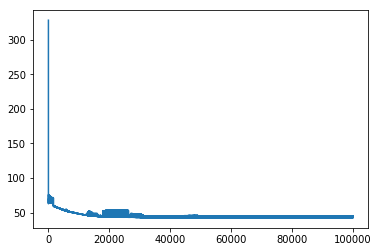

In [167]:
plt.plot(range(len(performaces)),performaces)

In [ ]:
def derivate_k(y, yhat, x):
    abs_values = [1 if (y_i - yhat_i) > 0 else -1 for y_i, yhat_i in zip(y, yhat)]

    return np.mean([a * -x_i for a, x_i in zip(abs_values, x)])


def derivate_b(y, yhat):
    abs_values = [1 if (y_i - yhat_i) > 0 else -1 for y_i, yhat_i in zip(y, yhat)]
    return np.mean([a * -1 for a in abs_values])


learing_rate = 1e-1


while loop_times > 0:

    k_delta = -1 * learing_rate * derivate_k(sub_fare, func(sub_age, k_hat, b_hat), sub_age)
    b_delta = -1 * learing_rate * derivate_b(sub_fare, func(sub_age, k_hat, b_hat))

    # k_delta_direction, b_delta_direction = direction
    #
    # k_delta = k_delta_direction * step()
    # b_delta = b_delta_direction * step()
    #
    # new_k = best_k + k_delta
    # new_b = best_b + b_delta

    k_hat += k_delta
    b_hat += b_delta

    estimated_fares = func(sub_age, k_hat, b_hat)
    error_rate = loss(y=sub_fare, yhat=estimated_fares)

    # if error_rate < min_error_rate:
    #     min_error_rate = error_rate
    #     best_k, best_b = new_k, new_b
        # best_k, best_b = k_hat, b_hat

        # direction = (k_delta_direction, b_delta_direction)

        # print(min_error_rate)
    print('loop == {}'.format(loop_times))
        # losses.append(min_error_rate)
    print('f(age) = {} * age + {}, with error rate: {}'.format(best_k, best_b, error_rate))
    # else:
    #     direction = random.choice(list(set(change_directions) - {(k_delta_direction, b_delta_direction)}))

    losses.append(error_rate)

    loop_times -= 1


# plt.scatter(sub_age, sub_fare)
# plt.plot(sub_age, func(sub_age, best_k, best_b), c='r')
# plt.plot(sub_age, func(sub_age, k_hat, b_hat), c='r')
# plt.show()

plt.plot(range(len(losses)), losses)
plt.show()